# Recreation of Voyager 1's Trajectories Through the Solar System Using Computationally Calculated Planet Orbits



#### This project was performed with two goals in mind:
- Computationally create the orbits of the planets necessary for Voyager 1's journey (Sun, Earth, Jupiter, Saturn, Uranus, Neptune)
- Using the created planet orbits, computationally recreate Voyager 1's trajectory through the solar system


#### Data needed to acomplish the goals:
- Masses of the Sun, Planets, and Voyager 1
- Initial x, y, and z positions and velocities of the Sun, Planets and Voyager 1 relative to the Barycenter of the solar system
- Actual x, y, and z position and velocity data beginning September 6, 1977 until present to verify that I have calculated accurate orbits

(Masses were obtained via Google)

(Position and Velocity data were obtained via NASA's Jet Propulsion Lab HORIZONS Web Interface)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from mpl_toolkits import mplot3d
import ode


In [2]:
%matplotlib notebook

# Read in Sun, Planet, and Voyager Data

#### side note:
- distances are in units of km
- velocities are in units of km/s

### Read in Voyager 1 Data

In [3]:
#df_voyager = pd.read_csv('voyager1_vector_1daystep_edited_(1977Sep6_2018Oct07).txt')
df_voyager = pd.read_csv('voyager1_vector_1daystep_edited2_(1977Sep6_1981Apr17).txt')
print(df_voyager.shape)
#df_voyager.head()

(1320, 9)


#### Assign Voyager Data to Variables

In [4]:
x_voyager_real = np.array(df_voyager['                      X'])
y_voyager_real = np.array(df_voyager['                      Y'])
z_voyager_real = np.array(df_voyager['                      Z'])
vx_voyager_real = np.array(df_voyager['                     VX'])
vy_voyager_real = np.array(df_voyager['                     VY'])
vz_voyager_real = np.array(df_voyager['                     VZ'])


### Read in Sun Data

In [5]:
df_sun = pd.read_csv('sun_vector_1daystep_edited_(1977Sep6_2018Oct07).txt')
print(df_sun.shape)
#df_sun.head()

(15007, 9)


#### Assign Sun Data to Variables

In [6]:
x_sun_real = np.array(df_sun['                      X'])
y_sun_real = np.array(df_sun['                      Y'])
z_sun_real = np.array(df_sun['                      Z'])
vx_sun_real = np.array(df_sun['                     VX'])
vy_sun_real = np.array(df_sun['                     VY'])
vz_sun_real = np.array(df_sun['                     VZ'])

sun_data_real = np.array([x_sun_real,y_sun_real,z_sun_real,vx_sun_real,vy_sun_real,vz_sun_real])
#print(sun_data_real)


#### 3D Plot of Sun Data Over ~41 Years

In [7]:
# t = np.arange(0,len(x_sun_real),1)
# fig = plt.figure()
# ax = plt.axes(projection='3d')
# ax.plot3D(x_sun_real,y_sun_real,z_sun_real)
# #ax.plot3D(t,x_sun_real,y_sun_real,z_sun_real)
# ax.set_xlabel('x')
# ax.set_ylabel('y')
# ax.set_zlabel('z')

### Read in Earth Data

In [8]:
df_earth = pd.read_csv('earth_vector_1daystep_edited_(1977Sep6_2018Oct07).txt')
#df2 = pd.read_csv('earth_vector_1daystep_edited2_(1977Sep6_1981Apr17).txt')
print(df_earth.shape)
#df_earth.head()

(15007, 9)


#### Assign Earth Data to Variables

In [9]:
x_earth_real = np.array(df_earth['                      X'])
y_earth_real = np.array(df_earth['                      Y'])
z_earth_real = np.array(df_earth['                      Z'])
vx_earth_real = np.array(df_earth['                     VX'])
vy_earth_real = np.array(df_earth['                     VY'])
vz_earth_real = np.array(df_earth['                     VZ'])


#### 3D Plot of Earth Data over ~41 Years

In [11]:
# fig = plt.figure()
# ax = plt.axes(projection='3d')
# ax.plot3D(x_earth_real,y_earth_real,z_earth_real)
# ax.set_xlabel('x')
# ax.set_ylabel('y')
# ax.set_zlabel('z')

### Read in Jupiter Data

In [10]:
df_jupiter = pd.read_csv('jupiter_vector_1daystep_edited_(1977Sep6_2018Oct07).txt')
print(df_jupiter.shape)
#df_jupiter.head()

(15007, 9)


#### Assign Jupiter Data to Variables

In [11]:
x_jupiter_real = np.array(df_jupiter['                      X'])
y_jupiter_real = np.array(df_jupiter['                      Y'])
z_jupiter_real = np.array(df_jupiter['                      Z'])
vx_jupiter_real = np.array(df_jupiter['                     VX'])
vy_jupiter_real = np.array(df_jupiter['                     VY'])
vz_jupiter_real = np.array(df_jupiter['                     VZ'])

### Read in Saturn Data

In [12]:
df_saturn = pd.read_csv('saturn_vector_1daystep_edited_(1977Sep6_2018Oct07).txt')
print(df_saturn.shape)
#df_saturn.head()

(15007, 9)


#### Assign Saturn Data to Variables

In [13]:
x_saturn_real = np.array(df_saturn['                      X'])
y_saturn_real = np.array(df_saturn['                      Y'])
z_saturn_real = np.array(df_saturn['                      Z'])
vx_saturn_real = np.array(df_saturn['                     VX'])
vy_saturn_real = np.array(df_saturn['                     VY'])
vz_saturn_real = np.array(df_saturn['                     VZ'])

### Read in Uranus Data

In [14]:
df_uranus = pd.read_csv('uranus_vector_1daystep_edited_(1977Sep6_2018Oct07).txt')
print(df_uranus.shape)
#df_uranus.head()

(15007, 9)


#### Assign Uranus Data to Variables

In [15]:
x_uranus_real = np.array(df_uranus['                      X'])
y_uranus_real = np.array(df_uranus['                      Y'])
z_uranus_real = np.array(df_uranus['                      Z'])
vx_uranus_real = np.array(df_uranus['                     VX'])
vy_uranus_real = np.array(df_uranus['                     VY'])
vz_uranus_real = np.array(df_uranus['                     VZ'])

### Read in Neptune Data

In [16]:
df_neptune = pd.read_csv('neptune_vector_1daystep_edited_(1977Sep6_2018Oct07).txt')
print(df_neptune.shape)
#df_neptune.head()

(15007, 9)


#### Assign Neptune Data to Variables

In [17]:
x_neptune_real = np.array(df_neptune['                      X'])
y_neptune_real = np.array(df_neptune['                      Y'])
z_neptune_real = np.array(df_neptune['                      Z'])
vx_neptune_real = np.array(df_neptune['                     VX'])
vy_neptune_real = np.array(df_neptune['                     VY'])
vz_neptune_real = np.array(df_neptune['                     VZ'])

## Initial Conditions

In [18]:
#Voyager 1
m_voyager = 721.9                   #kg
x0_voyager = 1.451559148454779e8    #km
y0_voyager = -4.285835857828943e7   #km
z0_voyager = 1.595353444434702e4    #km
vx0_voyager = 1.158587716438512e1   #km/s
vy0_voyager = 3.813754724695271e1   #km/s
vz0_voyager = 7.301363070562683e-1  #km/s

#Sun
m_sun = 1.989e30                    #kg
x0_sun = 3.553089007353653e5        #km
y0_sun= -6.578222468037431e5        #km
z0_sun = -9.616346421067865e3       #km
vx0_sun = 1.396839231416364e-2      #km/s
vy0_sun = 6.359990357382163e-5      #km/s
vz0_sun = -3.804134588186906e-4     #km/s

#Earth
m_earth = 5.972e24                  #kg 
x0_earth = 1.450115405548445e8      #km
y0_earth = -4.321522489945858e7     #km
z0_earth = -1.060511781397089e4     #km
vx0_earth = 7.947607035275121e0     #km/s
vy0_earth = 2.846488051085687e1     #km/s
vz0_earth = 1.555867535104838e-3    #km/s

#Jupiter
m_jupiter = 1.898e27                #kg 
x0_jupiter = 1.050637367128080e8    #km 
y0_jupiter = 7.547041739538817e8    #km
z0_jupiter = -5.461560816950202e6   #km
vx0_jupiter = -1.309506864276027e1  #km/s
vy0_jupiter = 2.403911075101174e0   #km/s
vz0_jupiter = 2.833239250437281e-1  #km/s


#Saturn
m_saturn = 5.683e26                 #kg 
x0_saturn = -1.075802627816389e9    #km
y0_saturn = 8.531663131082821e8     #km
z0_saturn = 2.782827353628099e7     #km
vx0_saturn = -6.522249361168632e0   #km/s
vy0_saturn = -7.594117963063859e0   #km/s
vz0_saturn = 3.924620613816194e-1   #km/s

#Uranus
m_uranus = 8.681e25                 #kg
x0_uranus = -2.076495887886030e9    #km
y0_uranus = -1.850092591417567e9    #km
z0_uranus = 2.007281546493959e7     #km
vx0_uranus = 4.479405179215425e0    #km/s
vy0_uranus = -5.402828134887624e0   #km/s
vz0_uranus = -7.805646071741079e-2  #km/s

#Neptune
m_neptune = 1.024e26 
x0_neptune = -1.124153590103706e9   #km
y0_neptune = -4.388438851286917e9   #km
z0_neptune = 1.162609911669848e8    #km
vx0_neptune = 5.231033217212897e0   #km/s
vy0_neptune = -1.318877162526621e0  #km/s
vz0_neptune = -9.402728738100463e-2 #km/s


#G = 6.67e-11                 #(N*(m**2))/(kg**2))
G = 6.67e-20                 #(kg * km**3)(s**2 * kg**2)

## Calculating the Planet Orbits

I used the RK4 integration method to numerically integrate and calculate each orbit.However, to make things more simple I let the Sun be at the center and remain static and then calculated each planetary orbit based solely on the Suns gravity
- I began with integrater function for each of the planets
- I sent each function the planets position and velocity data, calculated the acceleration for each time step, and the function then returned the updated position and velocity of the planet.


### Equation for Calculating the Acceleration

$$F = \frac{G M_\odot M_{p}}{r^2}$$

$$M_{p}a = \frac{G M_\odot M_{p}}{r^2}$$

$$a = \frac{G M_\odot}{r^2}$$

I then needed to split the accelerations up into their x, y, and z components

$$a_x = \frac{G M_{\odot}}{r^2} \hat{x}$$

$$a_x = \frac{G M_{\odot}(x_{\odot} - x_{p})}{[(x_{\odot}-x_{p})^2+(y_{\odot}-y_{p})^2+(z_{\odot} - z_{p})^2]^\frac{3}{2}}$$
***
***

$$a_x = \frac{G M_{\odot}}{r^2} \hat{y}$$

$$a_y = \frac{G M_{\odot}(y_{\odot} - y_{p})}{[(x_{\odot}-x_{p})^2+(y_{\odot}-y_{p})^2+(z_{\odot} - z_{p})^2]^\frac{3}{2}}$$
***
***

$$a_x = \frac{G M_{\odot}}{r^2} \hat{z}$$

$$a_z = \frac{G M_{\odot}(z_{\odot} - z_{p})}{[(x_{\odot}-x_{p})^2+(y_{\odot}-y_{p})^2+(z_{\odot} - z_{p})^2]^\frac{3}{2}}$$

### RK4 Integrater Functions

In [19]:
def model_new(data_array,t):
    x_position = data_array[0]
    y_position = data_array[1]
    z_position = data_array[2]
    vx_position = data_array[3]
    vy_position = data_array[4]
    vz_position = data_array[5]
    
    y0dot = np.zeros(6)
    
    
    y0dot[0] = vx_position
    y0dot[1] = vy_position
    y0dot[2] = vz_position
    y0dot[3] = (G*m_sun*(x_sun-x_position))/(((x_sun-x_position)**2+(y_sun-y_position)**2+(z_sun-z_position)**2)**(3/2))
    y0dot[4] = (G*m_sun*(y_sun-y_position))/(((x_sun-x_position)**2+(y_sun-y_position)**2+(z_sun-z_position)**2)**(3/2))
    y0dot[5] = (G*m_sun*(z_sun-z_position))/(((x_sun-x_position)**2+(y_sun-y_position)**2+(z_sun-z_position)**2)**(3/2))
    
    return y0dot

### Block for Time Evolution and Creation of Lists for Planetary Orbit Data

In [20]:
t = 0.0
day = 86400
h = day
#time = 15006*day
total_days = 15007

data_array = [x0_jupiter,y0_jupiter,z0_jupiter,vx0_jupiter,vy0_jupiter,vz0_jupiter]
data_array2 = [x0_earth,y0_earth,z0_earth,vx0_earth,vy0_earth,vz0_earth]
data_array3 = [x0_saturn,y0_saturn,z0_saturn,vx0_saturn,vy0_saturn,vz0_saturn]
data_array4 = [x0_uranus,y0_uranus,z0_uranus,vx0_uranus,vy0_uranus,vz0_uranus]
data_array5 = [x0_neptune,y0_neptune,z0_neptune,vx0_neptune,vy0_neptune,vz0_neptune]

##########################################################################################

x_sun = x0_sun
y_sun = y0_sun
z_sun = z0_sun
vx_sun = vx0_sun
vy_sun = vy0_sun
vz_sun = vz0_sun

########################################

t_data = []
t_data.append(t)

########################################

jupiter_data = np.array([[x0_jupiter],[y0_jupiter],[z0_jupiter],[vx0_jupiter],[vy0_jupiter],[vz0_jupiter]])
earth_data = np.array([[x0_earth],[y0_earth],[z0_earth],[vx0_earth],[vy0_earth],[vz0_earth]])
saturn_data = np.array([[x0_saturn],[y0_saturn],[z0_saturn],[vx0_saturn],[vy0_saturn],[vz0_saturn]])
uranus_data = np.array([[x0_uranus],[y0_uranus],[z0_uranus],[vx0_uranus],[vy0_uranus],[vz0_uranus]])
neptune_data = np.array([[x0_neptune],[y0_neptune],[z0_neptune],[vx0_neptune],[vy0_neptune],[vz0_neptune]])

######################################

#while t < 41*365*day:
while t < 15006*day:
    #integrate
    data_array_new = ode.RK4n(model_new, data_array, t, h) #update y[n]
    data_array_new2 = ode.RK4n(model_new, data_array2, t, h) #update y[n]
    data_array_new3 = ode.RK4n(model_new, data_array3, t, h) #update y[n]
    data_array_new4 = ode.RK4n(model_new, data_array4, t, h) #update y[n]
    data_array_new5 = ode.RK4n(model_new, data_array5, t, h) #update y[n]
    
    for i in range(len(data_array_new)): #reset y0 to the new vector
        data_array[i] = data_array_new[i]
    
    for i in range(len(data_array_new2)): #reset y0 to the new vector
        data_array2[i] = data_array_new2[i]

    for i in range(len(data_array_new3)): #reset y0 to the new vector
        data_array3[i] = data_array_new3[i]

    for i in range(len(data_array_new3)): #reset y0 to the new vector
        data_array3[i] = data_array_new3[i]

    for i in range(len(data_array_new4)): #reset y0 to the new vector
        data_array4[i] = data_array_new4[i]

    for i in range(len(data_array_new5)): #reset y0 to the new vector
        data_array5[i] = data_array_new5[i]

    
    t = t + h #update clock

    t_data.append(t)
    
    data_array_new = np.array([[data_array_new[0]],[data_array_new[1]],[data_array_new[2]],[data_array_new[3]],[data_array_new[4]],[data_array_new[5]]])
    jupiter_data = np.concatenate([jupiter_data,data_array_new], axis = 1)
    
    data_array_new2 = np.array([[data_array_new2[0]],[data_array_new2[1]],[data_array_new2[2]],[data_array_new2[3]],[data_array_new2[4]],[data_array_new2[5]]])
    earth_data = np.concatenate([earth_data,data_array_new2], axis = 1)
    
    data_array_new3 = np.array([[data_array_new3[0]],[data_array_new3[1]],[data_array_new3[2]],[data_array_new3[3]],[data_array_new3[4]],[data_array_new3[5]]])
    saturn_data = np.concatenate([saturn_data,data_array_new3], axis = 1)
    
    data_array_new4 = np.array([[data_array_new4[0]],[data_array_new4[1]],[data_array_new4[2]],[data_array_new4[3]],[data_array_new4[4]],[data_array_new4[5]]])
    uranus_data = np.concatenate([uranus_data,data_array_new4], axis = 1)
    
    data_array_new5 = np.array([[data_array_new5[0]],[data_array_new5[1]],[data_array_new5[2]],[data_array_new5[3]],[data_array_new5[4]],[data_array_new5[5]]])
    neptune_data = np.concatenate([neptune_data,data_array_new5], axis = 1)


In [21]:
len(earth_data[0])

15007

### Did it work?

#### 3D Plot of the Real and Computed Planet Data 
(Only the Sun, Earth, Jupiter, and Saturn are shown)

<IPython.core.display.Javascript object>


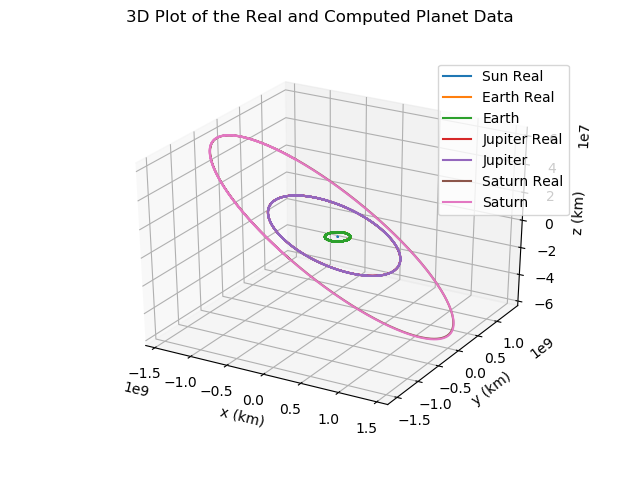

In [22]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot3D(x_sun_real,y_sun_real,z_sun_real, label = 'Sun Real')

ax.plot3D(x_earth_real,y_earth_real,z_earth_real, label = 'Earth Real')
ax.plot3D(earth_data[0,:],earth_data[1,:],earth_data[2,:], label = 'Earth')

ax.plot3D(x_jupiter_real,y_jupiter_real,z_jupiter_real, label = 'Jupiter Real')
ax.plot3D(jupiter_data[0,:],jupiter_data[1,:],jupiter_data[2,:], label = 'Jupiter')

ax.plot3D(x_saturn_real,y_saturn_real,z_saturn_real, label = 'Saturn Real')
ax.plot3D(saturn_data[0,:],saturn_data[1,:],saturn_data[2,:], label = 'Saturn')

#ax.plot3D(x_uranus_real,y_uranus_real,z_uranus_real)
#ax.plot3D(x_neptune_real,y_neptune_real,z_neptune_real)
fig.suptitle('3D Plot of the Real and Computed Planet Data')
ax.set_xlabel('x (km)')
ax.set_ylabel('y (km)')
ax.set_zlabel('z (km)')
ax.legend()


## Calculating Voyager 1's Trajectory with Computed Planet Data

I used the Euler method for calculating Voyager 1's Trajectory

- I calculated the force of each planet and the Sun acting on Voyager 1 at each time step
- With the calculated forces, I then calculate the momentum of Voyager 1
- Finally, with the calculated momentum I then calculated the position of Voyager 1

### Equations for Calculating Voyager 1's Trajectory

$$F_x = \frac{(G M_{p} M_{v} (x_{p}[i]-x_{v}[i]))}{[(x_{p}[i]-x_{v}[i])^2+(y_{p}[i]-y_{v}[i])^2+(z_{p}[i]-z_{v}[i])^2]^{\frac{3}{2}}}$$
***
$$P_{xv}[i+1] = P_{xv}[i] + F_{x(p1)}[i]dt + F_{x(pn)}[i]dt + ... $$
***
$$x_{v}[i+1] = x_{v}[i] + \frac{P_{xv}[i+1]}{M_{v}}dt$$
***
***
***
$$F_y = \frac{(G M_{p} M_{v} (y_{p}[i]-y_{v}[i]))}{[(x_{p}[i]-x_{v}[i])^2+(y_{p}[i]-y_{v}[i])^2+(z_{p}[i]-z_{v}[i])^2]^{\frac{3}{2}}}$$
***
$$P_{yv}[i+1] = P_{yv}[i] + F_{y(p1)}[i]dt + F_{y(pn)}[i]dt + ... $$
***
$$y_{v}[i+1] = y_{v}[i] + \frac{P_{yv}[i+1]}{M_{v}}dt$$
***
***
***
$$F_x = \frac{(G M_{p} M_{v} (z_{p}[i]-z_{v}[i]))}{[(x_{p}[i]-x_{v}[i])^2+(y_{p}[i]-y_{v}[i])^2+(z_{p}[i]-z_{v}[i])^2]^{\frac{3}{2}}}$$
***
$$P_{zv}[i+1] = P_{zv}[i] + F_{z(p1)}[i]dt + F_{z(pn)}[i]dt + ... $$
***
$$z_{v}[i+1] = z_{v}[i] + \frac{P_{zv}[i+1]}{M_{v}}dt$$




### Voyager 1 Trajectory with Given Initial Momentum and Gravity Acting on it

#### Set Initial Arrays for Euler Integration Method

In [24]:
tmax = 15007                   #max integration time in days (includes end date (10/7/2018))
#tmax = 1320                   #max integration time in days (includes end data (04/17/1981))
day = 86400.0                  #seconds in a day
#tmax = 14965 #days

dt = day                       #time step (seconds)

t = np.linspace(0,tmax,tmax)
Px0_voyager = m_voyager*vx0_voyager
Py0_voyager = m_voyager*vy0_voyager
Pz0_voyager = m_voyager*vz0_voyager

voyager_data = np.array([[x0_voyager],[y0_voyager],[z0_voyager],[Px0_voyager],[Py0_voyager],[Pz0_voyager]])

#F_planets = ([[Fx_sun],[Fy_sun],[Fz_sun],[Fx_earth,[Fy_earth],[Fz_earth],[Fx_jupiter],[Fy_jupiter],[Fz_jupiter],[Fx_saturn],[Fy_saturn],[Fz_saturn]])
F_planets = np.array([[],[],[],[],[],[],[],[],[],[],[],[]])



In [25]:
def model_force(i,m1,position,voyager_data):
    
    Fx = ((G*m1*m_voyager)*(position[0,i]-voyager_data[0,i]))/(((position[0,i]-voyager_data[0,i])**2+(position[1,i]-voyager_data[1,i])**2+(position[2,i]-voyager_data[2,i])**2)**(3/2))
    Fy = ((G*m1*m_voyager)*(position[1,i]-voyager_data[1,i]))/(((position[0,i]-voyager_data[0,i])**2+(position[1,i]-voyager_data[1,i])**2+(position[2,i]-voyager_data[2,i])**2)**(3/2))
    Fz = ((G*m1*m_voyager)*(position[2,i]-voyager_data[2,i]))/(((position[0,i]-voyager_data[0,i])**2+(position[1,i]-voyager_data[1,i])**2+(position[2,i]-voyager_data[2,i])**2)**(3/2))
    
    #print(i)
    #print(voyager_data[1])
    #print(Fy)
    return np.array([Fx,Fy,Fz])
    
    

In [26]:
def model_momentum_position(i,voyager_data,F_next):
    
    Px_voyager = voyager_data[3,i] + F_next[0,0]*dt + F_next[3,0]*dt + F_next[6,0]*dt + F_next[9,0]*dt
    
    Py_voyager = voyager_data[4,i] + F_next[1,0]*dt + F_next[4,0]*dt + F_next[7,0]*dt + F_next[10,0]*dt
    Pz_voyager = voyager_data[5,i] + F_next[2,0]*dt + F_next[5,0]*dt + F_next[8,0]*dt + F_next[11,0]*dt
    
    x_voyager = voyager_data[0,i] + (Px_voyager/m_voyager)*dt
    y_voyager = voyager_data[1,i] + (Py_voyager/m_voyager)*dt
    z_voyager = voyager_data[2,i] + (Pz_voyager/m_voyager)*dt
    
    return np.array([x_voyager,y_voyager,z_voyager,Px_voyager,Py_voyager,Pz_voyager])

    

In [27]:
for i in range(0,tmax-1):
    
    F_sun = model_force(i,m_sun,sun_data_real,voyager_data)
    F_earth = model_force(i, m_earth,earth_data,voyager_data)
    F_jupiter = model_force(i, m_jupiter,jupiter_data,voyager_data)
    F_saturn = model_force(i, m_saturn,saturn_data,voyager_data)
        
    
    F_next = np.array([[F_sun[0]],[F_sun[1]],[F_sun[2]],[F_earth[0]],[F_earth[1]],[F_earth[2]],[F_jupiter[0]],[F_jupiter[1]],[F_jupiter[2]],[F_saturn[0]],[F_saturn[1]],[F_saturn[2]]])
    
    voyager_data_next = model_momentum_position(i,voyager_data,F_next)
    voyager_data_next2 = np.array([[voyager_data_next[0]],[voyager_data_next[1]],[voyager_data_next[2]],[voyager_data_next[3]],[voyager_data_next[4]],[voyager_data_next[5]]])
    
    F_planets = np.concatenate([F_planets,F_next],axis = 1)
    
    voyager_data = np.concatenate([voyager_data,voyager_data_next2],axis = 1)
    

### Did it Work??

In [28]:
def model_plot(voyager_data,earth_data,jupiter_data,saturn_data):
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.plot3D(voyager_data[0],voyager_data[1],voyager_data[2], label = 'Voyager 1')
    ax.plot3D(x_voyager_real,y_voyager_real,z_voyager_real, label = 'Voyager 1 Real')
    ax.plot3D(sun_data_real[0],sun_data_real[1],sun_data_real[2], label = 'Sun')              #sun data
    ax.plot3D(earth_data[0],earth_data[1],earth_data[2], label = 'Earth')        #earth data
    ax.plot3D(jupiter_data[0],jupiter_data[1],jupiter_data[2], label = 'Jupiter')  #jupiter data
    ax.plot3D(saturn_data[0],saturn_data[1],saturn_data[2], label = 'Saturn')     #saturn data
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.legend()

    #fig.savefig('voyager1_trajectory_real_jpl_data.png')

<IPython.core.display.Javascript object>


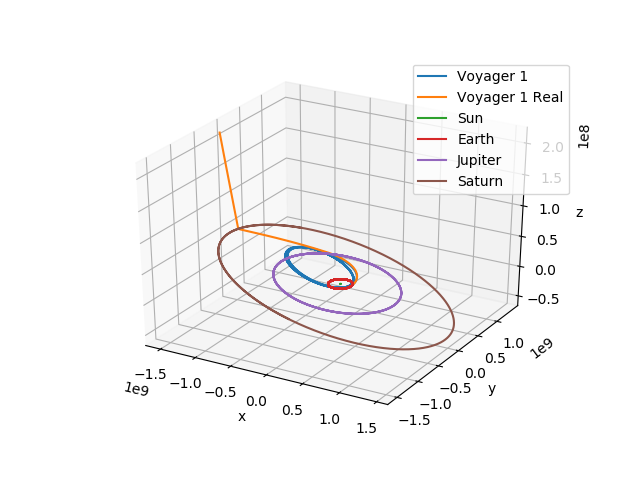

In [29]:
model_plot(voyager_data,earth_data,jupiter_data,saturn_data)

In [30]:
print('Px_voyager =',voyager_data[3,546])
print('Py_voyager =',voyager_data[4,546])
print('Pz_voyager =',voyager_data[5,546])

Px_voyager = -8705.076427935543
Py_voyager = 2022.0932300169436
Pz_voyager = -15.802562062554314


### Voyager 1 Trajectory with an Additional Momentum Boost Around Jupiter

#### Find Closest Point Between Jupiter and Voyager 1

In [31]:
i = 0
x_jupiter_edited = []
y_jupiter_edited = []
z_jupiter_edited = []
while i < 1320:
    x_jupiter_edited.append(jupiter_data[0,i])
    y_jupiter_edited.append(jupiter_data[1,i])
    z_jupiter_edited.append(jupiter_data[2,i])

    i = i+1


In [32]:
i = 0
x_jupiter_voyager_distance = []
while i < 1320:
    q = abs(abs(x_jupiter_edited[i])-abs(voyager_data[0,i]))
    x_jupiter_voyager_distance.append(q)
    i = i+1

i = 0
y_jupiter_voyager_distance = []
while i < 1320:
    q = abs(abs(y_jupiter_edited[i])-abs(voyager_data[1,i]))
    y_jupiter_voyager_distance.append(q)
    i = i+1
    
i = 0
z_jupiter_voyager_distance = []
while i < 1320:
    q = abs(abs(z_jupiter_edited[i])-abs(voyager_data[2,i]))
    z_jupiter_voyager_distance.append(q)
    i = i+1

In [33]:
x_jupiter_voyager_distance_min = np.min(x_jupiter_voyager_distance)
print(x_jupiter_voyager_distance_min)
y_jupiter_voyager_distance_min = np.min(y_jupiter_voyager_distance)
print(y_jupiter_voyager_distance_min)
z_jupiter_voyager_distance_min = np.min(z_jupiter_voyager_distance)
print(z_jupiter_voyager_distance_min)


16727.365360319614
353934.99042356014
5170.41065529082


In [34]:
#print(x_jupiter_voyager_distance)

In [35]:
print(x_jupiter_voyager_distance[477])

16727.365360319614


#### Added Momentum to Voyager 1 is Injected 69 Days Past Closest Approach to Jupiter

I needed to figure out how much momentum to add to the Voyager 1 and in which directions the momentum needs to be added. I did this with a trial and error method by tweaking the x,y, and z momentum at this time until it entered Saturn's gravitational field in the way that I needed it to.

### 10+ Hours Later

#### The Amount of Added Momentum to Voyager 1 on day 546

Amount of momentum added in the x direction = $- 13969.874875511403$

Amount of momentum added in the y direction = $- 11211.149314178543$

Amount of momentum added in the z direction = $ 1095.3963624008238$

#### Reset Initial Arrays for Euler Integration Method

In [36]:
#tmax = 15007                   #max integration time in days (includes end date (10/7/2018))
#tmax = 1320                   #max integration time in days (includes end data (04/17/1981))
day = 86400.0                  #seconds in a day
tmax = 1320                    #days

dt = day                       #time step (seconds)

t = np.linspace(0,tmax,tmax)
Px0_voyager = m_voyager*vx0_voyager
Py0_voyager = m_voyager*vy0_voyager
Pz0_voyager = m_voyager*vz0_voyager

voyager_data = np.array([[x0_voyager],[y0_voyager],[z0_voyager],[Px0_voyager],[Py0_voyager],[Pz0_voyager]])

#F_planets = ([[Fx_sun],[Fy_sun],[Fz_sun],[Fx_earth,[Fy_earth],[Fz_earth],[Fx_jupiter],[Fy_jupiter],[Fz_jupiter],[Fx_saturn],[Fy_saturn],[Fz_saturn]])
F_planets = np.array([[],[],[],[],[],[],[],[],[],[],[],[]])



In [37]:
for i in range(0,tmax-1):
    
    if i == 546:
        voyager_data[3,i] = voyager_data[3,i] - 13969.874875511403
        voyager_data[4,i] = voyager_data[4,i] - 11211.149314178543
        voyager_data[5,i] = voyager_data[5,i] + 1095.3963624008238
    
    F_sun = model_force(i,m_sun,sun_data_real,voyager_data)
    F_earth = model_force(i, m_earth,earth_data,voyager_data)
    F_jupiter = model_force(i, m_jupiter,jupiter_data,voyager_data)
    F_saturn = model_force(i, m_saturn,saturn_data,voyager_data)
        
    
    F_next = np.array([[F_sun[0]],[F_sun[1]],[F_sun[2]],[F_earth[0]],[F_earth[1]],[F_earth[2]],[F_jupiter[0]],[F_jupiter[1]],[F_jupiter[2]],[F_saturn[0]],[F_saturn[1]],[F_saturn[2]]])
    
    voyager_data_next = model_momentum_position(i,voyager_data,F_next)
    voyager_data_next2 = np.array([[voyager_data_next[0]],[voyager_data_next[1]],[voyager_data_next[2]],[voyager_data_next[3]],[voyager_data_next[4]],[voyager_data_next[5]]])
    
    
    F_planets = np.concatenate([F_planets,F_next],axis = 1)

    voyager_data = np.concatenate([voyager_data,voyager_data_next2],axis = 1)
    

### Did it work this time?

<IPython.core.display.Javascript object>


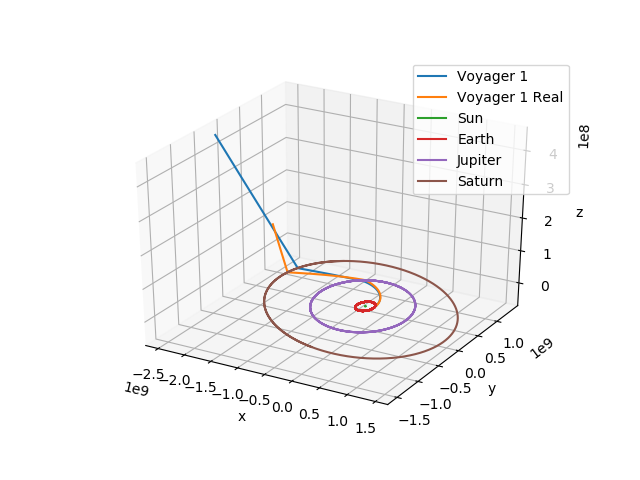

In [38]:
model_plot(voyager_data,earth_data,jupiter_data,saturn_data)

## Animate Graph to Watch Part of Voyager's Jouney

In [39]:
#import os
from mplEasyAnimate import animation
from tqdm import tqdm

In [40]:
from IPython.display import HTML

def playVideo(path):
    return HTML("""
                <video width="320" height="240" controls>
                  <source src="{}" type="video/mp4">
                </video>
                """.format(path))

In [41]:
def animate_trajectory(t_start=1, t_end=1320, frames=200):
    t_offsets = np.linspace(t_start, t_end, frames)
    anim = animation('voyager1trajectory.mp4')
    
    for offset in tqdm(t_offsets):
        print(offset)
        offset = int(offset)
        t = np.arange(offset+1)
        fig, ax = plt.subplots(1, 1, figsize=(10, 7))
        ax = plt.axes(projection='3d')
                

        ax.plot3D(voyager_data[0,:offset],voyager_data[1,:offset],voyager_data[2,:offset])
        ax.plot3D(sun_data_real[0,:offset],sun_data_real[1,:offset],sun_data_real[2,:offset])
        ax.plot3D(earth_data[0,:offset],earth_data[1,:offset],earth_data[2,:offset])
        ax.plot3D(jupiter_data[0,:offset],jupiter_data[1,:offset],jupiter_data[2,:offset])
        ax.plot3D(saturn_data[0,:offset],saturn_data[1,:offset],saturn_data[2,:offset])
        
        
        anim.add_frame(fig)
        plt.close(fig)
    anim.close()

  0%|                                                  | 0/200 [00:00<?, ?it/s]

1.0


<IPython.core.display.Javascript object>


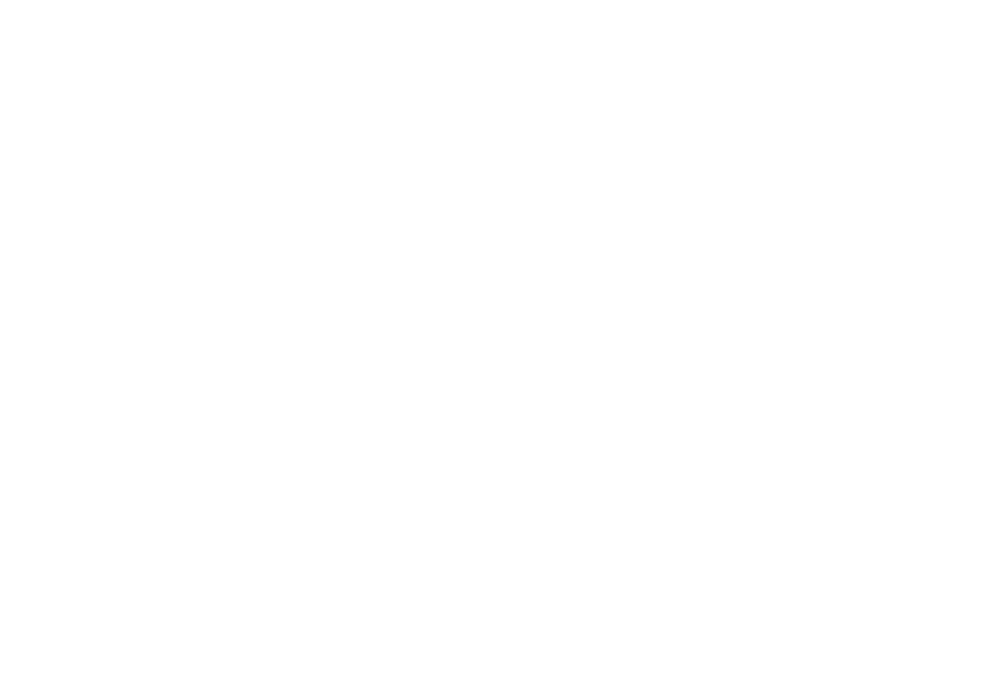

  0%|▏                                         | 1/200 [00:05<18:01,  5.43s/it]

7.628140703517588


<IPython.core.display.Javascript object>


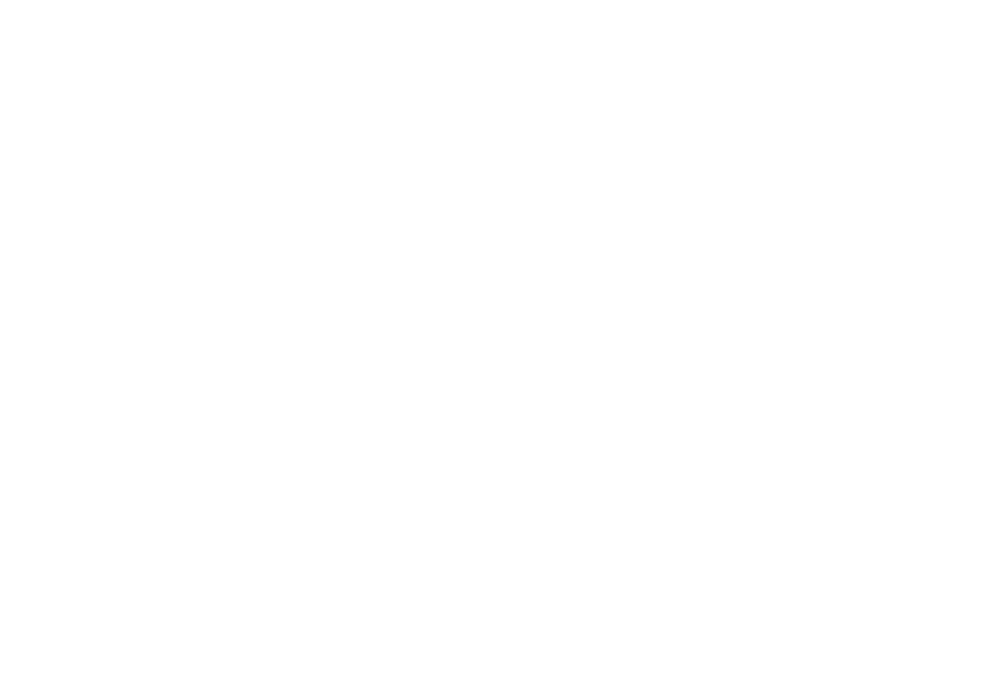

  1%|▍                                         | 2/200 [00:05<09:42,  2.94s/it]

14.256281407035177


<IPython.core.display.Javascript object>


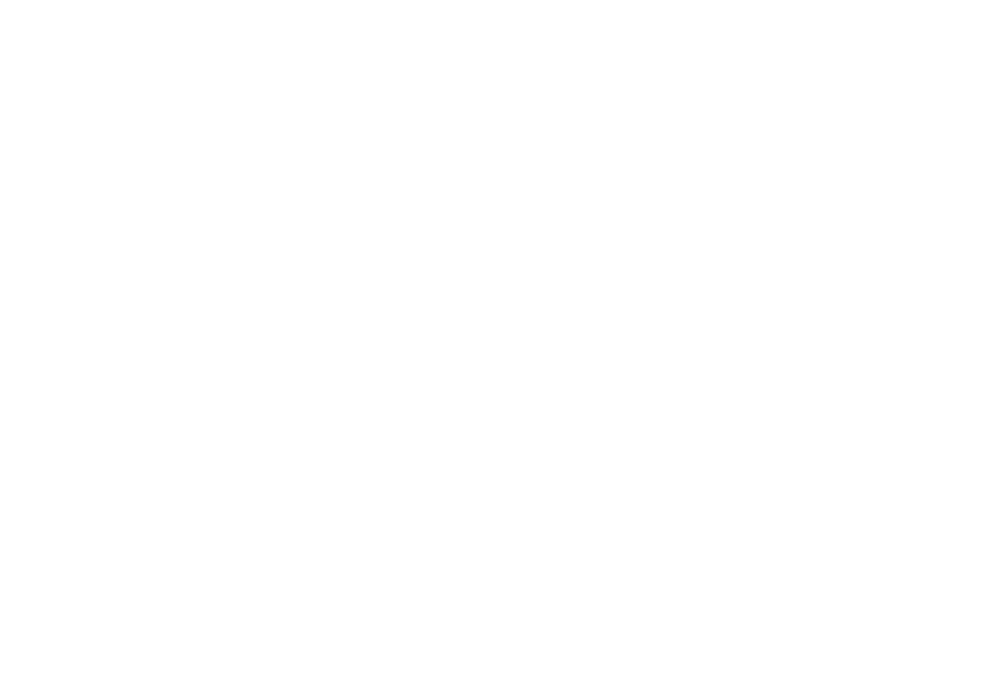

  2%|▋                                         | 3/200 [00:06<06:48,  2.07s/it]

20.884422110552766


<IPython.core.display.Javascript object>


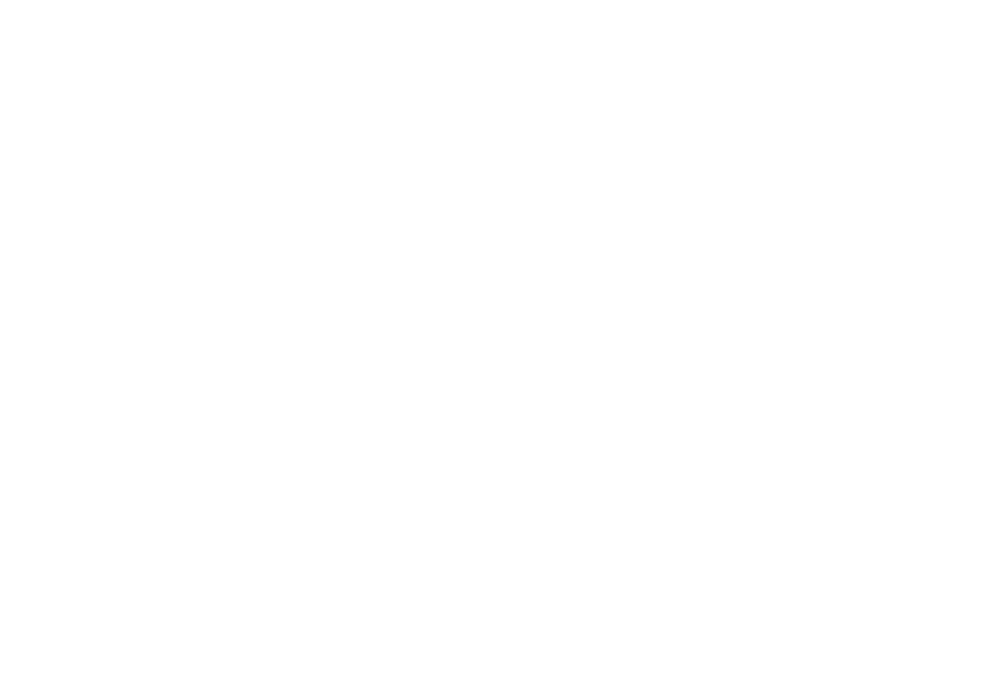

  2%|▊                                         | 4/200 [00:06<05:21,  1.64s/it]

27.512562814070353


<IPython.core.display.Javascript object>


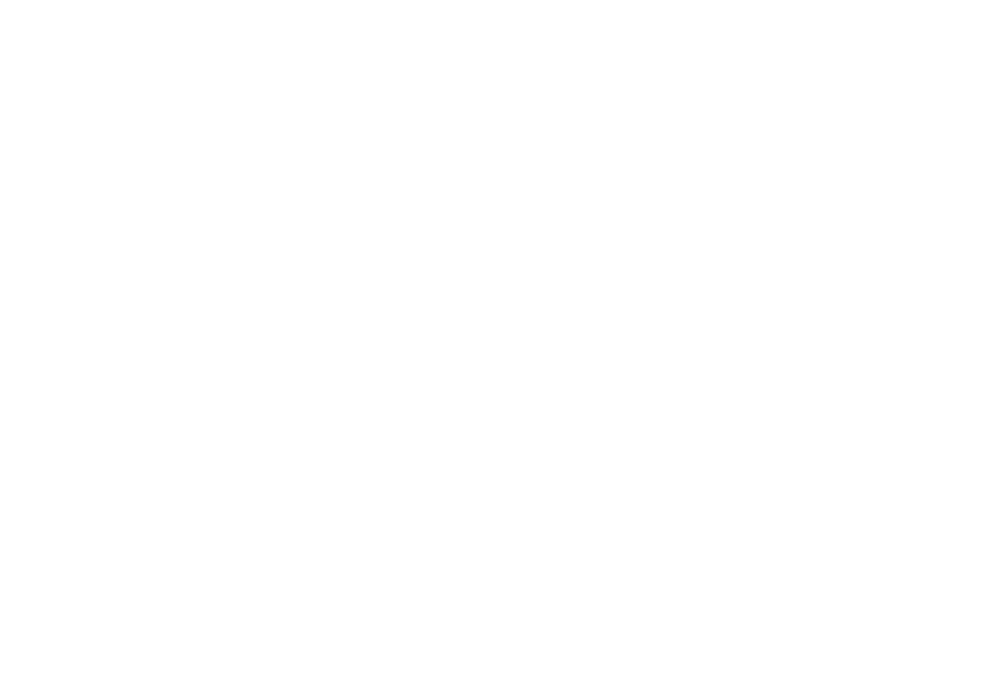

  2%|█                                         | 5/200 [00:06<04:29,  1.38s/it]

34.140703517587944


<IPython.core.display.Javascript object>


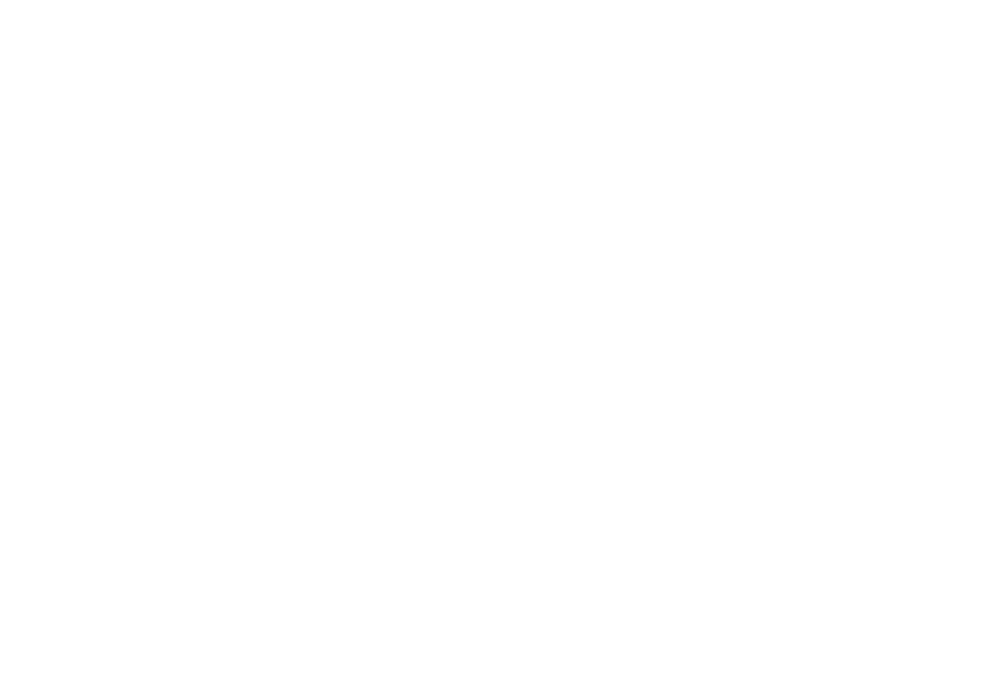

  3%|█▎                                        | 6/200 [00:07<03:54,  1.21s/it]

40.76884422110553


<IPython.core.display.Javascript object>


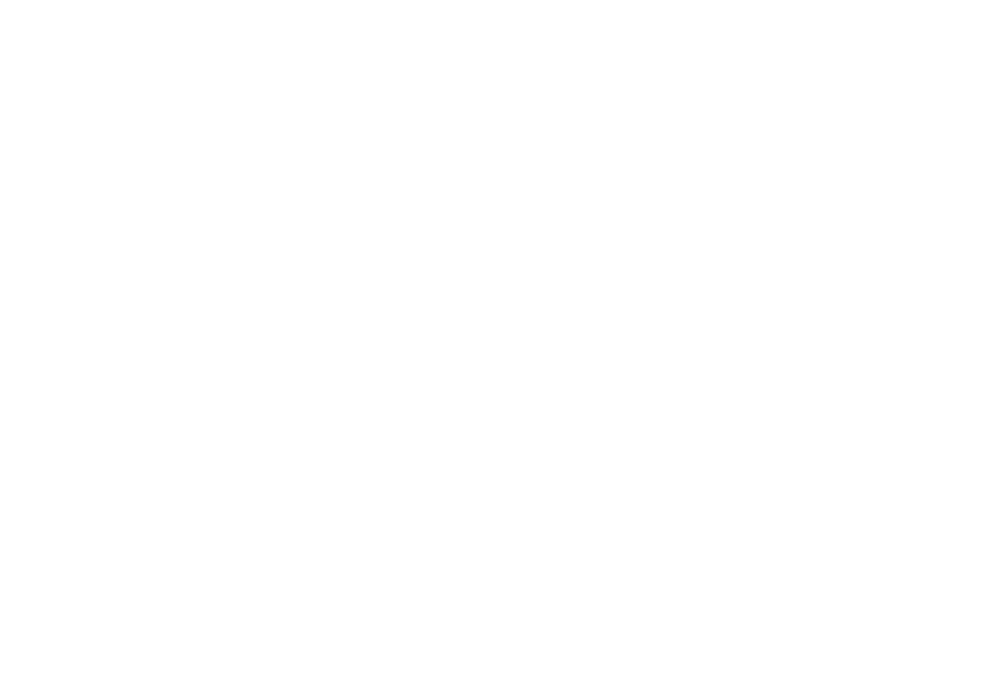

  4%|█▍                                        | 7/200 [00:07<03:28,  1.08s/it]

47.39698492462312


<IPython.core.display.Javascript object>


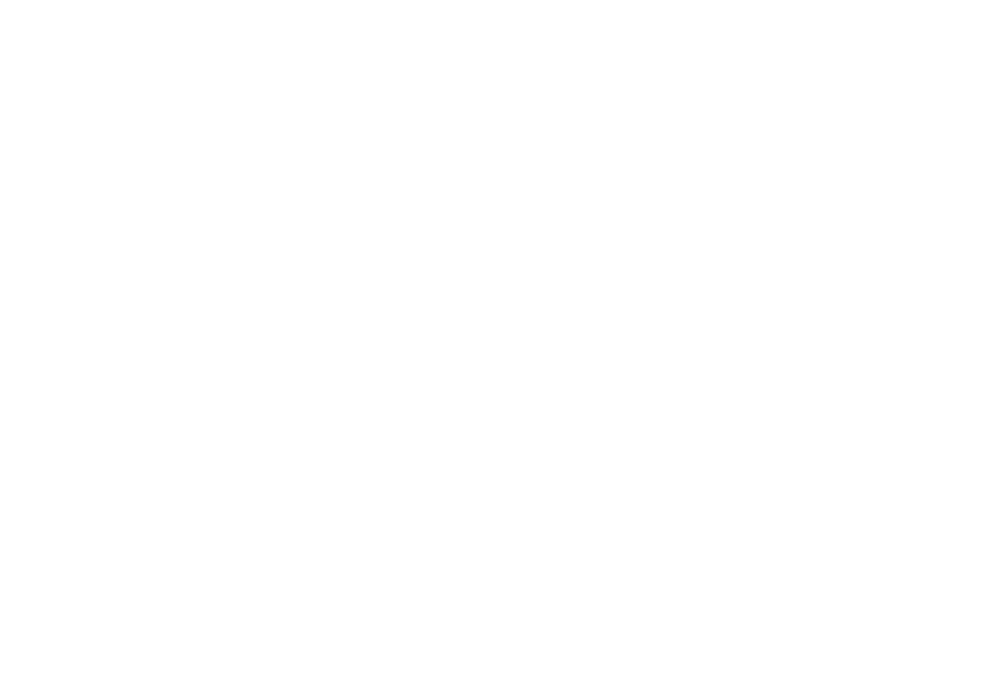

  4%|█▋                                        | 8/200 [00:07<03:09,  1.01it/s]

54.02512562814071


<IPython.core.display.Javascript object>


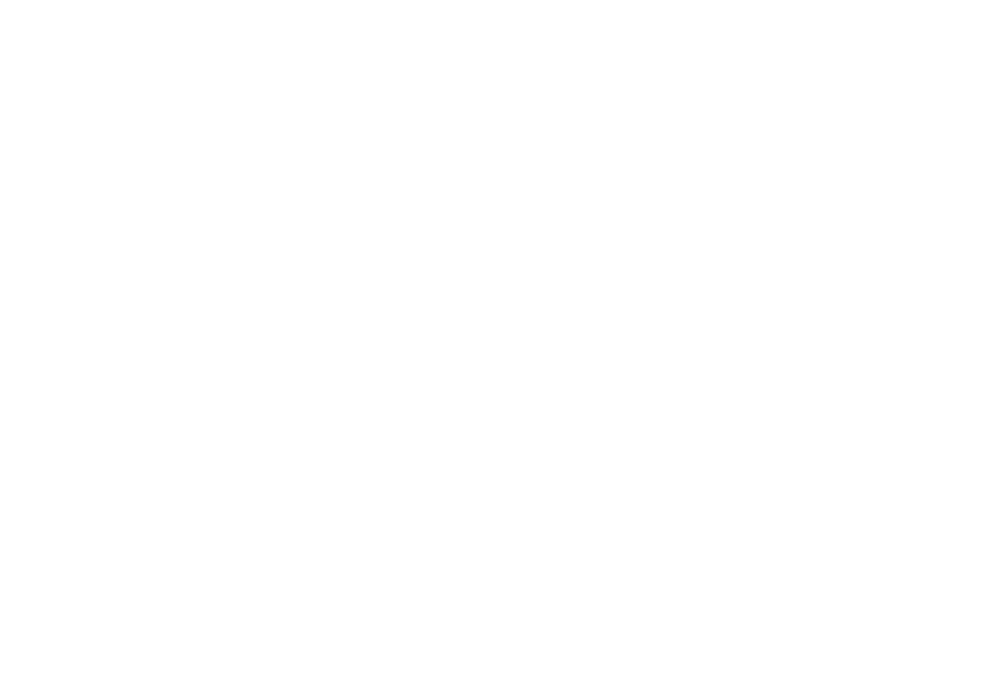

  4%|█▉                                        | 9/200 [00:08<02:56,  1.08it/s]

60.653266331658294


<IPython.core.display.Javascript object>


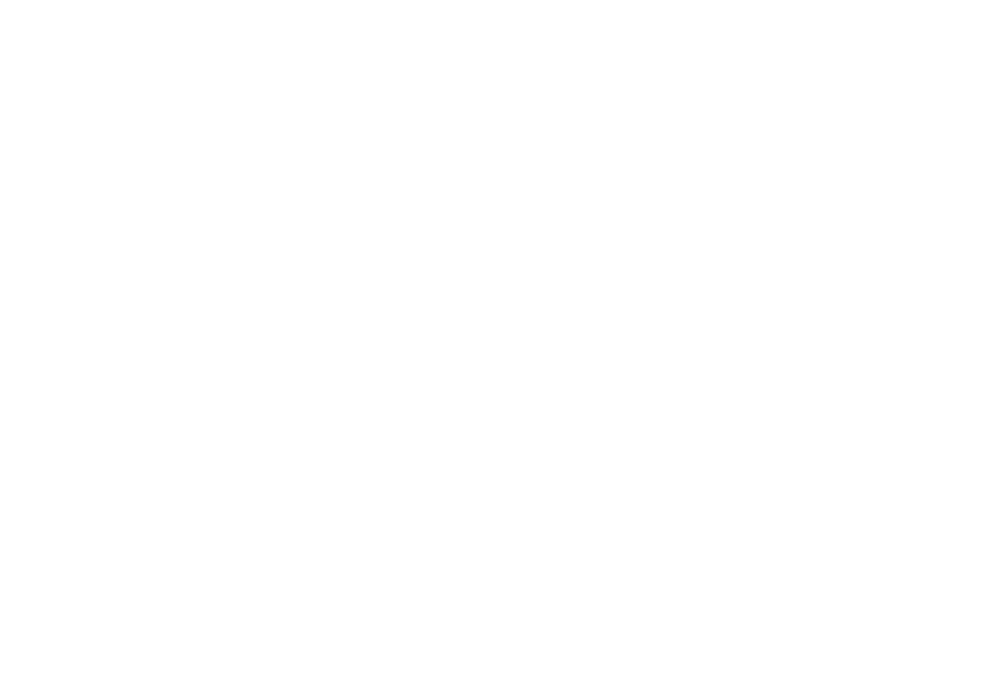

  5%|██                                       | 10/200 [00:08<02:45,  1.15it/s]

67.28140703517589


<IPython.core.display.Javascript object>


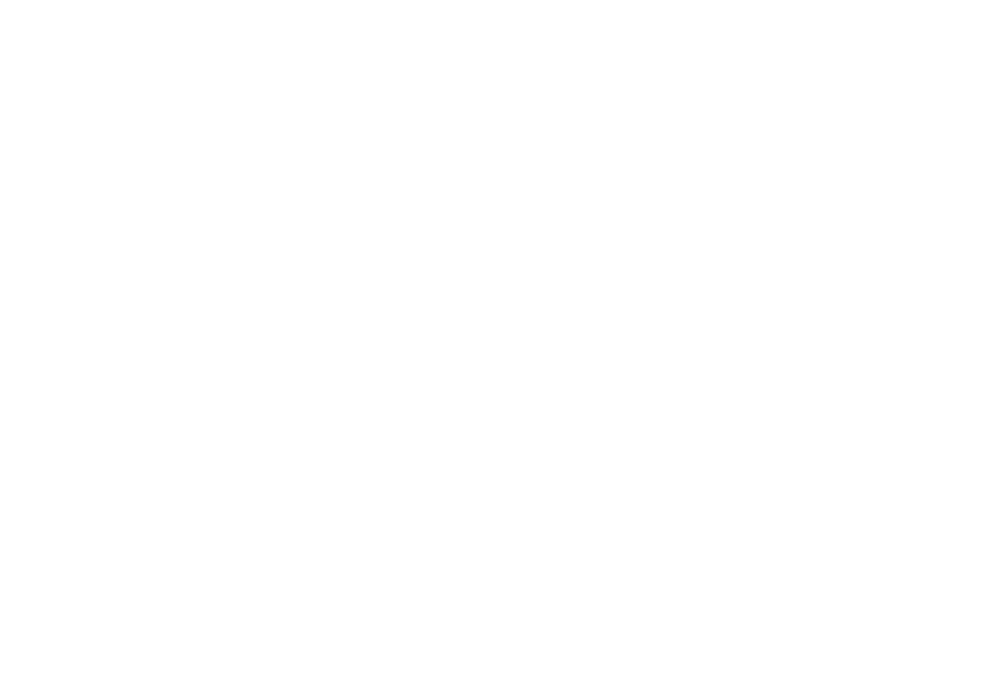

  6%|██▎                                      | 11/200 [00:09<02:35,  1.21it/s]

73.90954773869348


<IPython.core.display.Javascript object>


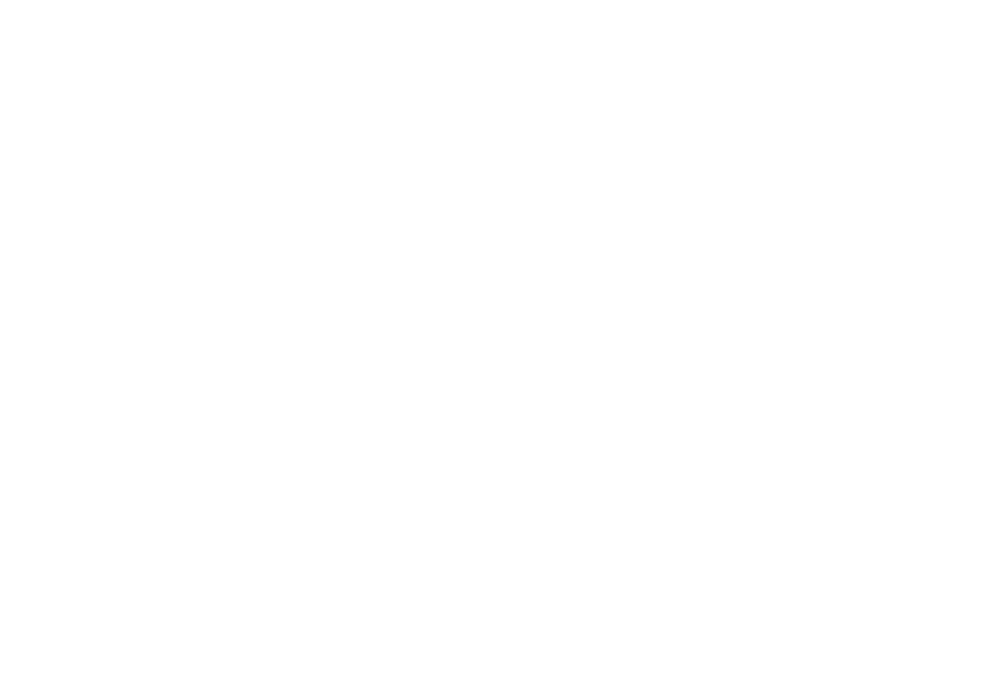

  6%|██▍                                      | 12/200 [00:09<02:27,  1.28it/s]

80.53768844221106


<IPython.core.display.Javascript object>


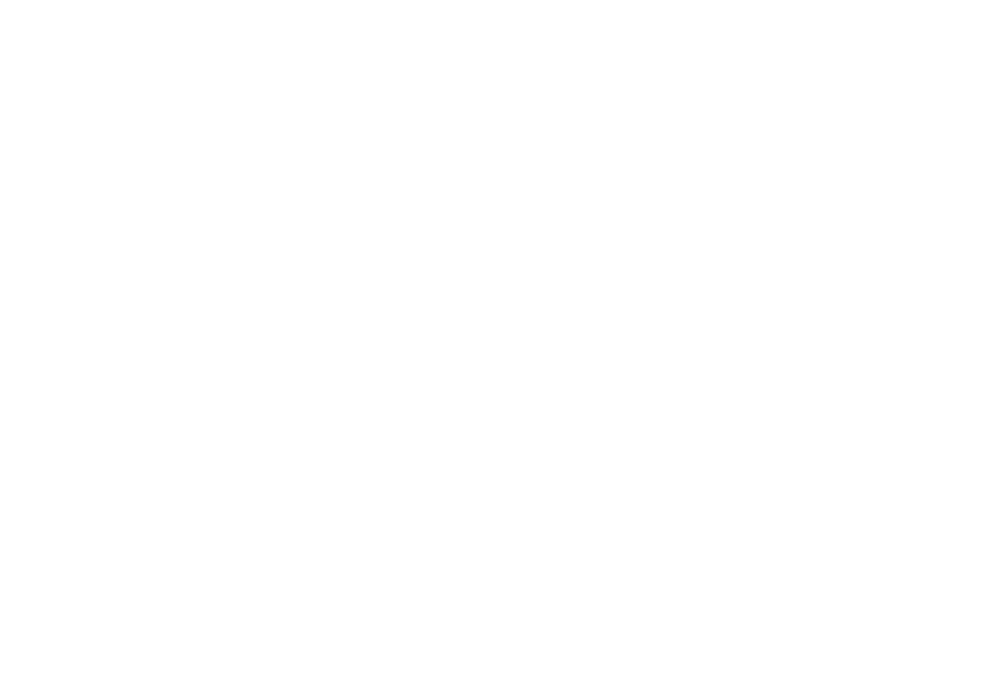

  6%|██▋                                      | 13/200 [00:09<02:19,  1.34it/s]

87.16582914572865


<IPython.core.display.Javascript object>


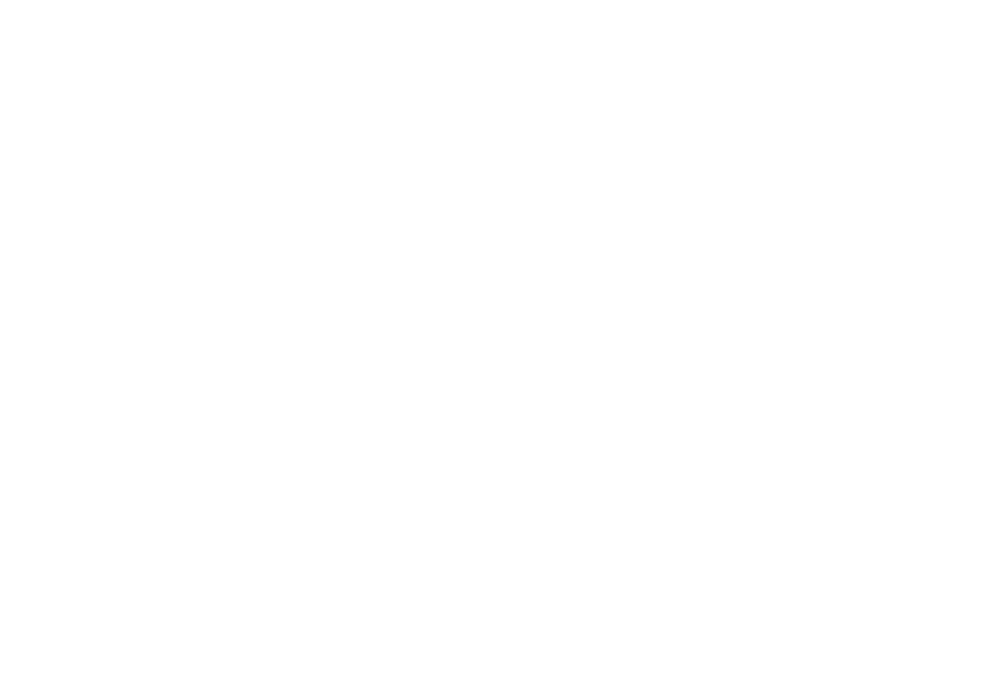

  7%|██▊                                      | 14/200 [00:10<02:13,  1.39it/s]

93.79396984924624


<IPython.core.display.Javascript object>


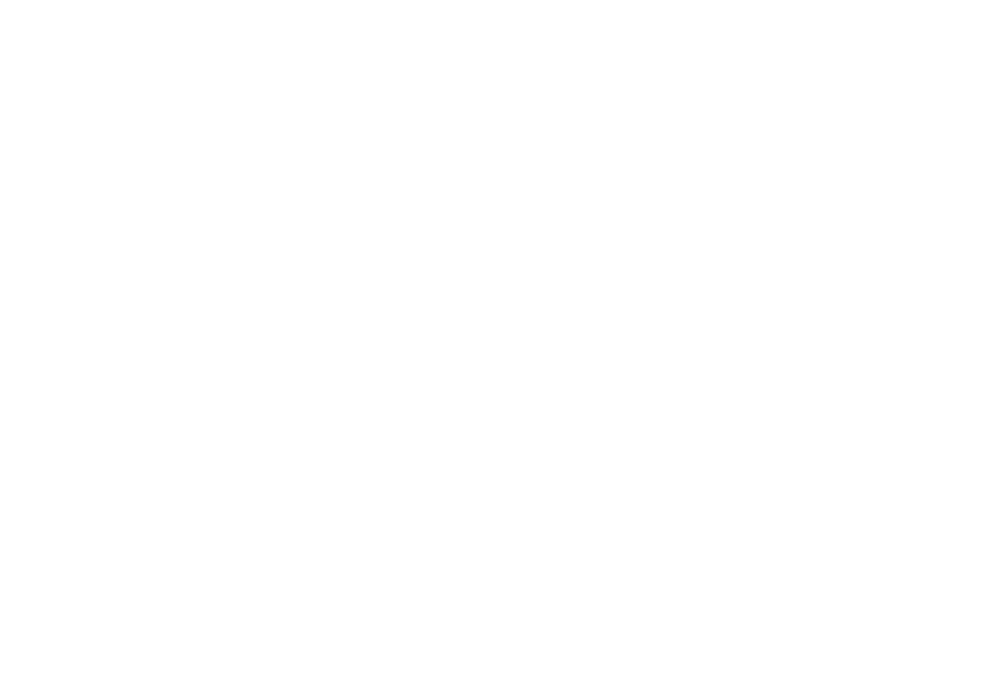

  8%|███                                      | 15/200 [00:10<02:08,  1.44it/s]

100.42211055276383


<IPython.core.display.Javascript object>


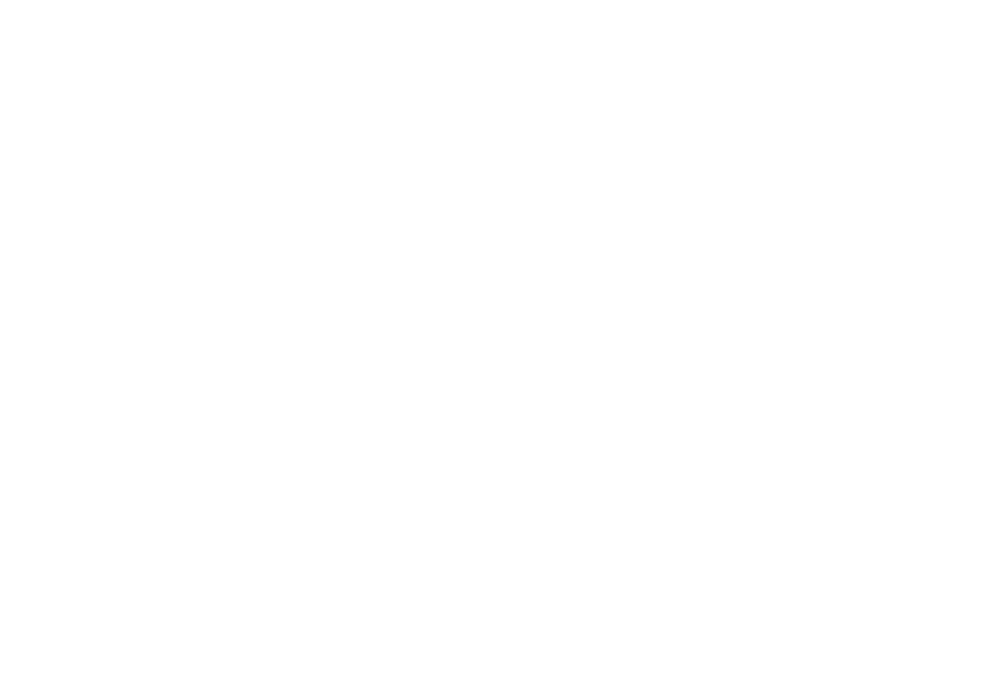

  8%|███▎                                     | 16/200 [00:10<02:03,  1.49it/s]

107.05025125628141


<IPython.core.display.Javascript object>


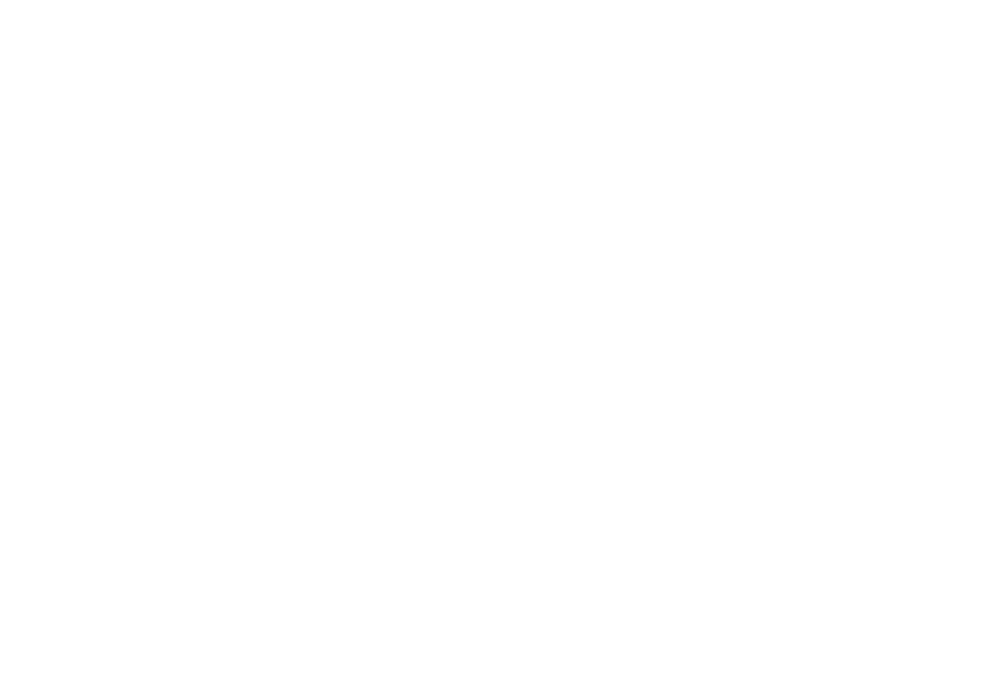

  8%|███▍                                     | 17/200 [00:11<01:58,  1.54it/s]

113.678391959799


<IPython.core.display.Javascript object>


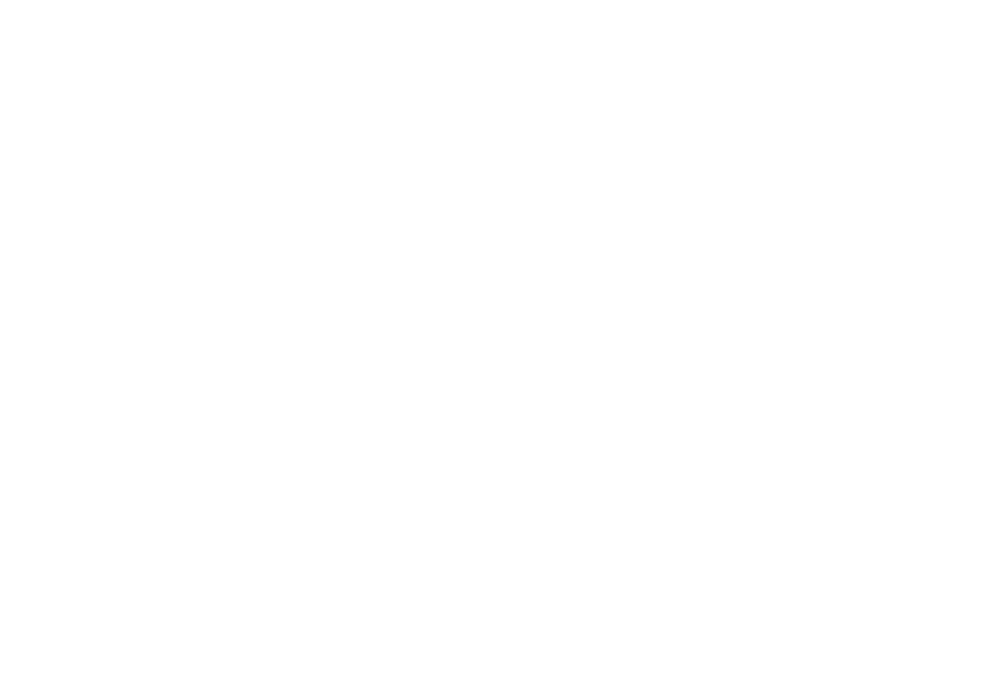

  9%|███▋                                     | 18/200 [00:11<01:54,  1.59it/s]

120.30653266331659


<IPython.core.display.Javascript object>


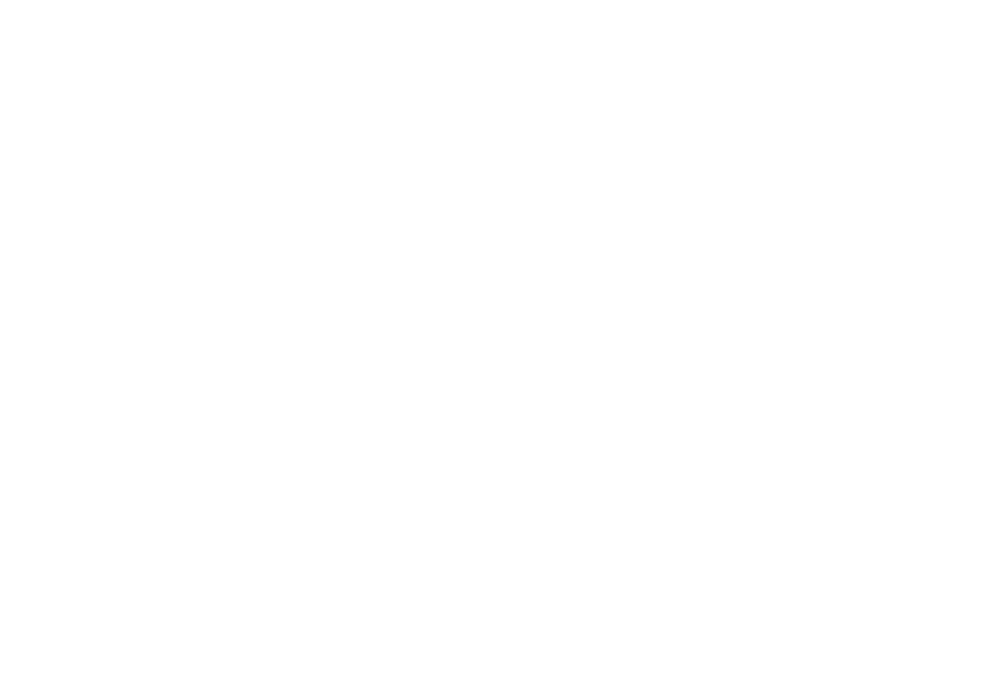

 10%|███▉                                     | 19/200 [00:11<01:51,  1.63it/s]

126.93467336683418


<IPython.core.display.Javascript object>


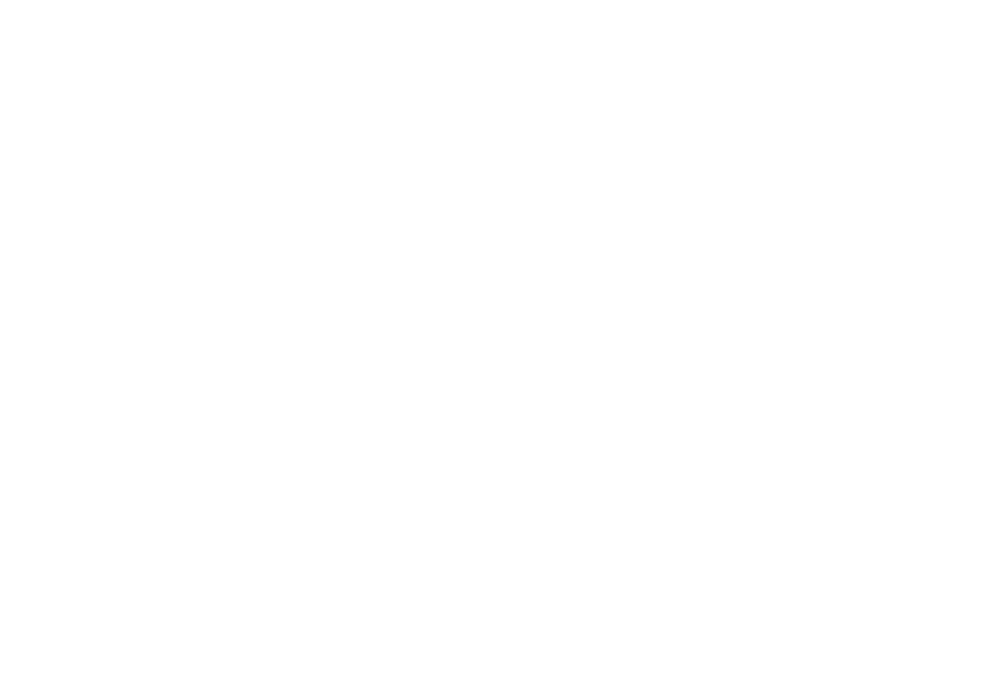

 10%|████                                     | 20/200 [00:12<01:48,  1.66it/s]

133.56281407035178


<IPython.core.display.Javascript object>


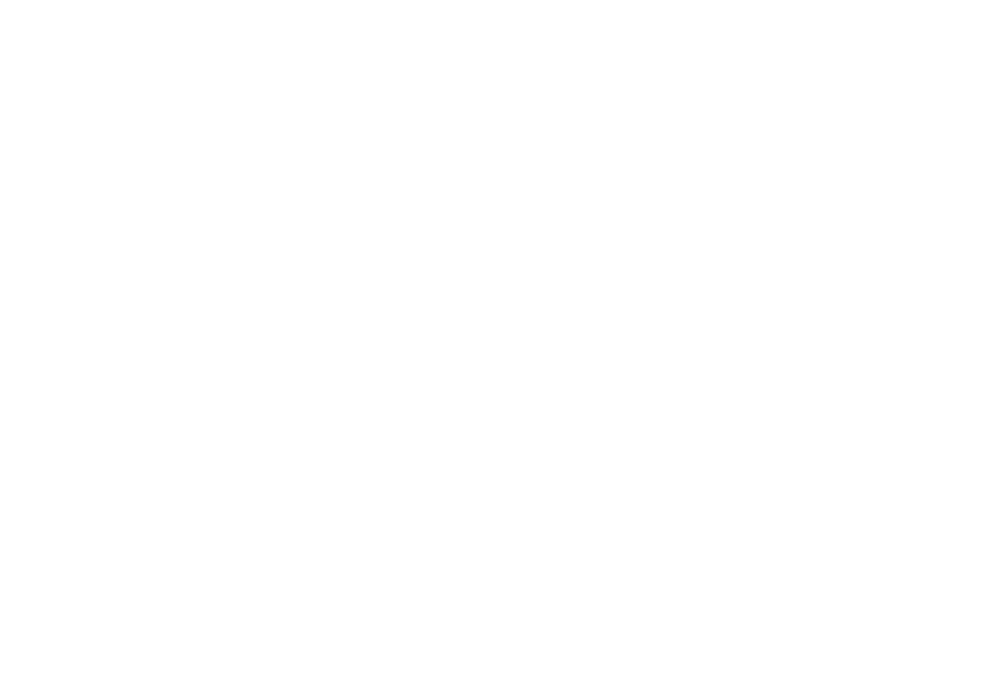

 10%|████▎                                    | 21/200 [00:12<01:45,  1.70it/s]

140.19095477386935


<IPython.core.display.Javascript object>


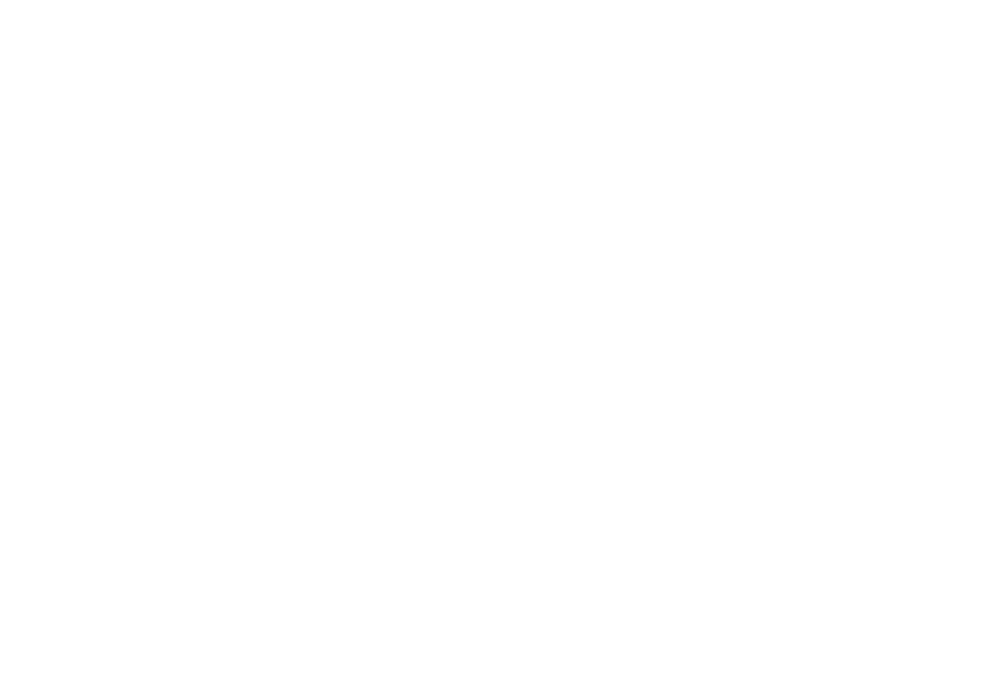

 11%|████▌                                    | 22/200 [00:12<01:42,  1.74it/s]

146.81909547738695


<IPython.core.display.Javascript object>


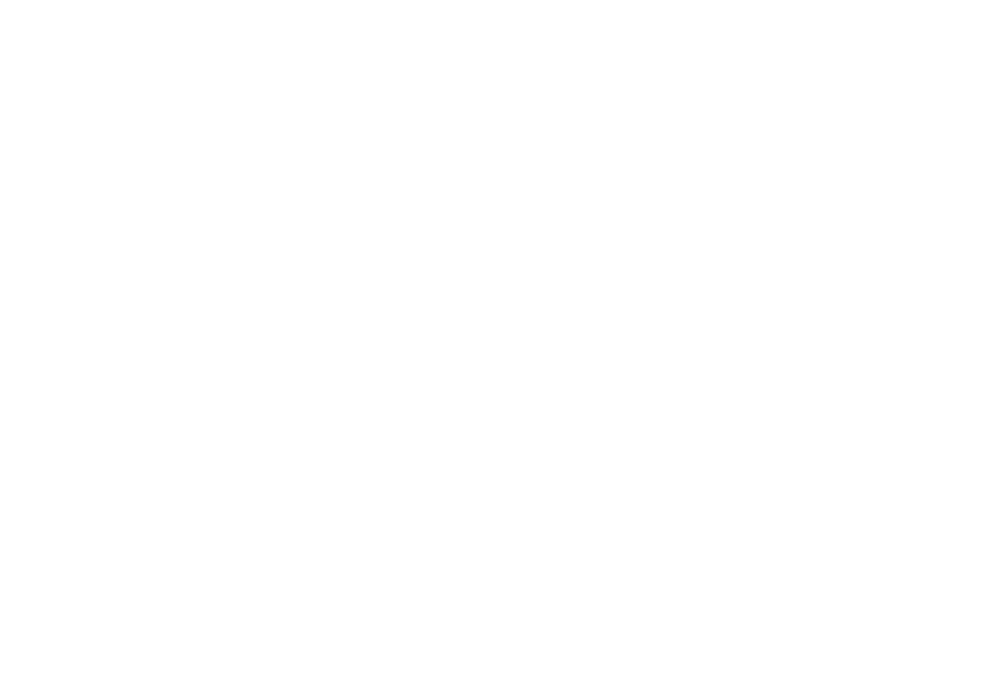

 12%|████▋                                    | 23/200 [00:12<01:40,  1.77it/s]

153.44723618090453


<IPython.core.display.Javascript object>


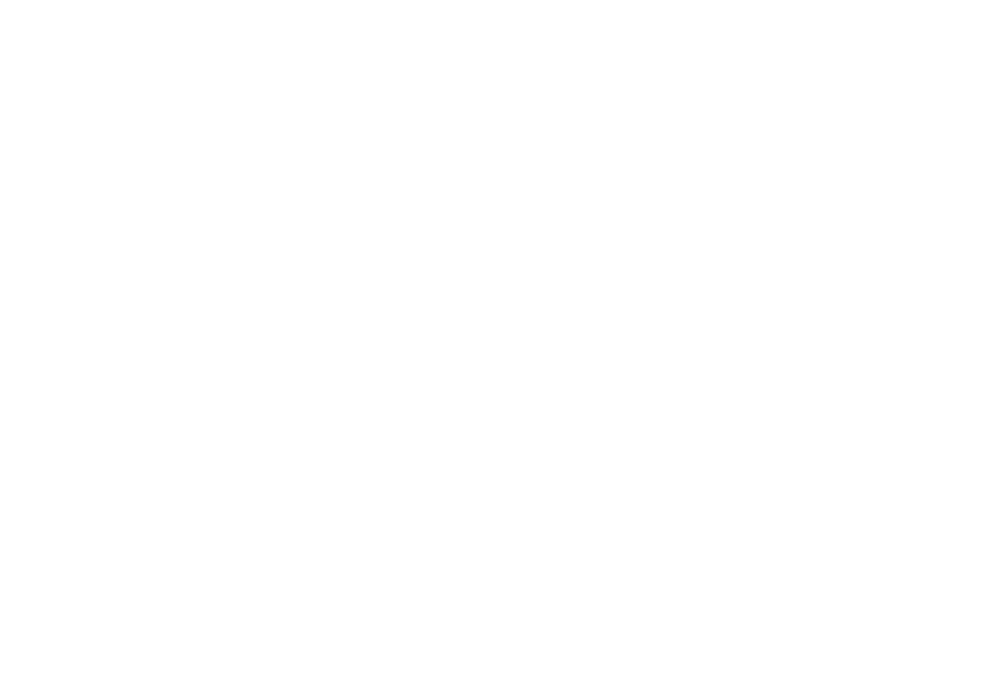

 12%|████▉                                    | 24/200 [00:13<01:37,  1.80it/s]

160.07537688442213


<IPython.core.display.Javascript object>


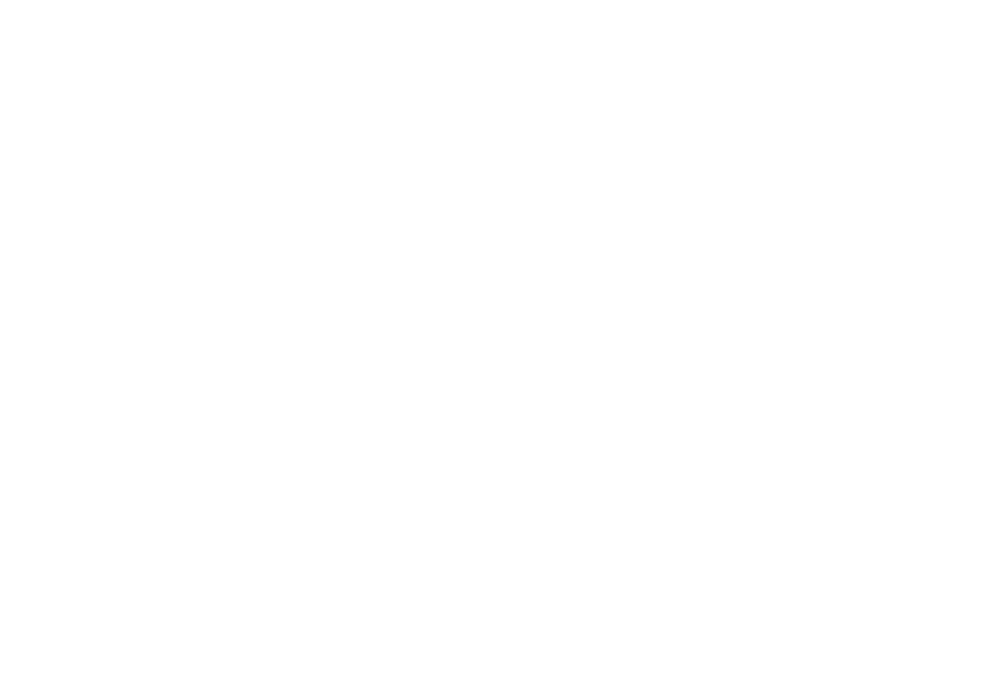

 12%|█████▏                                   | 25/200 [00:13<01:35,  1.84it/s]

166.7035175879397


<IPython.core.display.Javascript object>


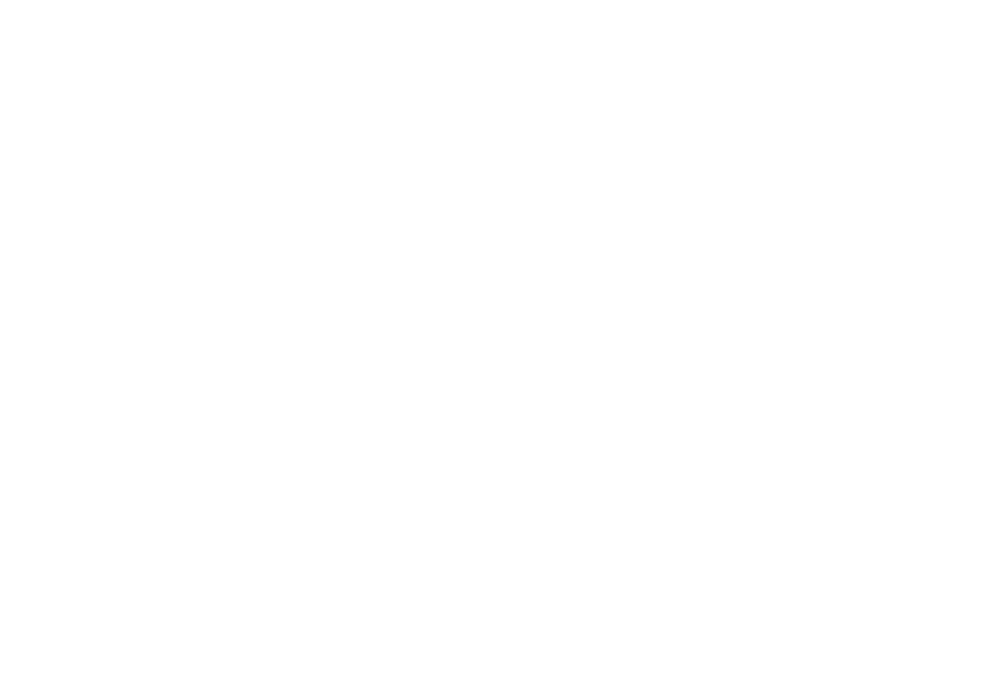

 13%|█████▎                                   | 26/200 [00:13<01:33,  1.87it/s]

173.3316582914573


<IPython.core.display.Javascript object>


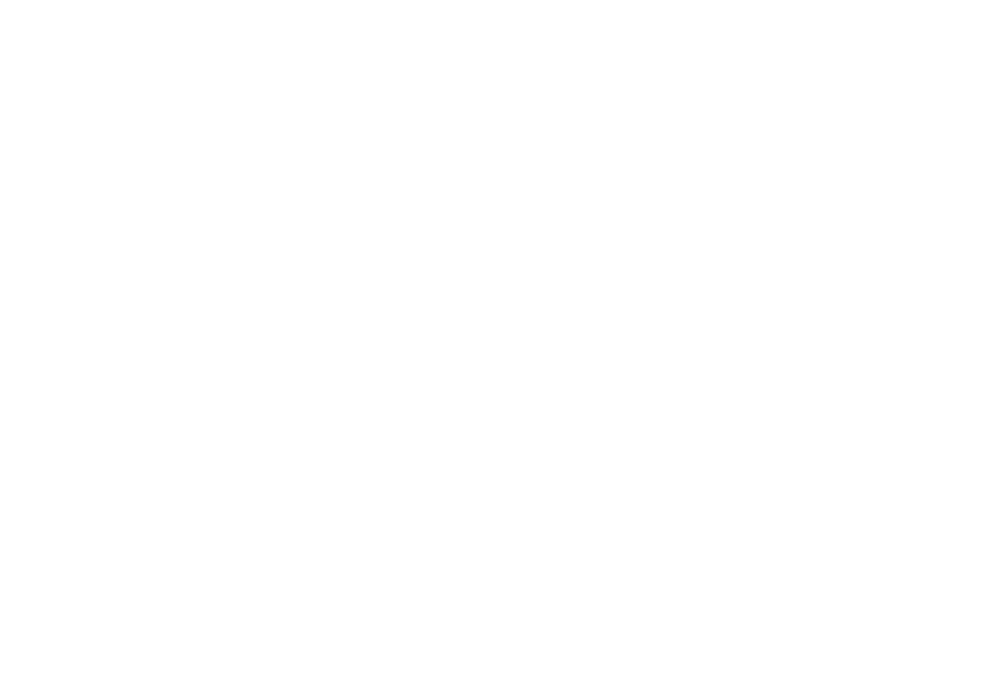

 14%|█████▌                                   | 27/200 [00:14<01:31,  1.90it/s]

179.95979899497488


<IPython.core.display.Javascript object>


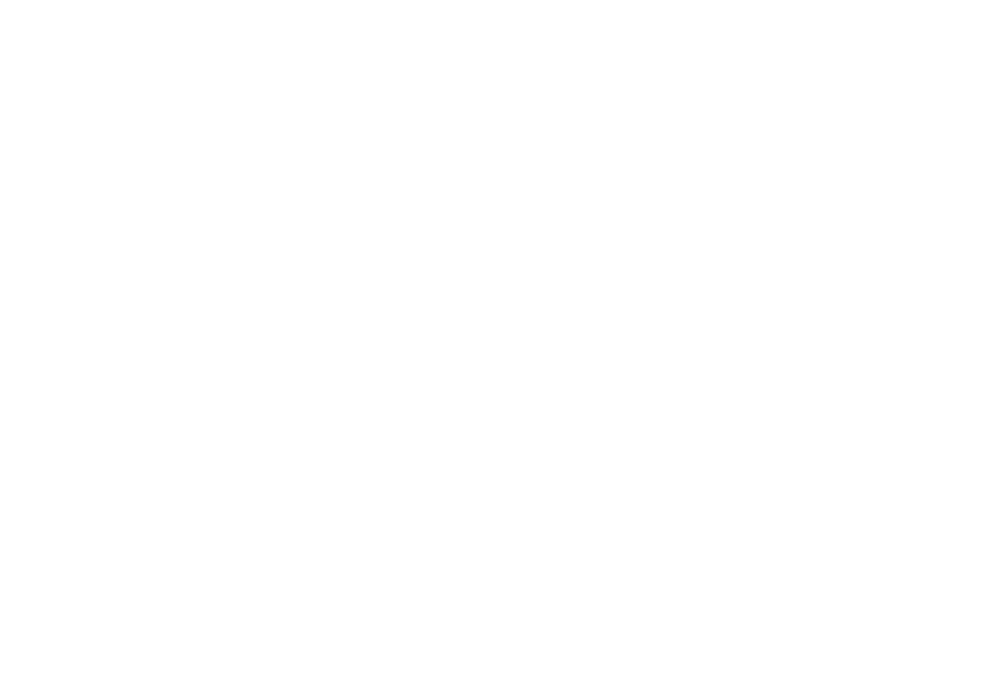

 14%|█████▋                                   | 28/200 [00:14<01:29,  1.93it/s]

186.58793969849248


<IPython.core.display.Javascript object>


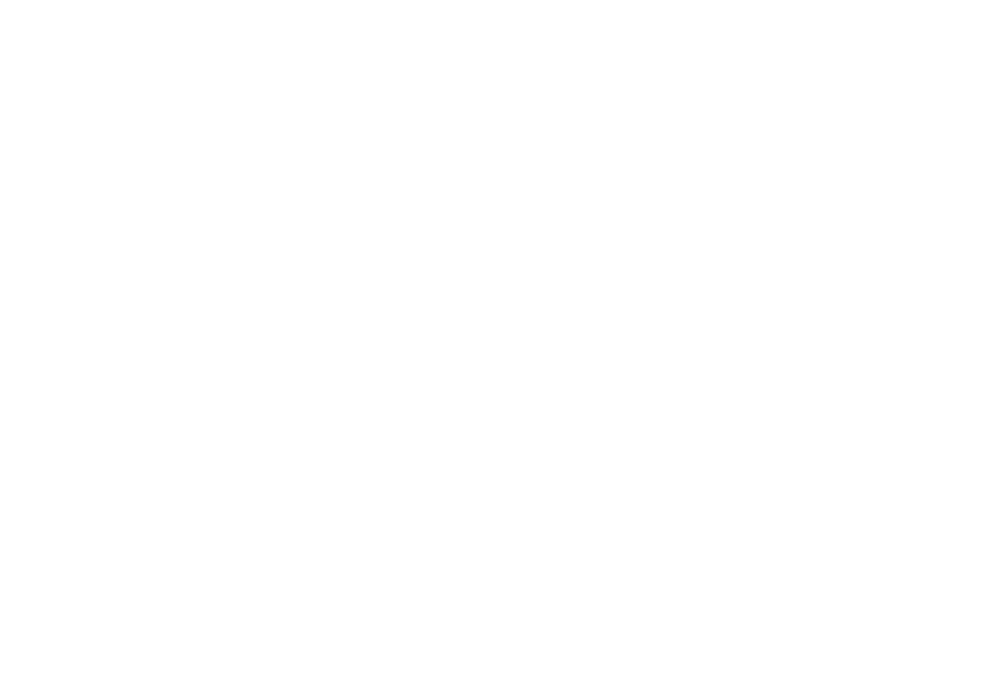

 14%|█████▉                                   | 29/200 [00:14<01:27,  1.95it/s]

193.21608040201005


<IPython.core.display.Javascript object>


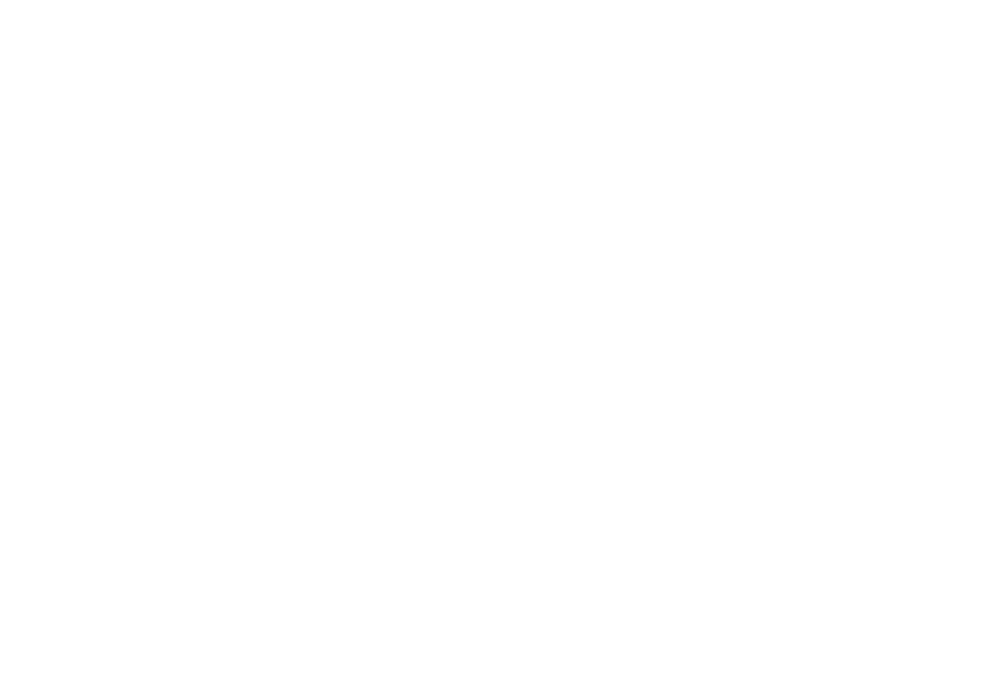

 15%|██████▏                                  | 30/200 [00:15<01:26,  1.98it/s]

199.84422110552765


<IPython.core.display.Javascript object>


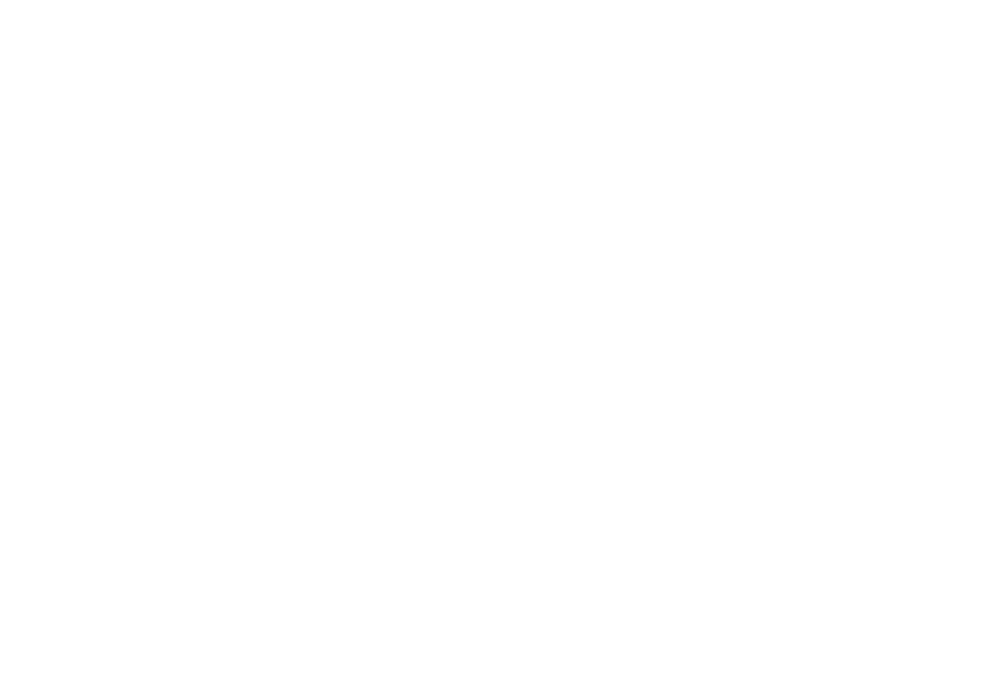

 16%|██████▎                                  | 31/200 [00:15<01:24,  1.99it/s]

206.47236180904522


<IPython.core.display.Javascript object>


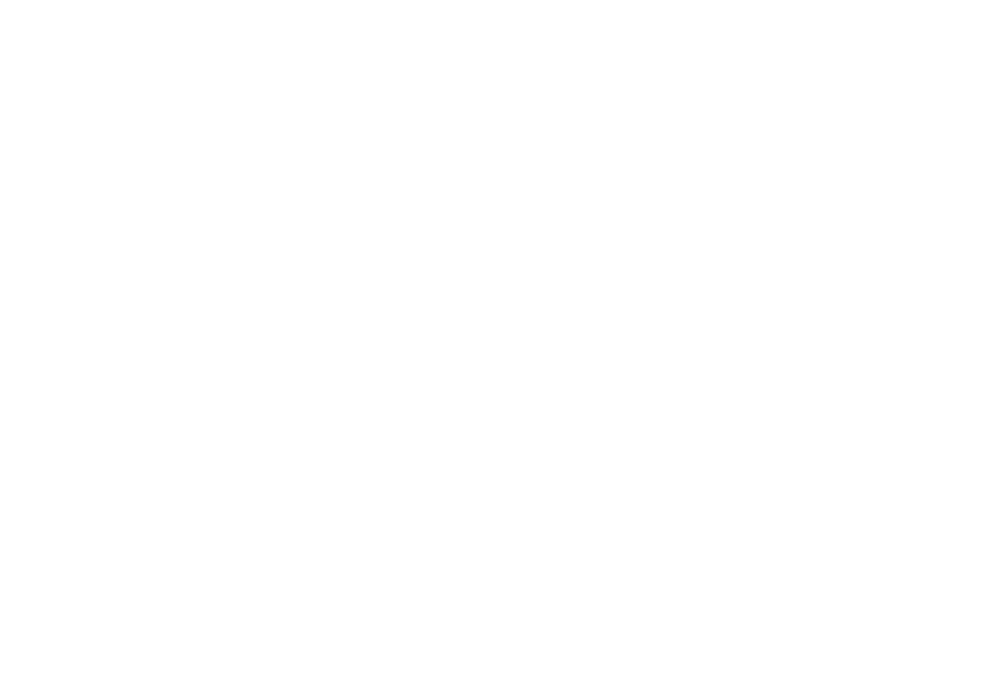

 16%|██████▌                                  | 32/200 [00:15<01:23,  2.02it/s]

213.10050251256283


<IPython.core.display.Javascript object>


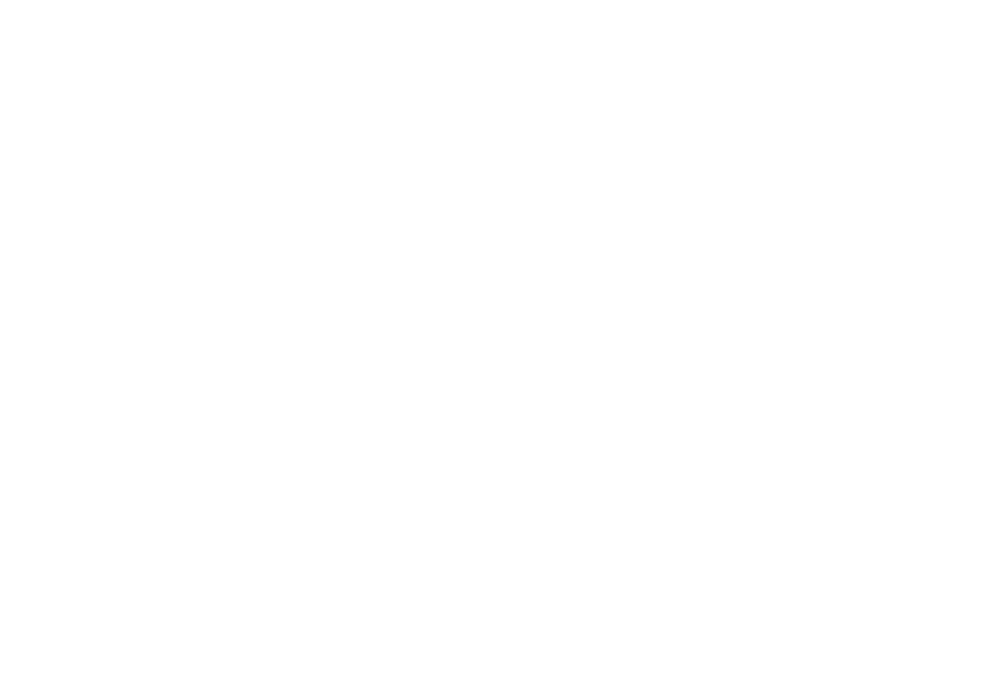

 16%|██████▊                                  | 33/200 [00:16<01:21,  2.04it/s]

219.72864321608043


<IPython.core.display.Javascript object>


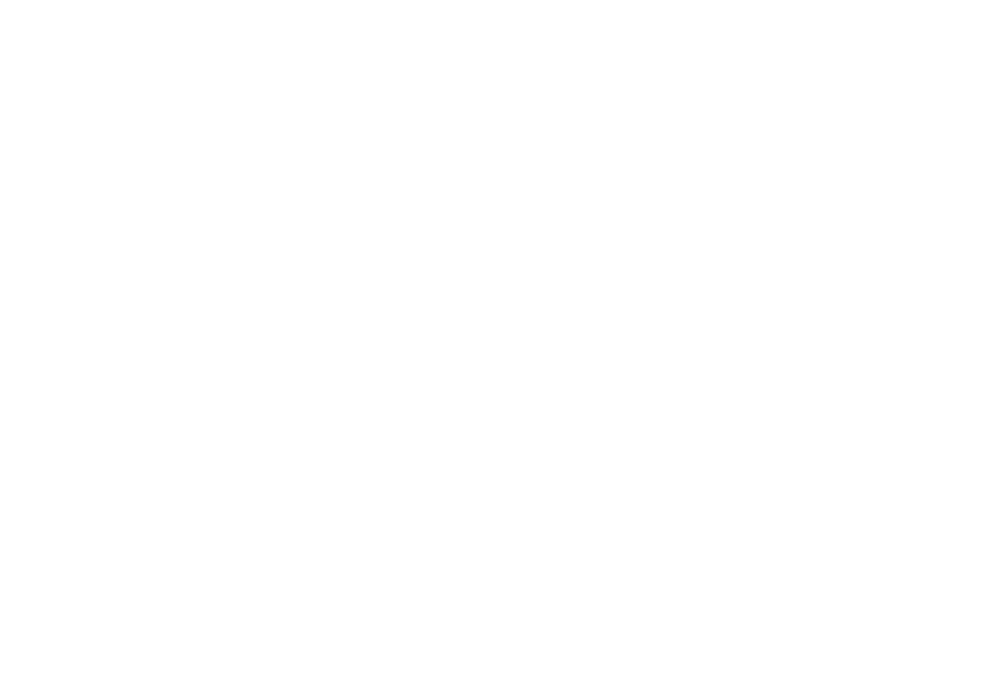

 17%|██████▉                                  | 34/200 [00:16<01:20,  2.06it/s]

226.356783919598


<IPython.core.display.Javascript object>


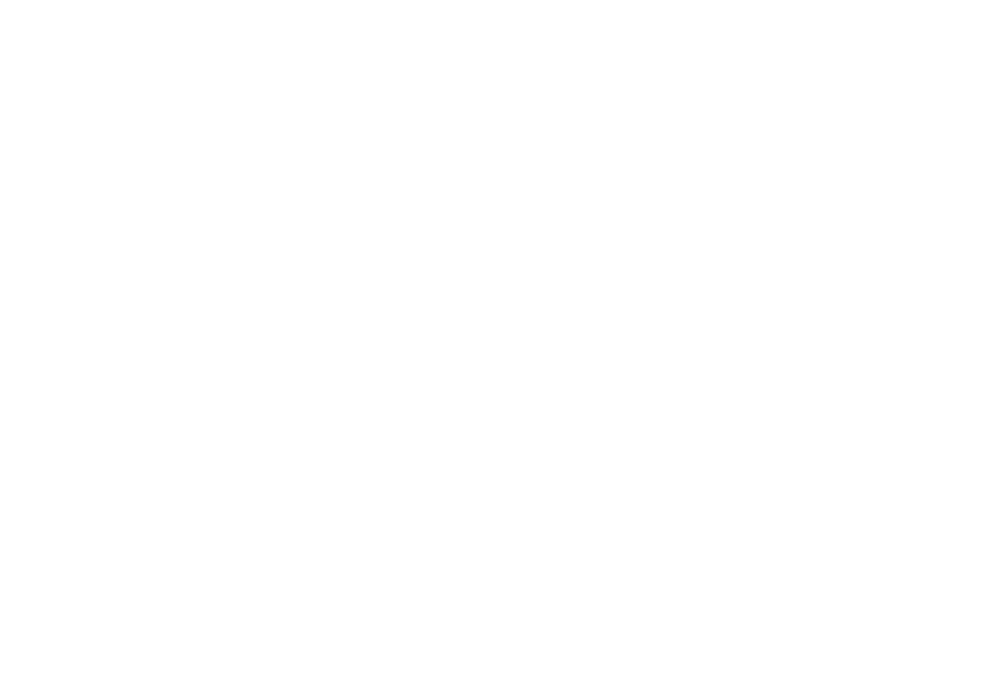

 18%|███████▏                                 | 35/200 [00:16<01:19,  2.08it/s]

232.9849246231156


<IPython.core.display.Javascript object>


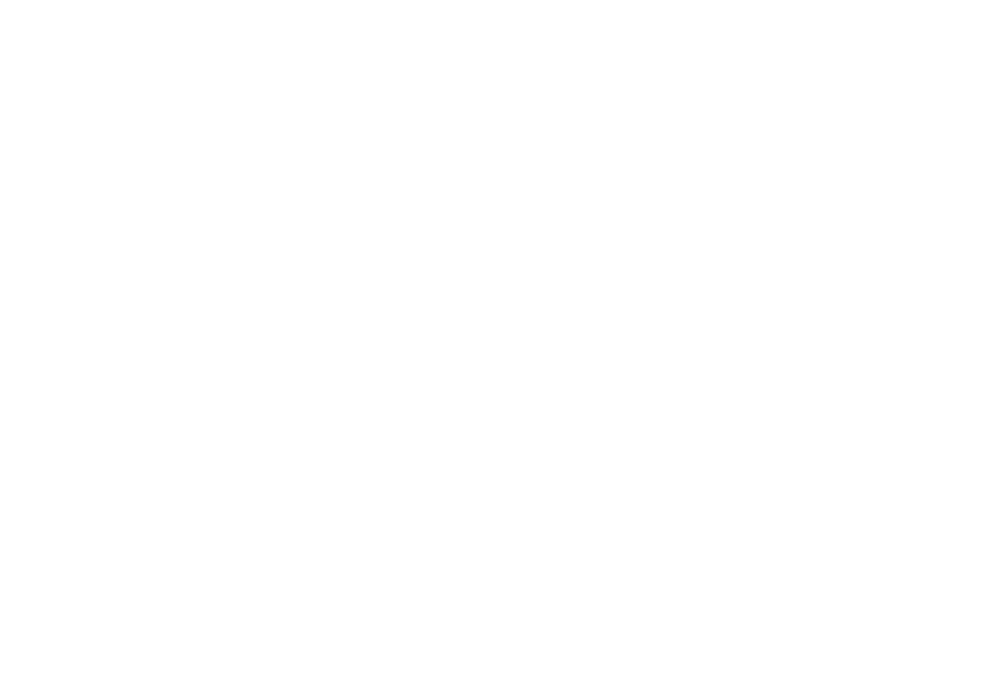

 18%|███████▍                                 | 36/200 [00:17<01:17,  2.11it/s]

239.61306532663318


<IPython.core.display.Javascript object>


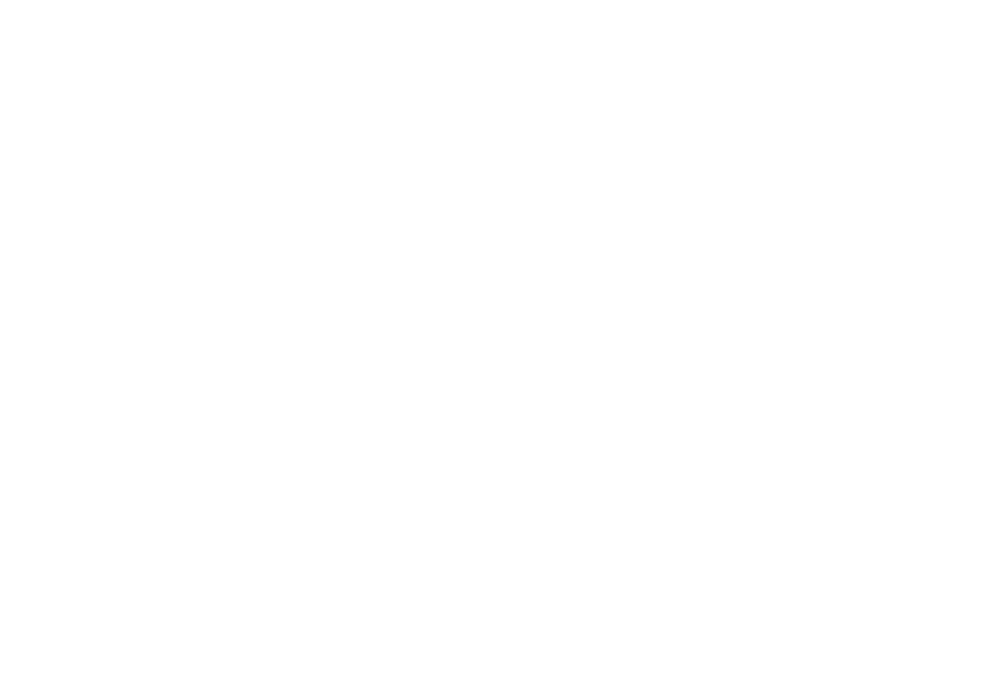

 18%|███████▌                                 | 37/200 [00:17<01:16,  2.12it/s]

246.24120603015078


<IPython.core.display.Javascript object>


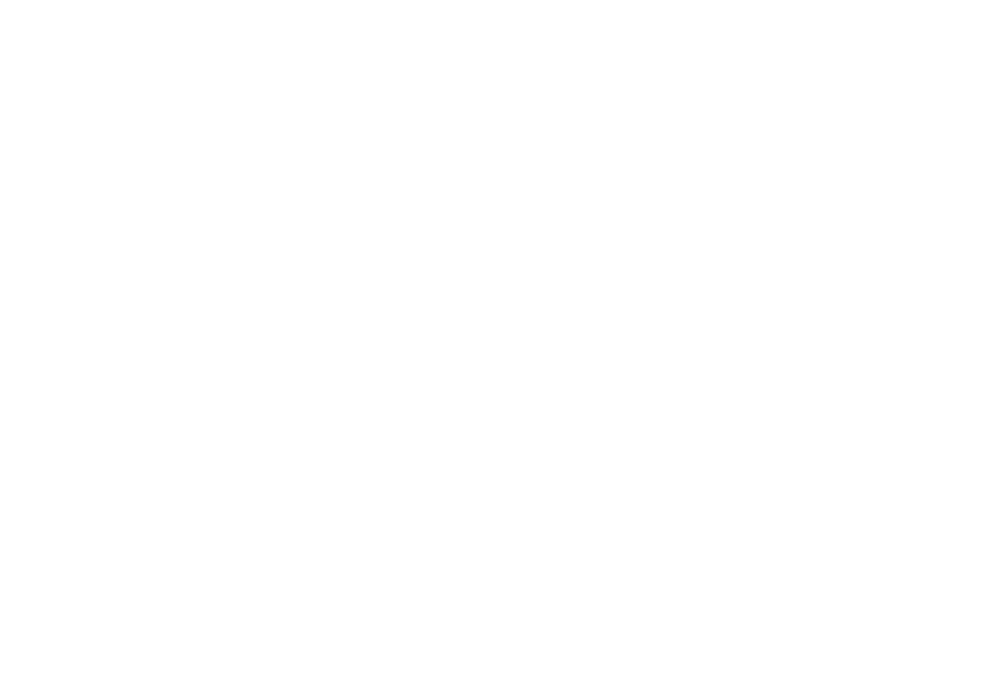

 19%|███████▊                                 | 38/200 [00:17<01:15,  2.14it/s]

252.86934673366835


<IPython.core.display.Javascript object>


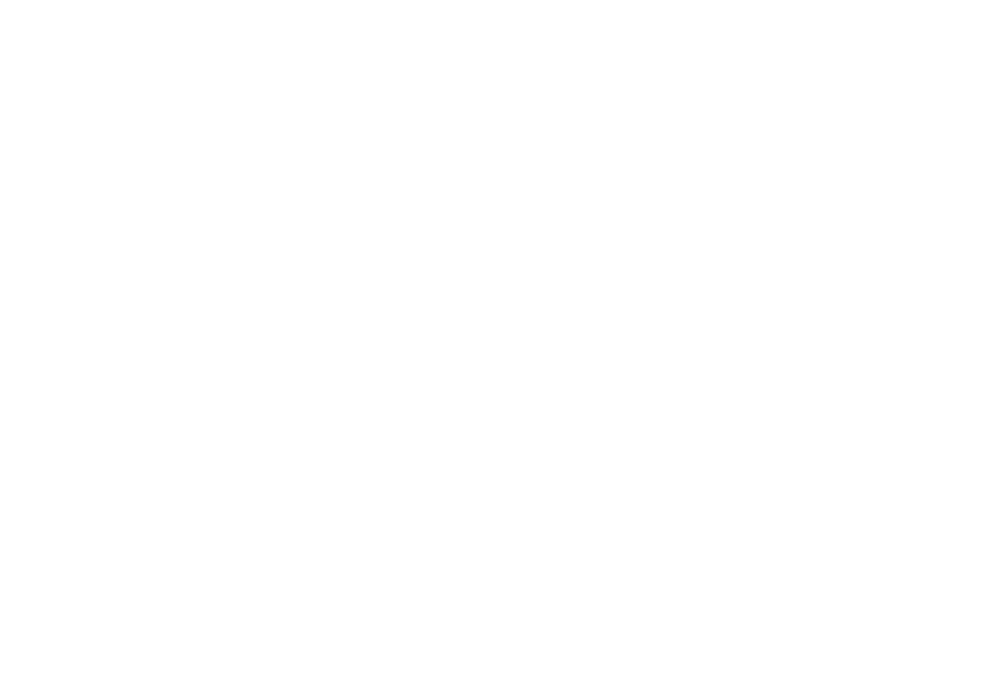

 20%|███████▉                                 | 39/200 [00:18<01:14,  2.16it/s]

259.49748743718595


<IPython.core.display.Javascript object>


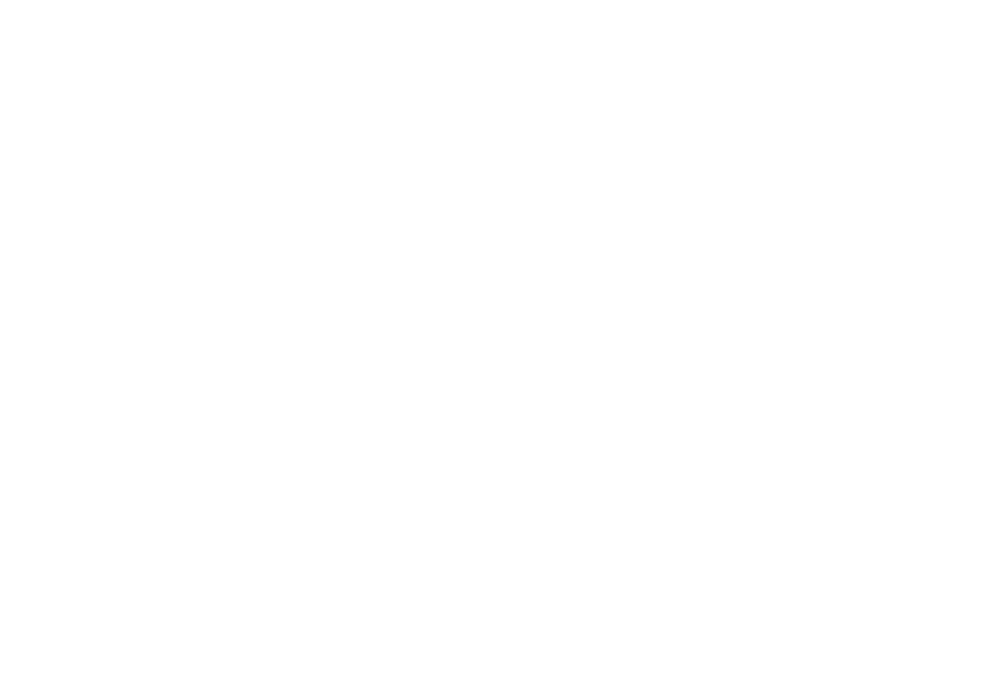

 20%|████████▏                                | 40/200 [00:18<01:13,  2.18it/s]

266.12562814070355


<IPython.core.display.Javascript object>


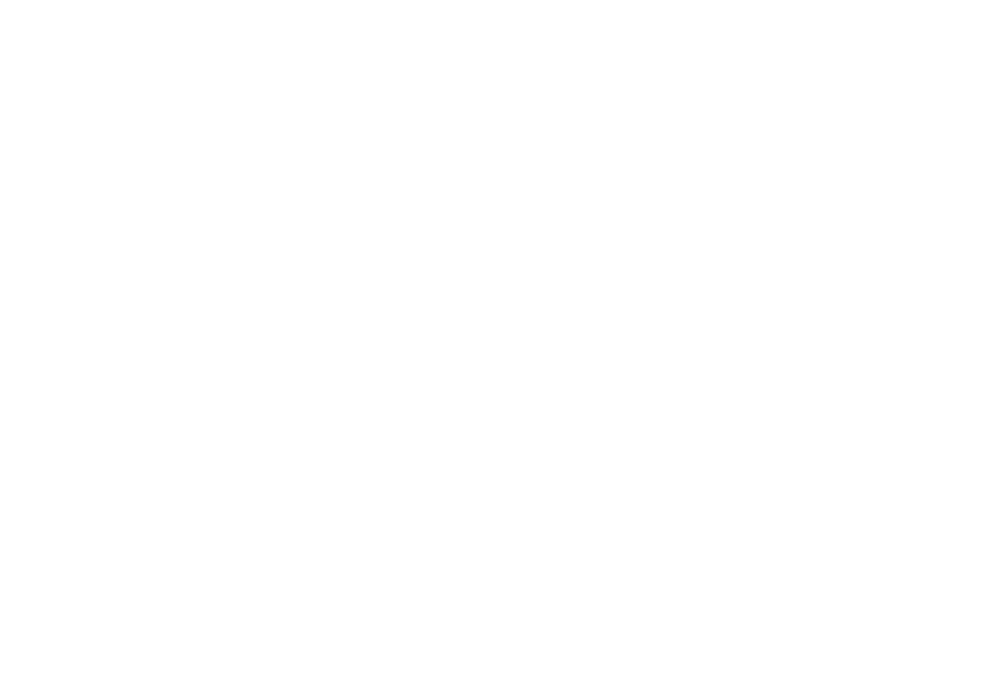

 20%|████████▍                                | 41/200 [00:18<01:12,  2.19it/s]

272.7537688442211


<IPython.core.display.Javascript object>


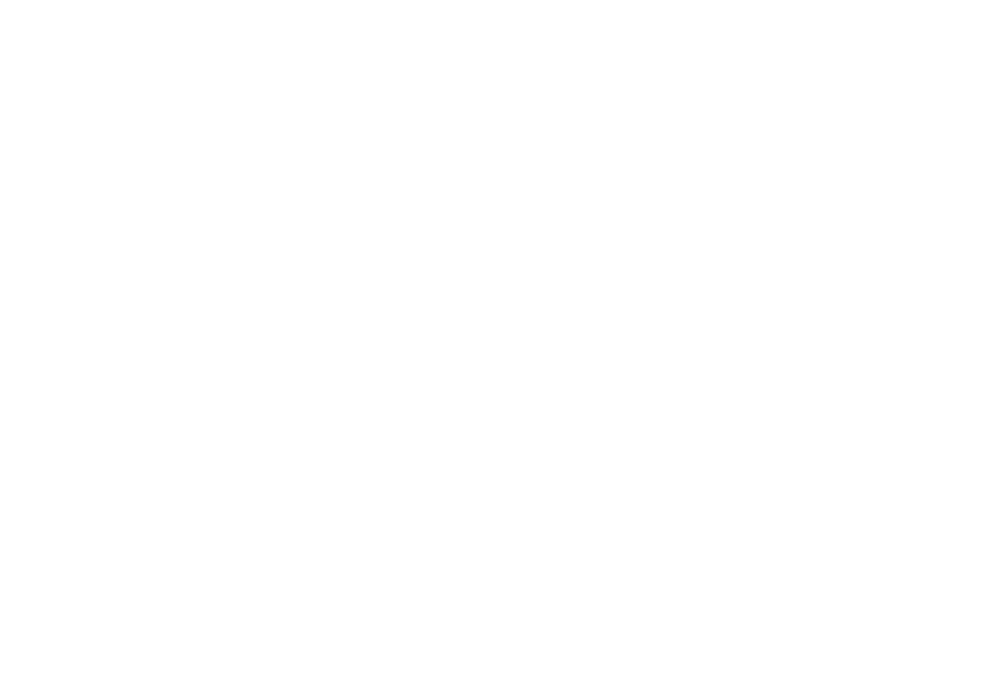

 21%|████████▌                                | 42/200 [00:19<01:11,  2.20it/s]

279.3819095477387


<IPython.core.display.Javascript object>


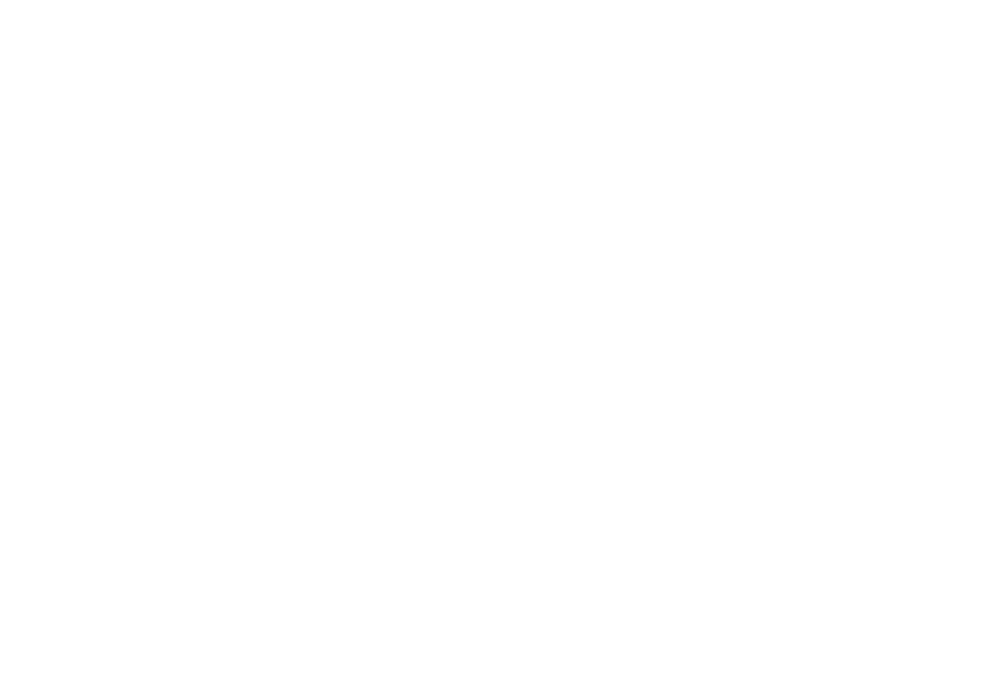

 22%|████████▊                                | 43/200 [00:19<01:10,  2.22it/s]

286.0100502512563


<IPython.core.display.Javascript object>


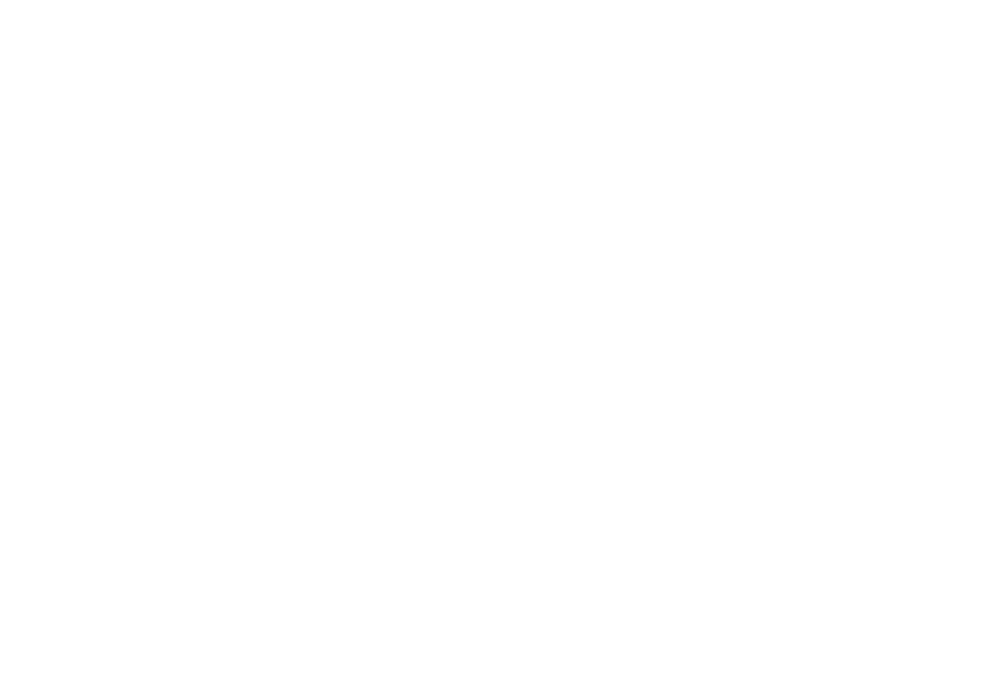

 22%|█████████                                | 44/200 [00:19<01:09,  2.23it/s]

292.6381909547739


<IPython.core.display.Javascript object>


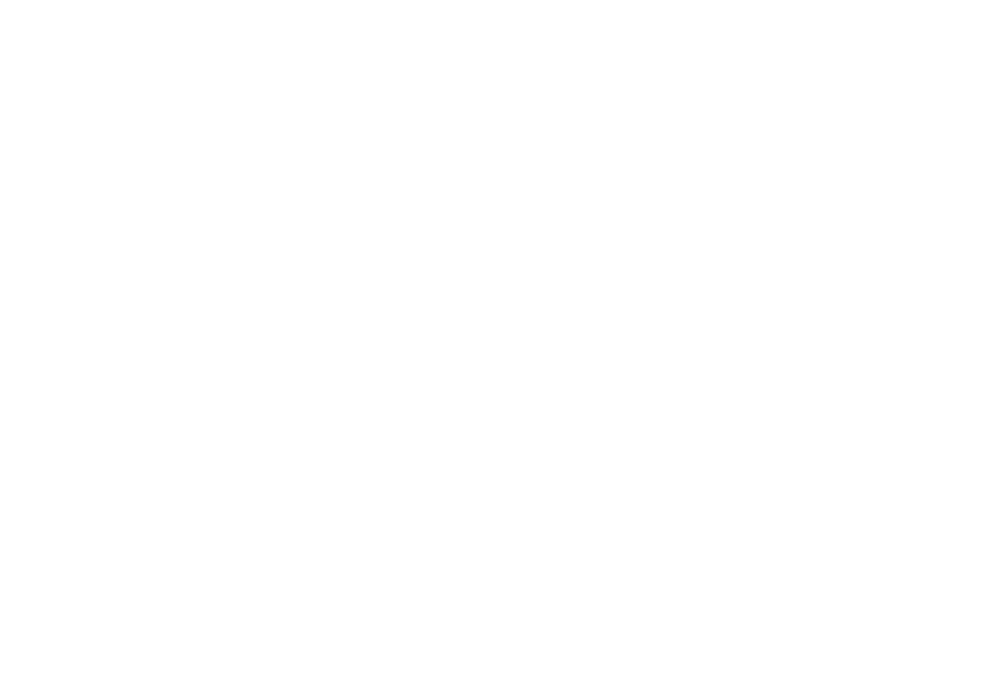

 22%|█████████▏                               | 45/200 [00:20<01:09,  2.24it/s]

299.26633165829145


<IPython.core.display.Javascript object>


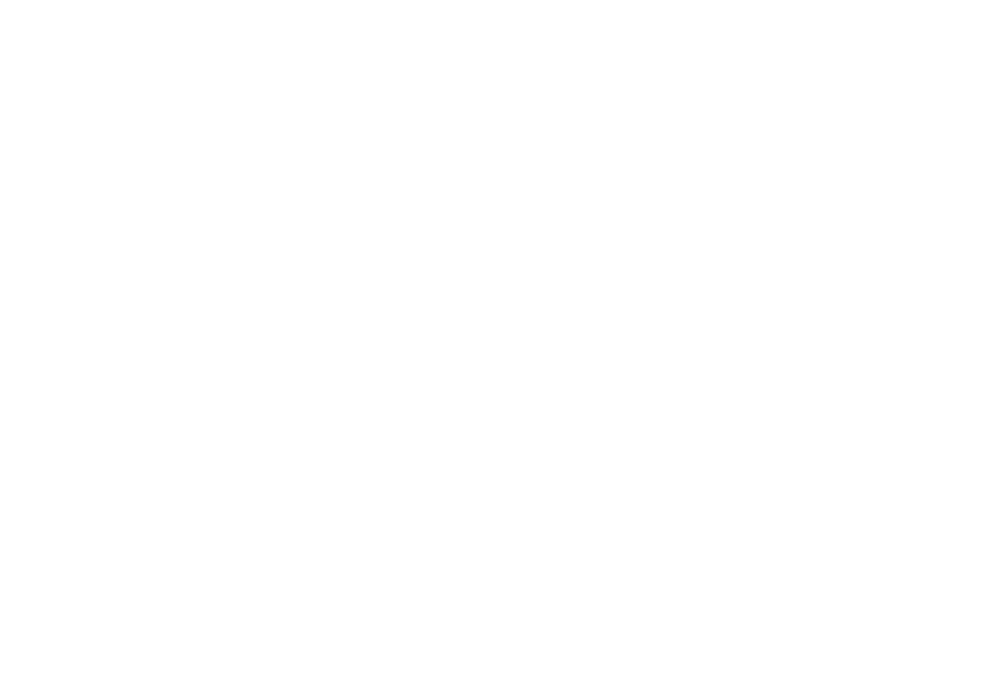

 23%|█████████▍                               | 46/200 [00:20<01:08,  2.25it/s]

305.89447236180905


<IPython.core.display.Javascript object>


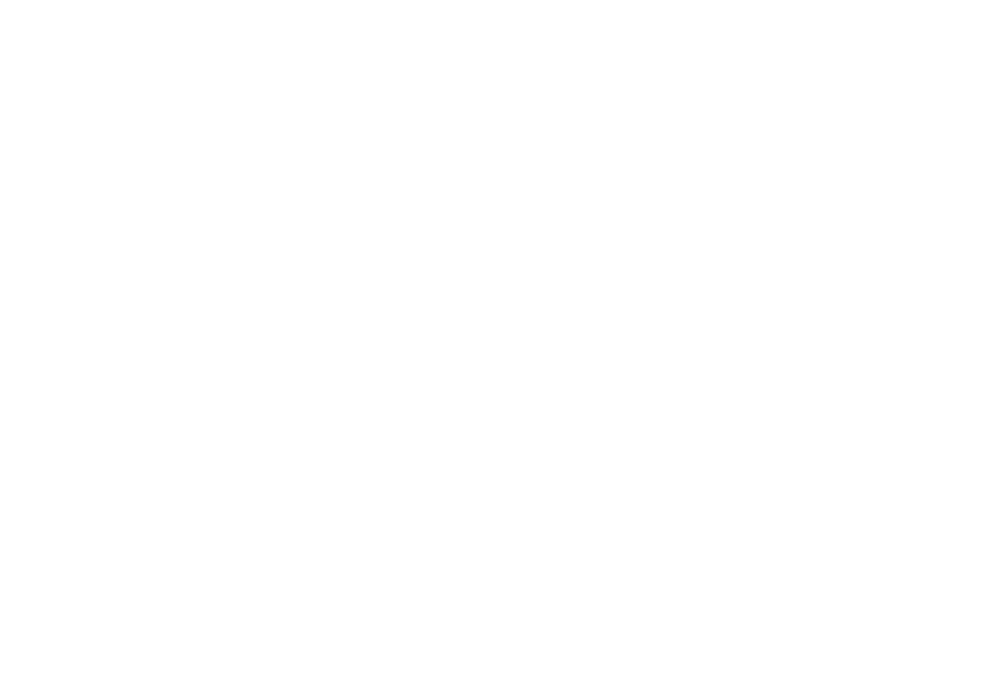

 24%|█████████▋                               | 47/200 [00:20<01:07,  2.27it/s]

312.52261306532665


<IPython.core.display.Javascript object>


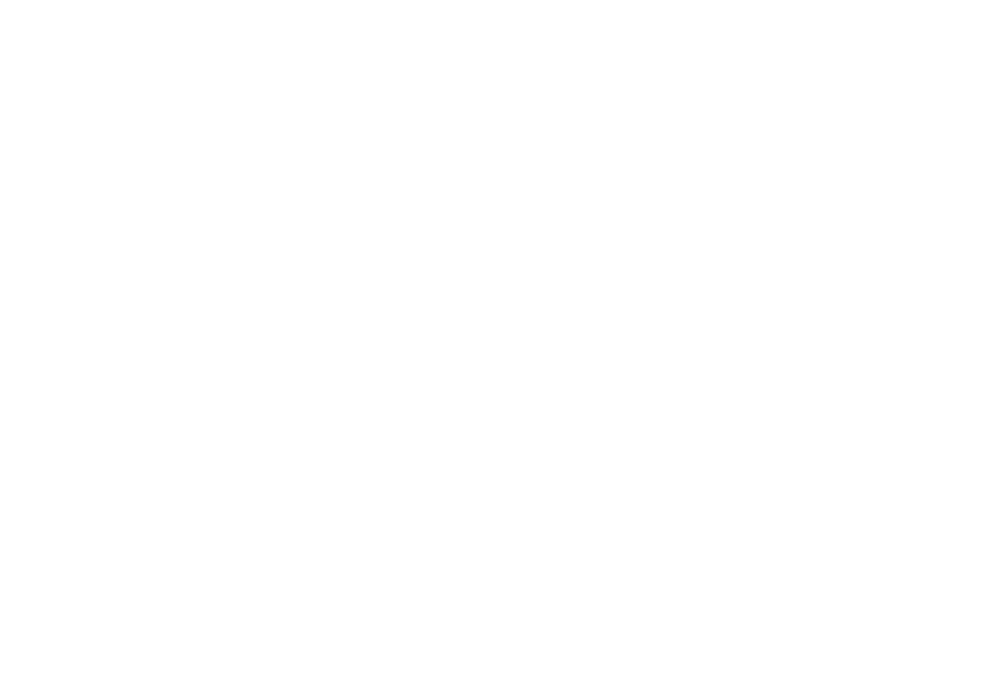

 24%|█████████▊                               | 48/200 [00:21<01:06,  2.28it/s]

319.15075376884425


<IPython.core.display.Javascript object>


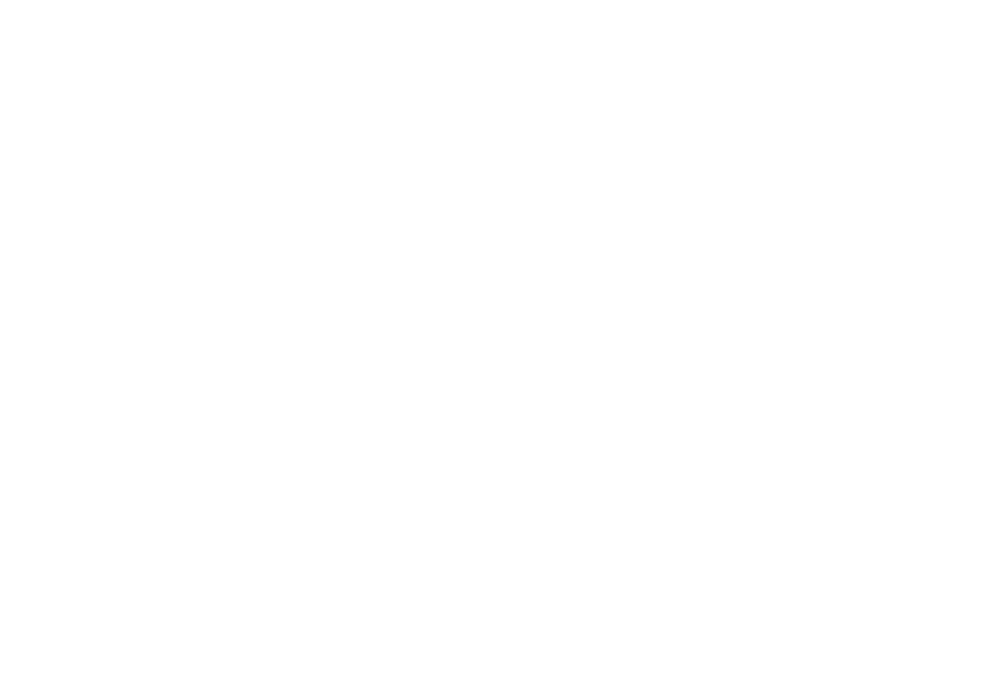

 24%|██████████                               | 49/200 [00:21<01:05,  2.29it/s]

325.77889447236186


<IPython.core.display.Javascript object>


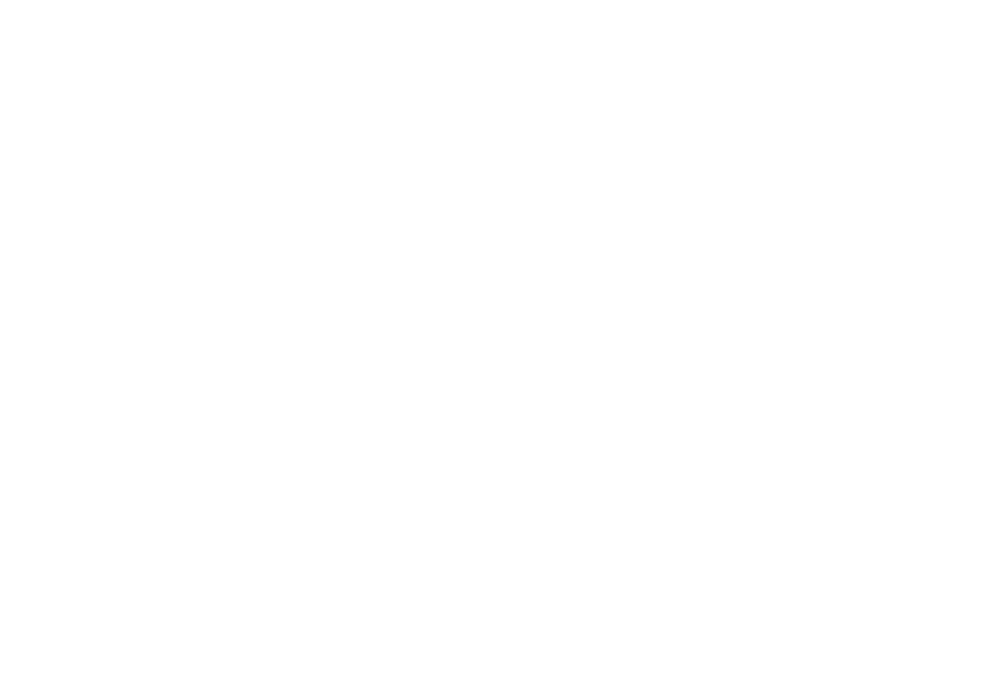

 25%|██████████▎                              | 50/200 [00:21<01:05,  2.31it/s]

332.4070351758794


<IPython.core.display.Javascript object>


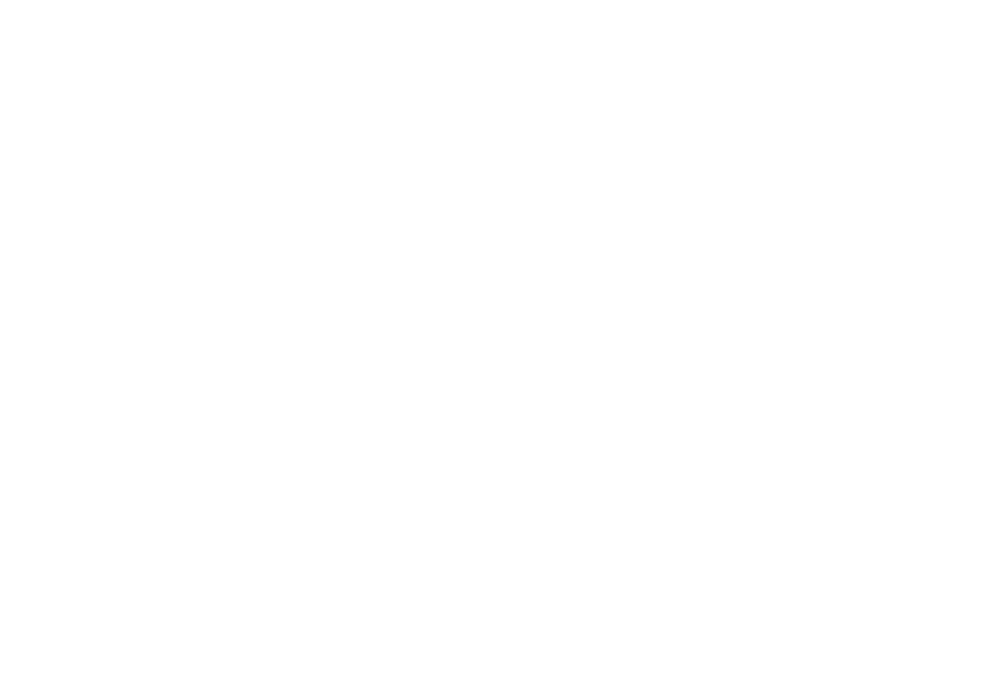

 26%|██████████▍                              | 51/200 [00:22<01:04,  2.31it/s]

339.035175879397


<IPython.core.display.Javascript object>


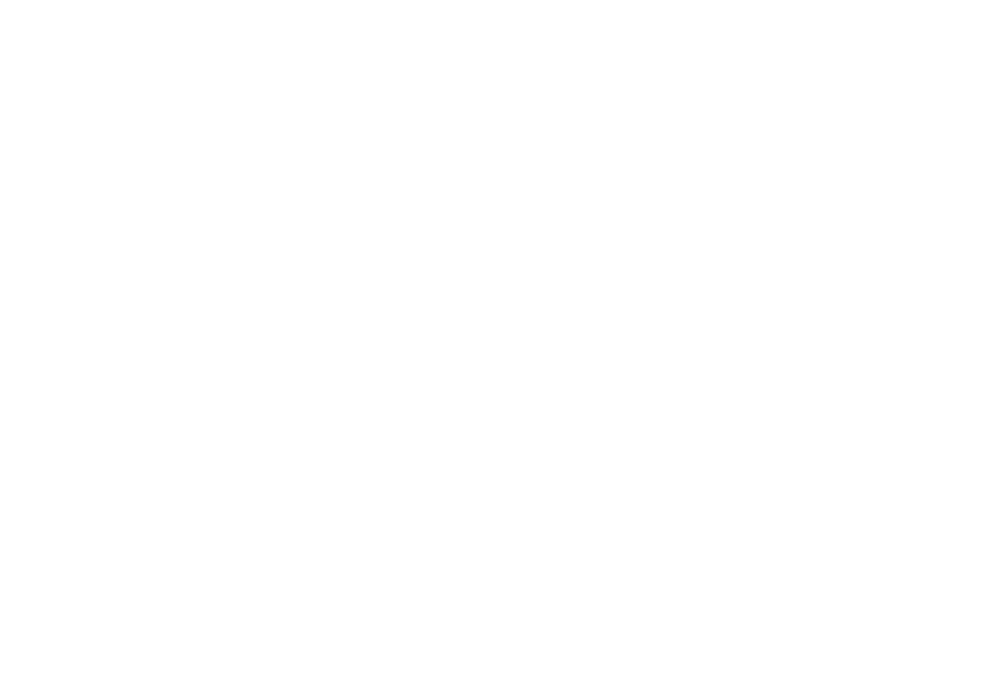

 26%|██████████▋                              | 52/200 [00:22<01:03,  2.32it/s]

345.6633165829146


<IPython.core.display.Javascript object>


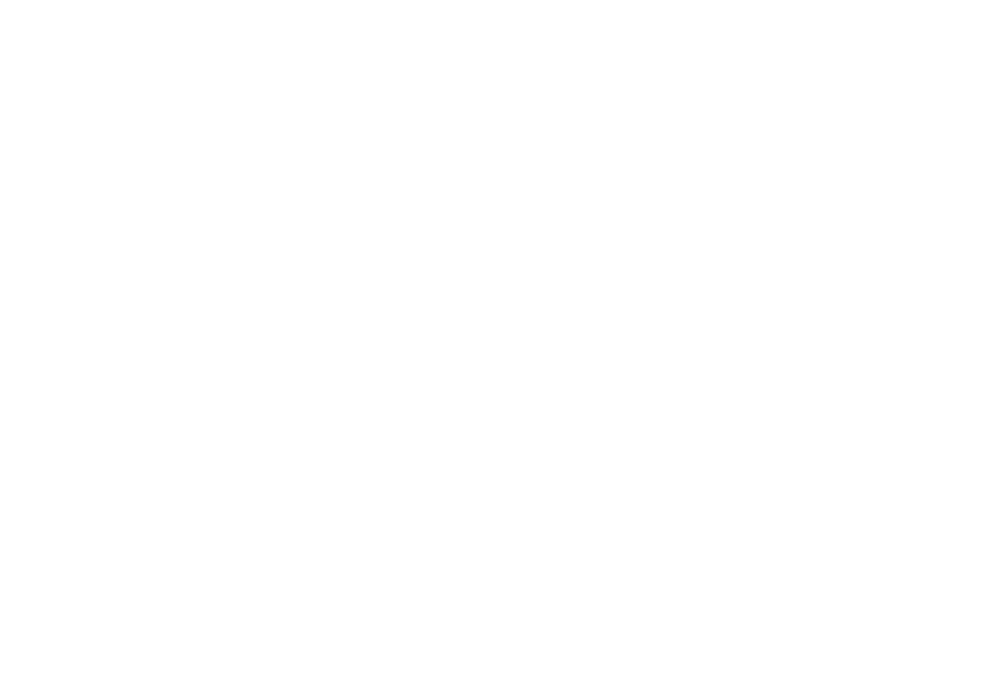

 26%|██████████▊                              | 53/200 [00:22<01:03,  2.33it/s]

352.2914572864322


<IPython.core.display.Javascript object>


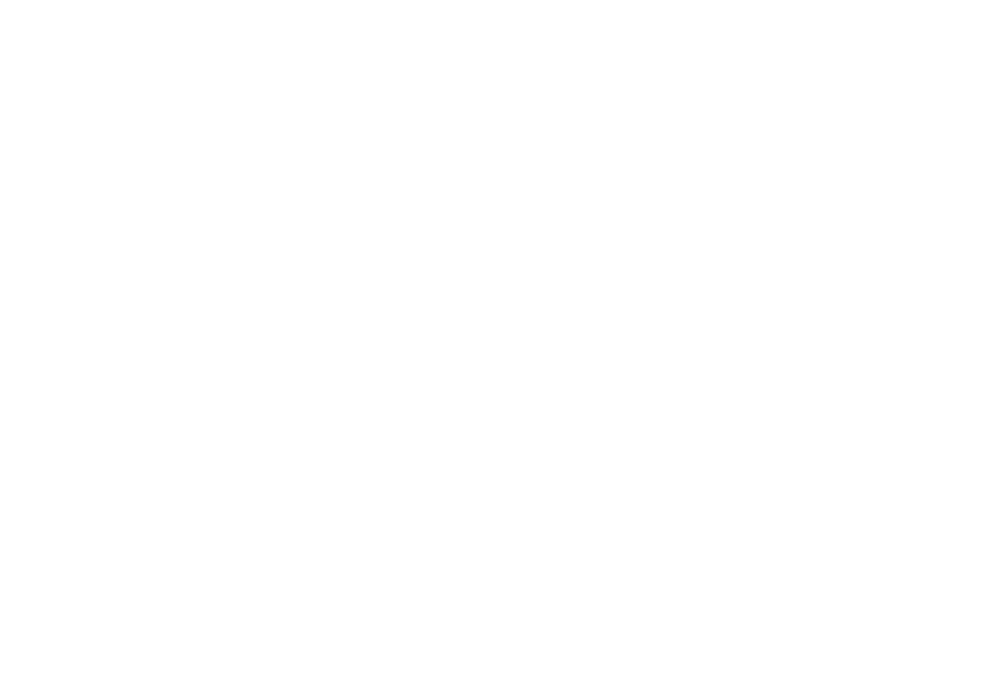

 27%|███████████                              | 54/200 [00:23<01:02,  2.34it/s]

358.91959798994975


<IPython.core.display.Javascript object>


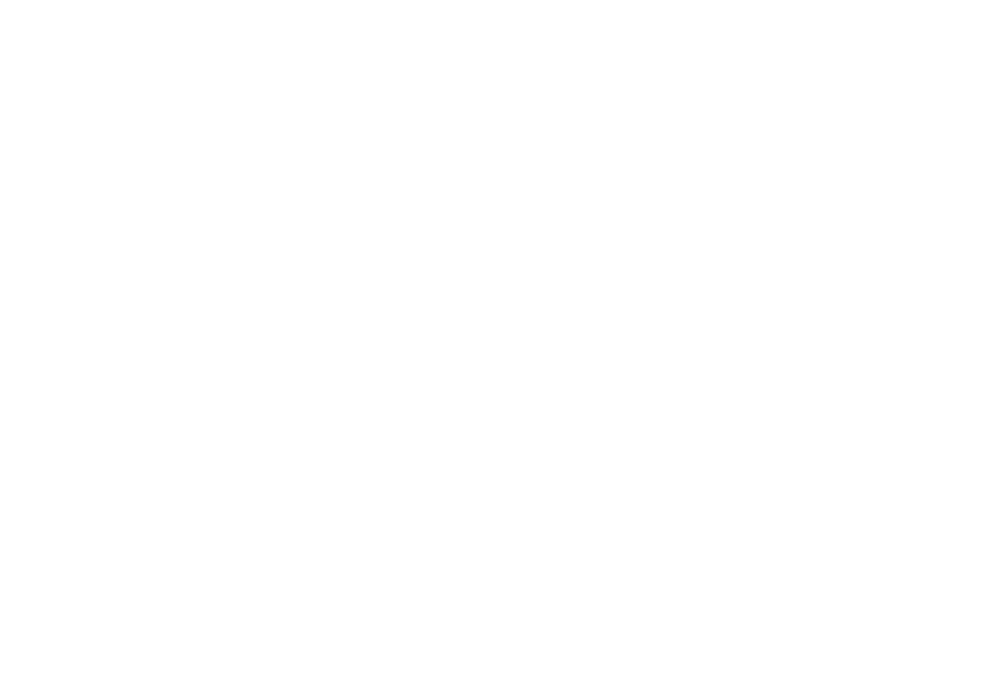

 28%|███████████▎                             | 55/200 [00:23<01:01,  2.34it/s]

365.54773869346735


<IPython.core.display.Javascript object>


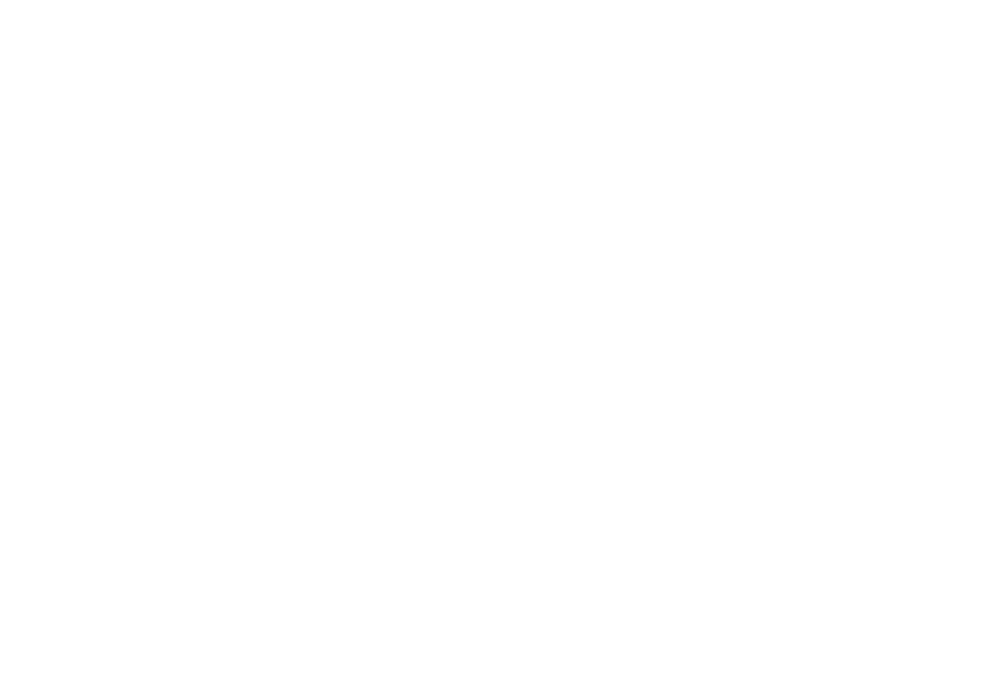

 28%|███████████▍                             | 56/200 [00:23<01:01,  2.35it/s]

372.17587939698495


<IPython.core.display.Javascript object>


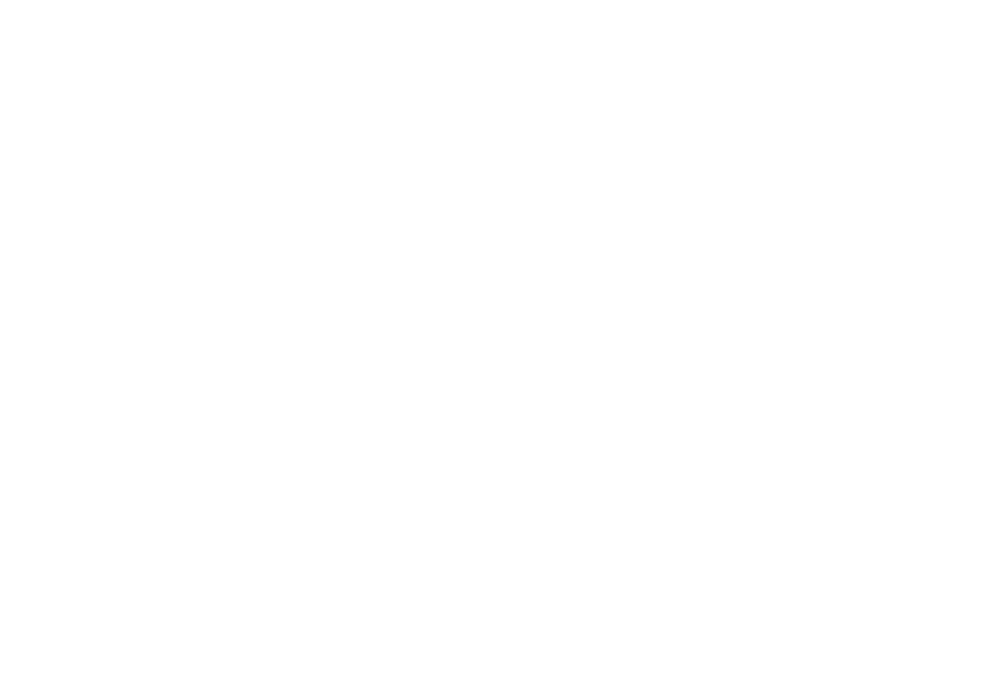

 28%|███████████▋                             | 57/200 [00:24<01:00,  2.37it/s]

378.80402010050256


<IPython.core.display.Javascript object>


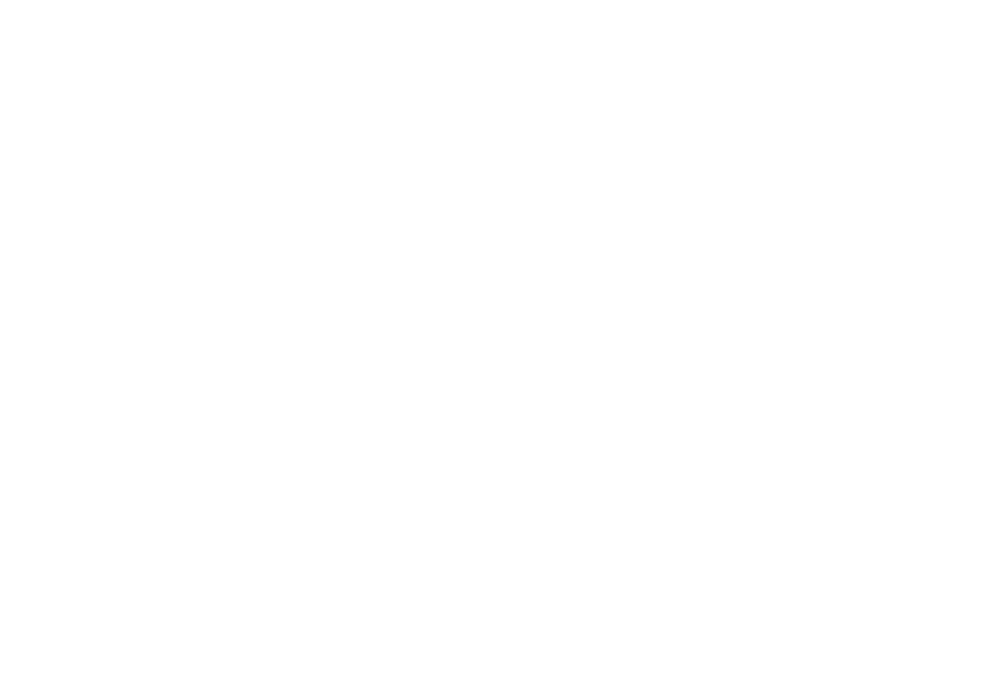

 29%|███████████▉                             | 58/200 [00:24<00:59,  2.38it/s]

385.4321608040201


<IPython.core.display.Javascript object>


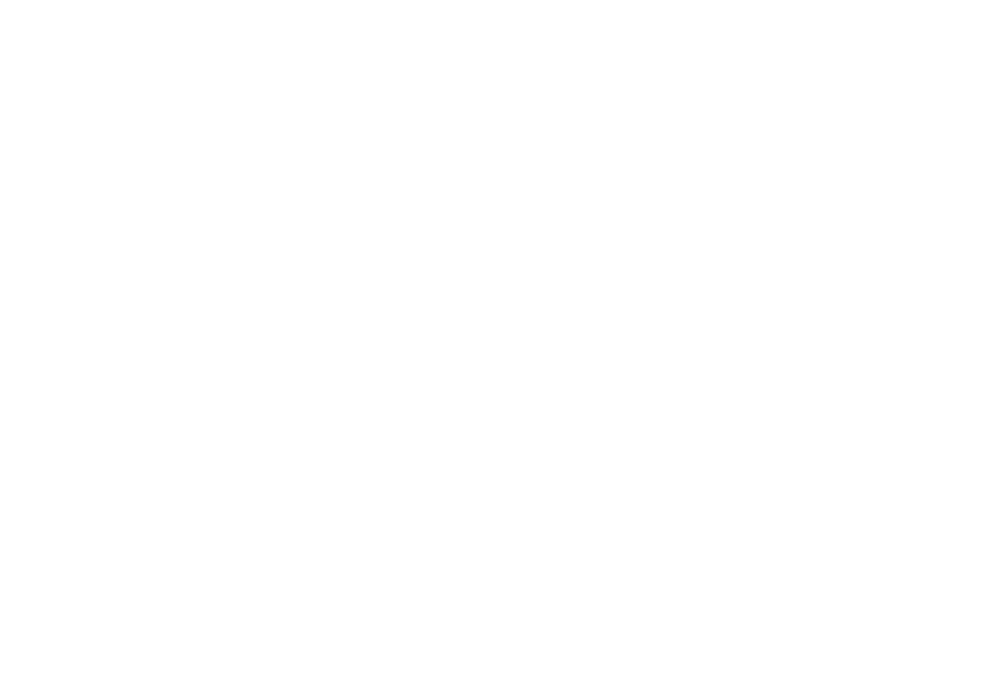

 30%|████████████                             | 59/200 [00:24<00:59,  2.39it/s]

392.0603015075377


<IPython.core.display.Javascript object>


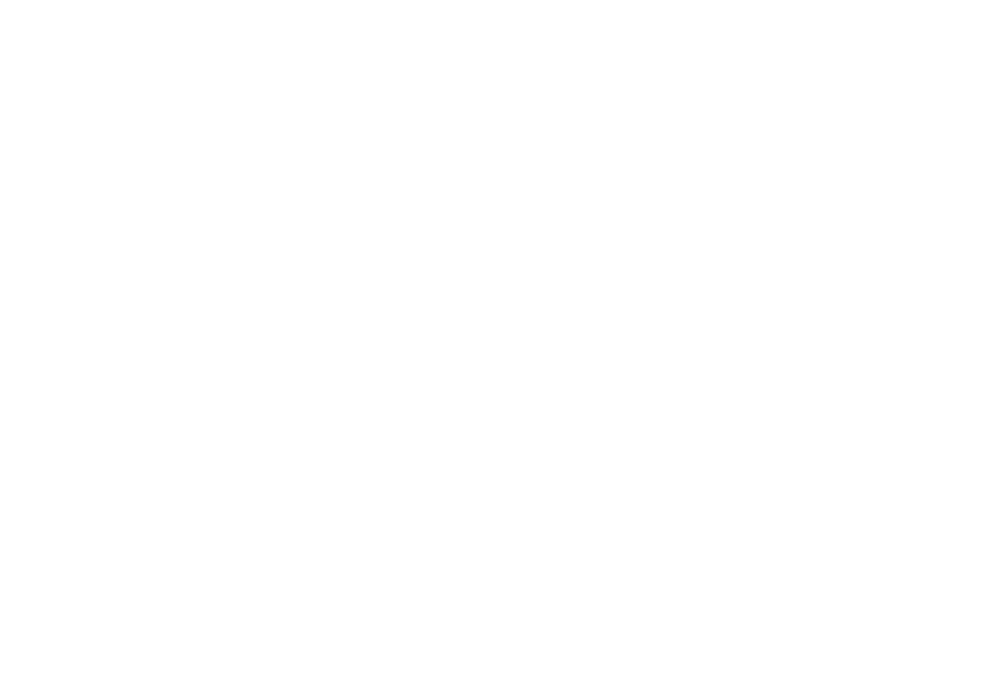

 30%|████████████▎                            | 60/200 [00:25<00:58,  2.40it/s]

398.6884422110553


<IPython.core.display.Javascript object>


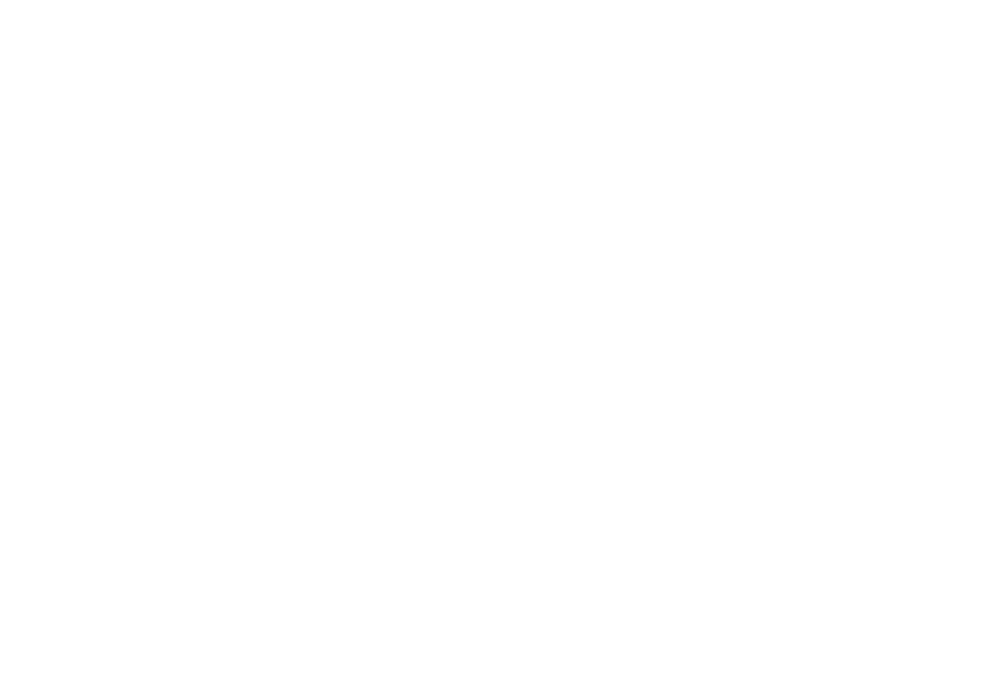

 30%|████████████▌                            | 61/200 [00:25<00:57,  2.41it/s]

405.3165829145729


<IPython.core.display.Javascript object>


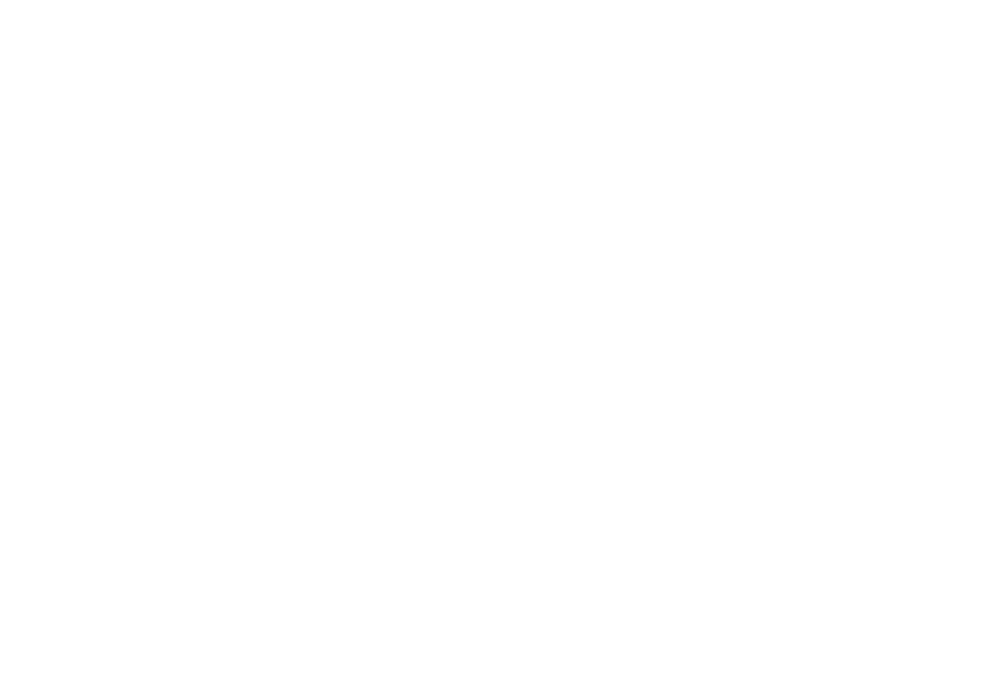

 31%|████████████▋                            | 62/200 [00:25<00:57,  2.42it/s]

411.94472361809045


<IPython.core.display.Javascript object>


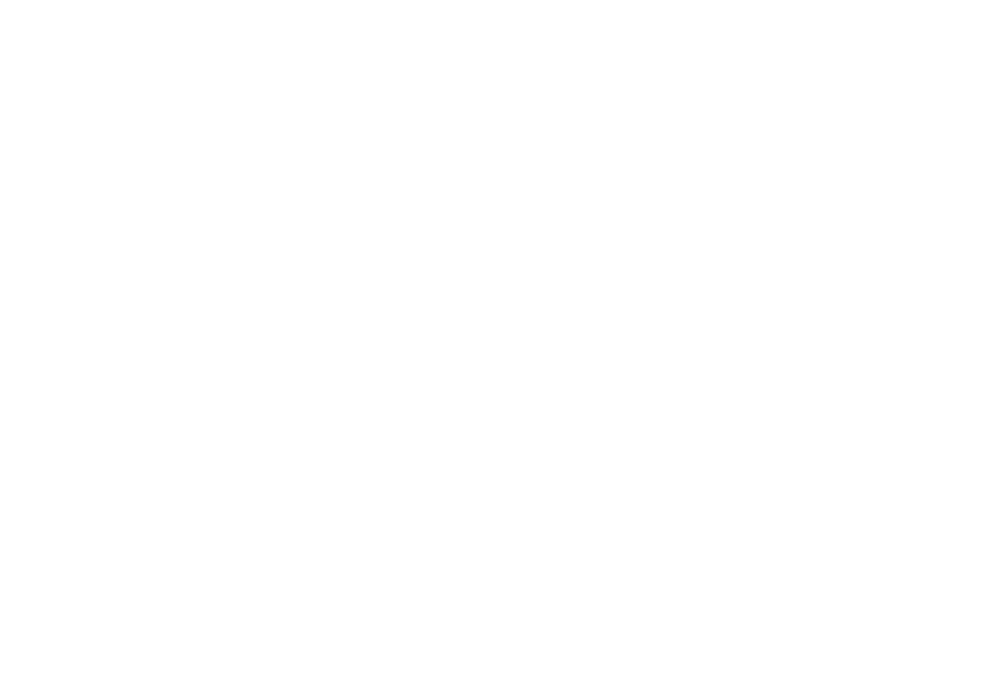

 32%|████████████▉                            | 63/200 [00:25<00:56,  2.43it/s]

418.57286432160805


<IPython.core.display.Javascript object>


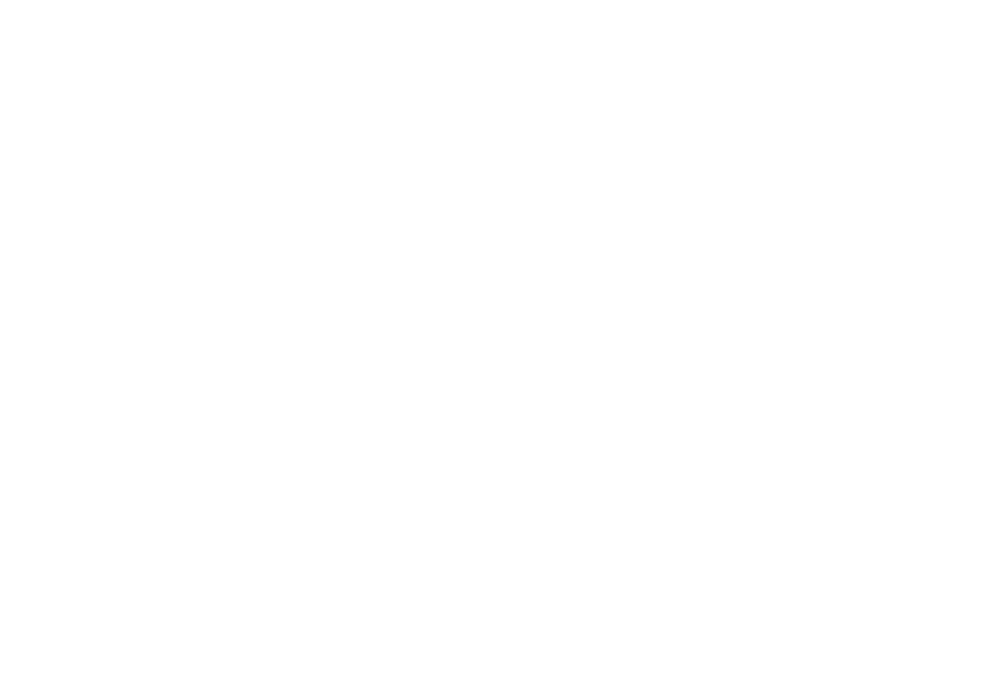

 32%|█████████████                            | 64/200 [00:26<00:55,  2.43it/s]

425.20100502512565


<IPython.core.display.Javascript object>


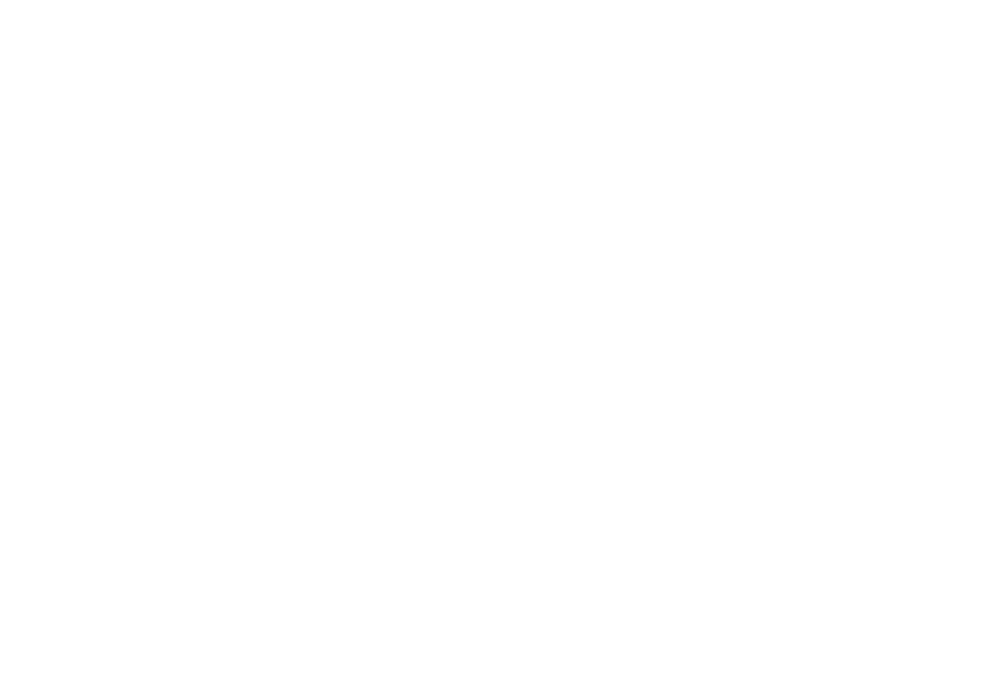

 32%|█████████████▎                           | 65/200 [00:26<00:55,  2.44it/s]

431.82914572864325


<IPython.core.display.Javascript object>


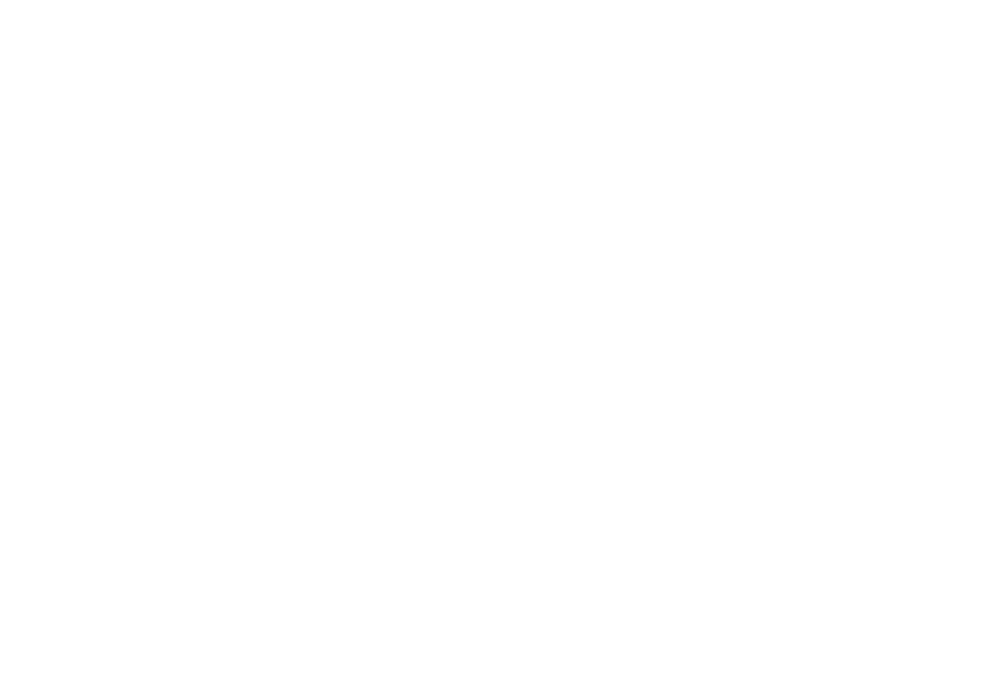

 33%|█████████████▌                           | 66/200 [00:26<00:54,  2.45it/s]

438.45728643216086


<IPython.core.display.Javascript object>


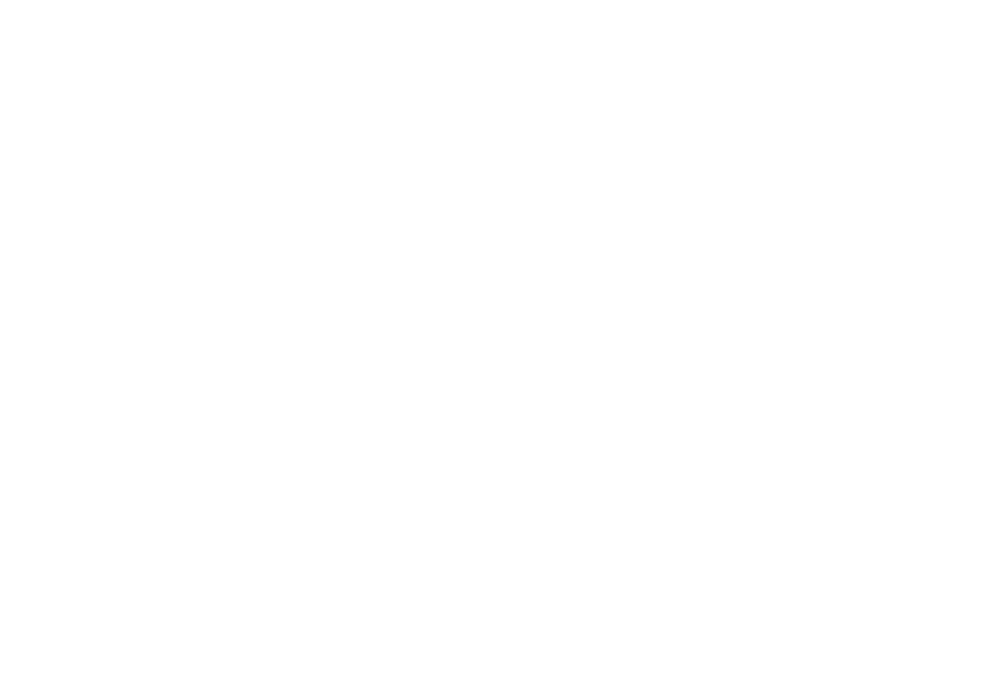

 34%|█████████████▋                           | 67/200 [00:27<00:54,  2.45it/s]

445.0854271356784


<IPython.core.display.Javascript object>


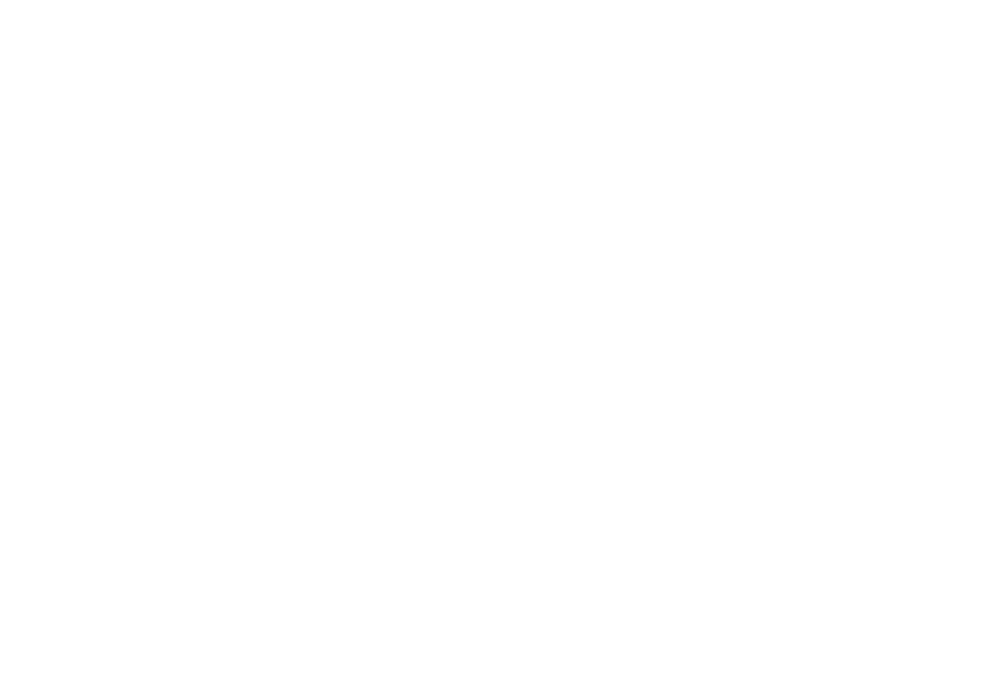

 34%|█████████████▉                           | 68/200 [00:27<00:53,  2.46it/s]

451.713567839196


<IPython.core.display.Javascript object>


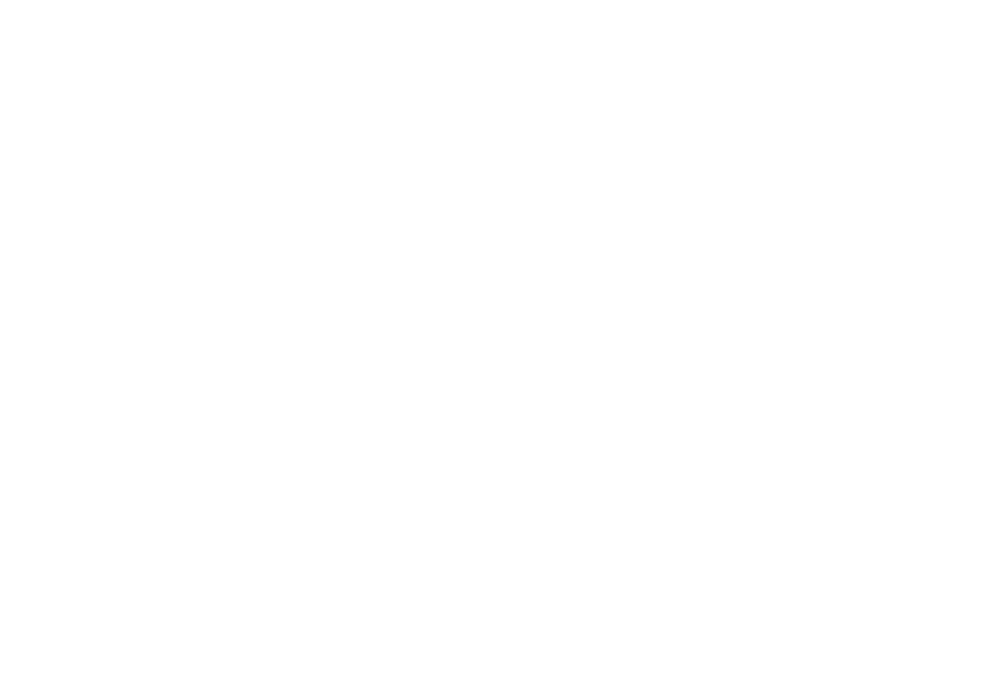

 34%|██████████████▏                          | 69/200 [00:27<00:53,  2.47it/s]

458.3417085427136


<IPython.core.display.Javascript object>


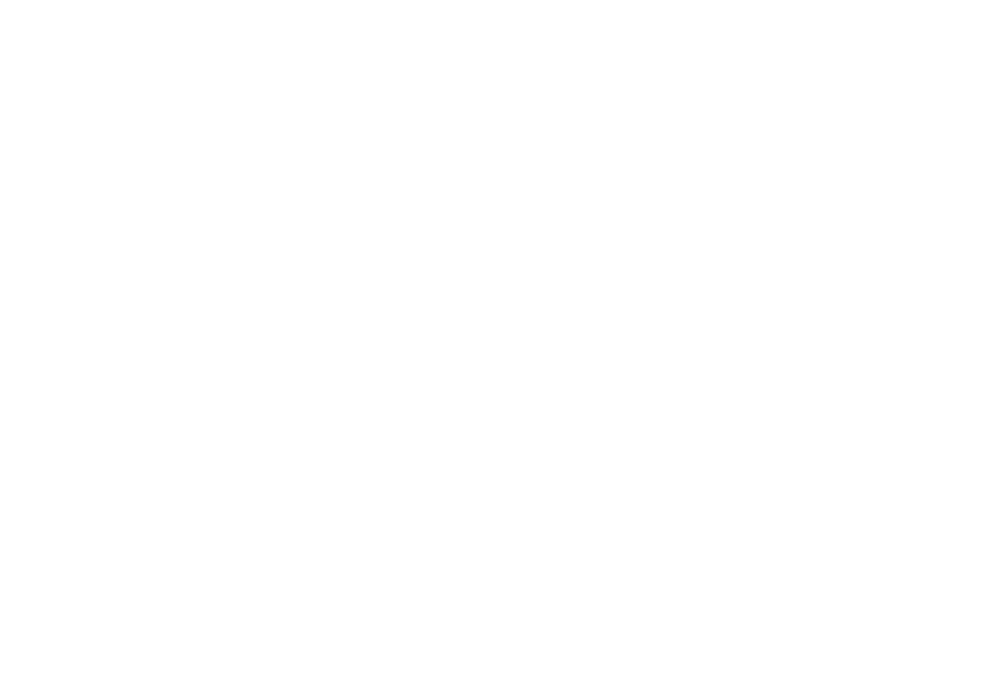

 35%|██████████████▎                          | 70/200 [00:28<00:52,  2.47it/s]

464.9698492462312


<IPython.core.display.Javascript object>


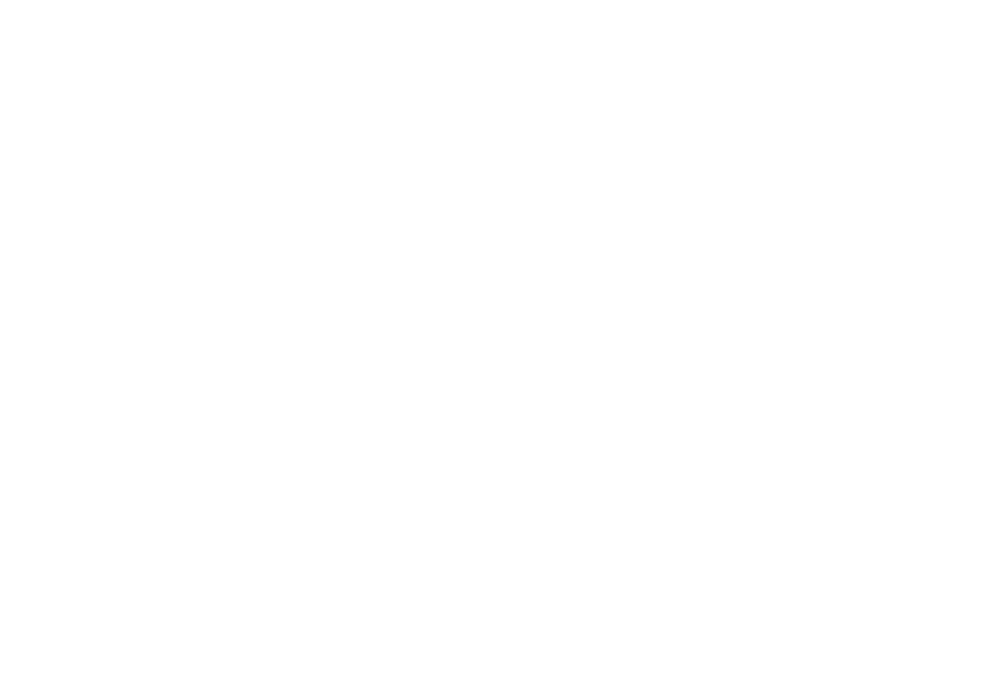

 36%|██████████████▌                          | 71/200 [00:28<00:52,  2.48it/s]

471.59798994974875


<IPython.core.display.Javascript object>


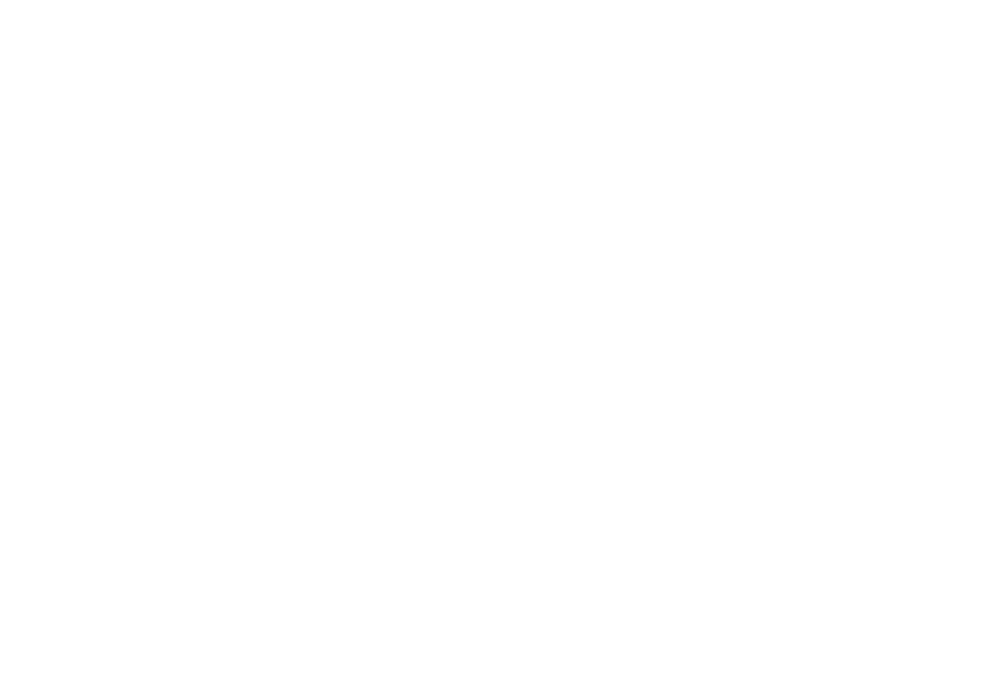

 36%|██████████████▊                          | 72/200 [00:28<00:51,  2.48it/s]

478.22613065326635


<IPython.core.display.Javascript object>


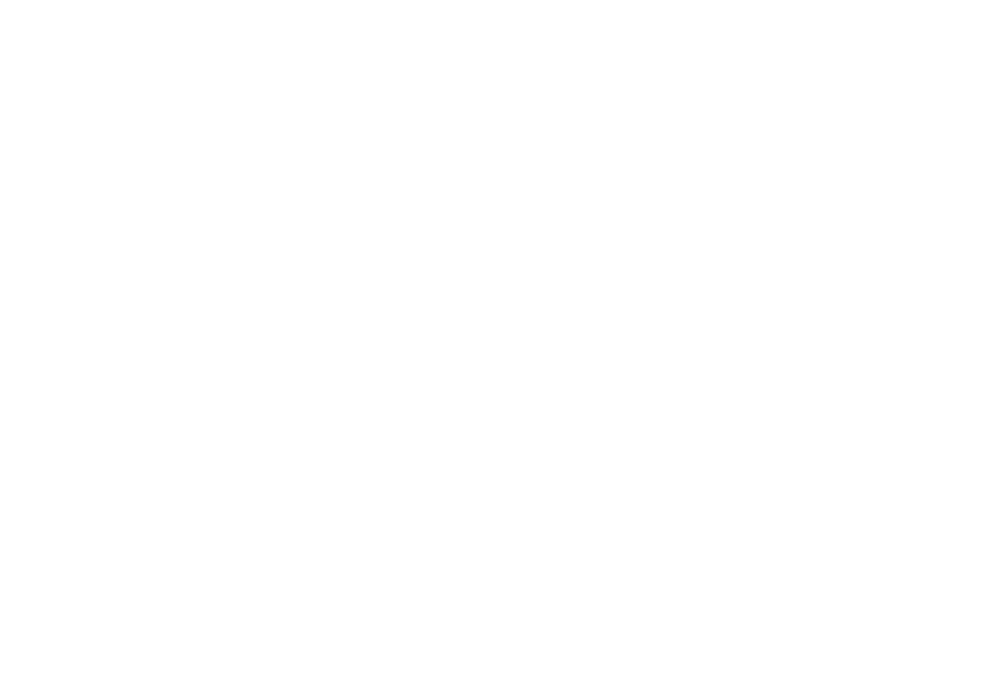

 36%|██████████████▉                          | 73/200 [00:29<00:51,  2.49it/s]

484.85427135678395


<IPython.core.display.Javascript object>


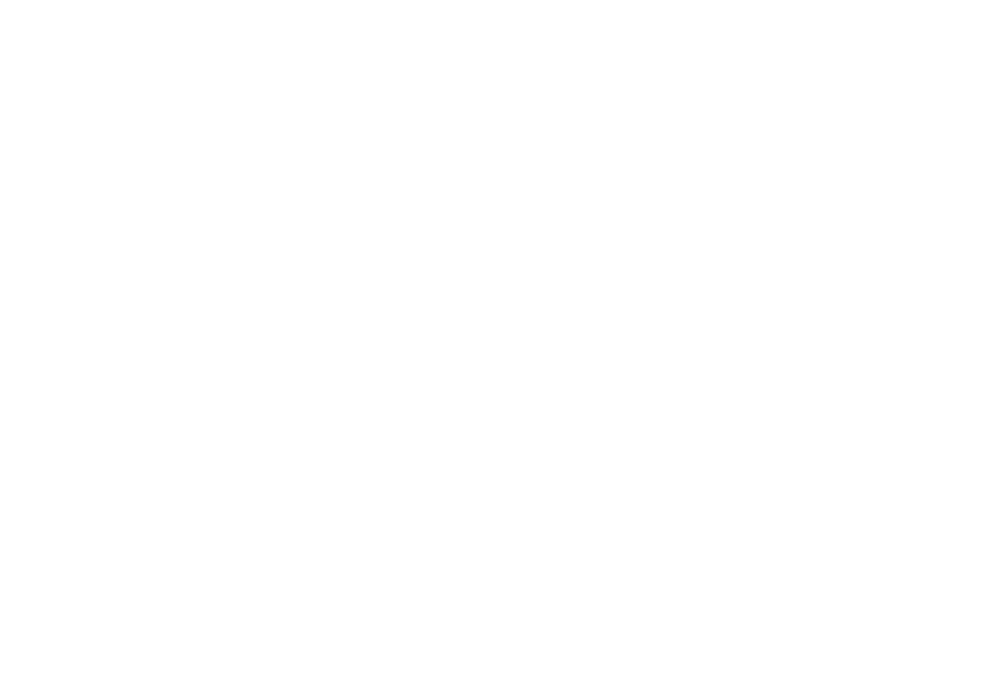

 37%|███████████████▏                         | 74/200 [00:29<00:50,  2.49it/s]

491.48241206030156


<IPython.core.display.Javascript object>


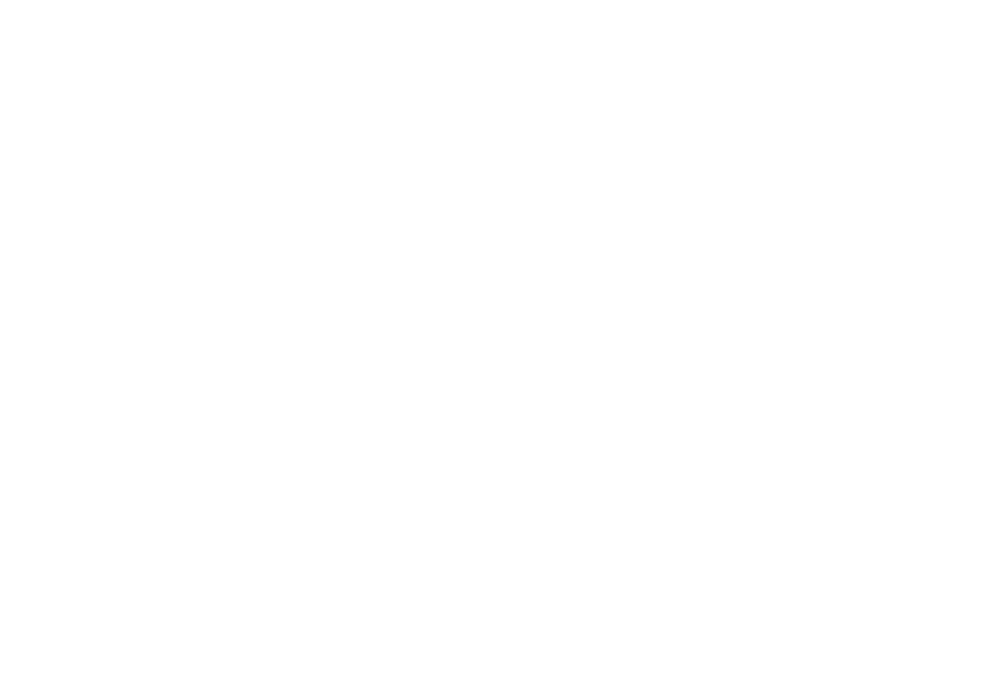

 38%|███████████████▍                         | 75/200 [00:30<00:50,  2.49it/s]

498.1105527638191


<IPython.core.display.Javascript object>


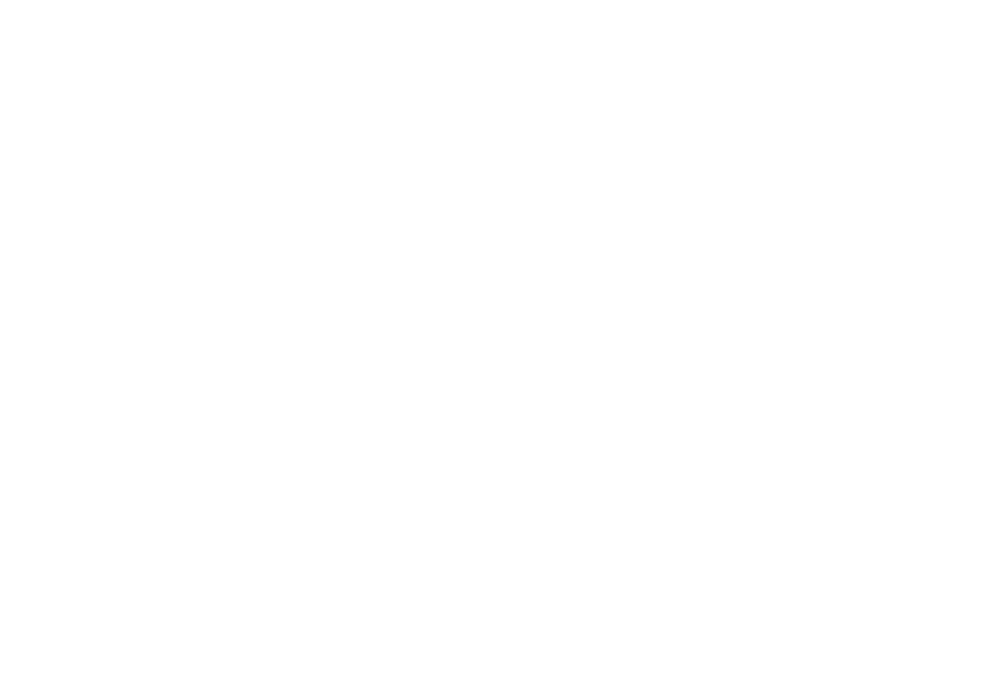

 38%|███████████████▌                         | 76/200 [00:30<00:49,  2.50it/s]

504.7386934673367


<IPython.core.display.Javascript object>


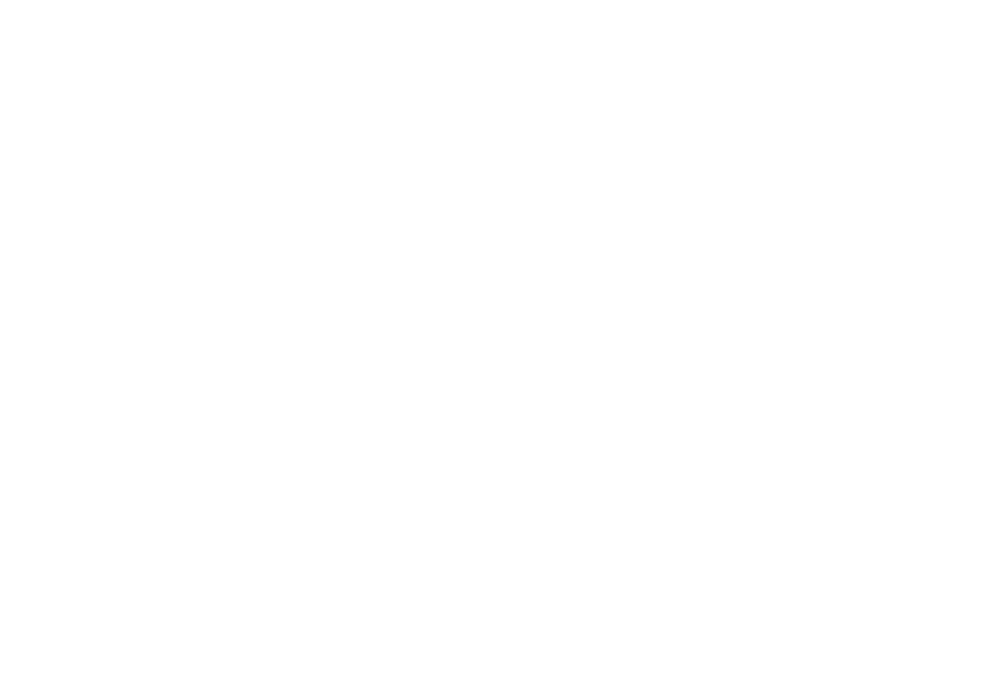

 38%|███████████████▊                         | 77/200 [00:30<00:49,  2.50it/s]

511.3668341708543


<IPython.core.display.Javascript object>


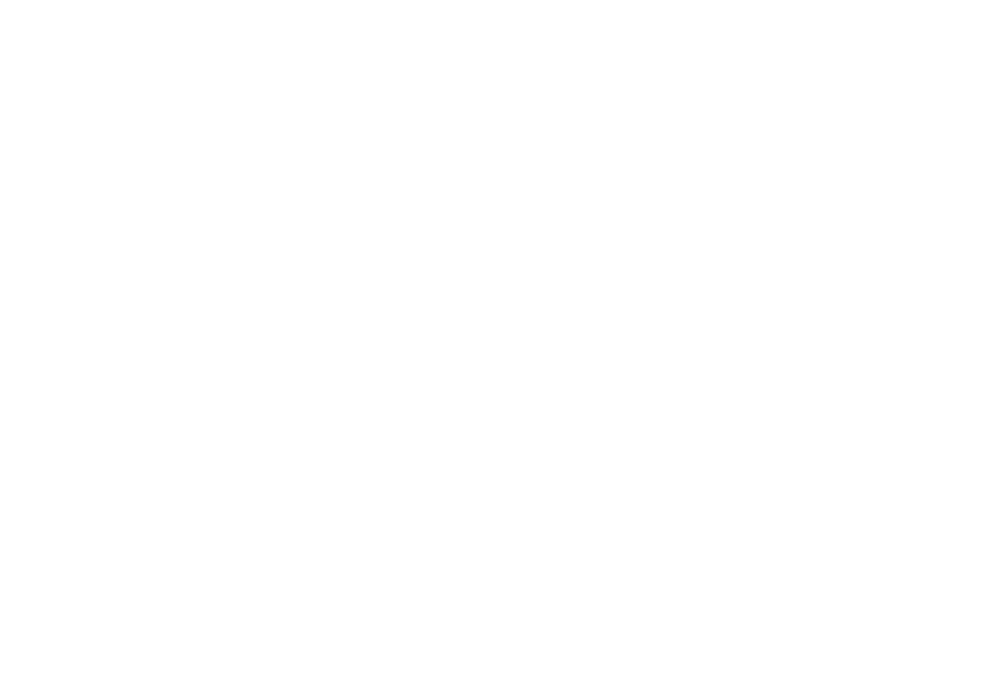

 39%|███████████████▉                         | 78/200 [00:31<00:48,  2.51it/s]

517.9949748743719


<IPython.core.display.Javascript object>


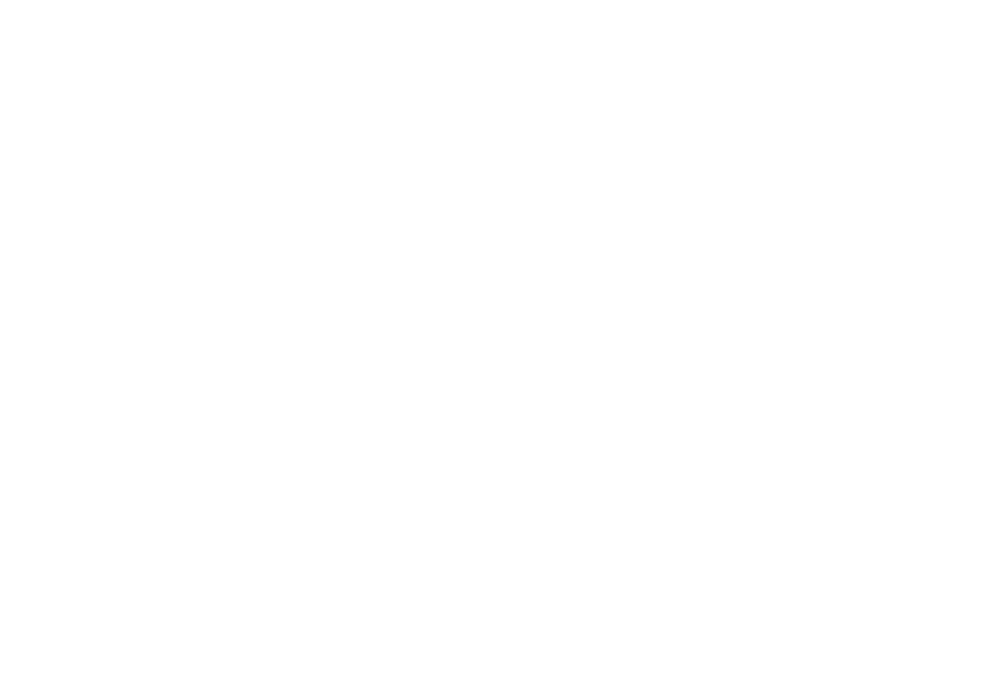

 40%|████████████████▏                        | 79/200 [00:31<00:48,  2.52it/s]

524.6231155778895


<IPython.core.display.Javascript object>


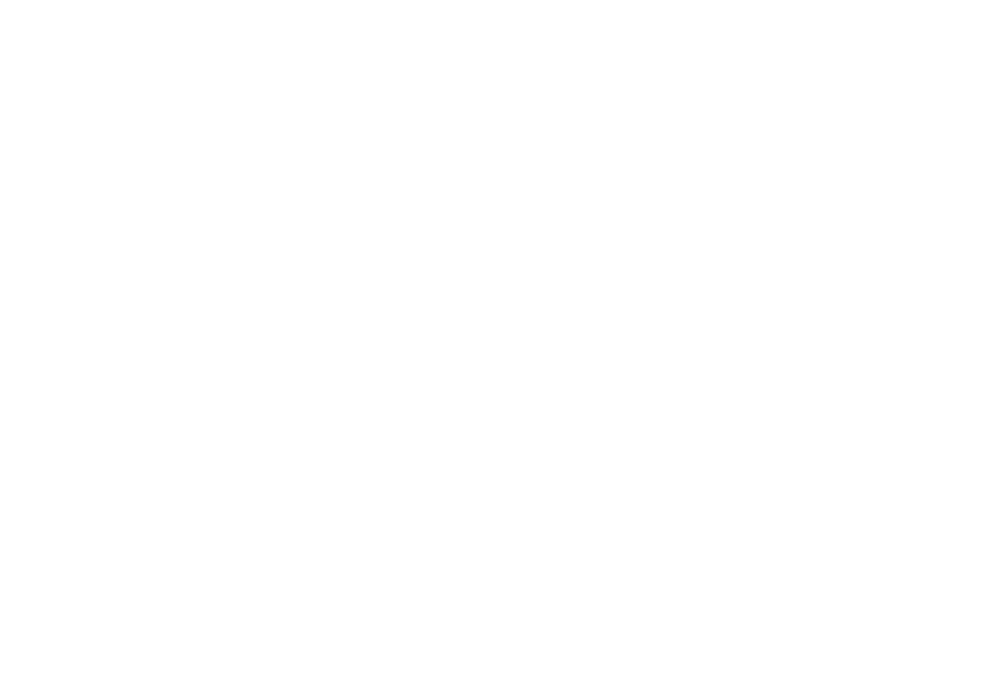

 40%|████████████████▍                        | 80/200 [00:31<00:47,  2.52it/s]

531.2512562814071


<IPython.core.display.Javascript object>


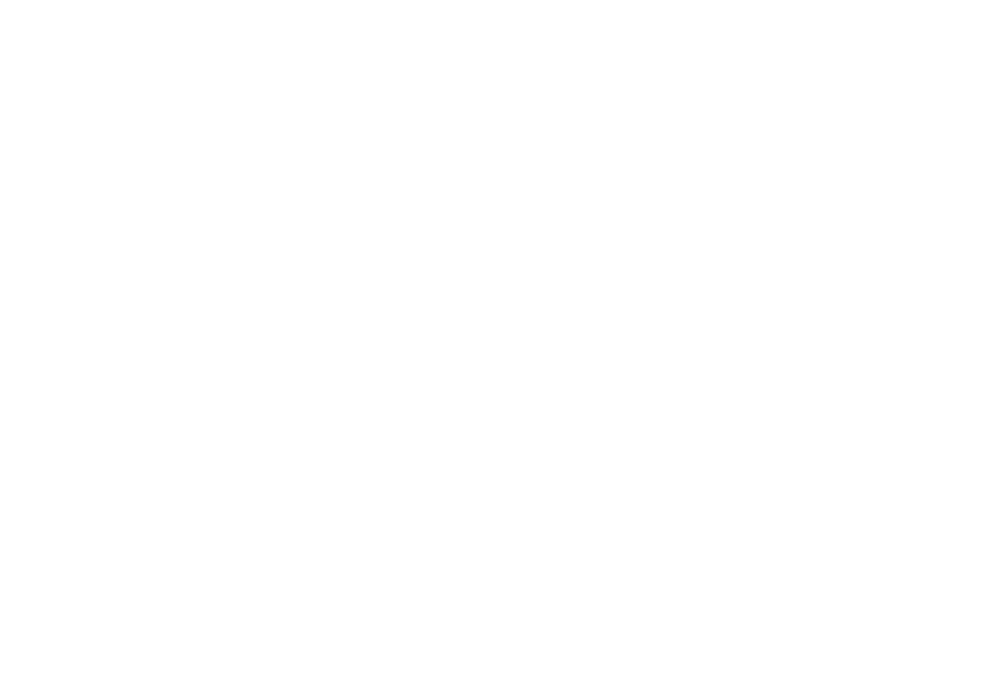

 40%|████████████████▌                        | 81/200 [00:32<00:47,  2.52it/s]

537.8793969849247


<IPython.core.display.Javascript object>


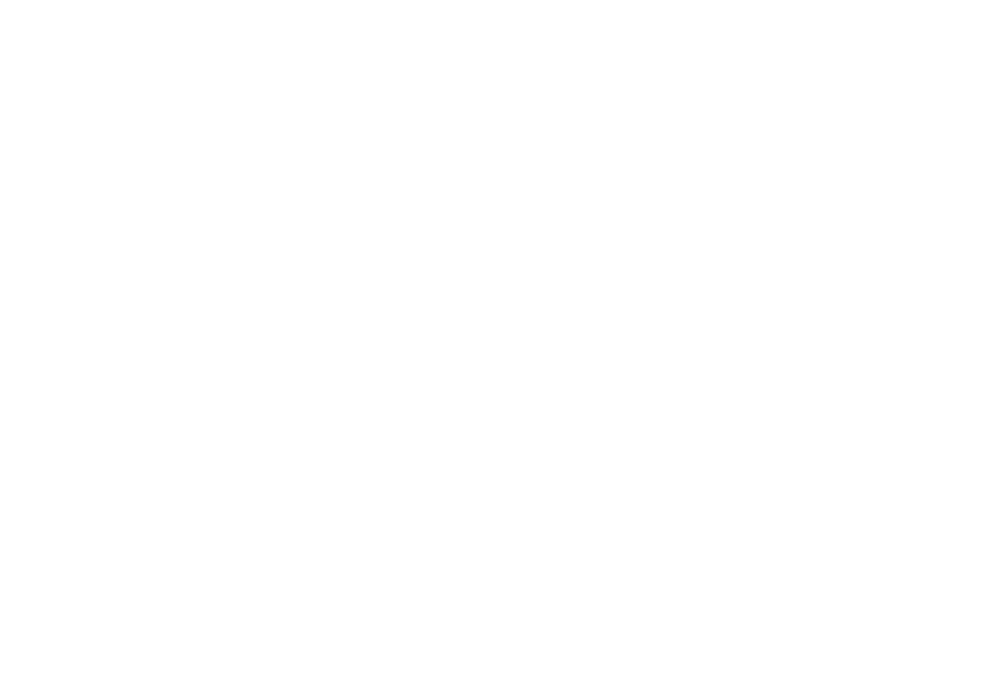

 41%|████████████████▊                        | 82/200 [00:32<00:46,  2.53it/s]

544.5075376884422


<IPython.core.display.Javascript object>


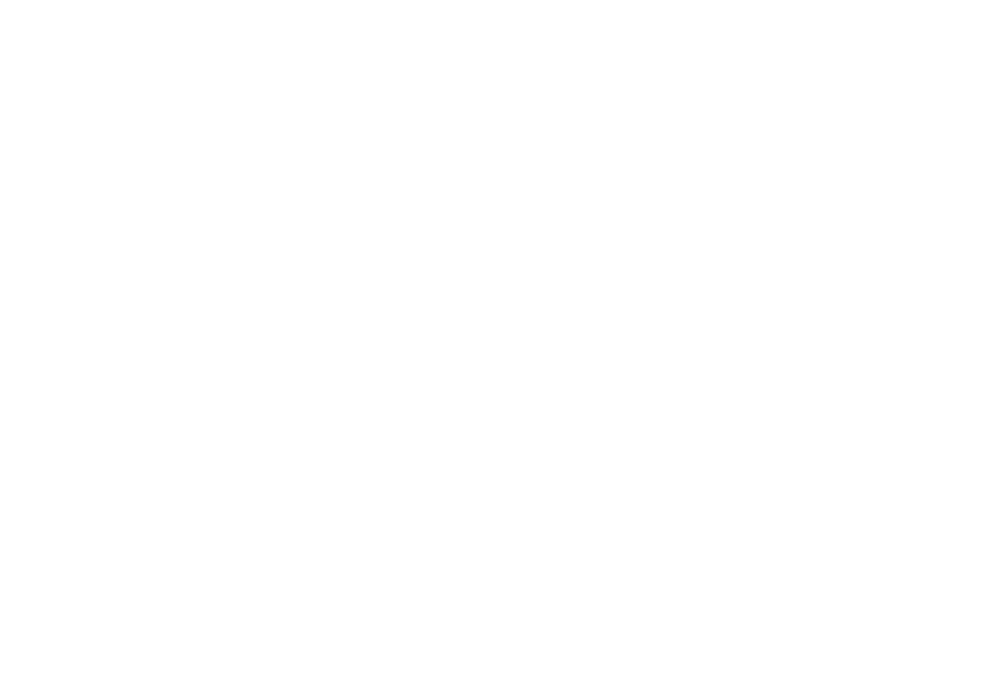

 42%|█████████████████                        | 83/200 [00:32<00:46,  2.53it/s]

551.1356783919598


<IPython.core.display.Javascript object>


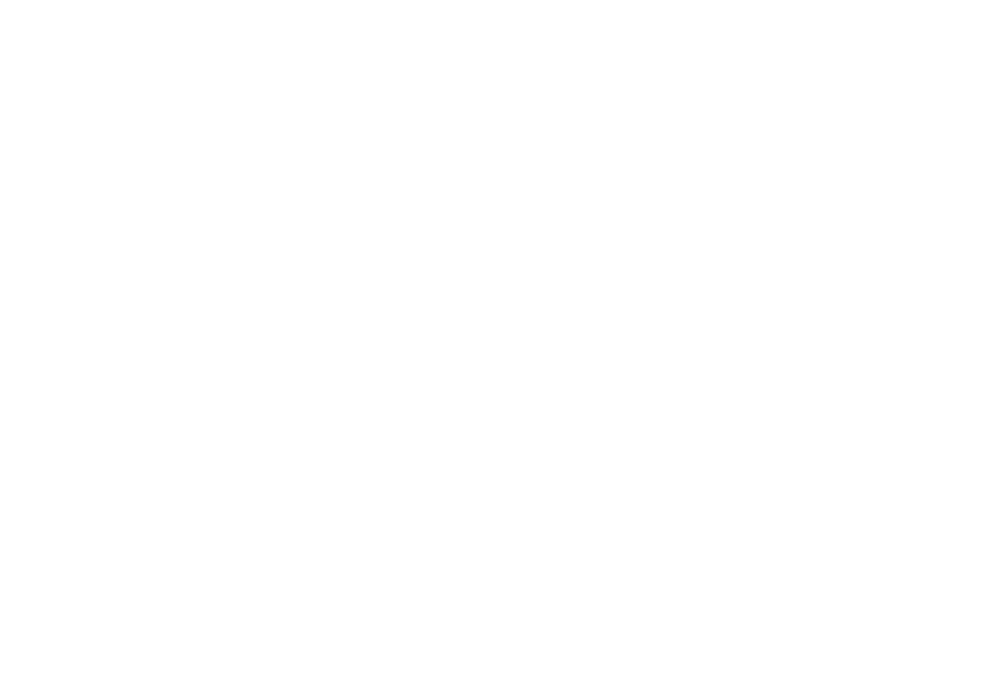

 42%|█████████████████▏                       | 84/200 [00:33<00:45,  2.54it/s]

557.7638190954774


<IPython.core.display.Javascript object>


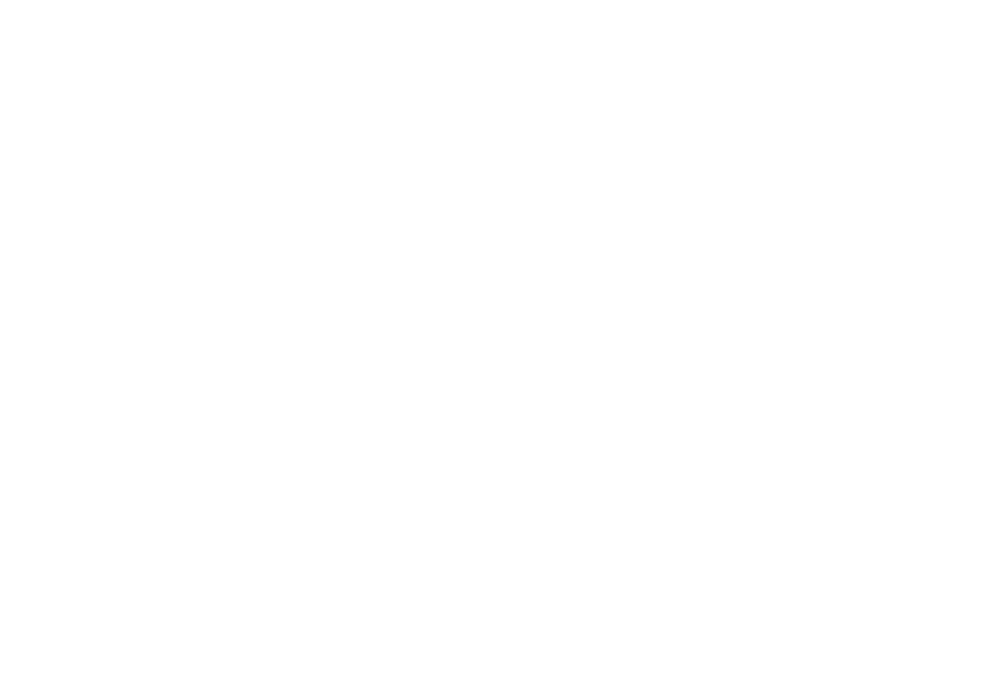

 42%|█████████████████▍                       | 85/200 [00:33<00:45,  2.55it/s]

564.391959798995


<IPython.core.display.Javascript object>


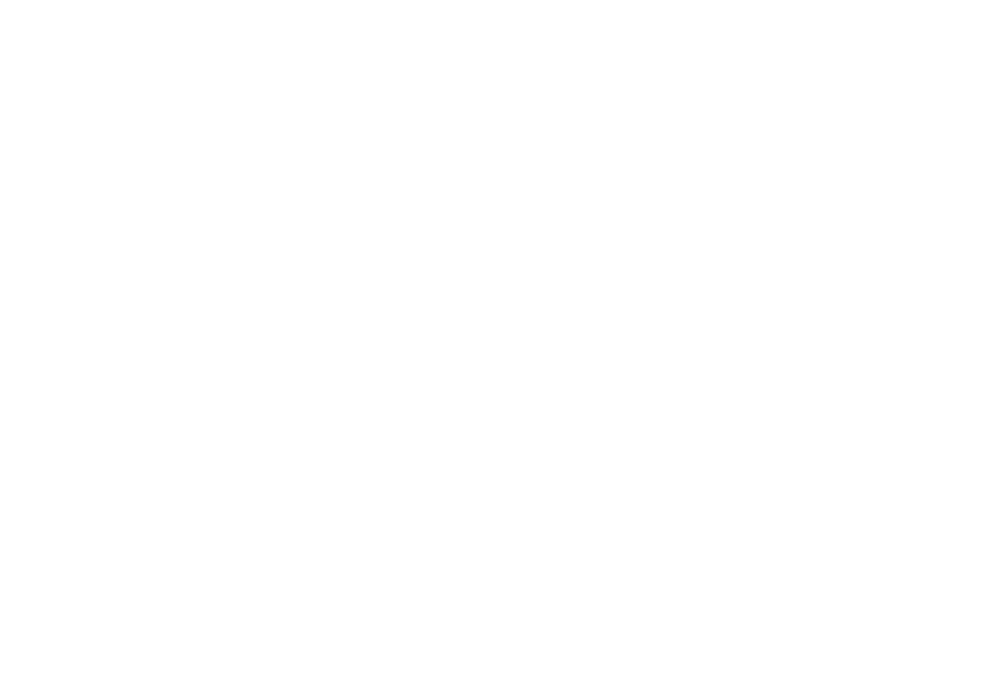

 43%|█████████████████▋                       | 86/200 [00:33<00:44,  2.55it/s]

571.0201005025126


<IPython.core.display.Javascript object>


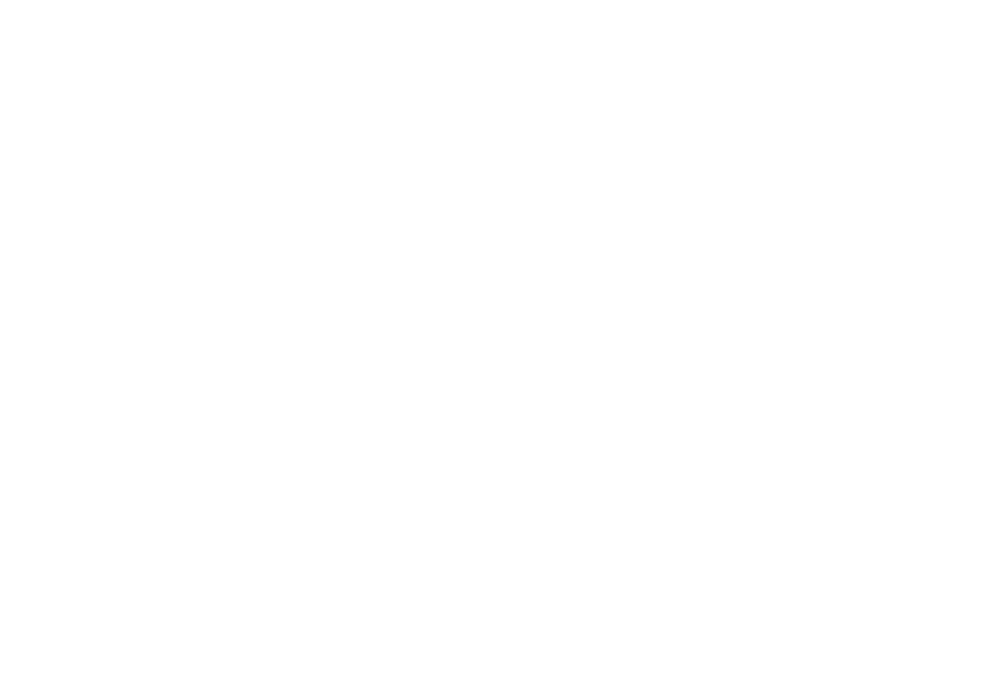

 44%|█████████████████▊                       | 87/200 [00:34<00:44,  2.55it/s]

577.6482412060302


<IPython.core.display.Javascript object>


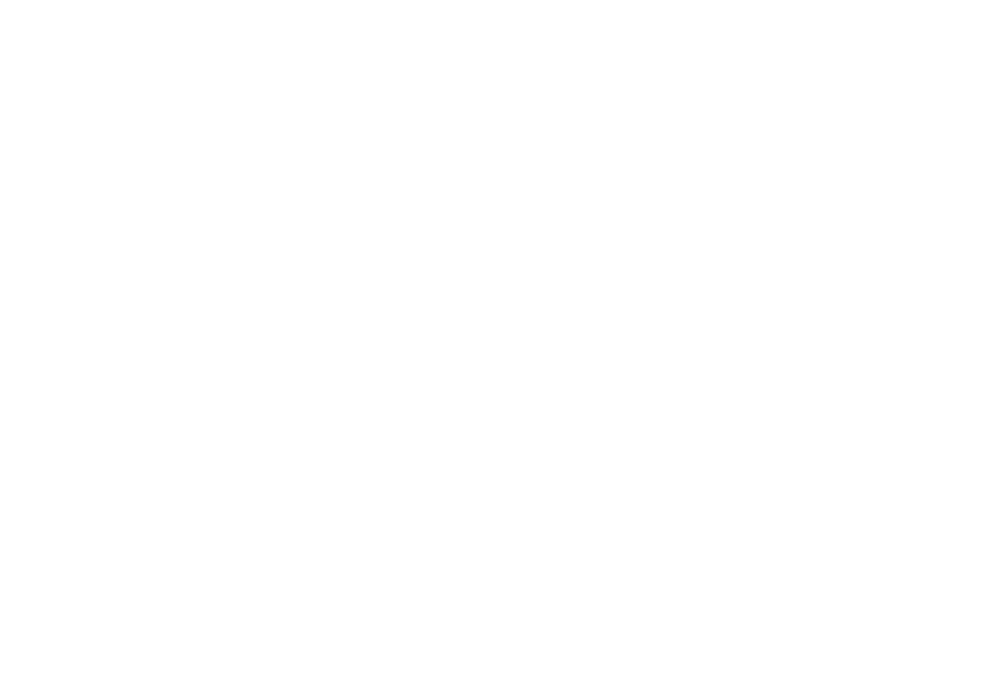

 44%|██████████████████                       | 88/200 [00:34<00:43,  2.55it/s]

584.2763819095478


<IPython.core.display.Javascript object>


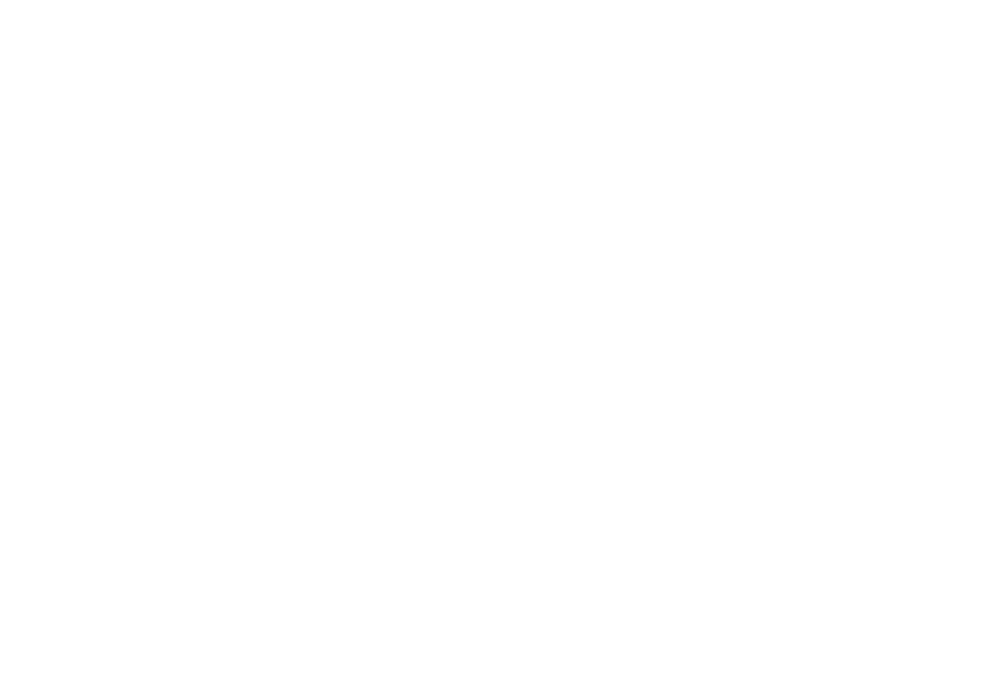

 44%|██████████████████▏                      | 89/200 [00:34<00:43,  2.55it/s]

590.9045226130654


<IPython.core.display.Javascript object>


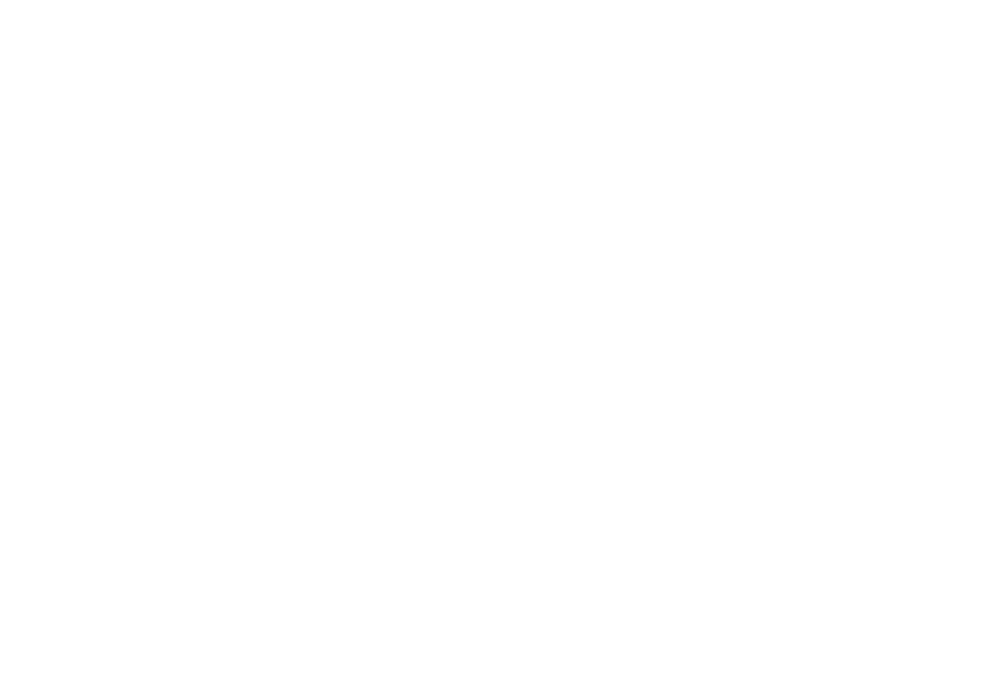

 45%|██████████████████▍                      | 90/200 [00:35<00:43,  2.56it/s]

597.5326633165829


<IPython.core.display.Javascript object>


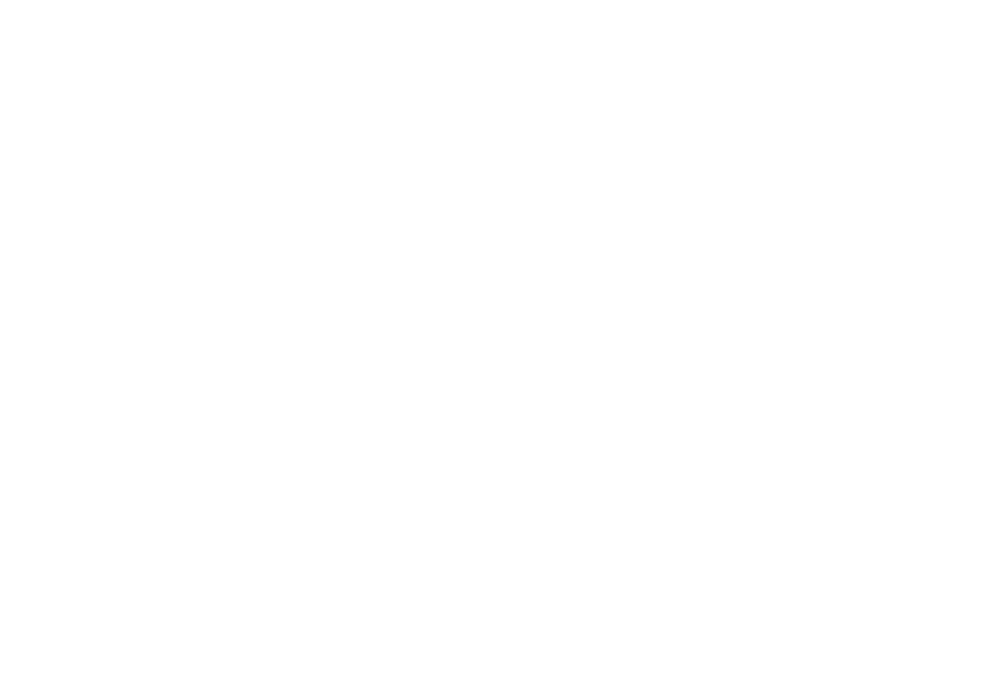

 46%|██████████████████▋                      | 91/200 [00:35<00:42,  2.56it/s]

604.1608040201005


<IPython.core.display.Javascript object>


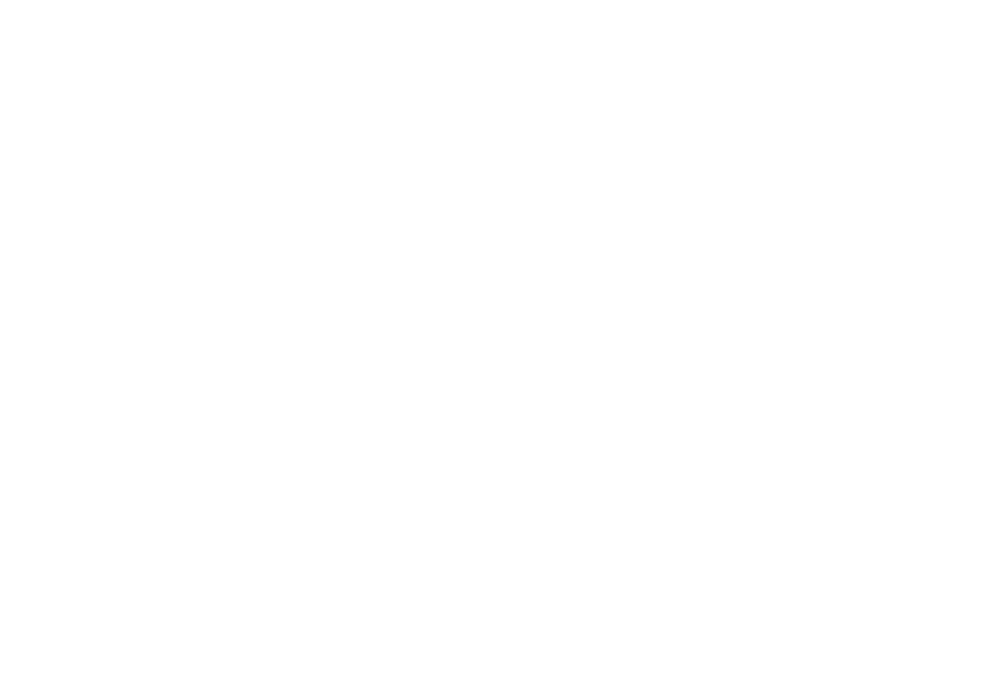

 46%|██████████████████▊                      | 92/200 [00:35<00:42,  2.57it/s]

610.7889447236181


<IPython.core.display.Javascript object>


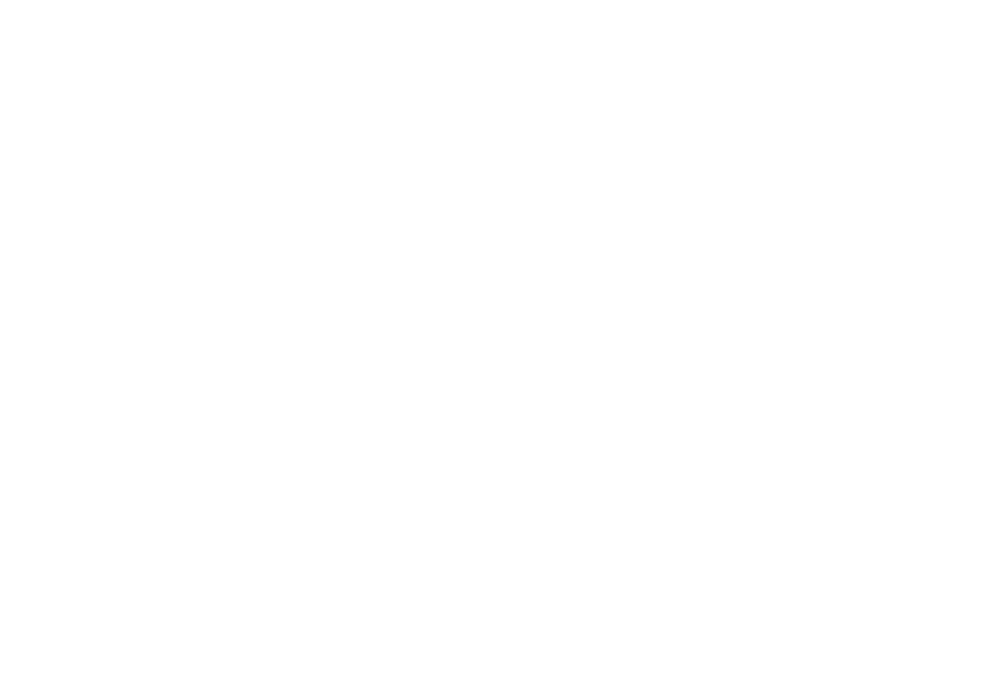

 46%|███████████████████                      | 93/200 [00:36<00:41,  2.57it/s]

617.4170854271357


<IPython.core.display.Javascript object>


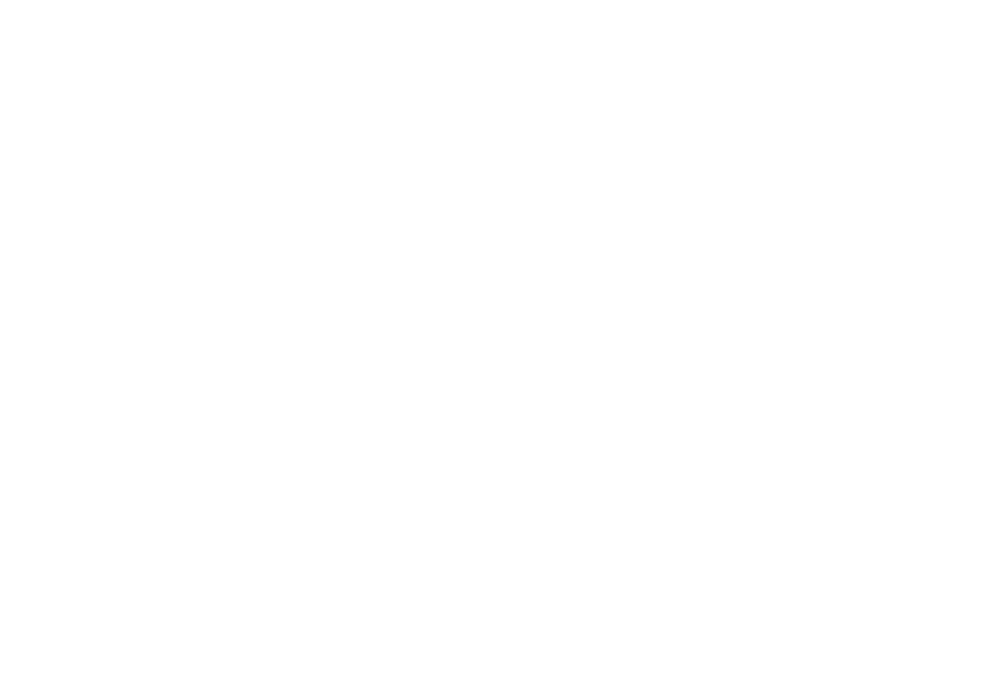

 47%|███████████████████▎                     | 94/200 [00:36<00:41,  2.57it/s]

624.0452261306533


<IPython.core.display.Javascript object>


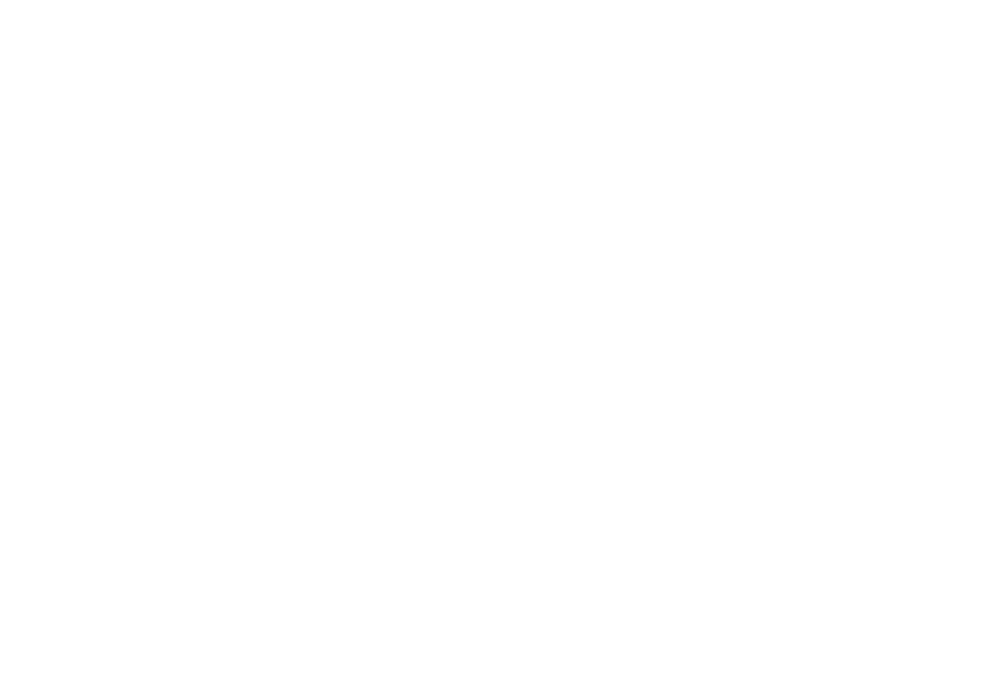

 48%|███████████████████▍                     | 95/200 [00:36<00:40,  2.58it/s]

630.6733668341709


<IPython.core.display.Javascript object>


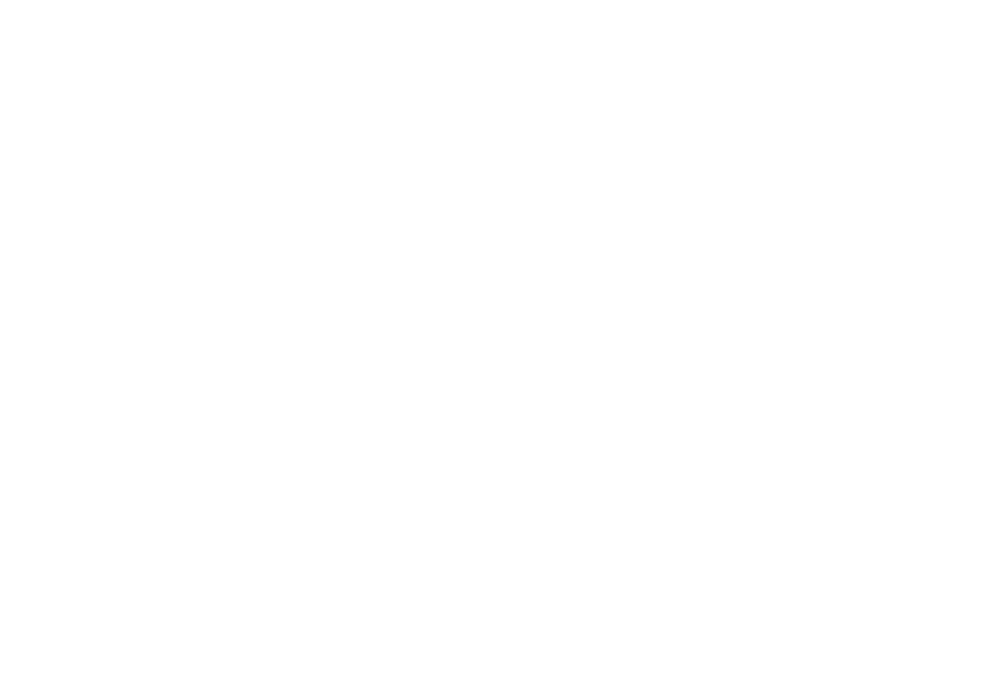

 48%|███████████████████▋                     | 96/200 [00:37<00:40,  2.58it/s]

637.3015075376885


<IPython.core.display.Javascript object>


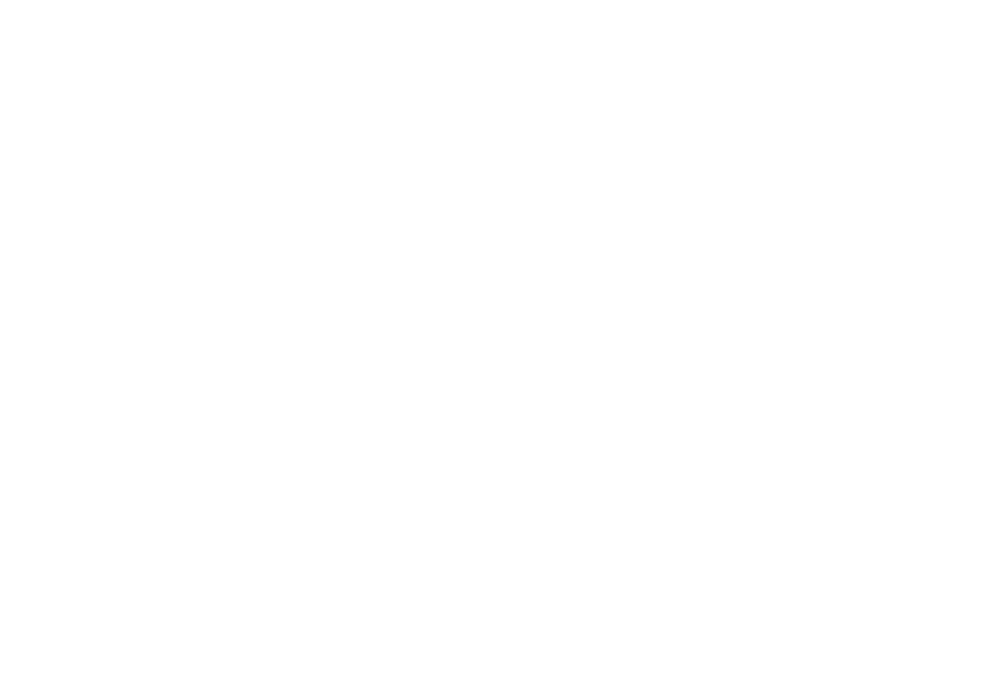

 48%|███████████████████▉                     | 97/200 [00:37<00:39,  2.58it/s]

643.9296482412061


<IPython.core.display.Javascript object>


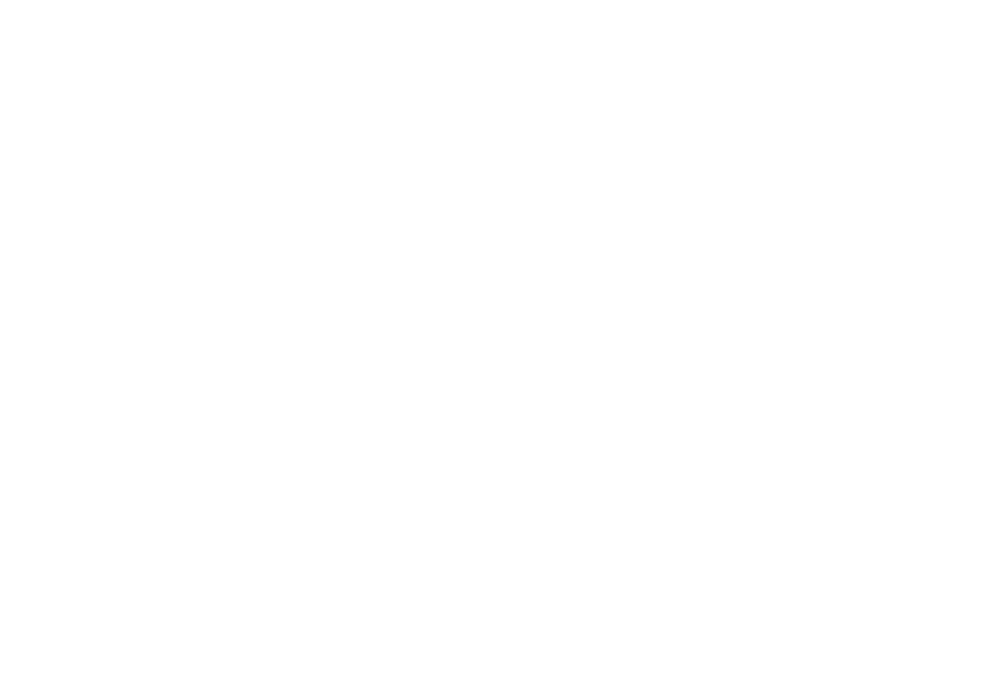

 49%|████████████████████                     | 98/200 [00:37<00:39,  2.58it/s]

650.5577889447237


<IPython.core.display.Javascript object>


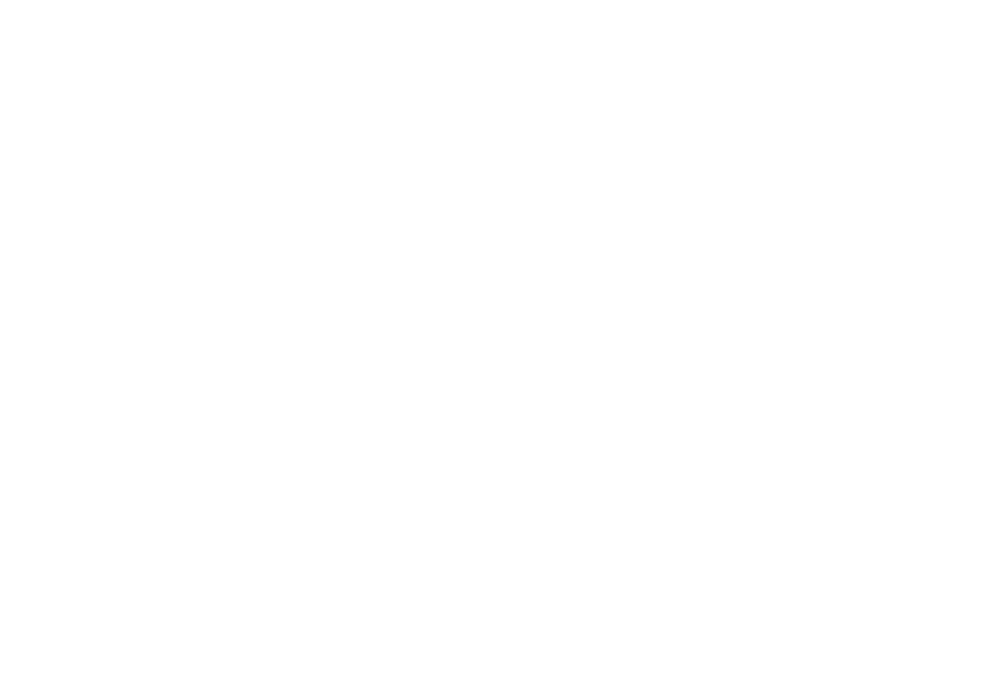

 50%|████████████████████▎                    | 99/200 [00:38<00:39,  2.59it/s]

657.1859296482412


<IPython.core.display.Javascript object>


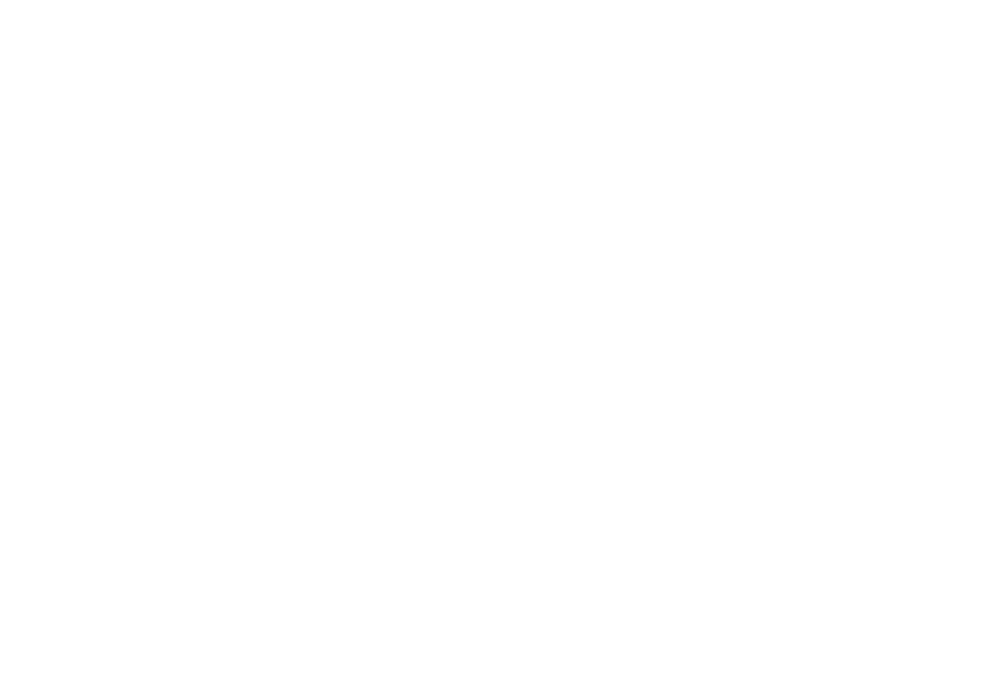

 50%|████████████████████                    | 100/200 [00:38<00:38,  2.59it/s]

663.8140703517588


<IPython.core.display.Javascript object>


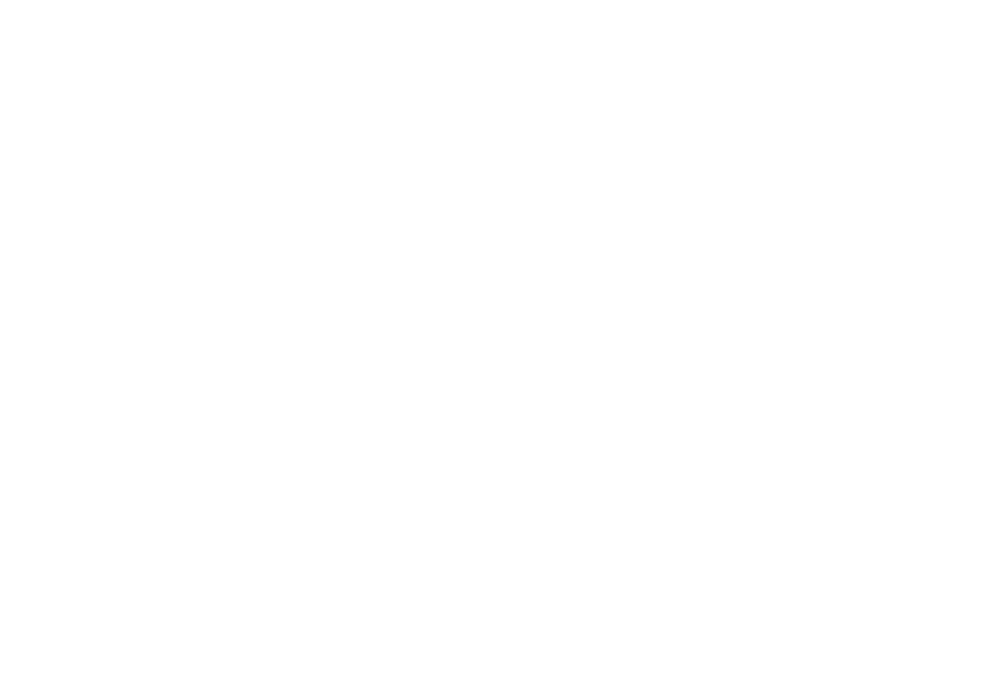

 50%|████████████████████▏                   | 101/200 [00:38<00:38,  2.59it/s]

670.4422110552764


<IPython.core.display.Javascript object>


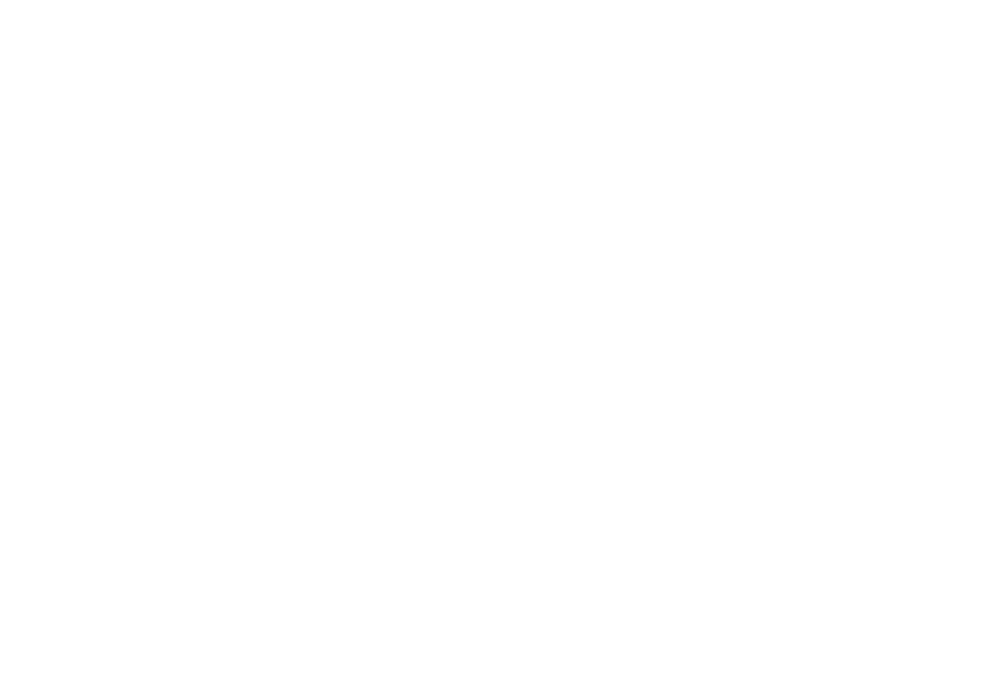

 51%|████████████████████▍                   | 102/200 [00:39<00:37,  2.60it/s]

677.070351758794


<IPython.core.display.Javascript object>


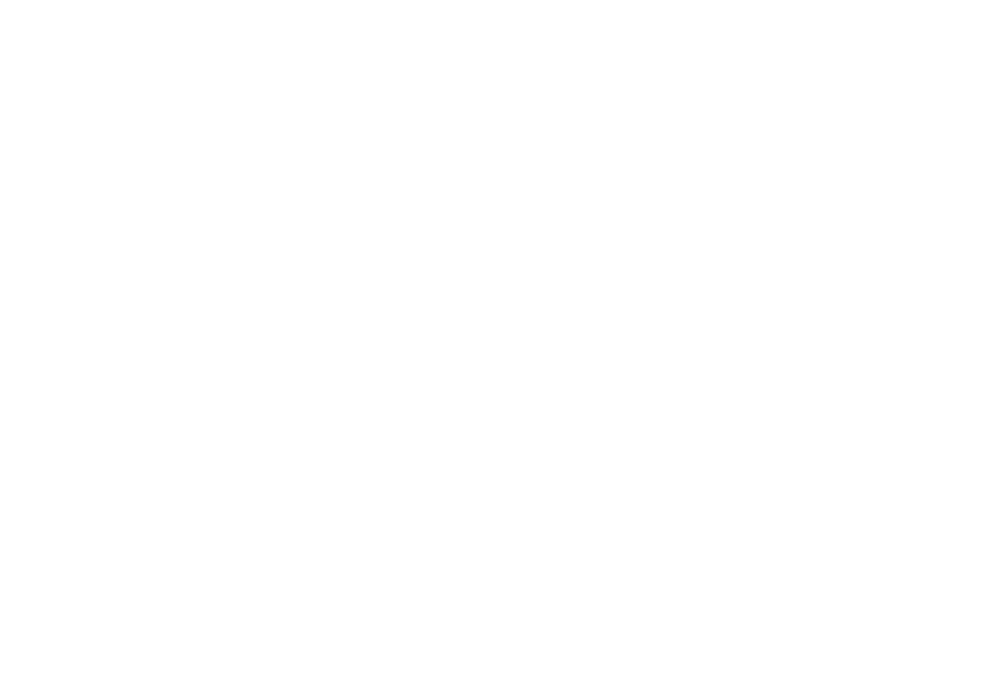

 52%|████████████████████▌                   | 103/200 [00:39<00:37,  2.60it/s]

683.6984924623116


<IPython.core.display.Javascript object>


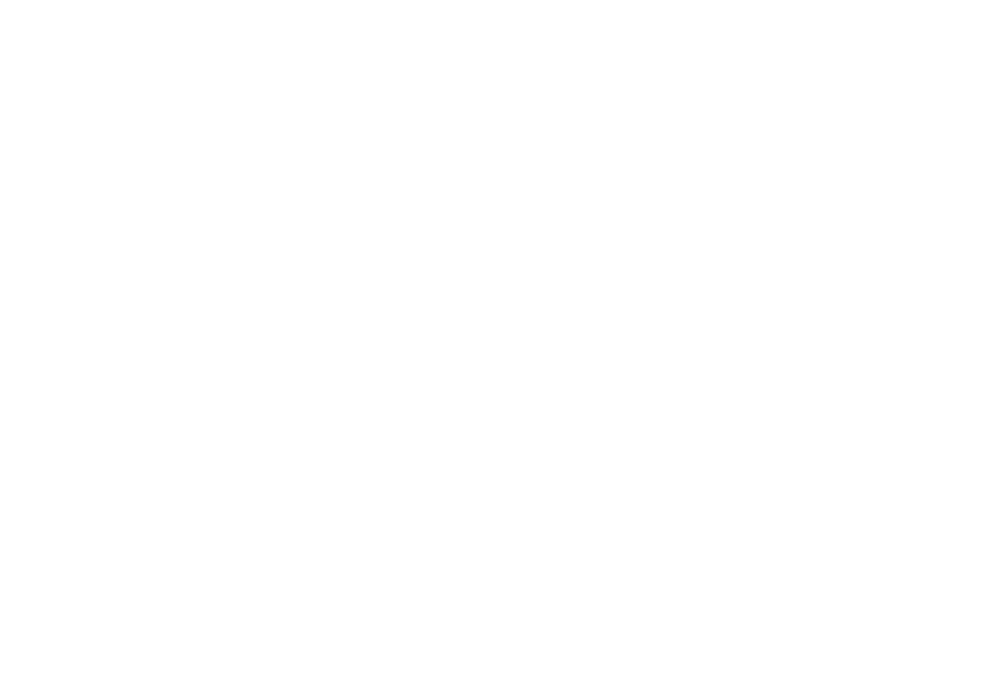

 52%|████████████████████▊                   | 104/200 [00:39<00:36,  2.60it/s]

690.3266331658292


<IPython.core.display.Javascript object>


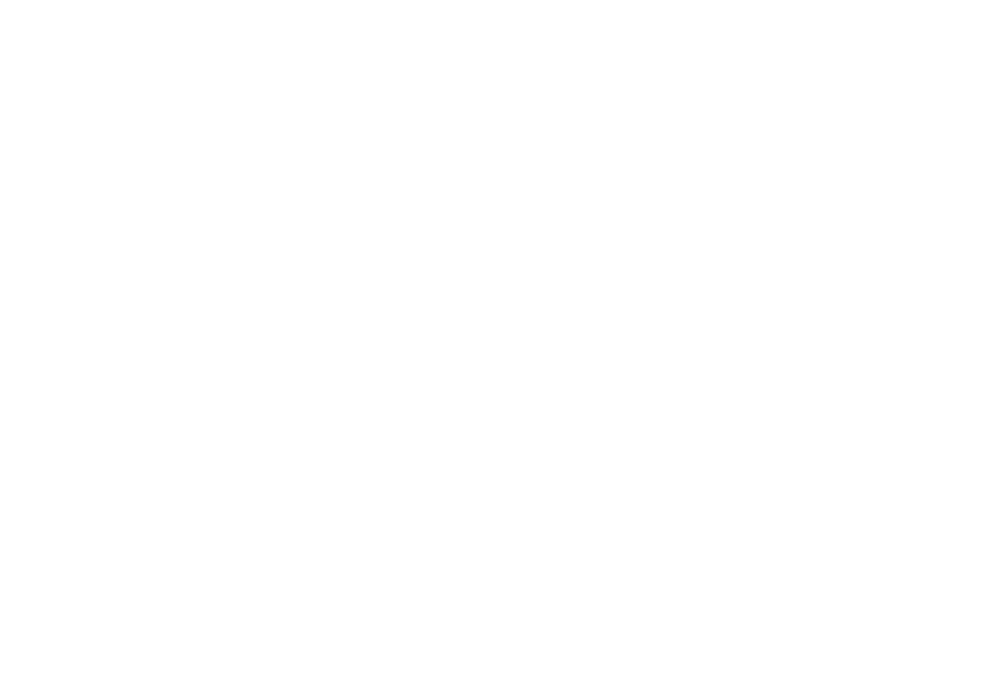

 52%|█████████████████████                   | 105/200 [00:40<00:36,  2.61it/s]

696.9547738693468


<IPython.core.display.Javascript object>


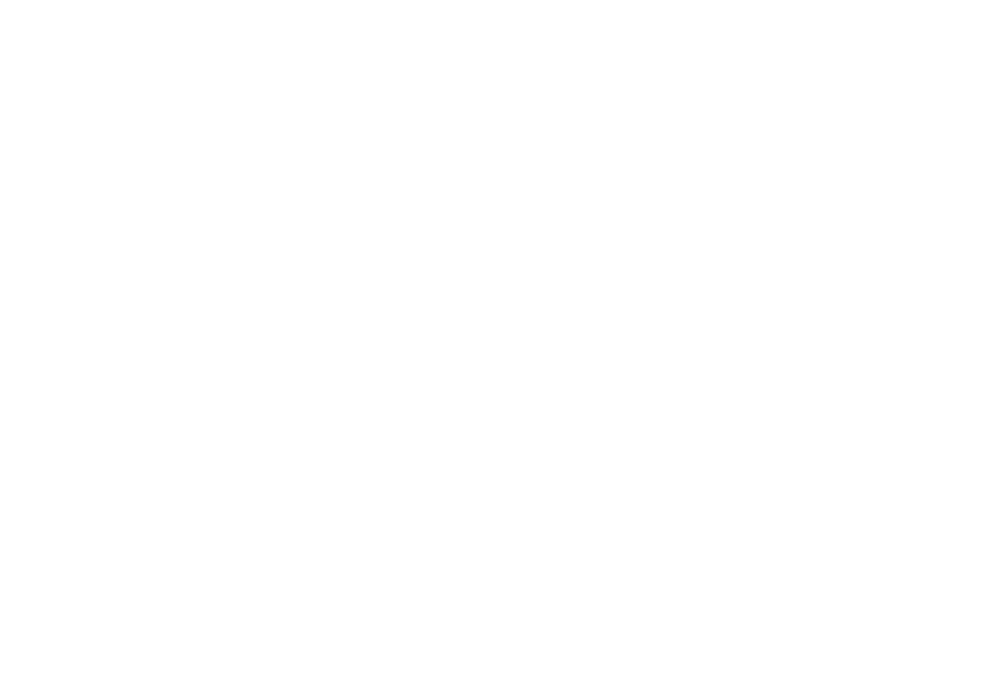

 53%|█████████████████████▏                  | 106/200 [00:40<00:35,  2.61it/s]

703.5829145728644


<IPython.core.display.Javascript object>


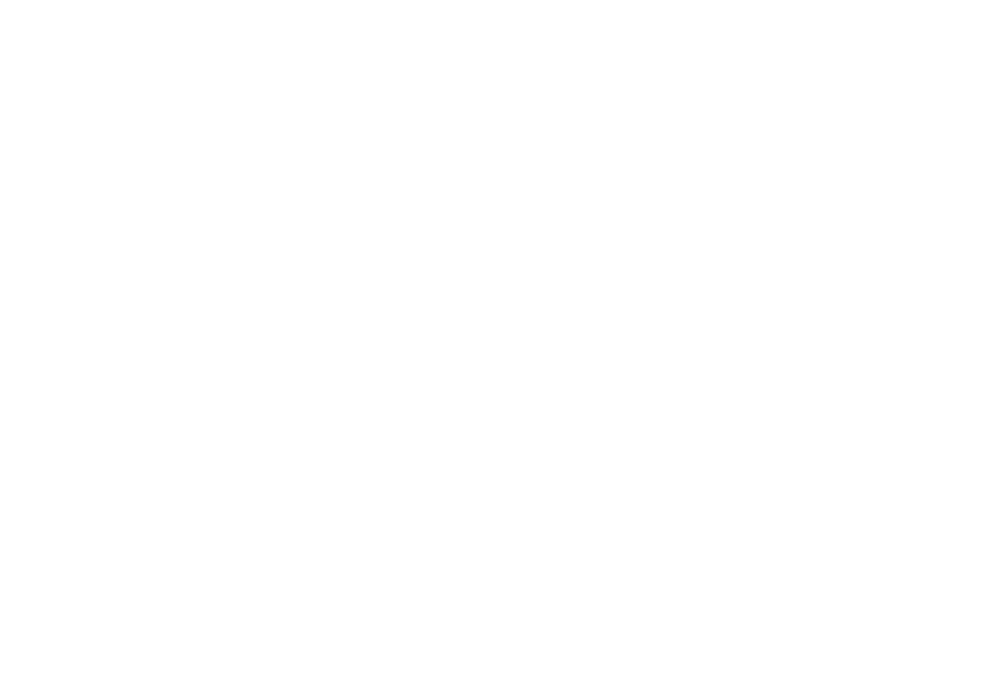

 54%|█████████████████████▍                  | 107/200 [00:40<00:35,  2.61it/s]

710.2110552763819


<IPython.core.display.Javascript object>


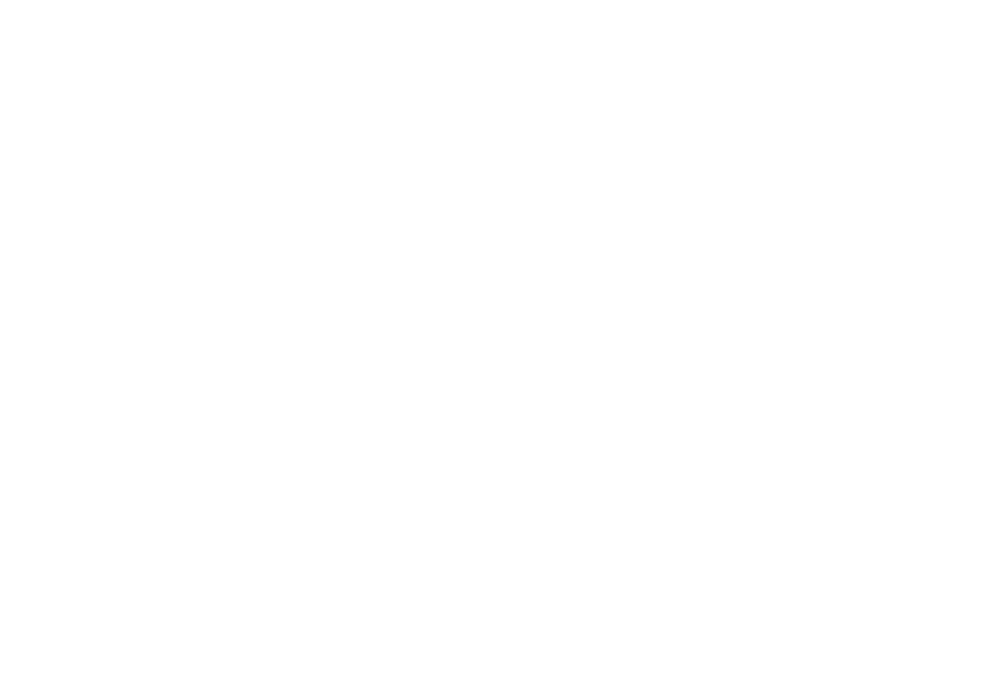

 54%|█████████████████████▌                  | 108/200 [00:41<00:35,  2.61it/s]

716.8391959798995


<IPython.core.display.Javascript object>


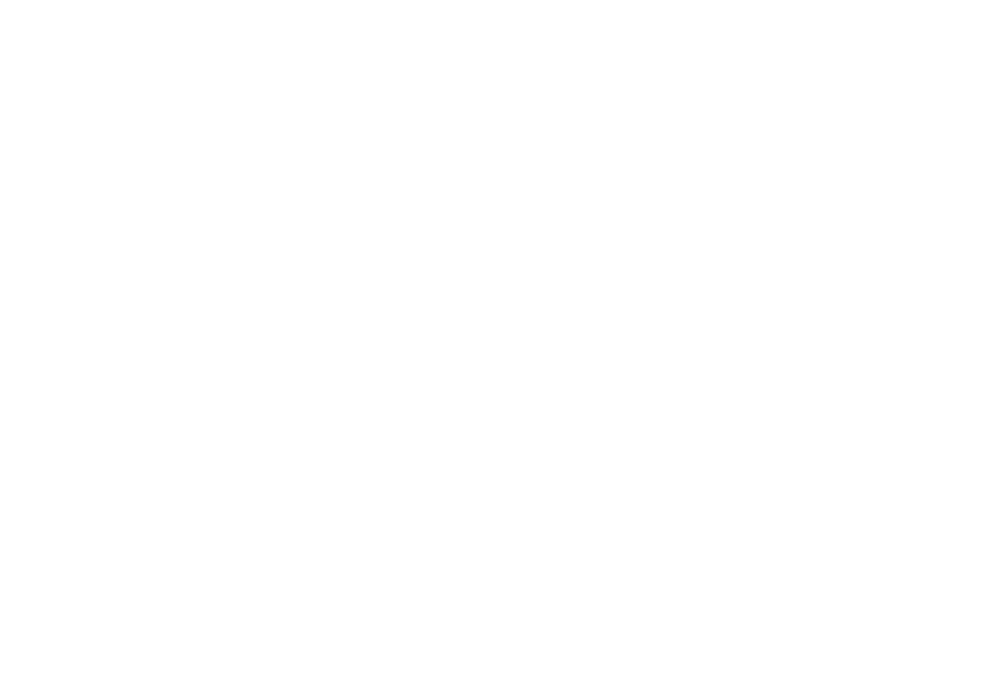

 55%|█████████████████████▊                  | 109/200 [00:41<00:34,  2.62it/s]

723.4673366834171


<IPython.core.display.Javascript object>


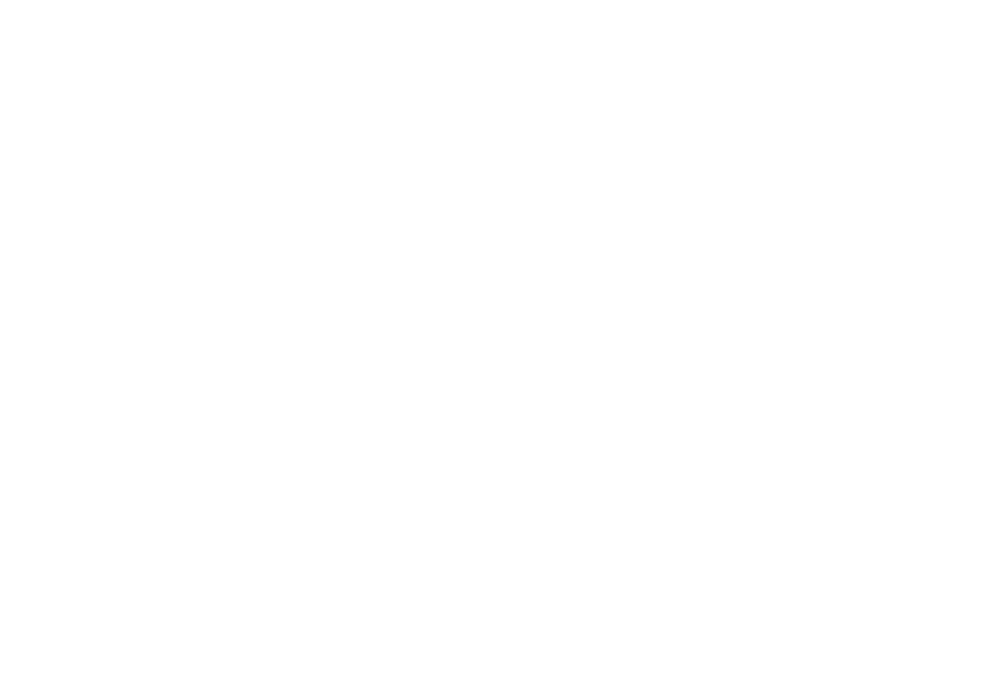

 55%|██████████████████████                  | 110/200 [00:41<00:34,  2.62it/s]

730.0954773869347


<IPython.core.display.Javascript object>


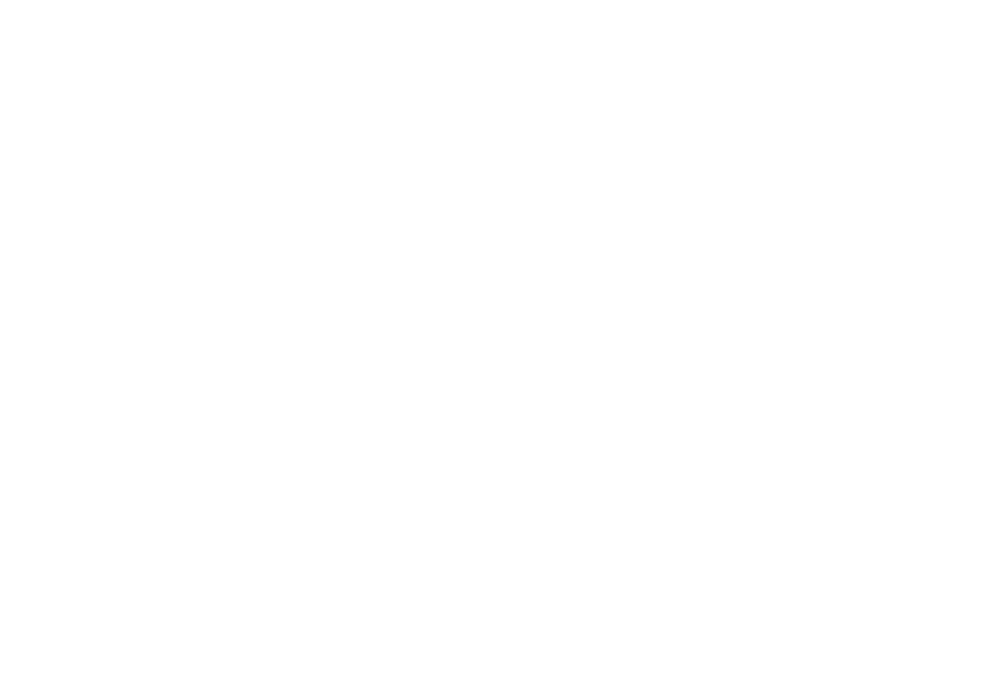

 56%|██████████████████████▏                 | 111/200 [00:42<00:33,  2.63it/s]

736.7236180904523


<IPython.core.display.Javascript object>


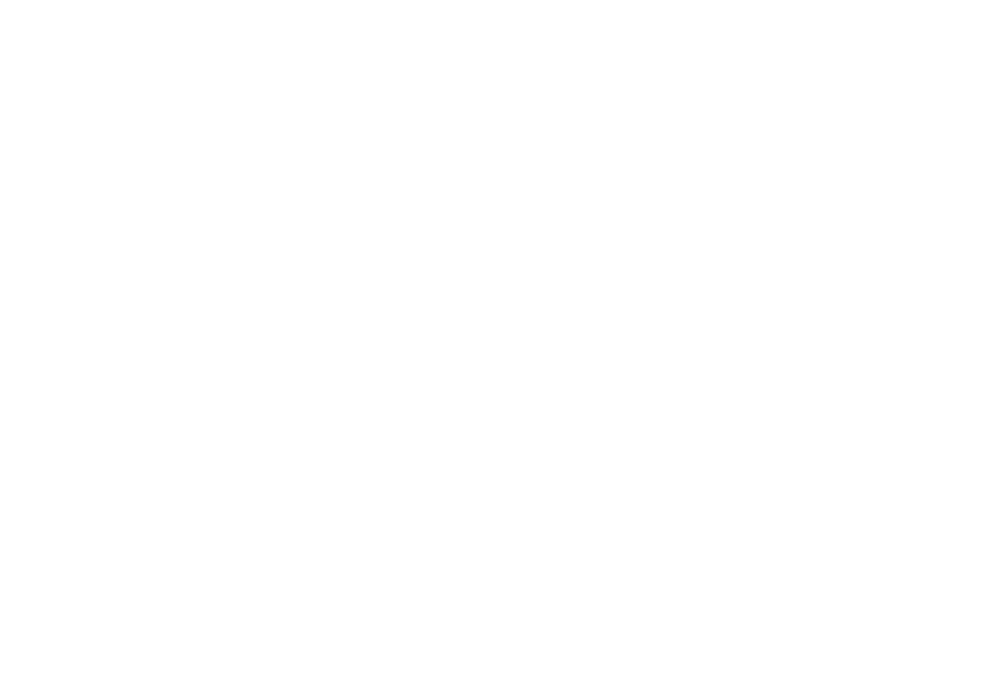

 56%|██████████████████████▍                 | 112/200 [00:42<00:33,  2.63it/s]

743.3517587939699


<IPython.core.display.Javascript object>


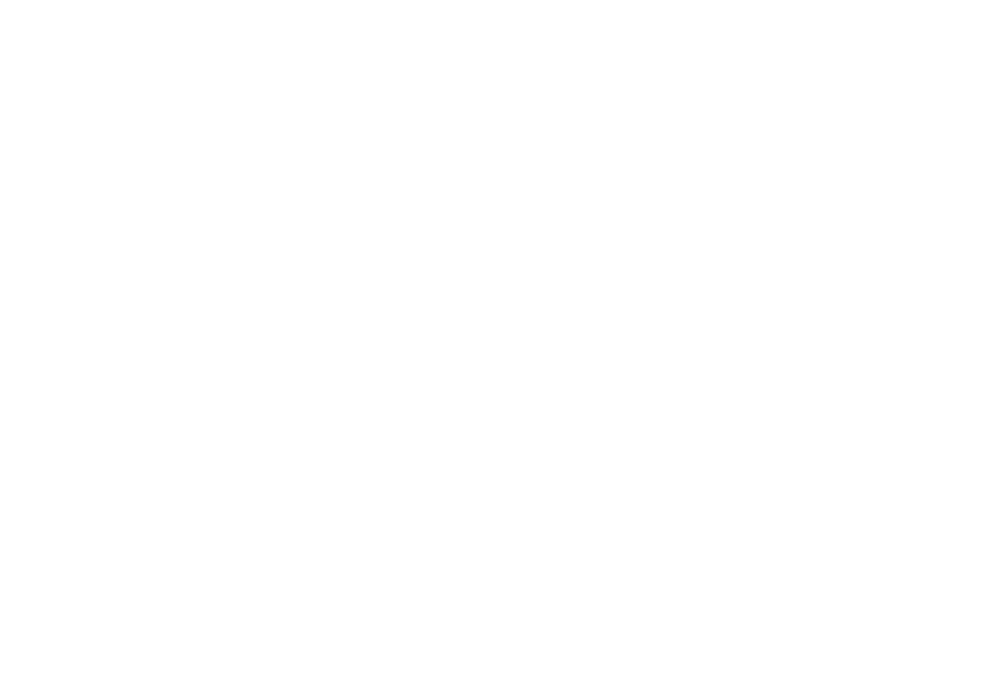

 56%|██████████████████████▌                 | 113/200 [00:42<00:33,  2.63it/s]

749.9798994974875


<IPython.core.display.Javascript object>


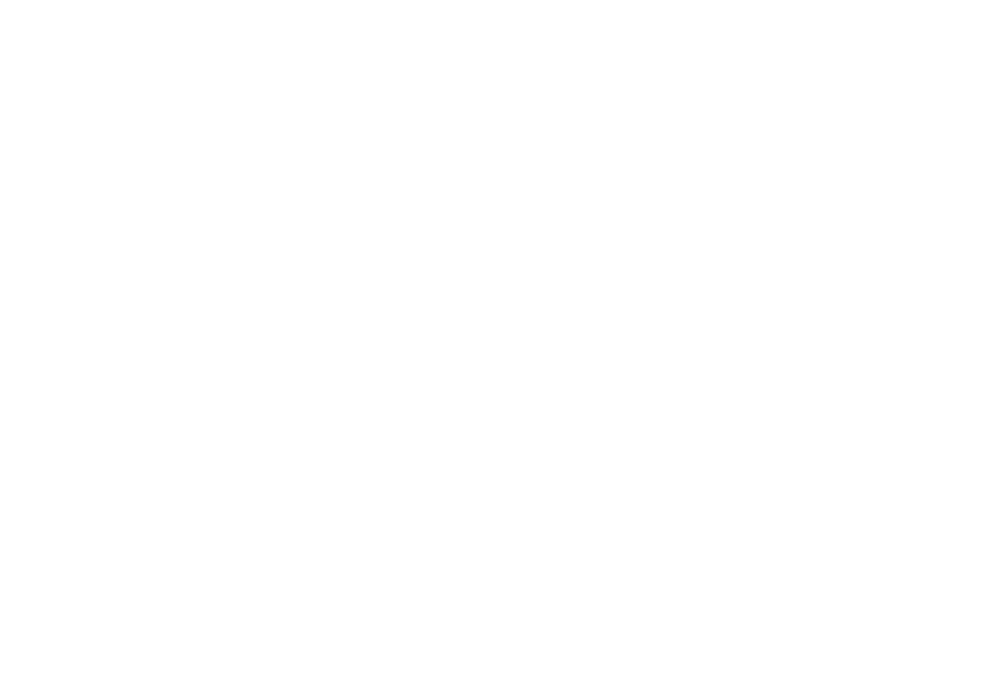

 57%|██████████████████████▊                 | 114/200 [00:43<00:32,  2.63it/s]

756.6080402010051


<IPython.core.display.Javascript object>


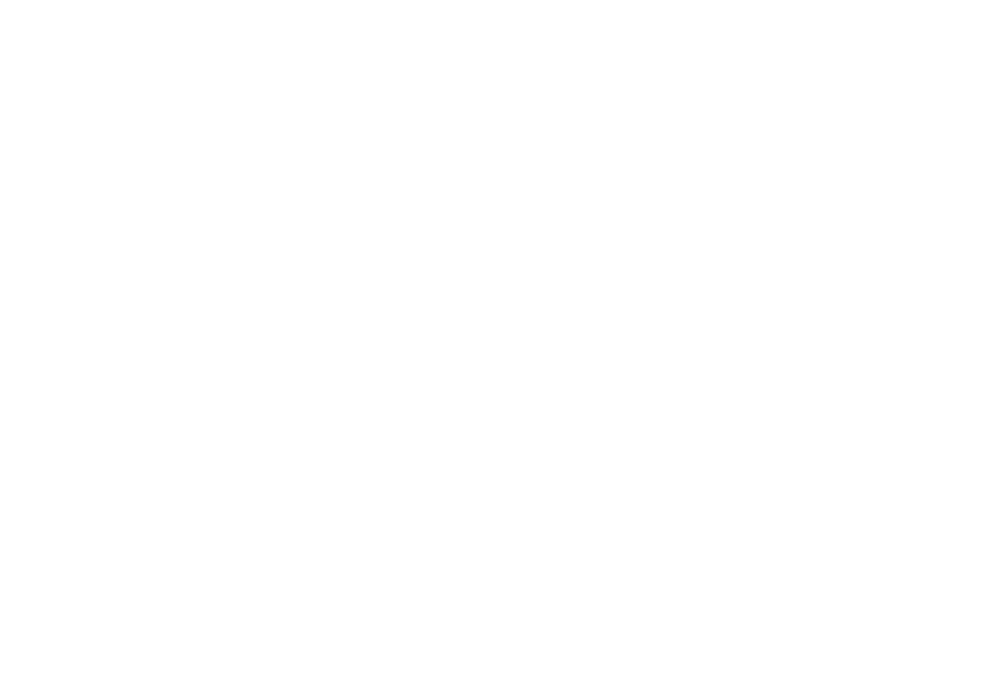

 57%|███████████████████████                 | 115/200 [00:43<00:32,  2.63it/s]

763.2361809045227


<IPython.core.display.Javascript object>


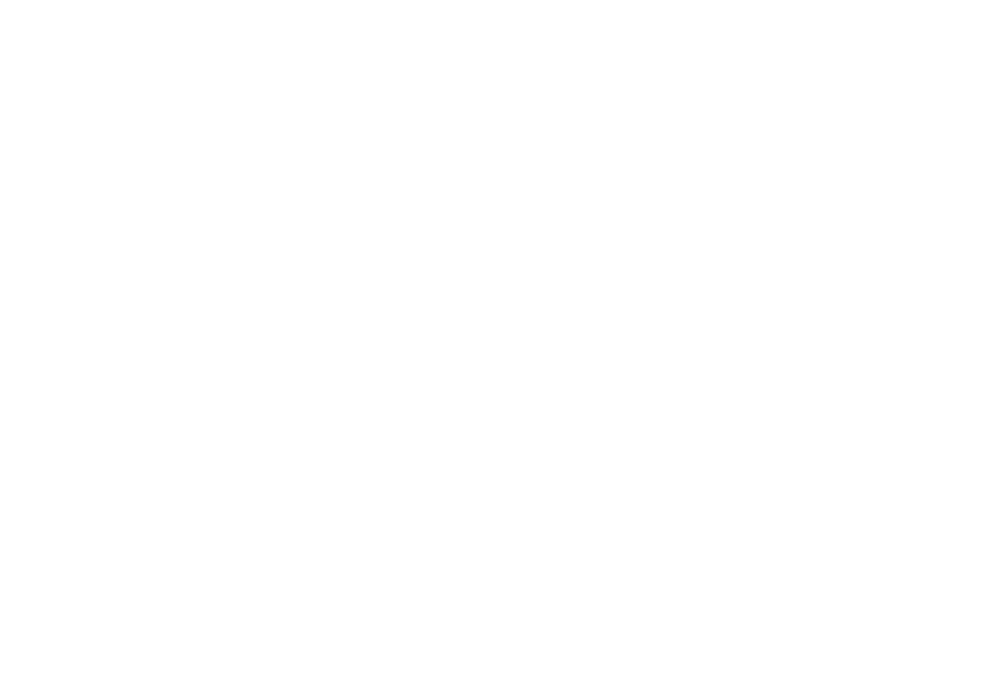

 58%|███████████████████████▏                | 116/200 [00:43<00:31,  2.64it/s]

769.8643216080402


<IPython.core.display.Javascript object>


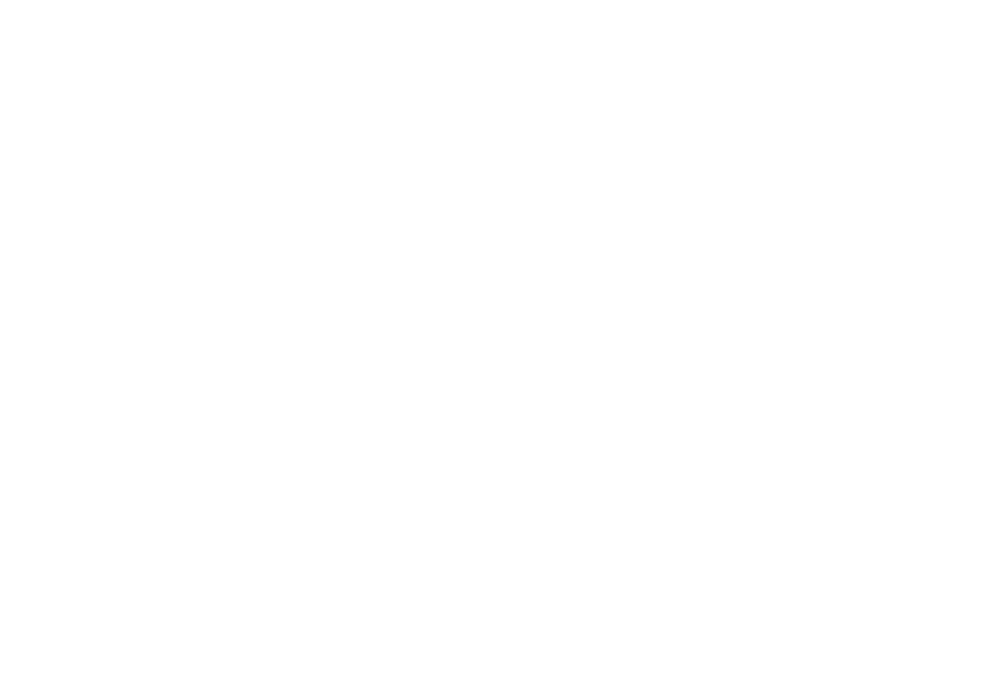

 58%|███████████████████████▍                | 117/200 [00:44<00:31,  2.64it/s]

776.4924623115578


<IPython.core.display.Javascript object>


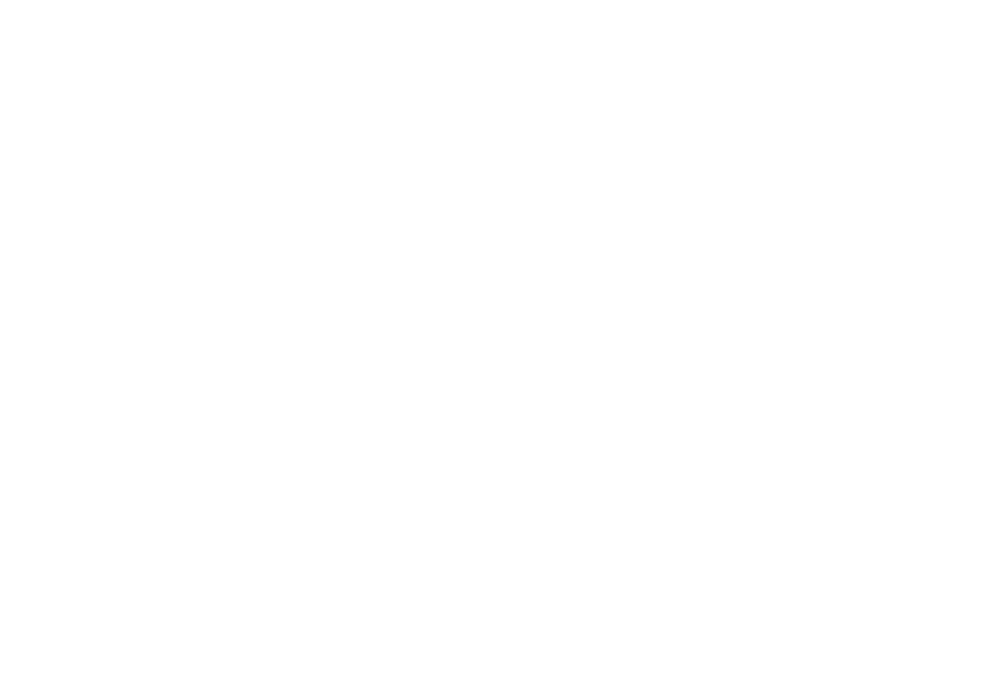

 59%|███████████████████████▌                | 118/200 [00:44<00:31,  2.64it/s]

783.1206030150754


<IPython.core.display.Javascript object>


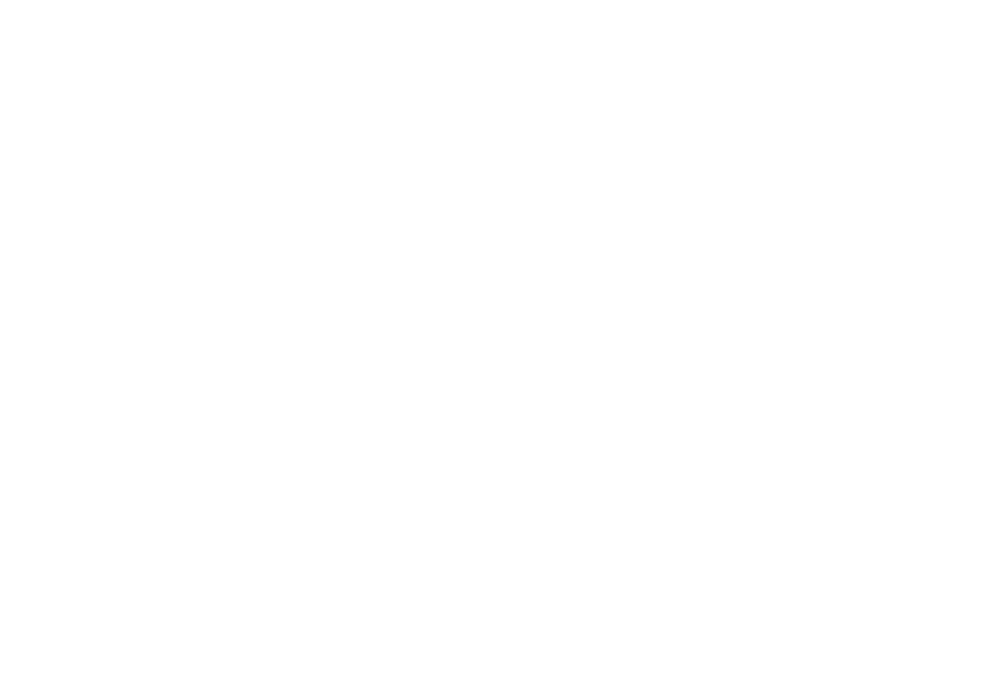

 60%|███████████████████████▊                | 119/200 [00:45<00:30,  2.64it/s]

789.748743718593


<IPython.core.display.Javascript object>


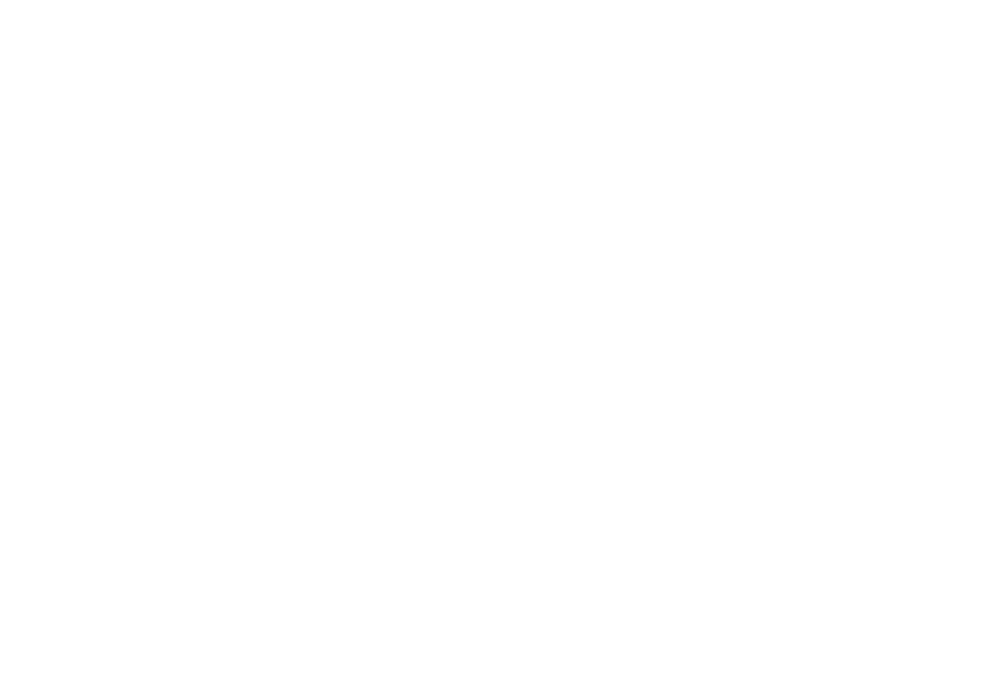

 60%|████████████████████████                | 120/200 [00:45<00:30,  2.64it/s]

796.3768844221106


<IPython.core.display.Javascript object>


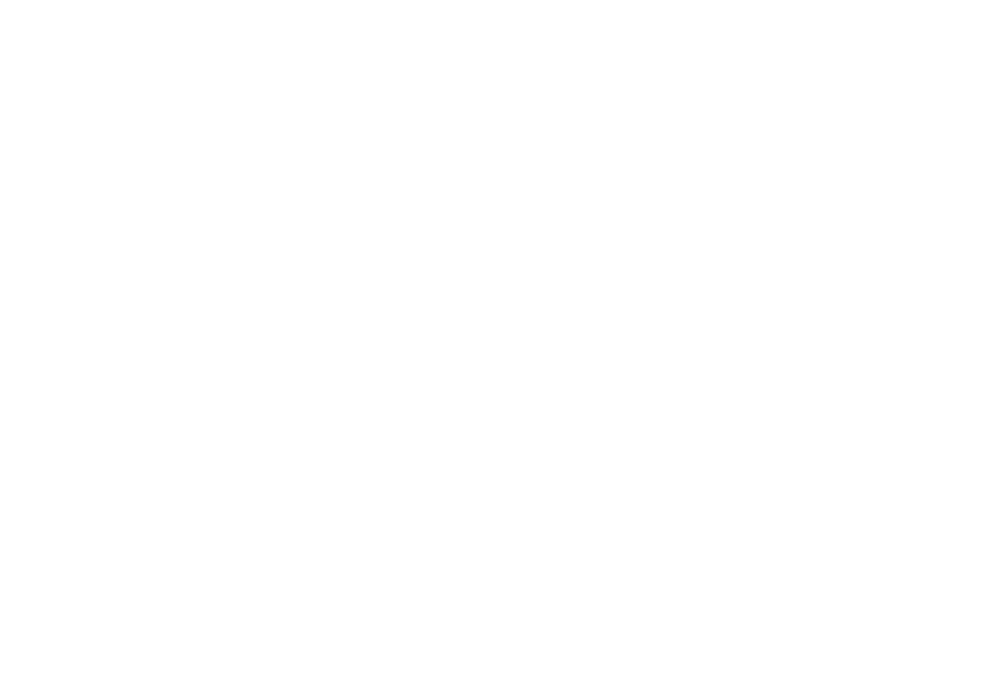

 60%|████████████████████████▏               | 121/200 [00:45<00:29,  2.65it/s]

803.0050251256282


<IPython.core.display.Javascript object>


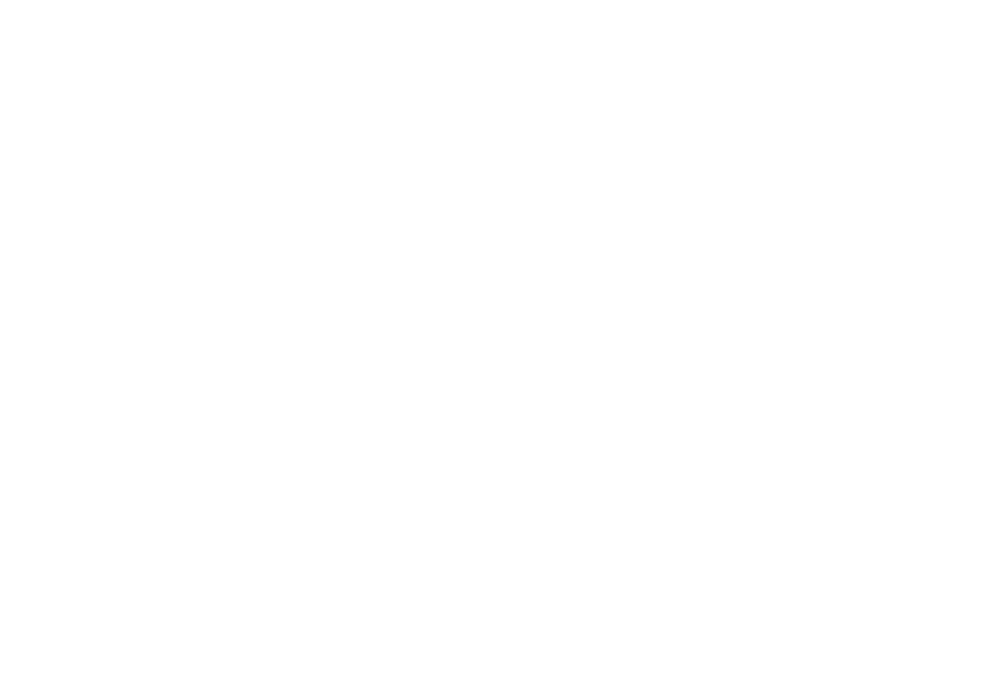

 61%|████████████████████████▍               | 122/200 [00:46<00:29,  2.65it/s]

809.6331658291458


<IPython.core.display.Javascript object>


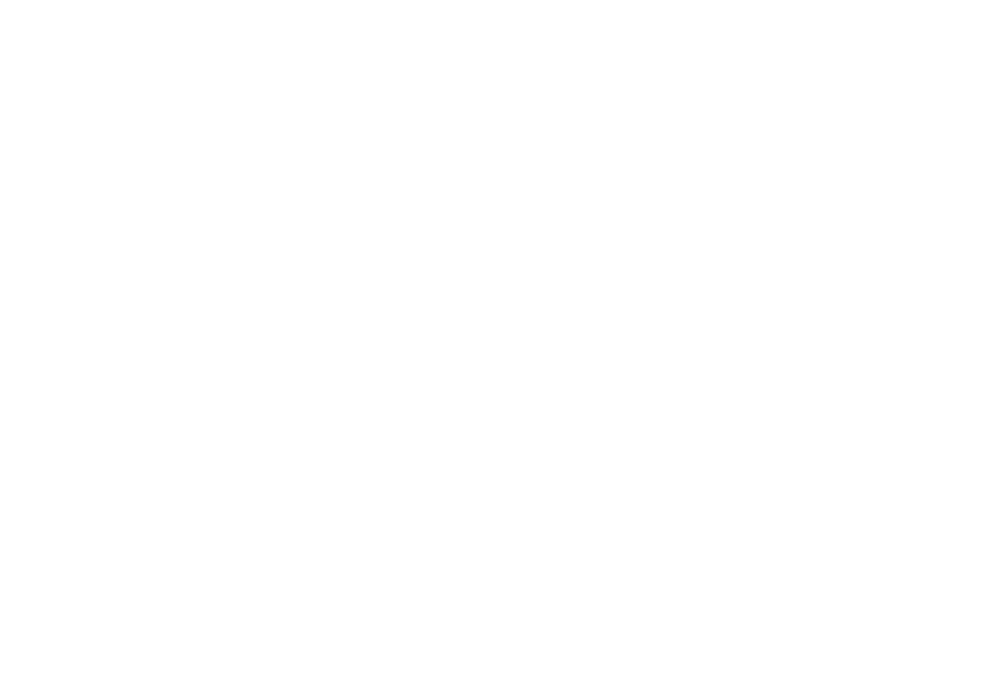

 62%|████████████████████████▌               | 123/200 [00:46<00:29,  2.65it/s]

816.2613065326634


<IPython.core.display.Javascript object>


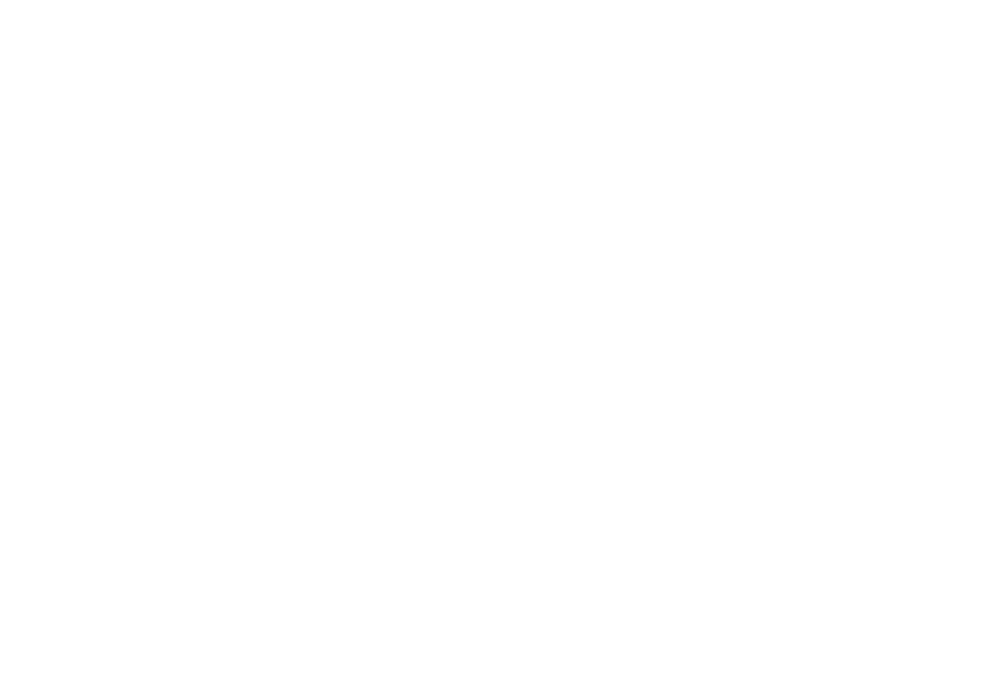

 62%|████████████████████████▊               | 124/200 [00:46<00:28,  2.65it/s]

822.8894472361809


<IPython.core.display.Javascript object>


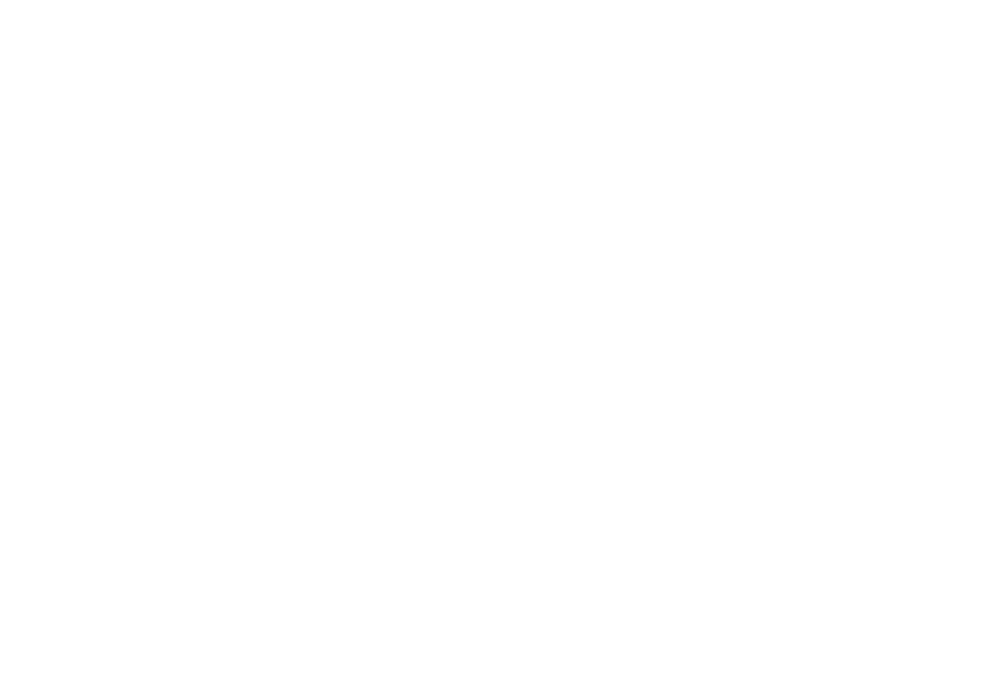

 62%|█████████████████████████               | 125/200 [00:47<00:28,  2.65it/s]

829.5175879396985


<IPython.core.display.Javascript object>


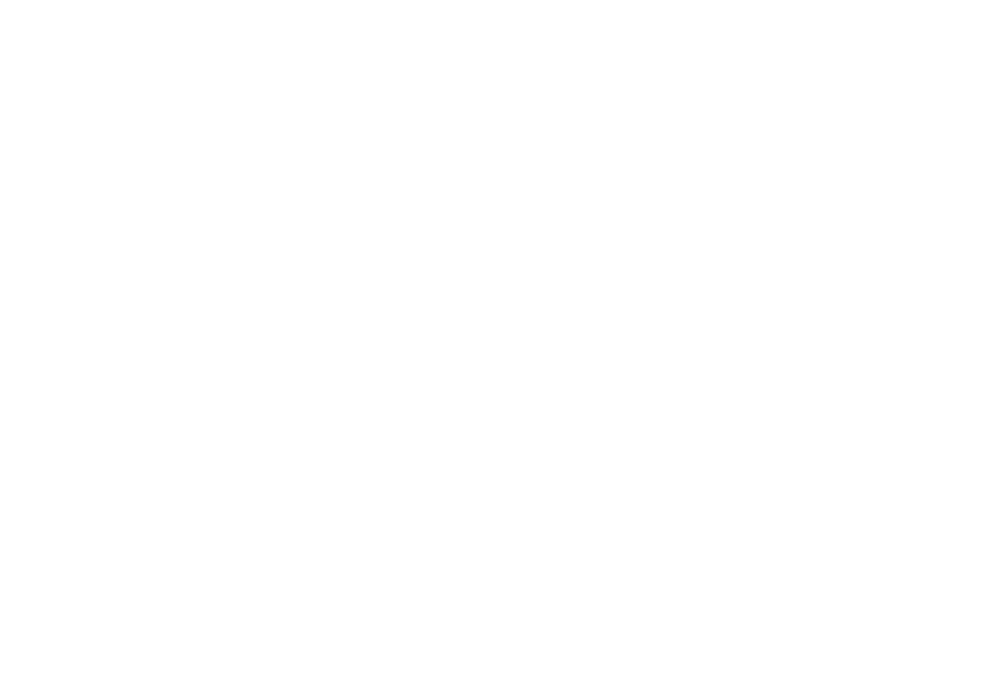

 63%|█████████████████████████▏              | 126/200 [00:47<00:27,  2.66it/s]

836.1457286432161


<IPython.core.display.Javascript object>


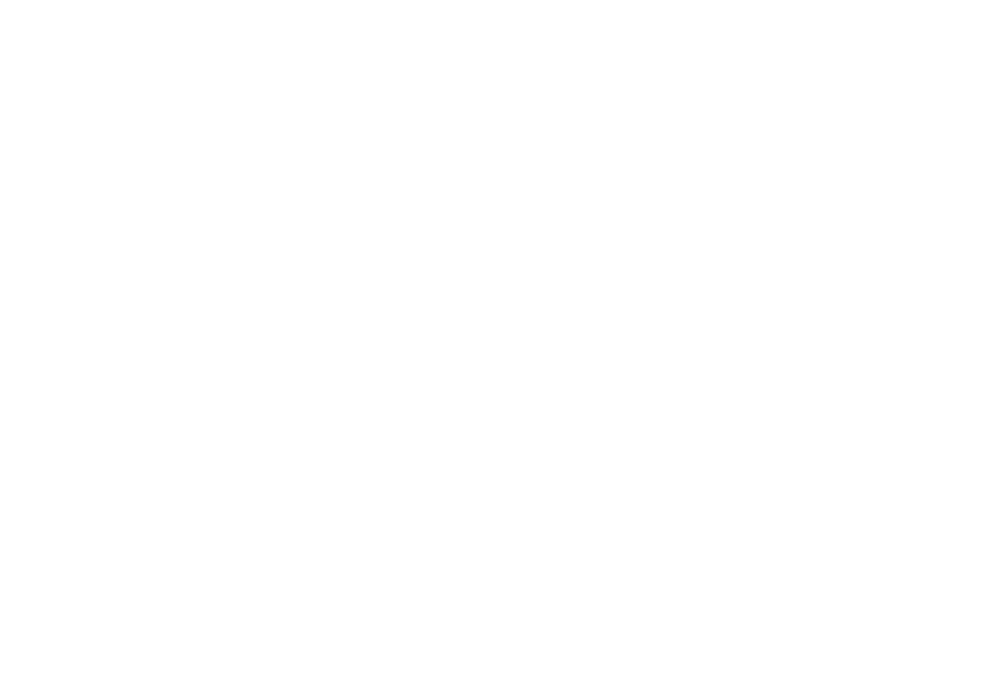

 64%|█████████████████████████▍              | 127/200 [00:47<00:27,  2.66it/s]

842.7738693467337


<IPython.core.display.Javascript object>


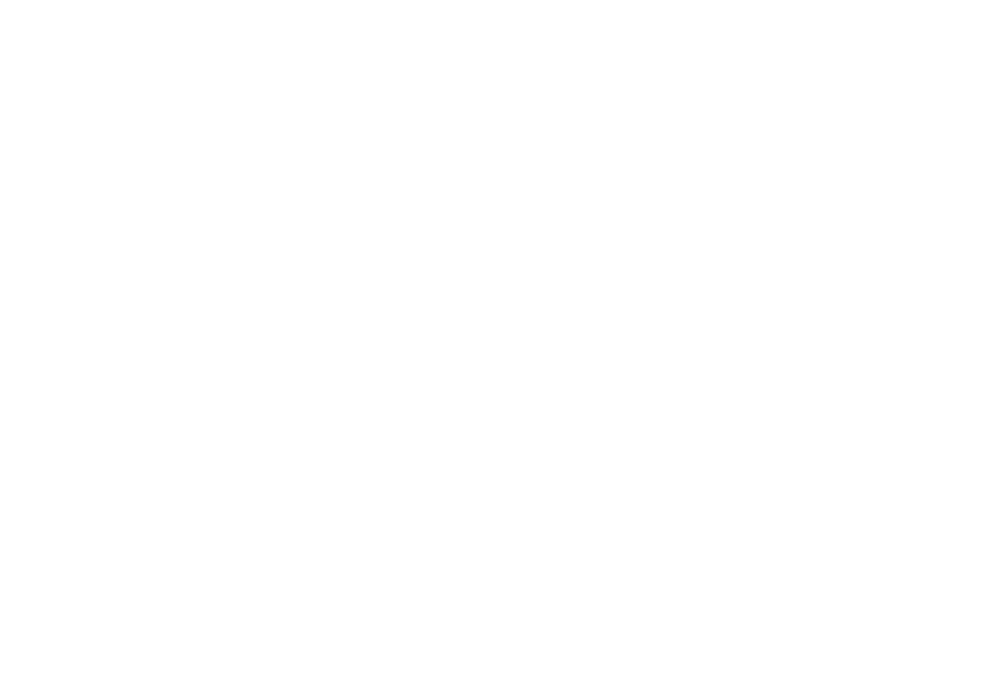

 64%|█████████████████████████▌              | 128/200 [00:48<00:27,  2.66it/s]

849.4020100502513


<IPython.core.display.Javascript object>


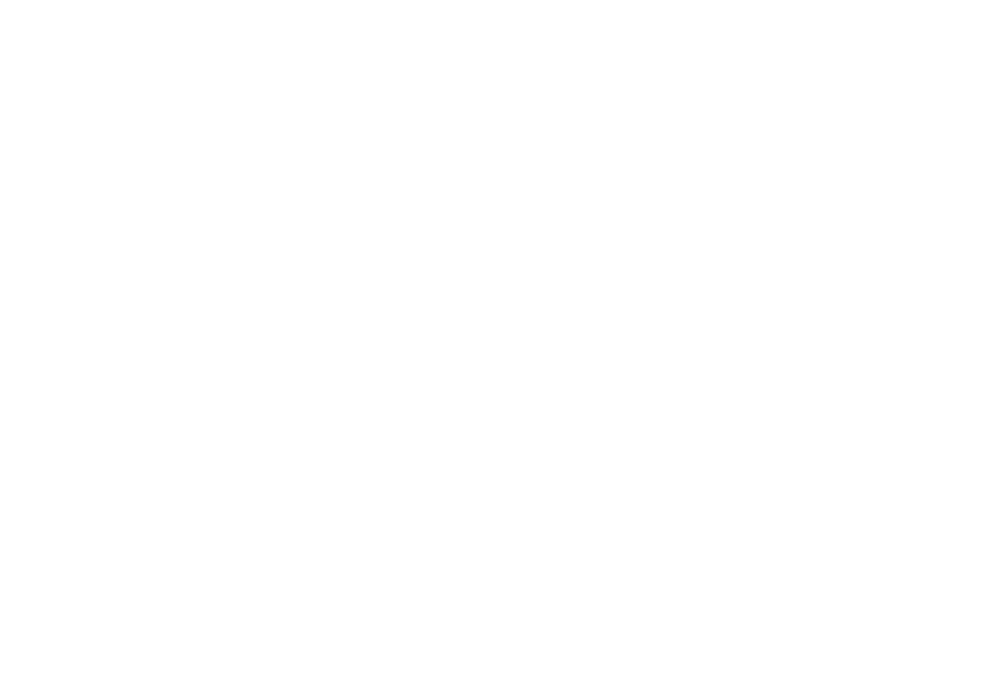

 64%|█████████████████████████▊              | 129/200 [00:48<00:26,  2.66it/s]

856.0301507537689


<IPython.core.display.Javascript object>


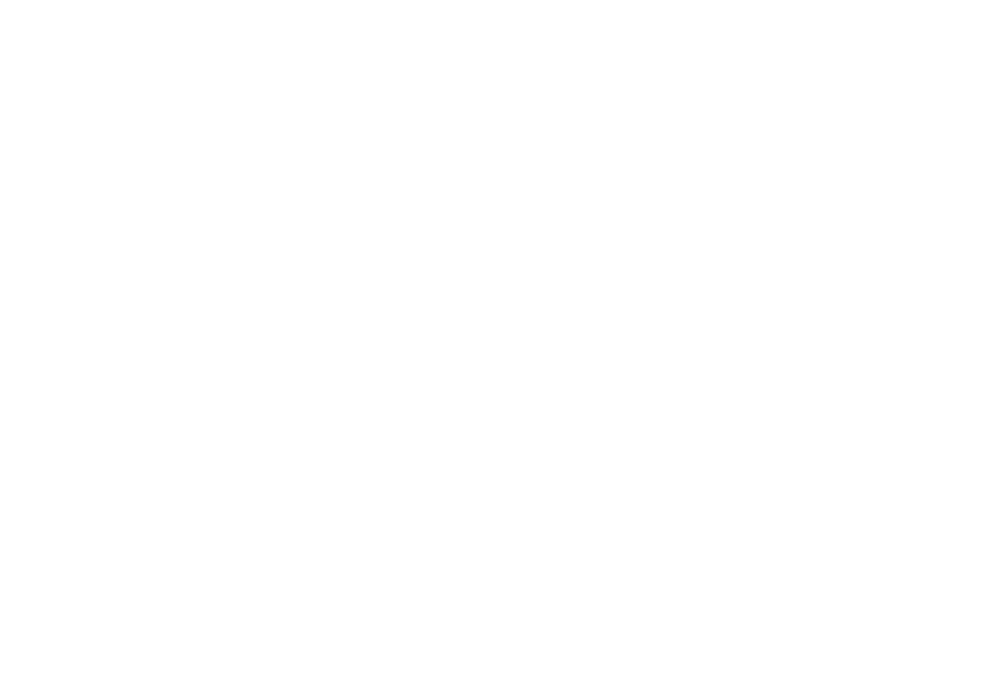

 65%|██████████████████████████              | 130/200 [00:48<00:26,  2.66it/s]

862.6582914572865


<IPython.core.display.Javascript object>


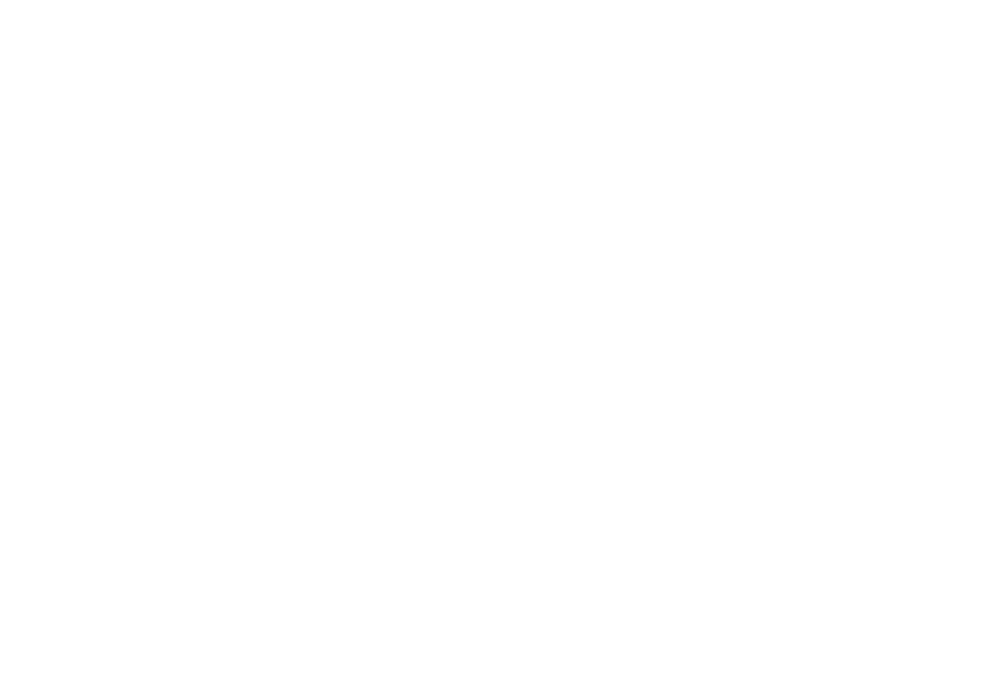

 66%|██████████████████████████▏             | 131/200 [00:49<00:25,  2.66it/s]

869.2864321608041


<IPython.core.display.Javascript object>


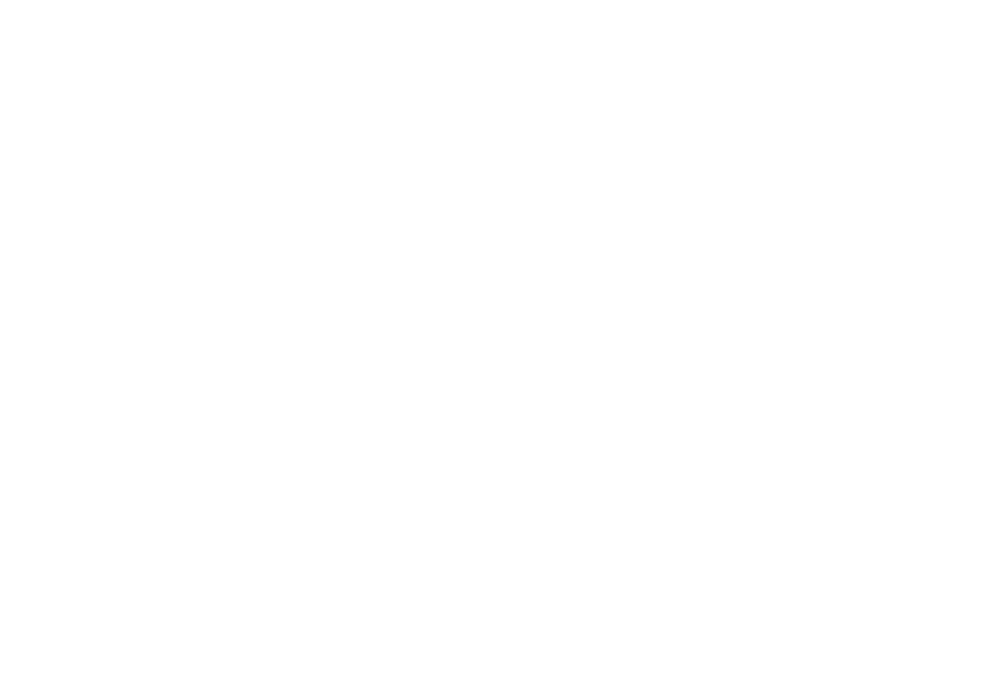

 66%|██████████████████████████▍             | 132/200 [00:49<00:25,  2.66it/s]

875.9145728643217


<IPython.core.display.Javascript object>


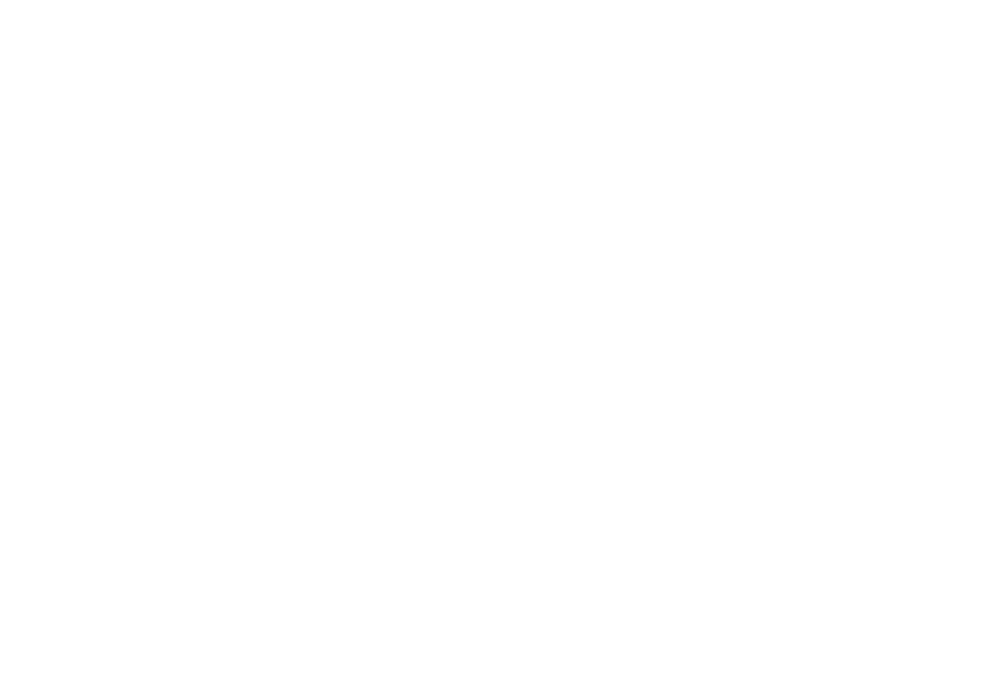

 66%|██████████████████████████▌             | 133/200 [00:49<00:25,  2.66it/s]

882.5427135678392


<IPython.core.display.Javascript object>


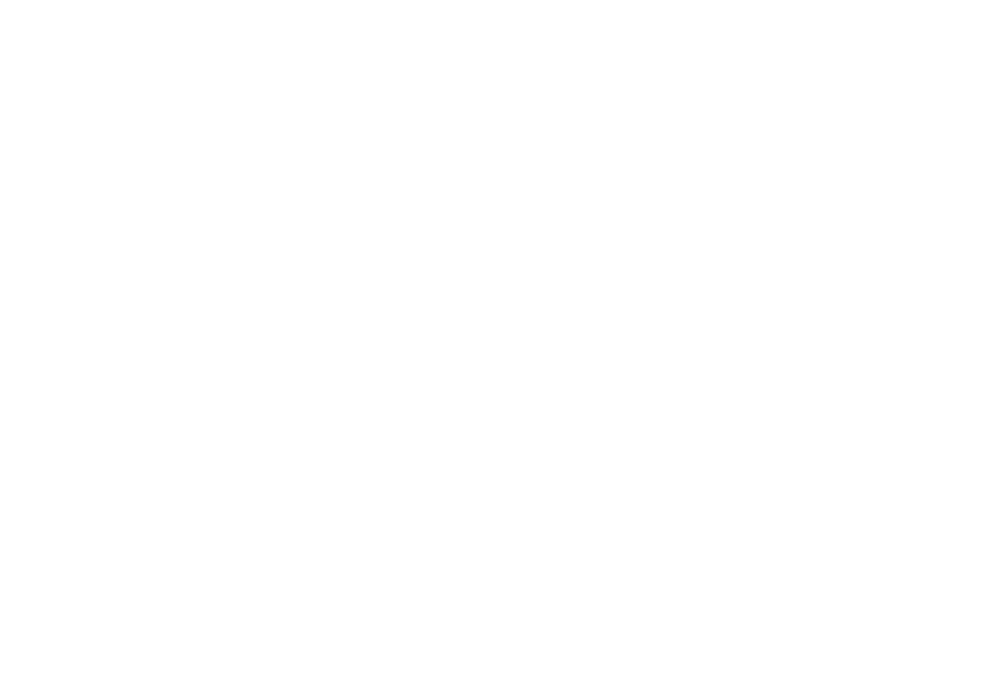

 67%|██████████████████████████▊             | 134/200 [00:50<00:24,  2.66it/s]

889.1708542713568


<IPython.core.display.Javascript object>


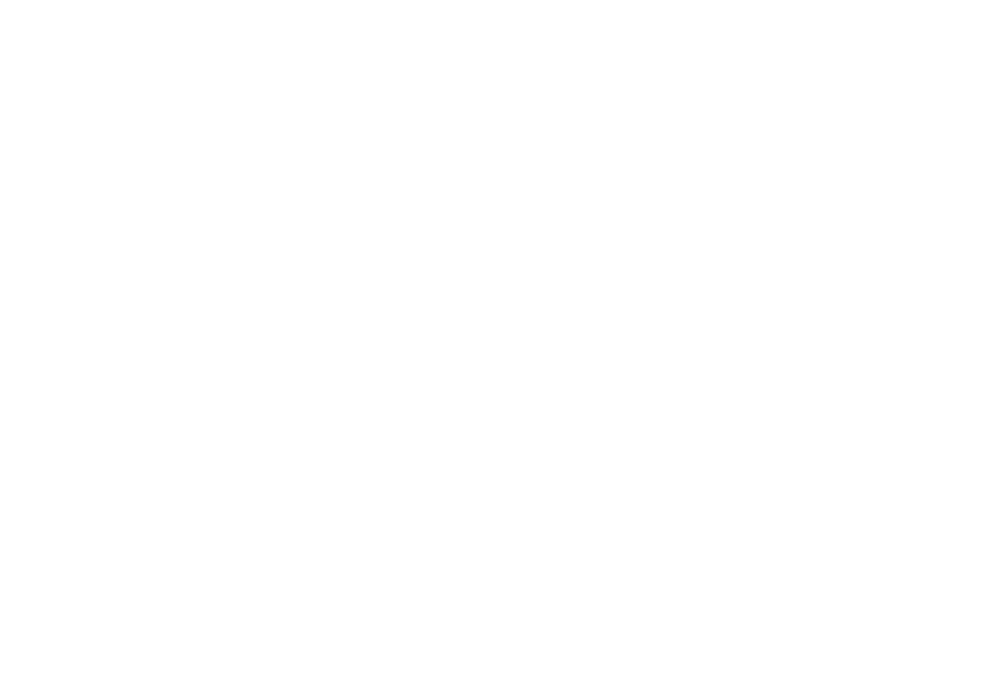

 68%|███████████████████████████             | 135/200 [00:50<00:24,  2.66it/s]

895.7989949748744


<IPython.core.display.Javascript object>


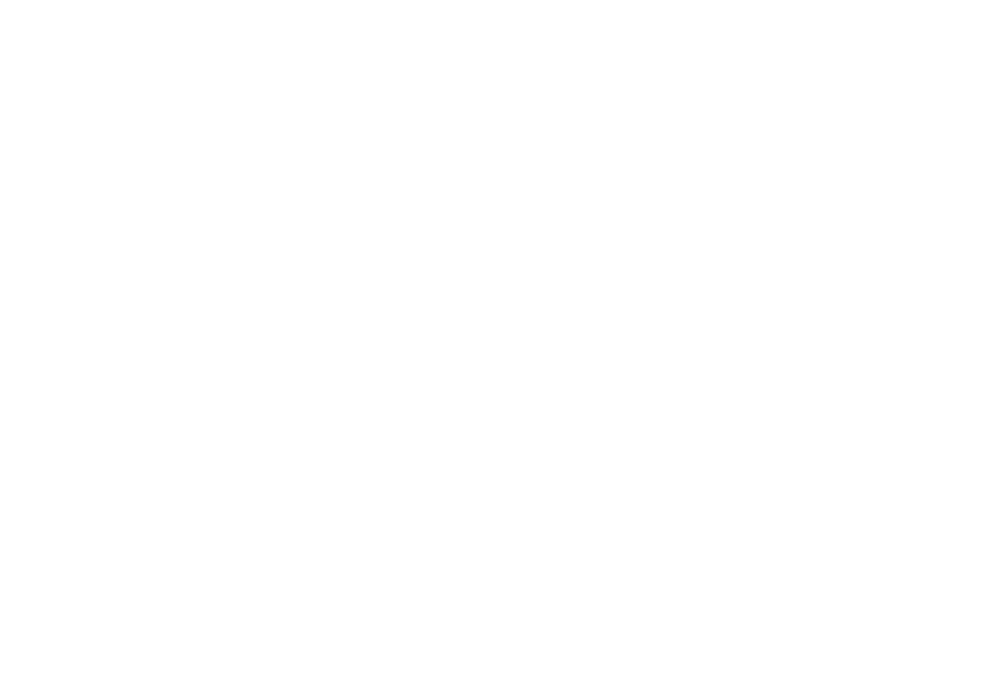

 68%|███████████████████████████▏            | 136/200 [00:51<00:24,  2.66it/s]

902.427135678392


<IPython.core.display.Javascript object>


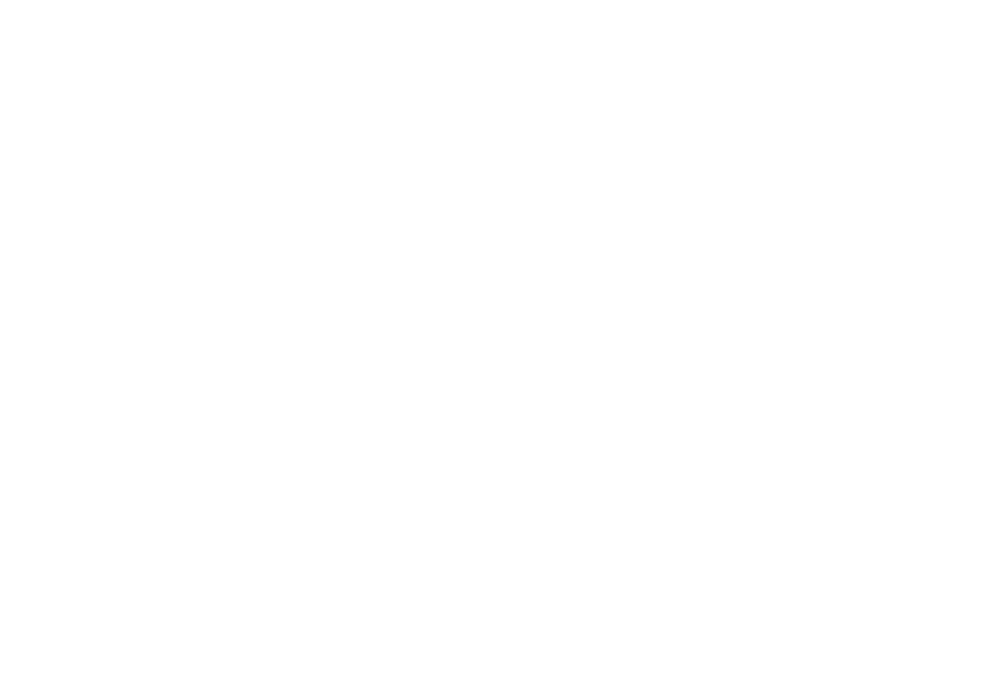

 68%|███████████████████████████▍            | 137/200 [00:51<00:23,  2.67it/s]

909.0552763819096


<IPython.core.display.Javascript object>


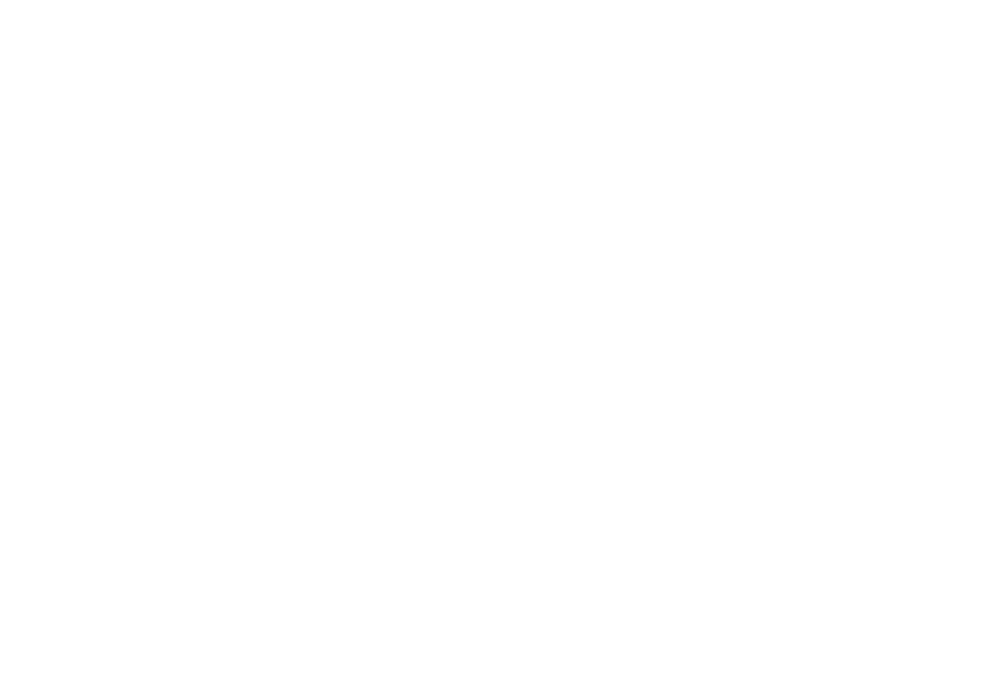

 69%|███████████████████████████▌            | 138/200 [00:51<00:23,  2.67it/s]

915.6834170854272


<IPython.core.display.Javascript object>


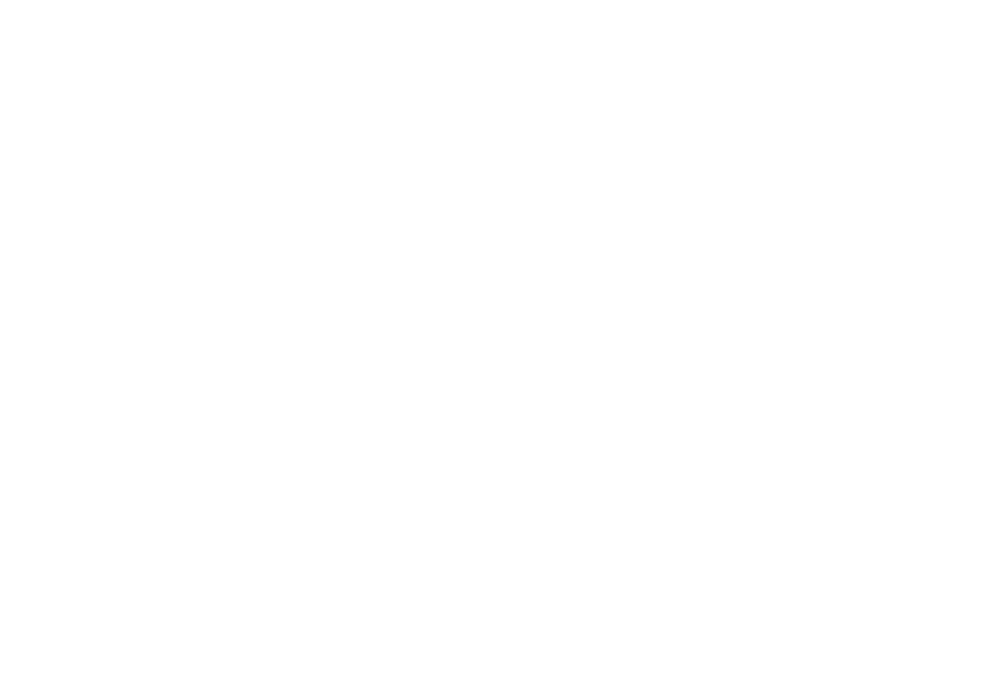

 70%|███████████████████████████▊            | 139/200 [00:52<00:22,  2.67it/s]

922.3115577889448


<IPython.core.display.Javascript object>


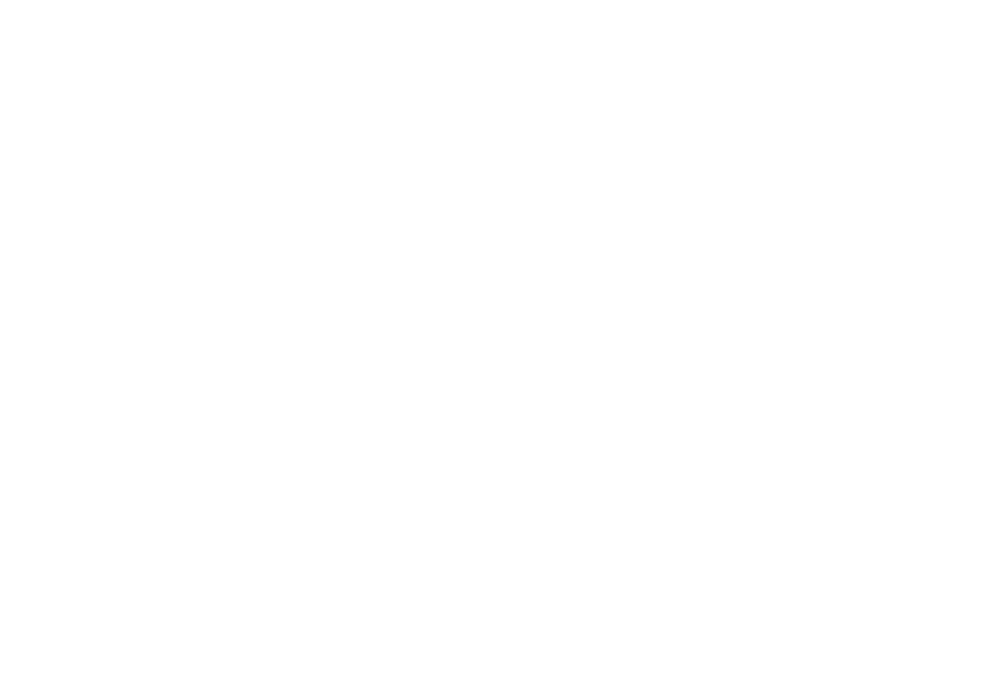

 70%|████████████████████████████            | 140/200 [00:52<00:22,  2.67it/s]

928.9396984924624


<IPython.core.display.Javascript object>


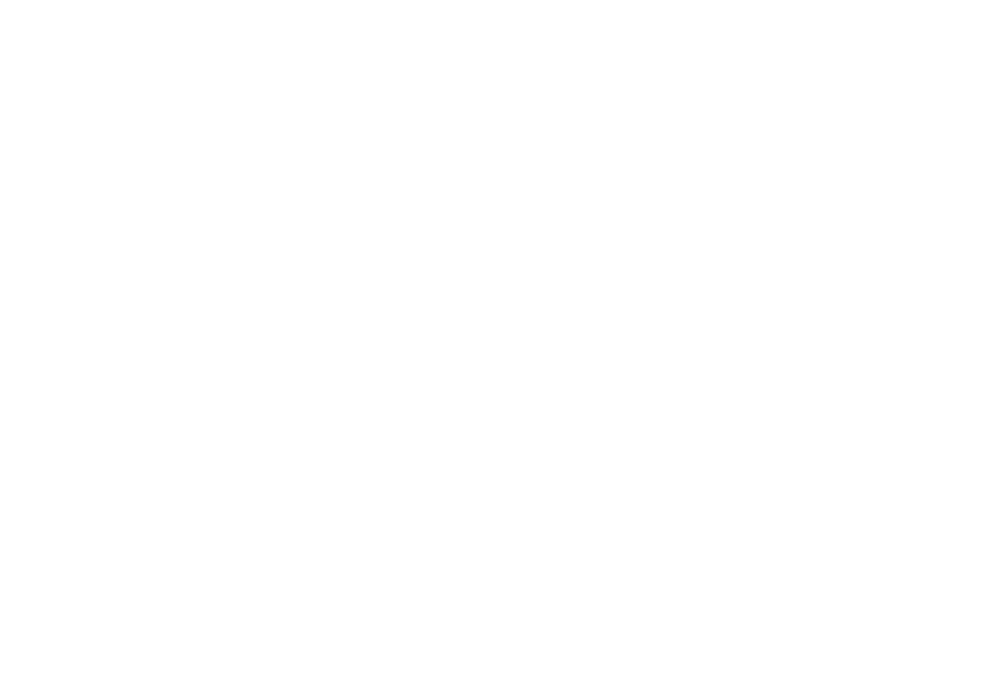

 70%|████████████████████████████▏           | 141/200 [00:52<00:22,  2.67it/s]

935.5678391959799


<IPython.core.display.Javascript object>


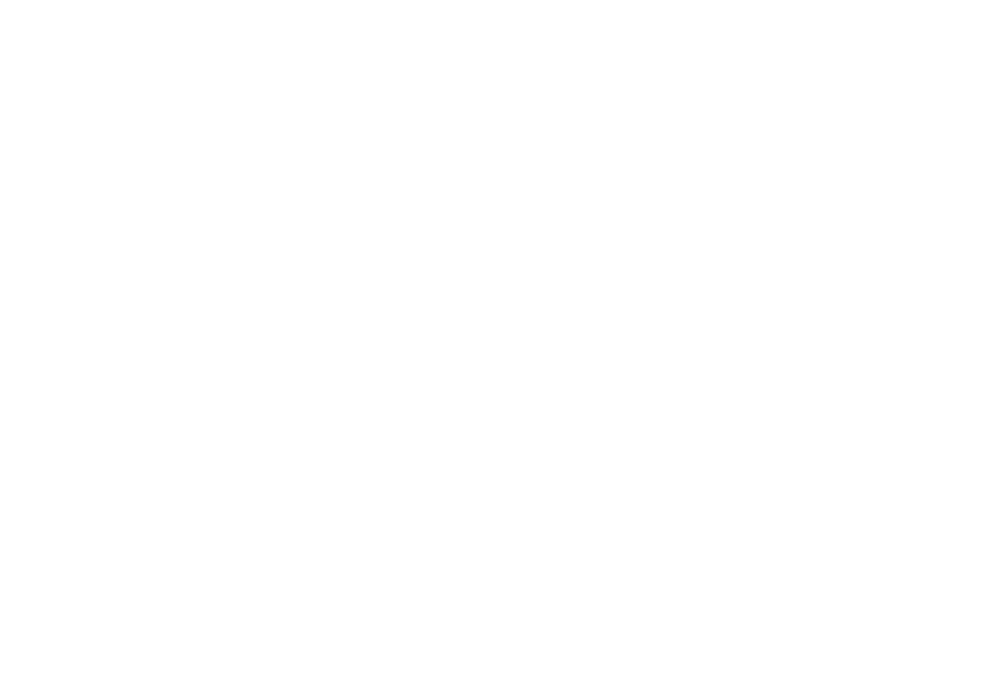

 71%|████████████████████████████▍           | 142/200 [00:53<00:21,  2.67it/s]

942.1959798994975


<IPython.core.display.Javascript object>


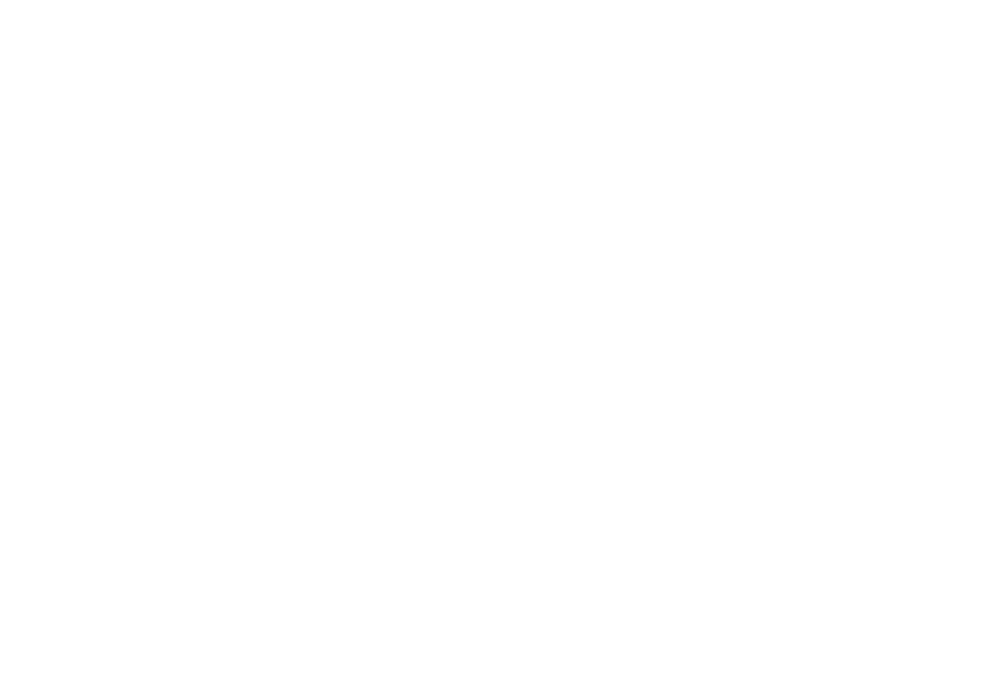

 72%|████████████████████████████▌           | 143/200 [00:53<00:21,  2.67it/s]

948.8241206030151


<IPython.core.display.Javascript object>


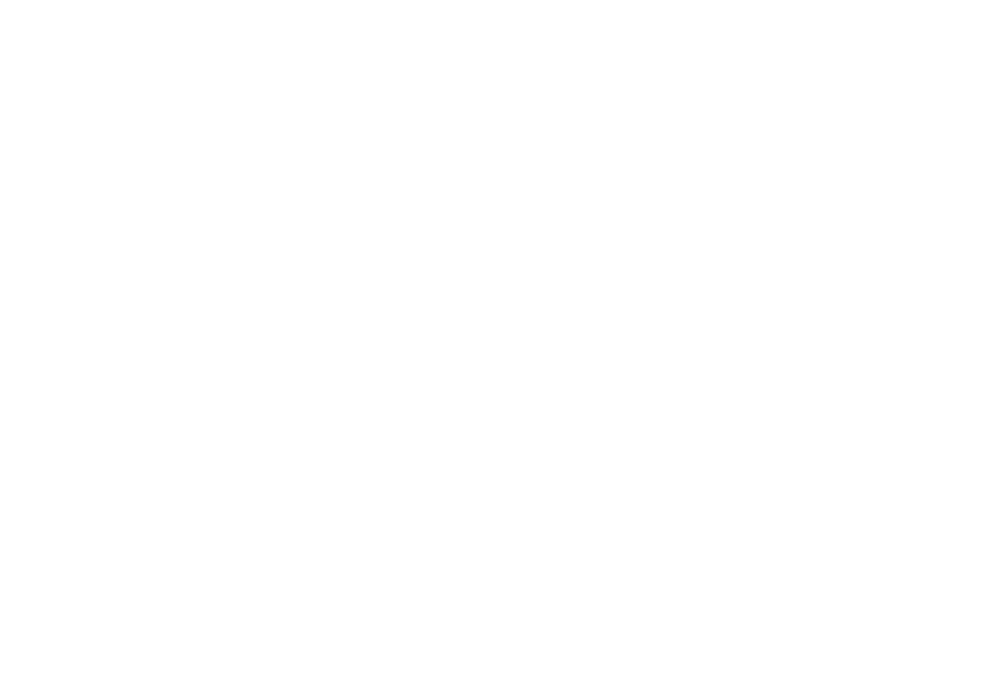

 72%|████████████████████████████▊           | 144/200 [00:53<00:20,  2.68it/s]

955.4522613065327


<IPython.core.display.Javascript object>


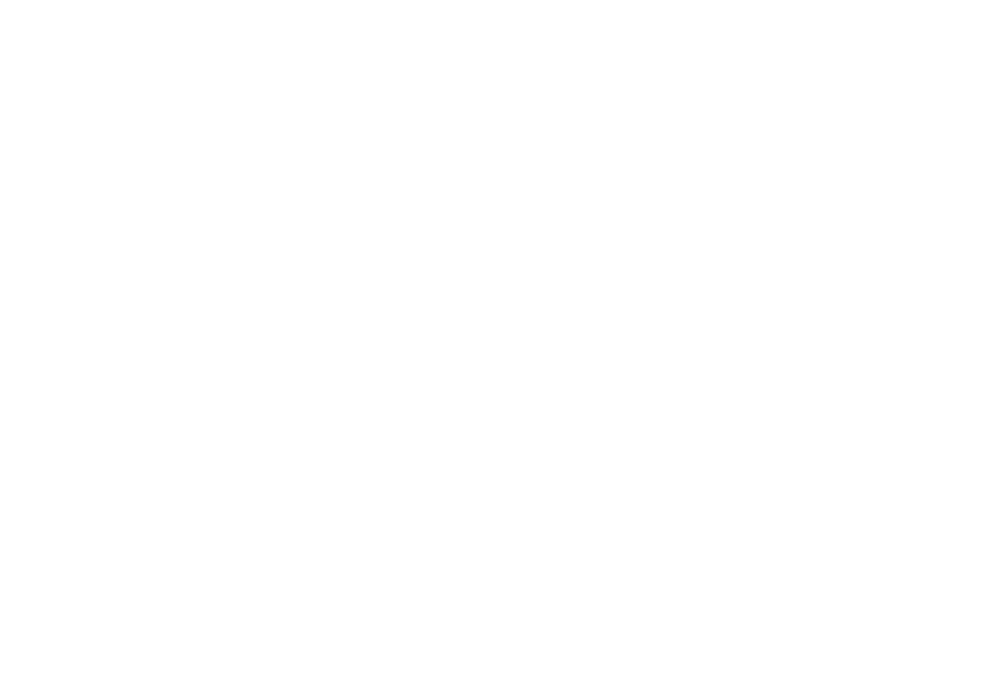

 72%|█████████████████████████████           | 145/200 [00:54<00:20,  2.68it/s]

962.0804020100503


<IPython.core.display.Javascript object>


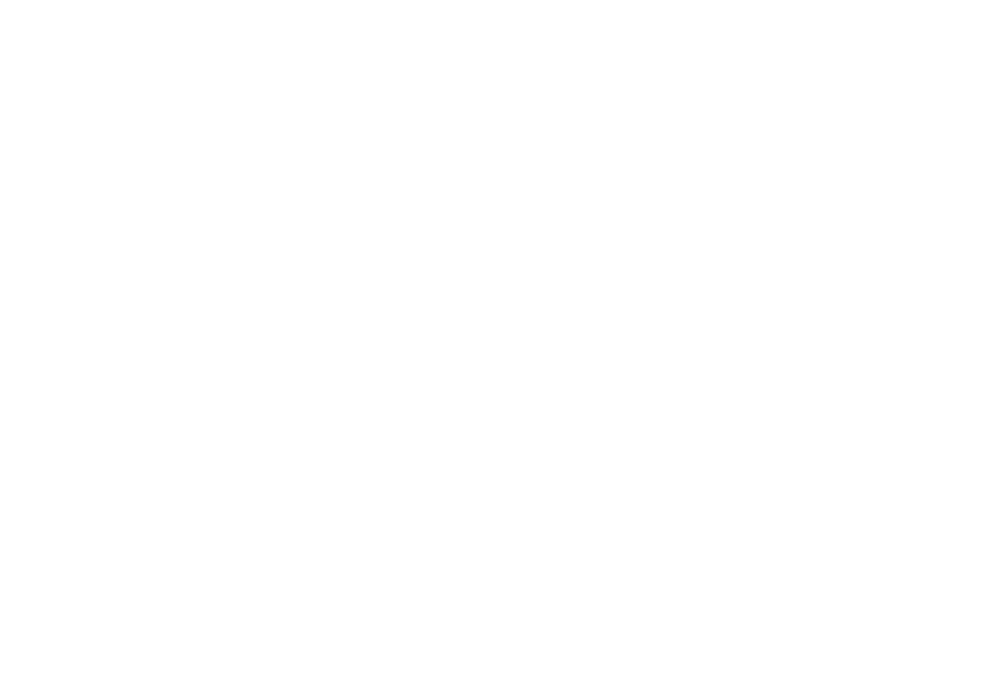

 73%|█████████████████████████████▏          | 146/200 [00:54<00:20,  2.68it/s]

968.7085427135679


<IPython.core.display.Javascript object>


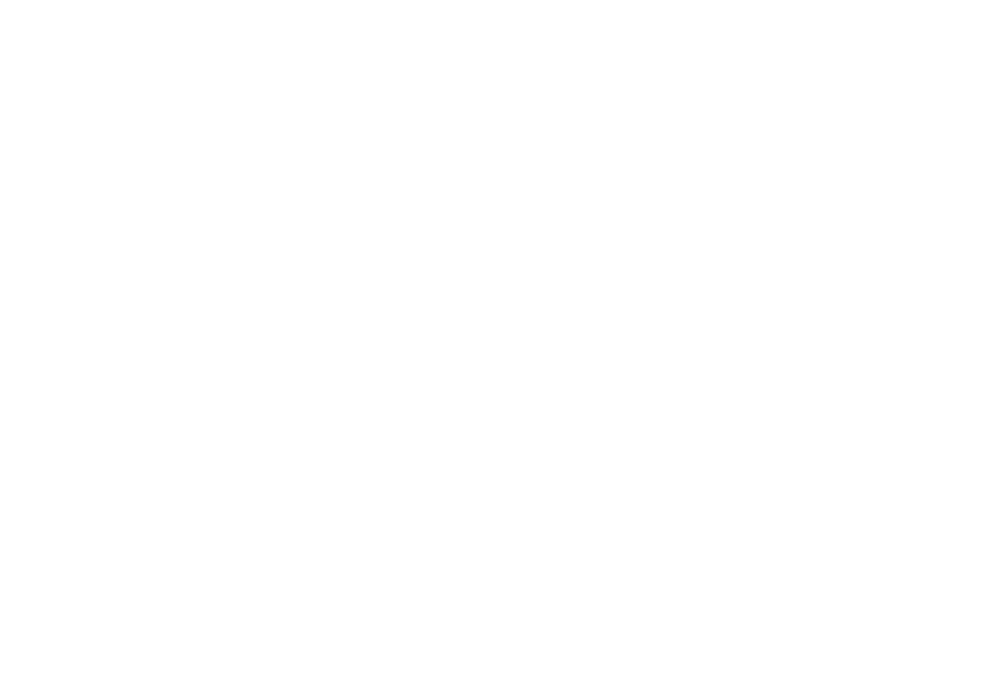

 74%|█████████████████████████████▍          | 147/200 [00:54<00:19,  2.68it/s]

975.3366834170855


<IPython.core.display.Javascript object>


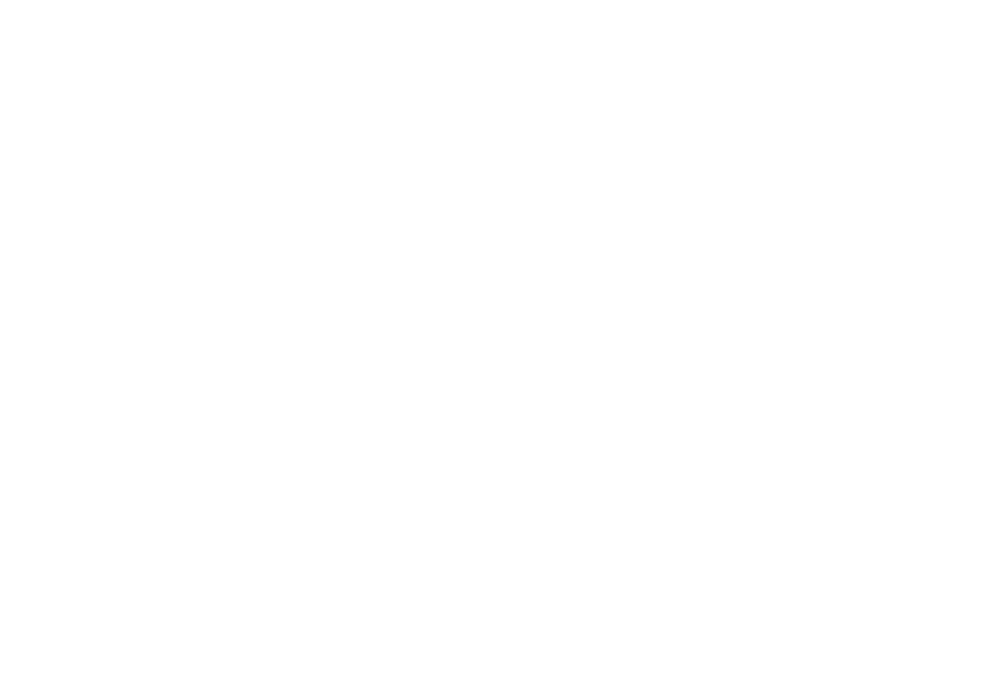

 74%|█████████████████████████████▌          | 148/200 [00:55<00:19,  2.68it/s]

981.9648241206031


<IPython.core.display.Javascript object>


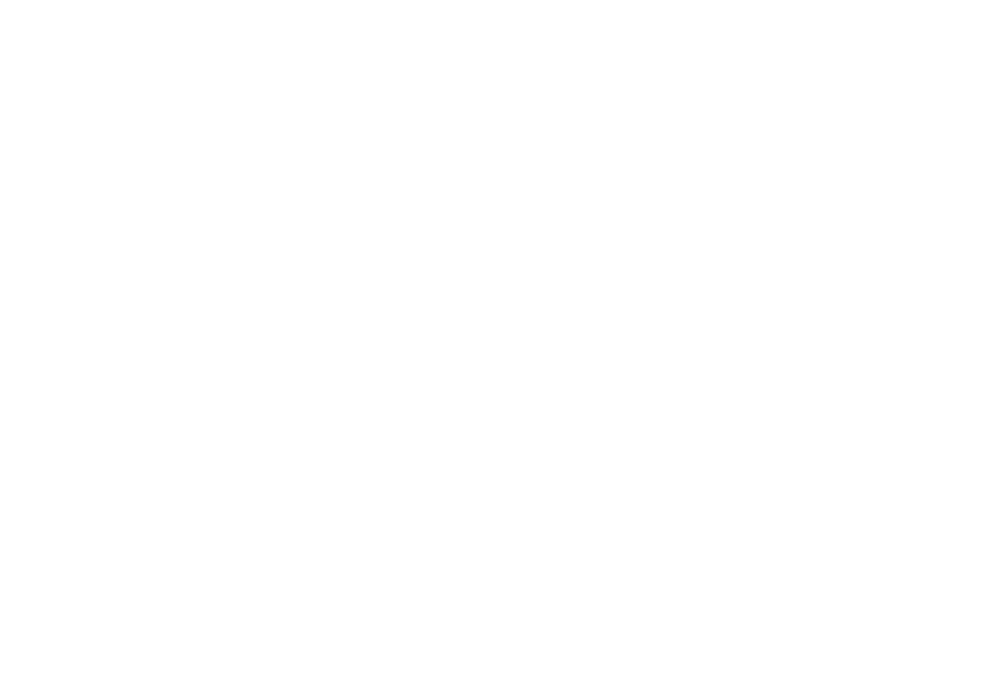

 74%|█████████████████████████████▊          | 149/200 [00:55<00:19,  2.68it/s]

988.5929648241207


<IPython.core.display.Javascript object>


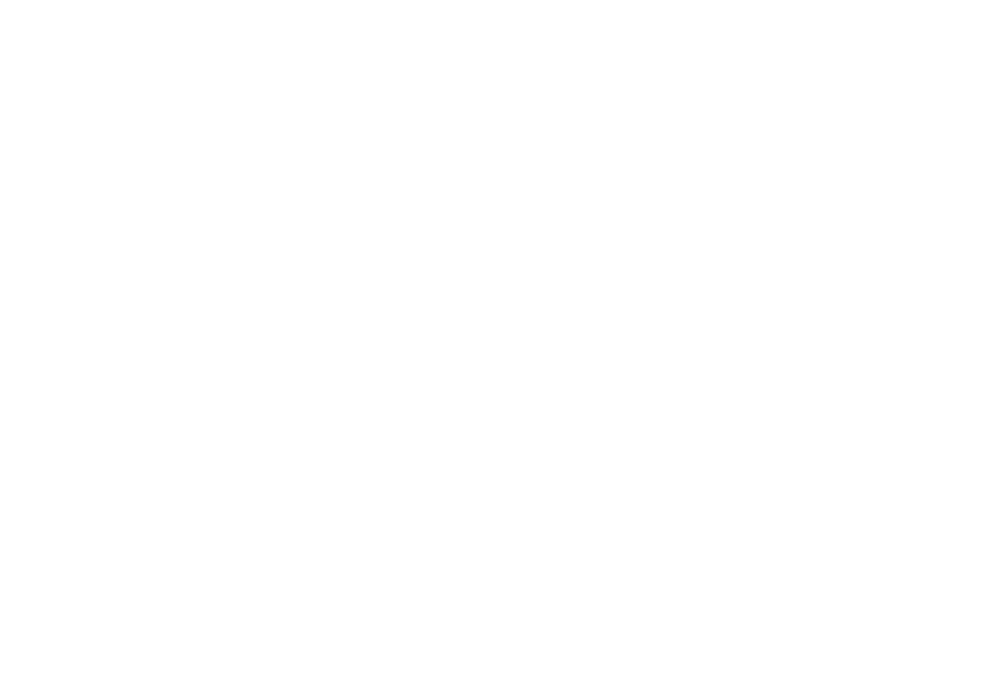

 75%|██████████████████████████████          | 150/200 [00:56<00:18,  2.68it/s]

995.2211055276382


<IPython.core.display.Javascript object>


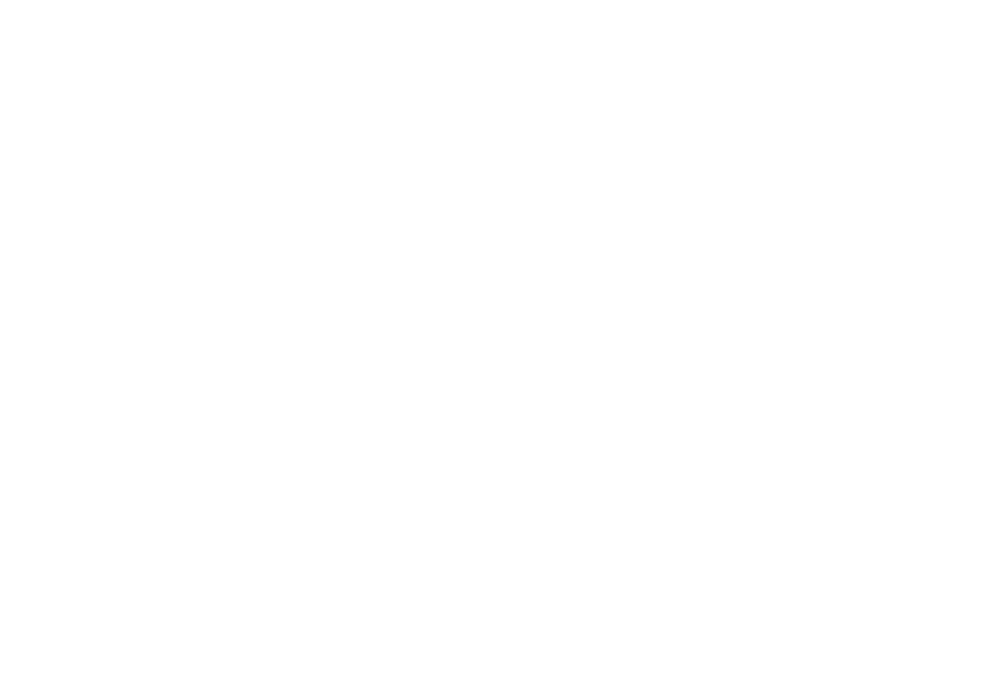

 76%|██████████████████████████████▏         | 151/200 [00:56<00:18,  2.68it/s]

1001.8492462311558


<IPython.core.display.Javascript object>


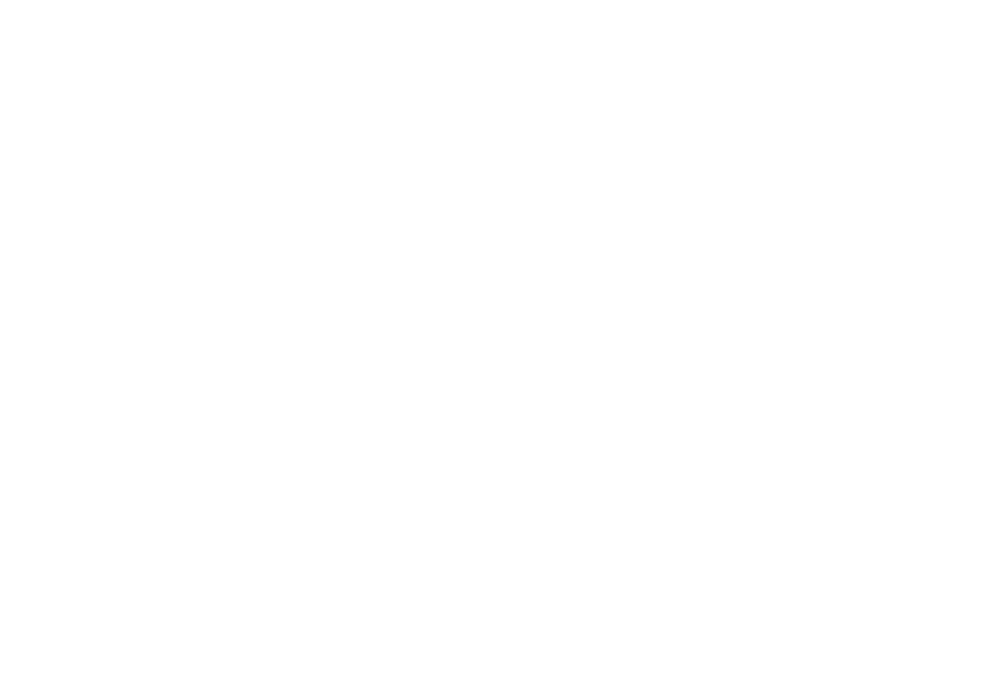

 76%|██████████████████████████████▍         | 152/200 [00:56<00:17,  2.67it/s]

1008.4773869346734


<IPython.core.display.Javascript object>


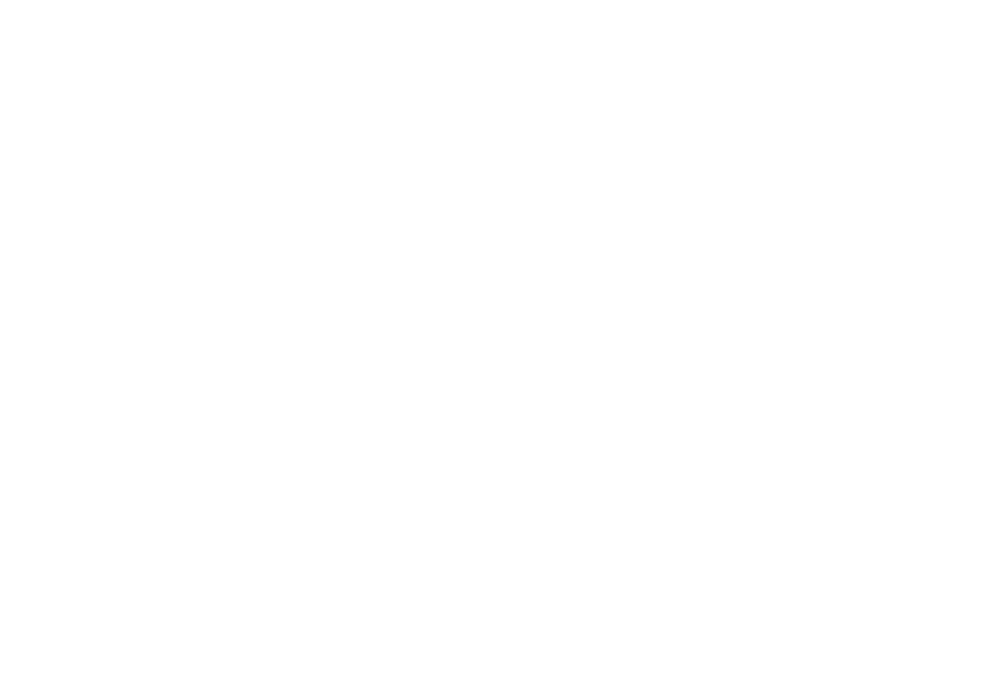

 76%|██████████████████████████████▌         | 153/200 [00:57<00:17,  2.67it/s]

1015.105527638191


<IPython.core.display.Javascript object>


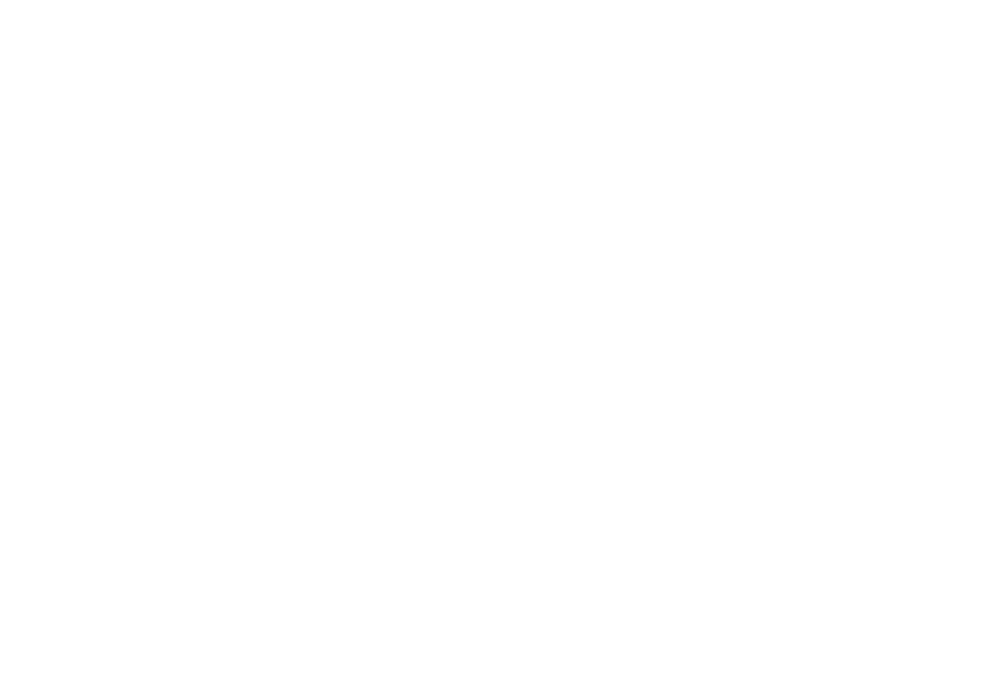

 77%|██████████████████████████████▊         | 154/200 [00:57<00:17,  2.67it/s]

1021.7336683417086


<IPython.core.display.Javascript object>


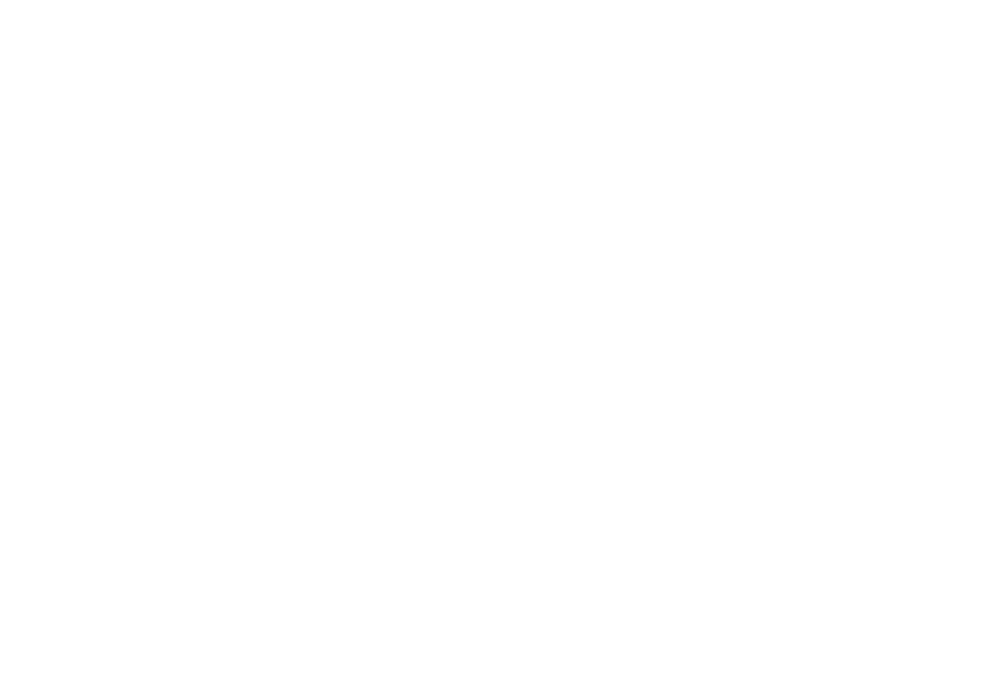

 78%|███████████████████████████████         | 155/200 [00:57<00:16,  2.68it/s]

1028.3618090452262


<IPython.core.display.Javascript object>


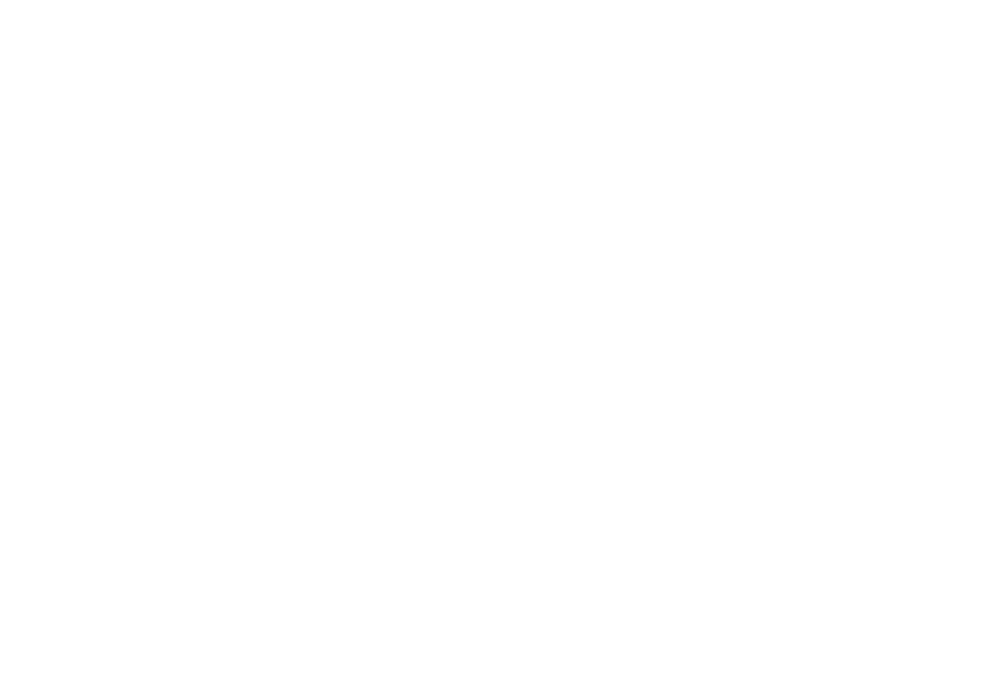

 78%|███████████████████████████████▏        | 156/200 [00:58<00:16,  2.67it/s]

1034.9899497487438


<IPython.core.display.Javascript object>


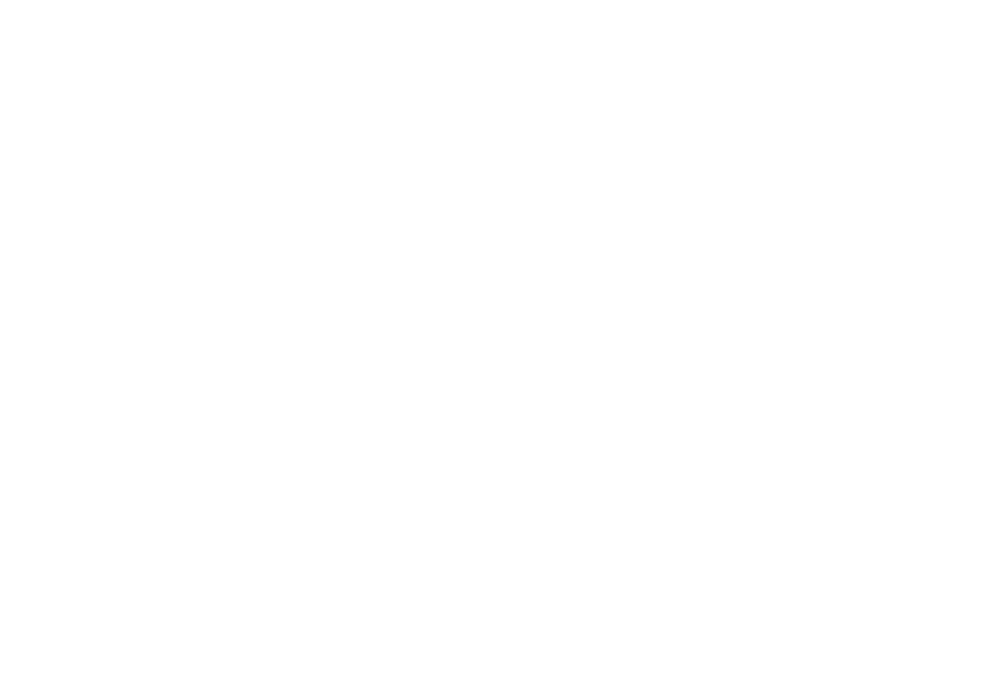

 78%|███████████████████████████████▍        | 157/200 [00:58<00:16,  2.67it/s]

1041.6180904522614


<IPython.core.display.Javascript object>


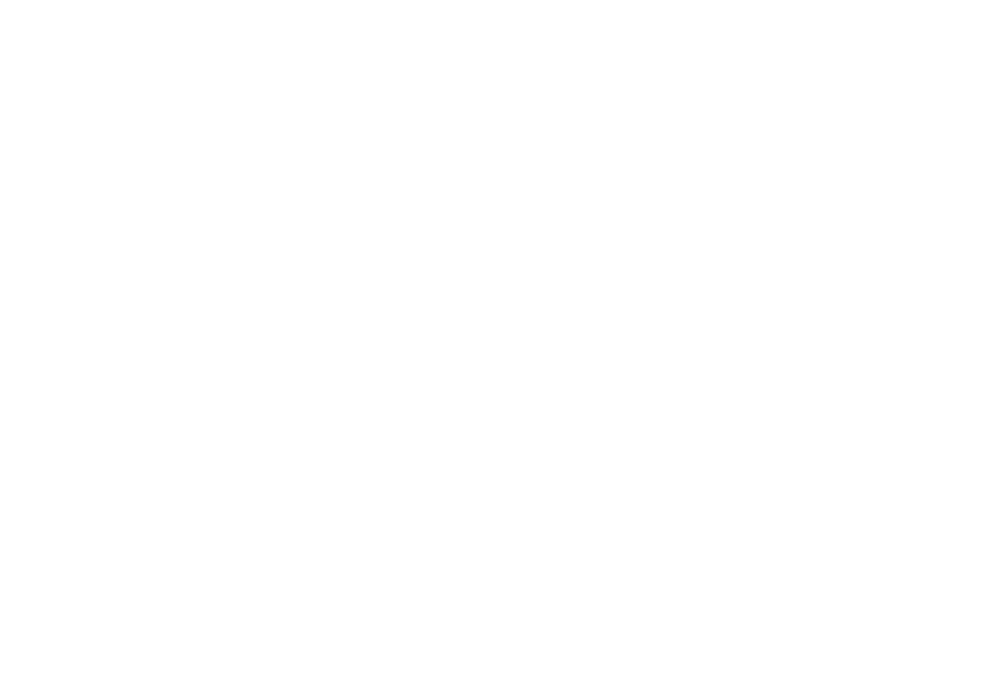

 79%|███████████████████████████████▌        | 158/200 [00:59<00:15,  2.67it/s]

1048.246231155779


<IPython.core.display.Javascript object>


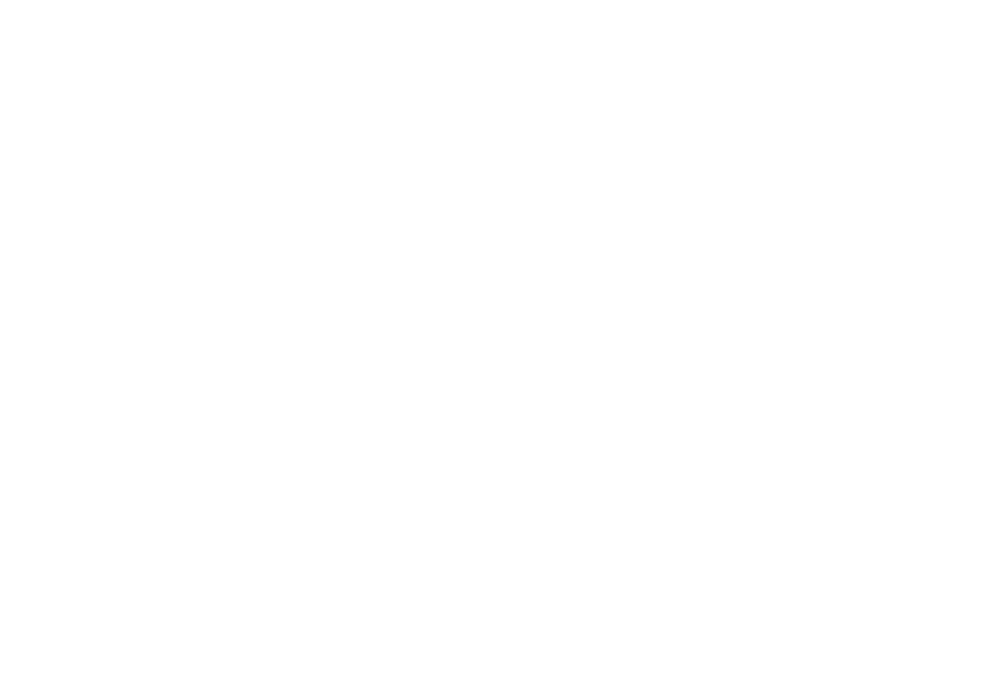

 80%|███████████████████████████████▊        | 159/200 [00:59<00:15,  2.67it/s]

1054.8743718592966


<IPython.core.display.Javascript object>


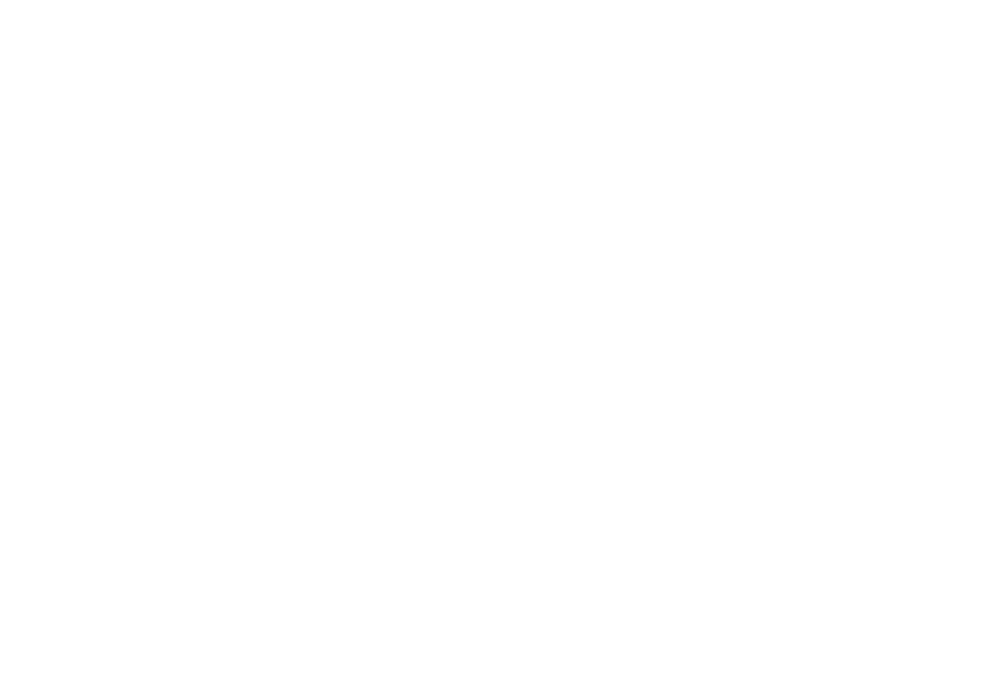

 80%|████████████████████████████████        | 160/200 [00:59<00:14,  2.67it/s]

1061.5025125628142


<IPython.core.display.Javascript object>


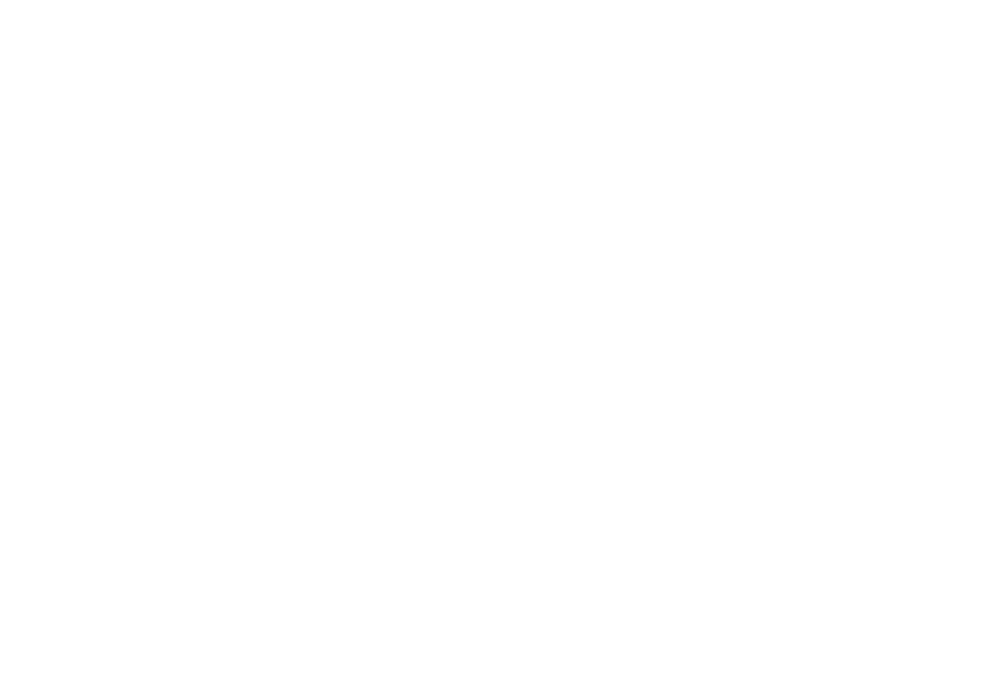

 80%|████████████████████████████████▏       | 161/200 [01:00<00:14,  2.67it/s]

1068.1306532663318


<IPython.core.display.Javascript object>


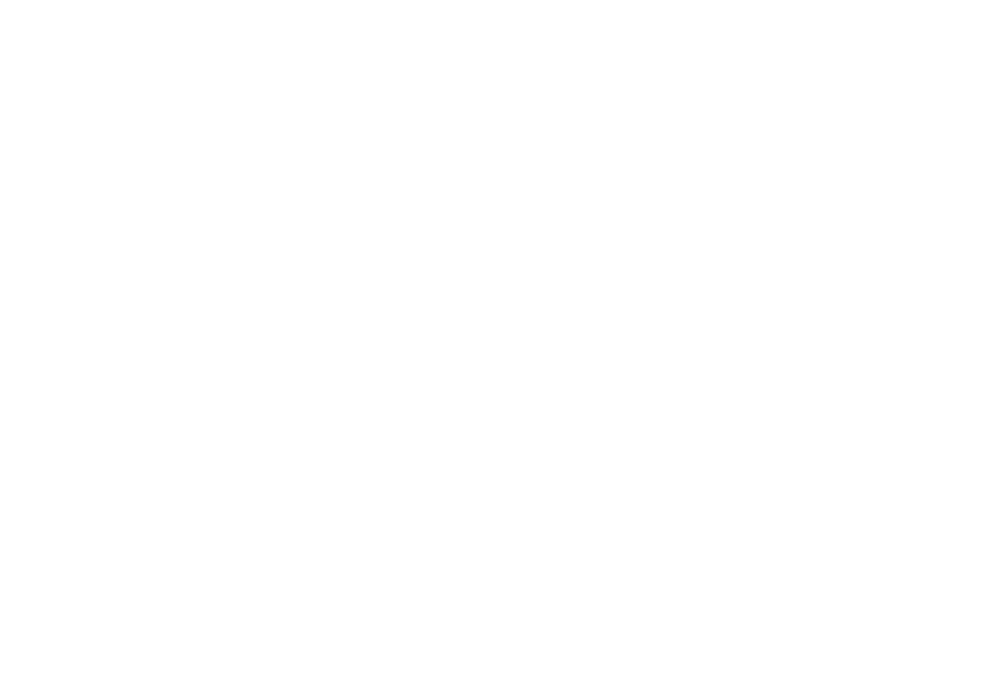

 81%|████████████████████████████████▍       | 162/200 [01:00<00:14,  2.67it/s]

1074.7587939698494


<IPython.core.display.Javascript object>


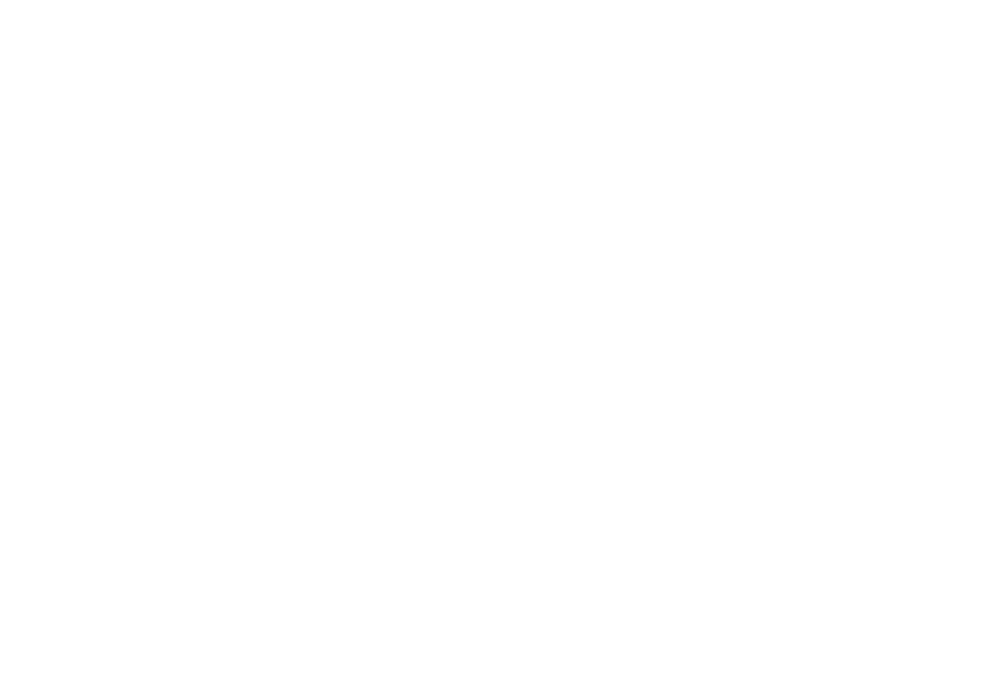

 82%|████████████████████████████████▌       | 163/200 [01:01<00:13,  2.66it/s]

1081.3869346733668


<IPython.core.display.Javascript object>


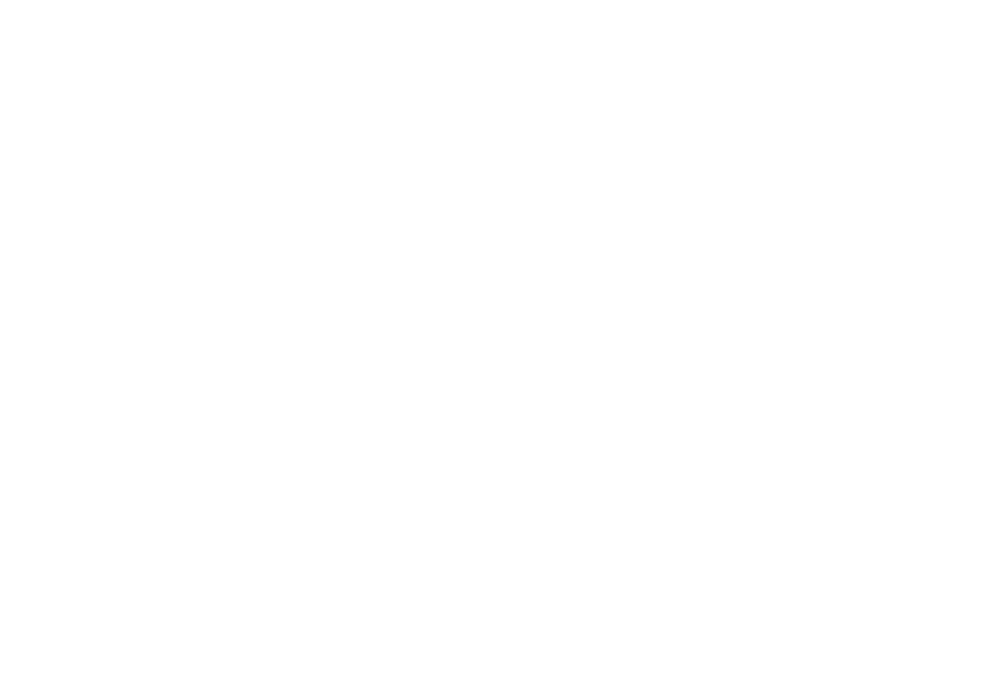

 82%|████████████████████████████████▊       | 164/200 [01:01<00:13,  2.67it/s]

1088.0150753768844


<IPython.core.display.Javascript object>


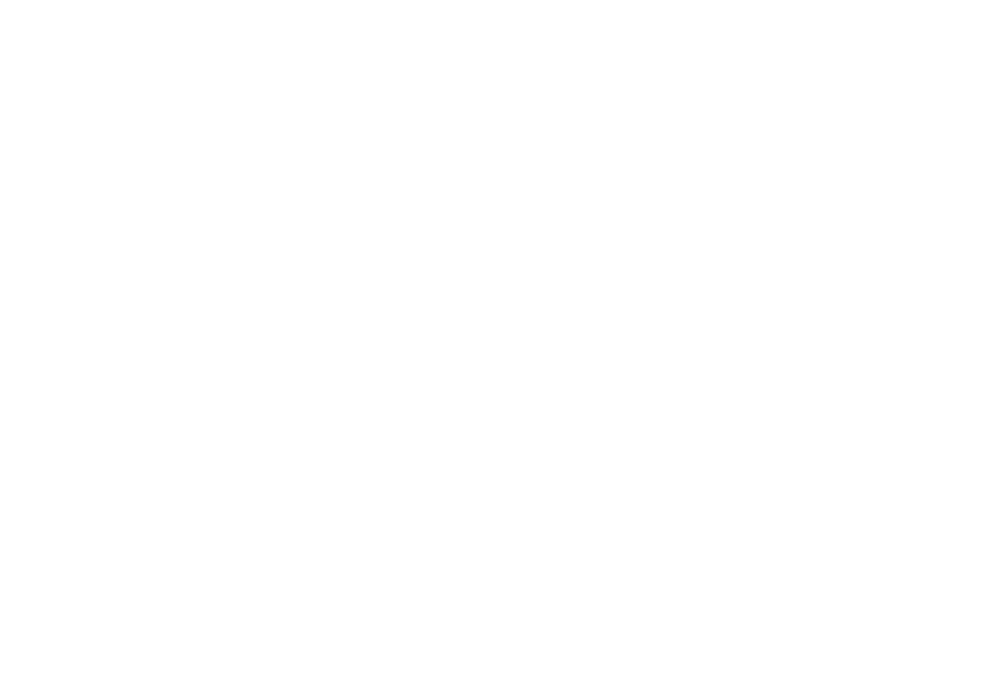

 82%|█████████████████████████████████       | 165/200 [01:01<00:13,  2.66it/s]

1094.643216080402


<IPython.core.display.Javascript object>


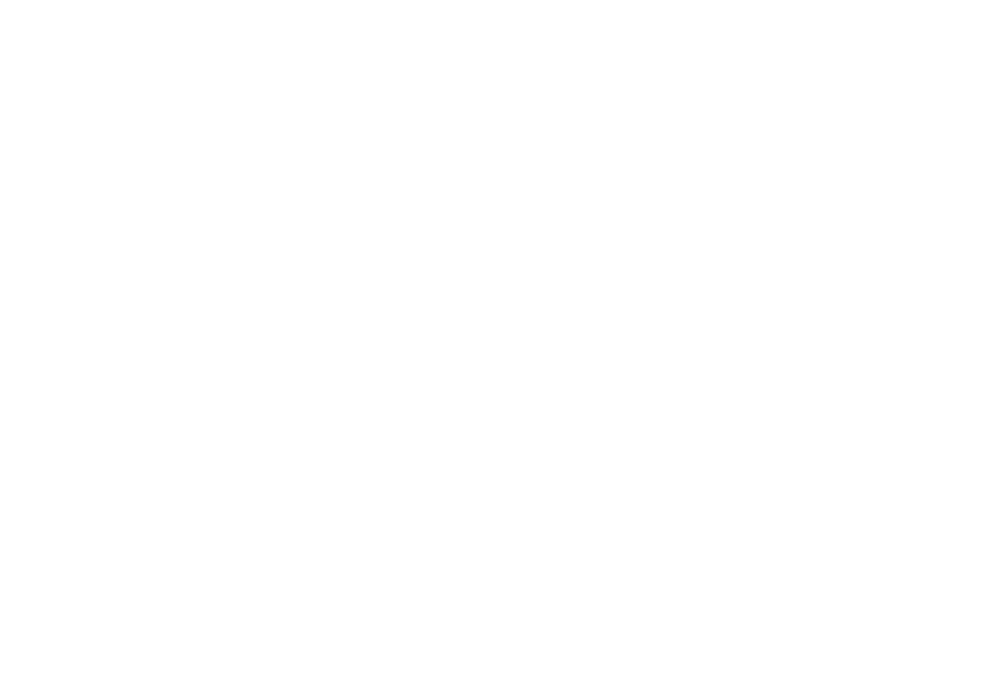

 83%|█████████████████████████████████▏      | 166/200 [01:02<00:12,  2.67it/s]

1101.2713567839196


<IPython.core.display.Javascript object>


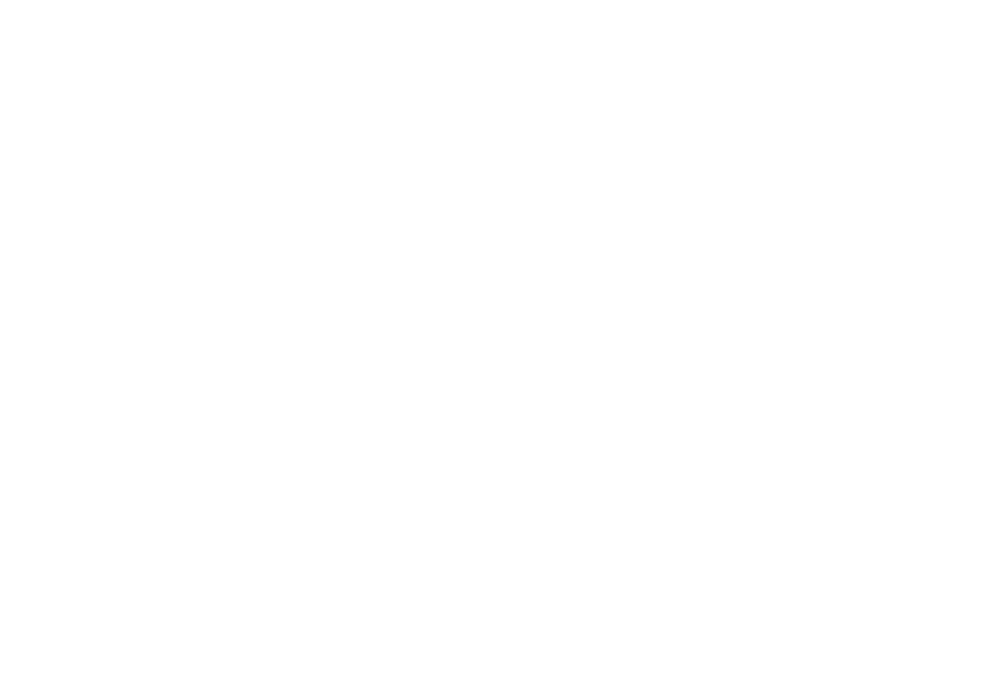

 84%|█████████████████████████████████▍      | 167/200 [01:02<00:12,  2.67it/s]

1107.8994974874372


<IPython.core.display.Javascript object>


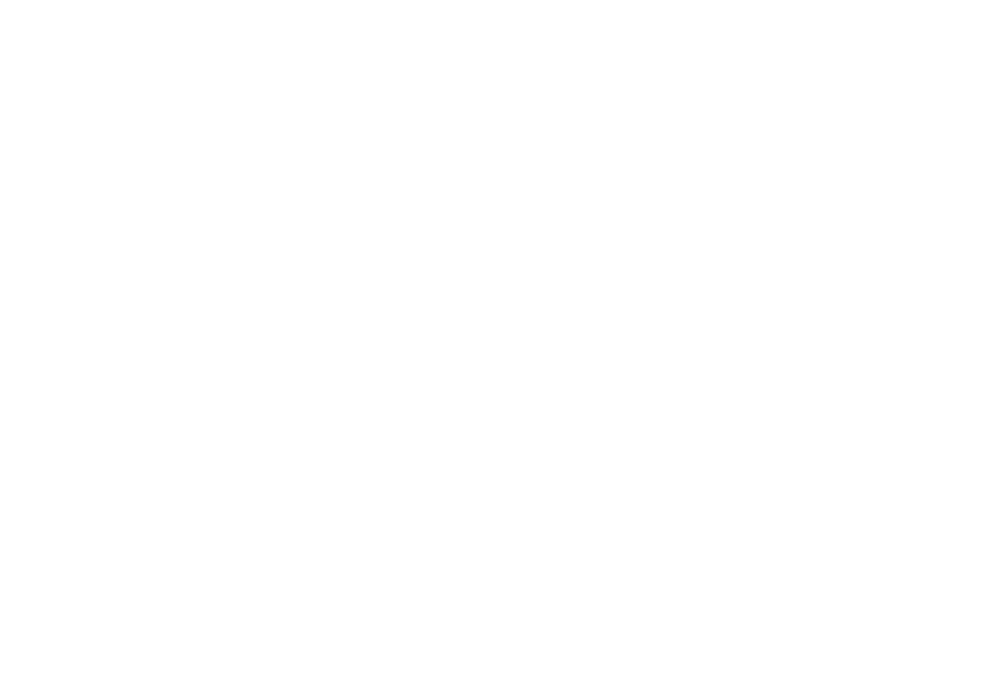

 84%|█████████████████████████████████▌      | 168/200 [01:03<00:12,  2.67it/s]

1114.5276381909548


<IPython.core.display.Javascript object>


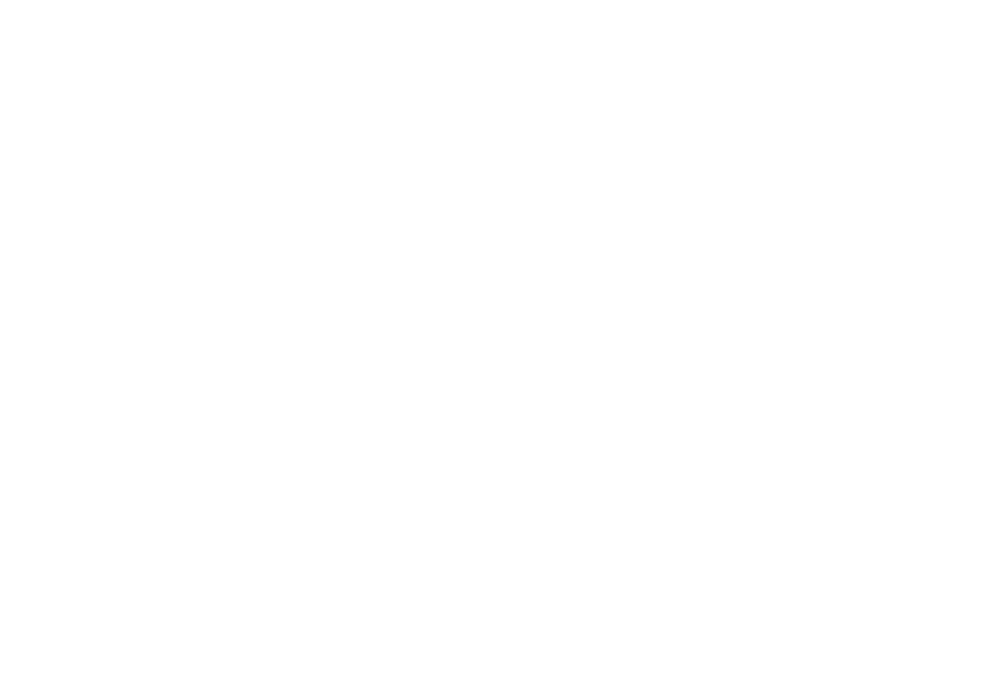

 84%|█████████████████████████████████▊      | 169/200 [01:03<00:11,  2.67it/s]

1121.1557788944724


<IPython.core.display.Javascript object>


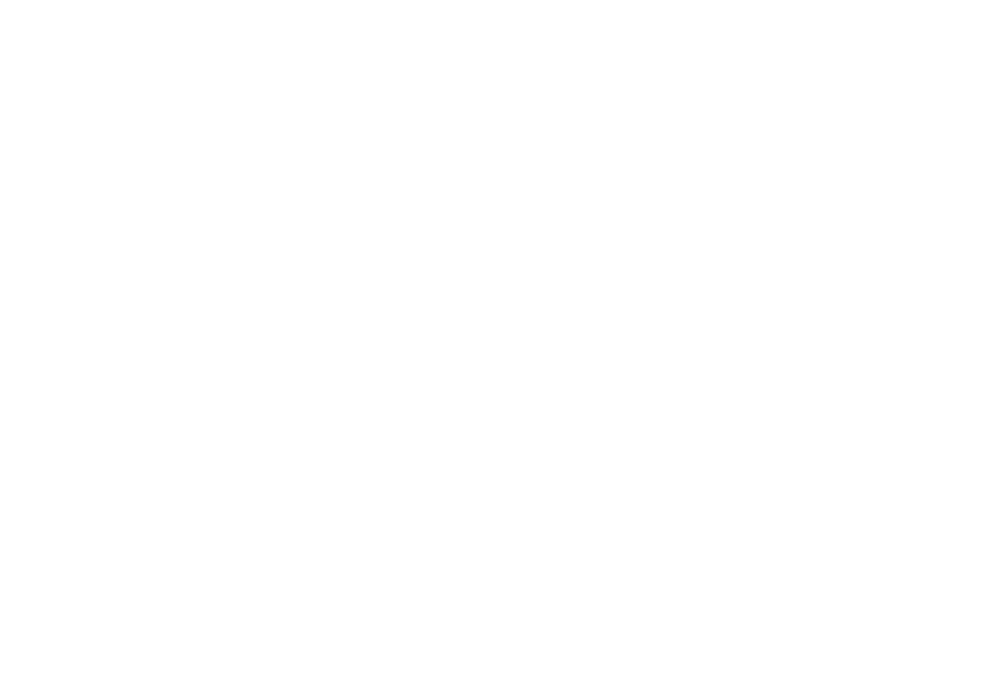

 85%|██████████████████████████████████      | 170/200 [01:03<00:11,  2.67it/s]

1127.78391959799


<IPython.core.display.Javascript object>


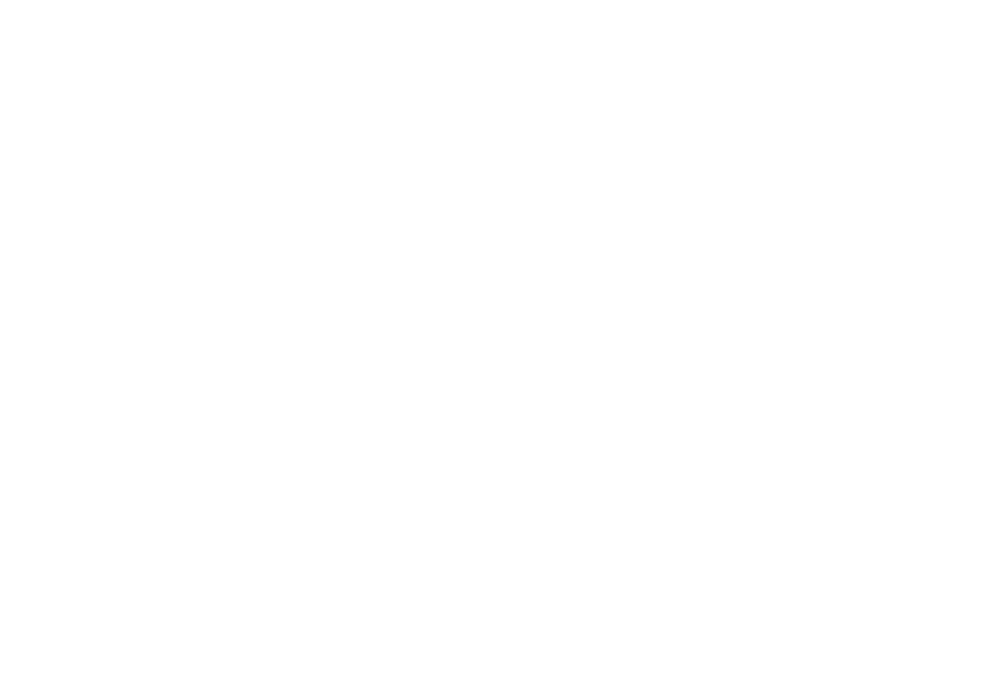

 86%|██████████████████████████████████▏     | 171/200 [01:04<00:10,  2.67it/s]

1134.4120603015076


<IPython.core.display.Javascript object>


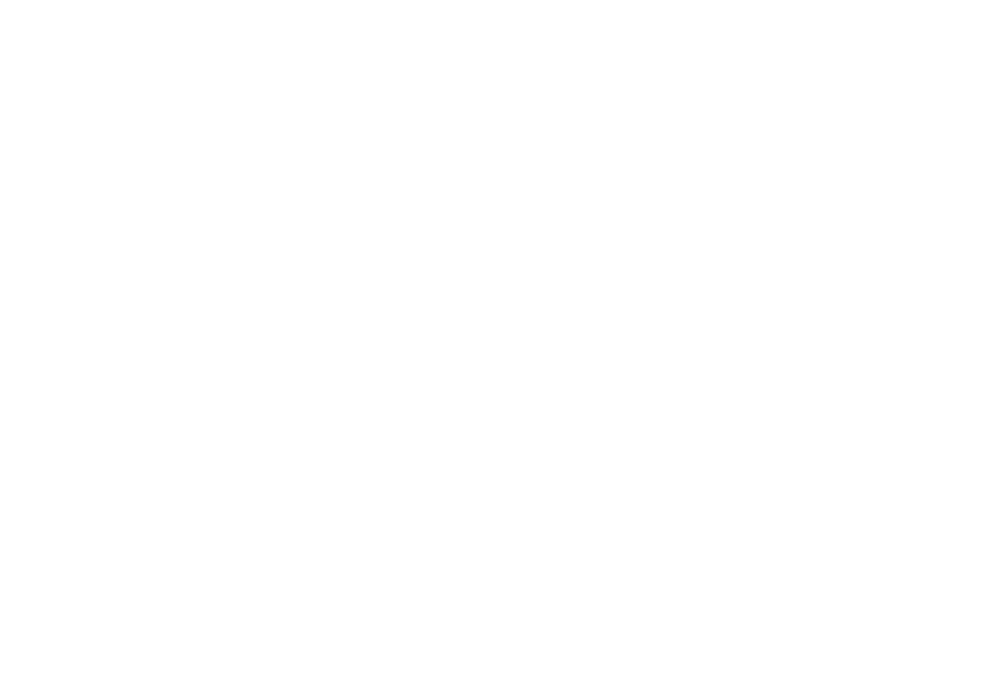

 86%|██████████████████████████████████▍     | 172/200 [01:04<00:10,  2.67it/s]

1141.0402010050252


<IPython.core.display.Javascript object>


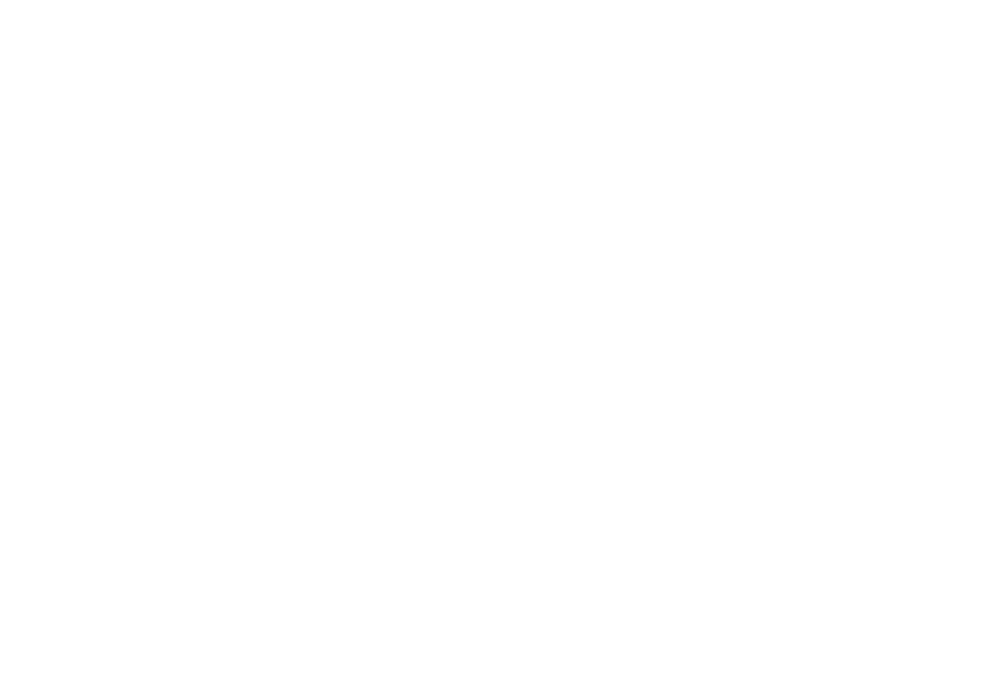

 86%|██████████████████████████████████▌     | 173/200 [01:04<00:10,  2.67it/s]

1147.6683417085428


<IPython.core.display.Javascript object>


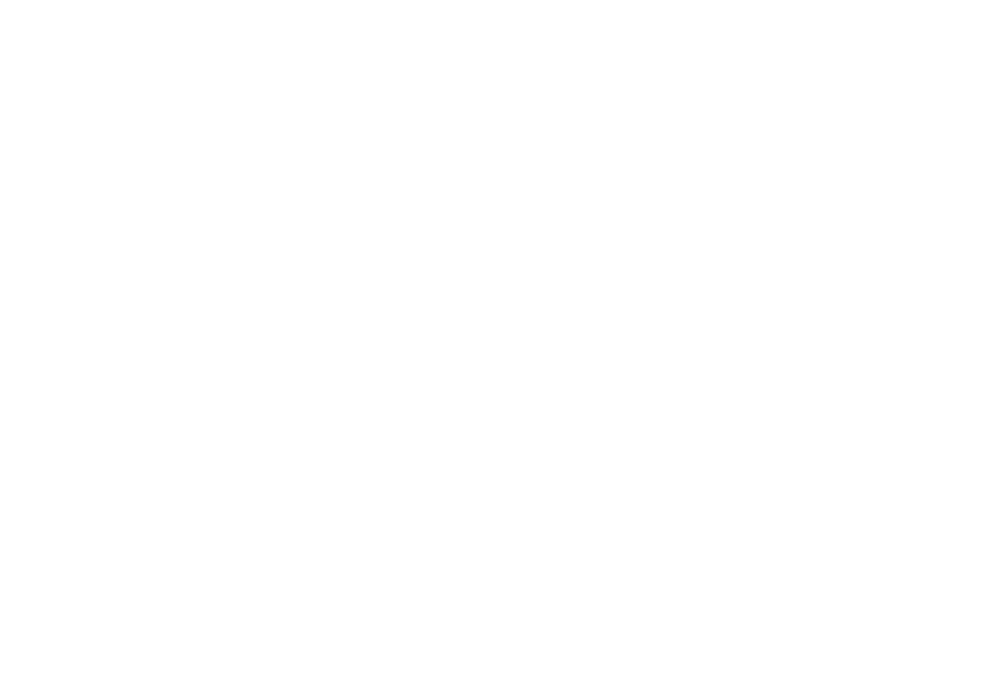

 87%|██████████████████████████████████▊     | 174/200 [01:05<00:09,  2.67it/s]

1154.2964824120604


<IPython.core.display.Javascript object>


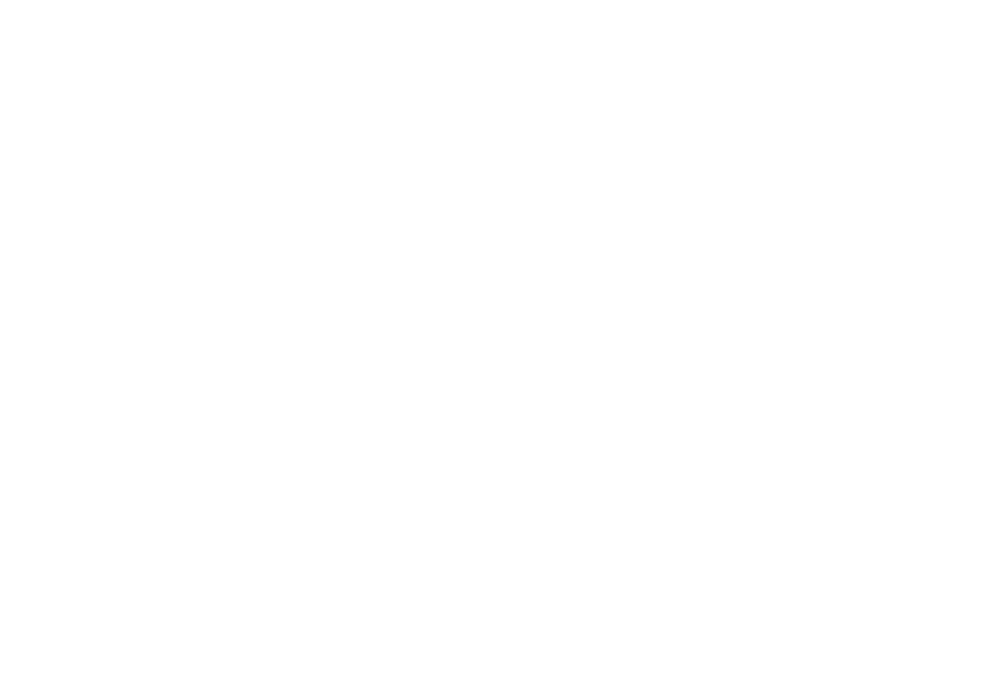

 88%|███████████████████████████████████     | 175/200 [01:05<00:09,  2.67it/s]

1160.924623115578


<IPython.core.display.Javascript object>


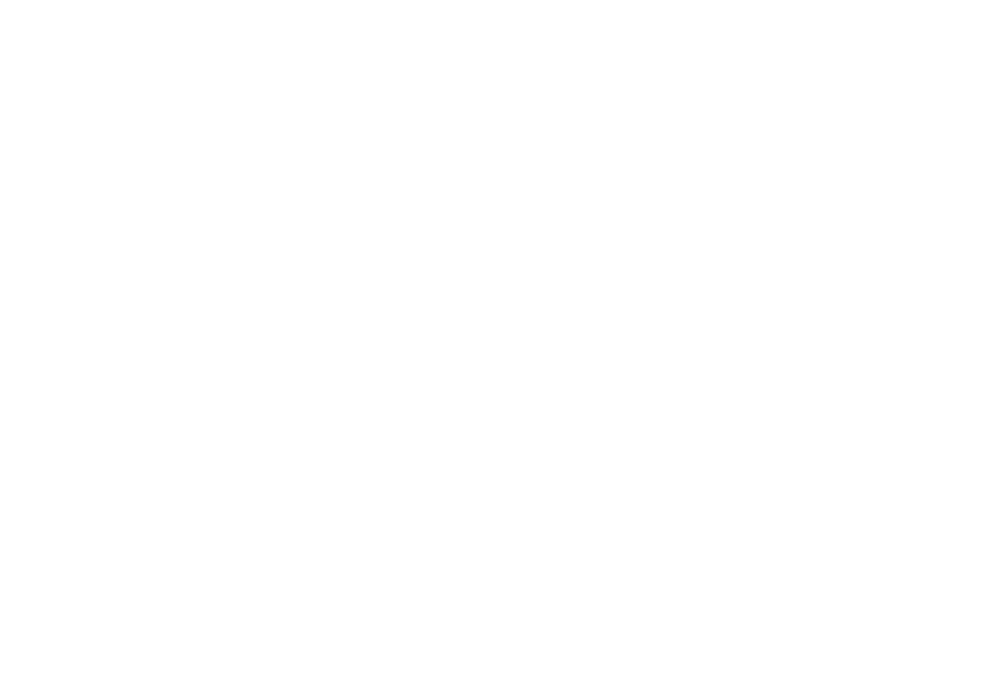

 88%|███████████████████████████████████▏    | 176/200 [01:05<00:08,  2.68it/s]

1167.5527638190956


<IPython.core.display.Javascript object>


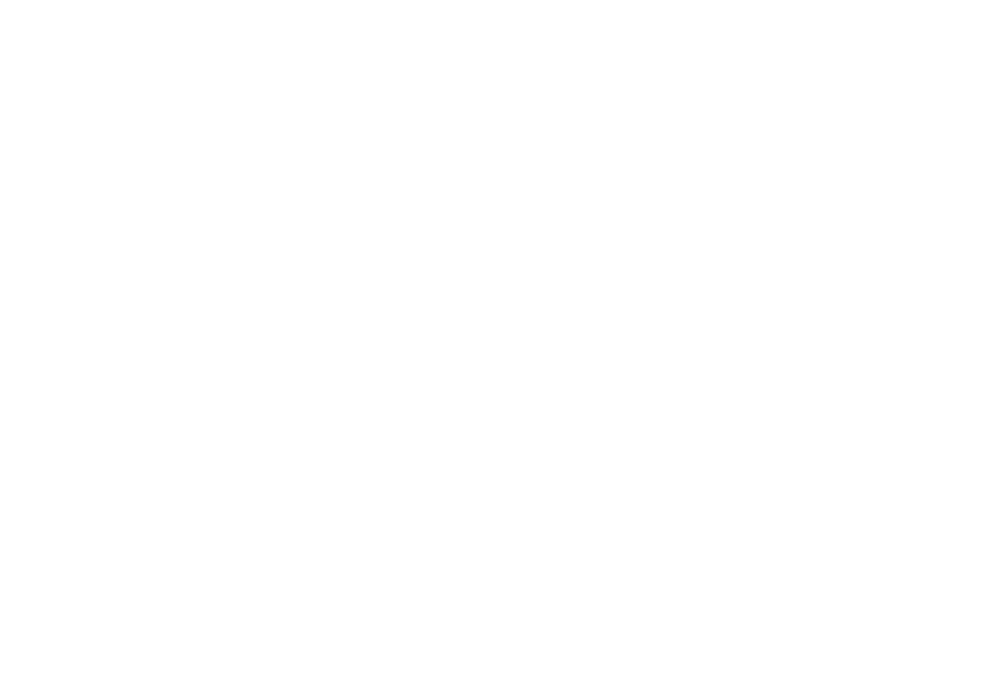

 88%|███████████████████████████████████▍    | 177/200 [01:06<00:08,  2.68it/s]

1174.1809045226132


<IPython.core.display.Javascript object>


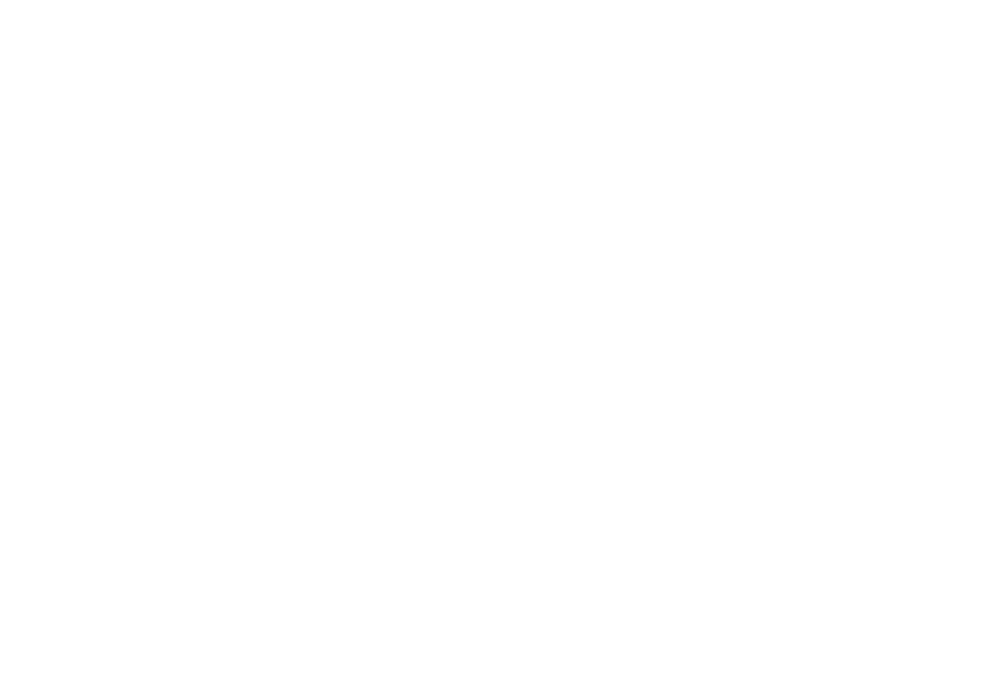

 89%|███████████████████████████████████▌    | 178/200 [01:06<00:08,  2.68it/s]

1180.8090452261308


<IPython.core.display.Javascript object>


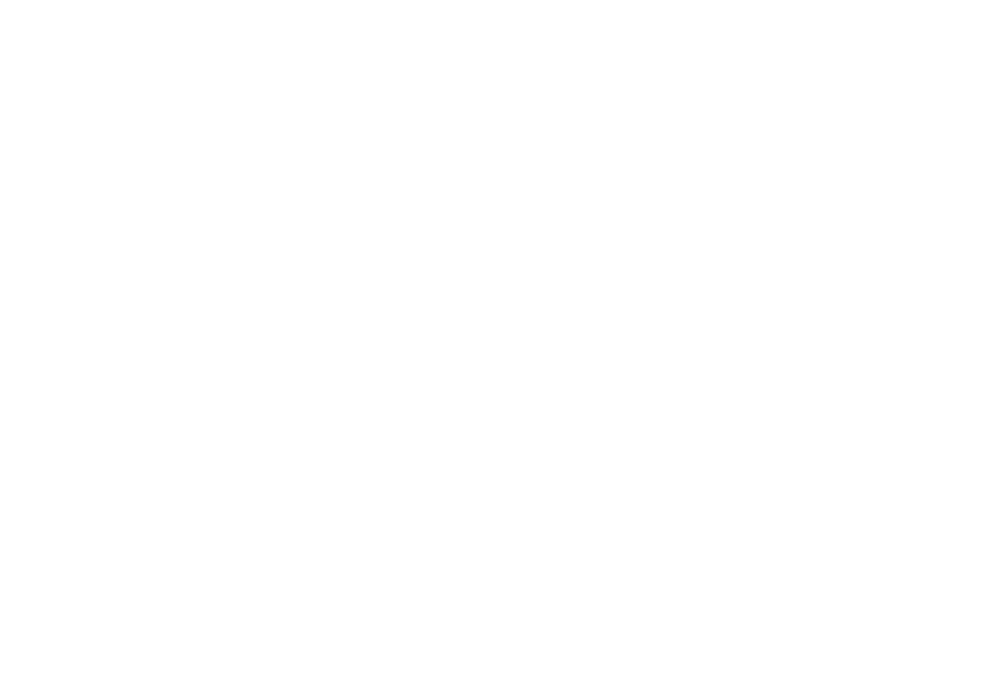

 90%|███████████████████████████████████▊    | 179/200 [01:06<00:07,  2.68it/s]

1187.4371859296484


<IPython.core.display.Javascript object>


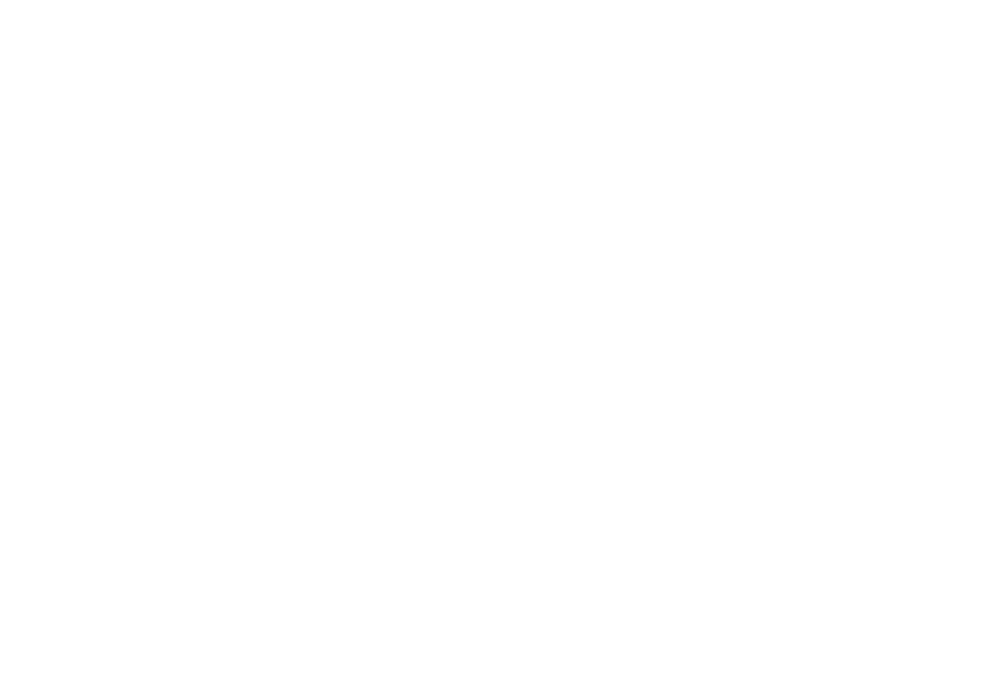

 90%|████████████████████████████████████    | 180/200 [01:07<00:07,  2.68it/s]

1194.0653266331658


<IPython.core.display.Javascript object>


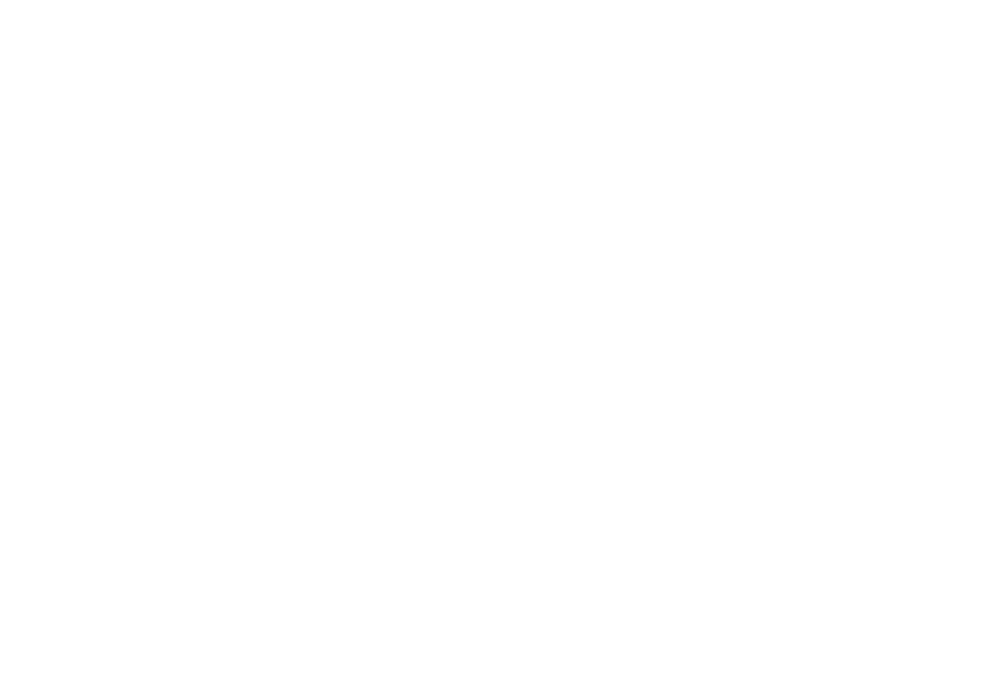

 90%|████████████████████████████████████▏   | 181/200 [01:07<00:07,  2.67it/s]

1200.6934673366834


<IPython.core.display.Javascript object>


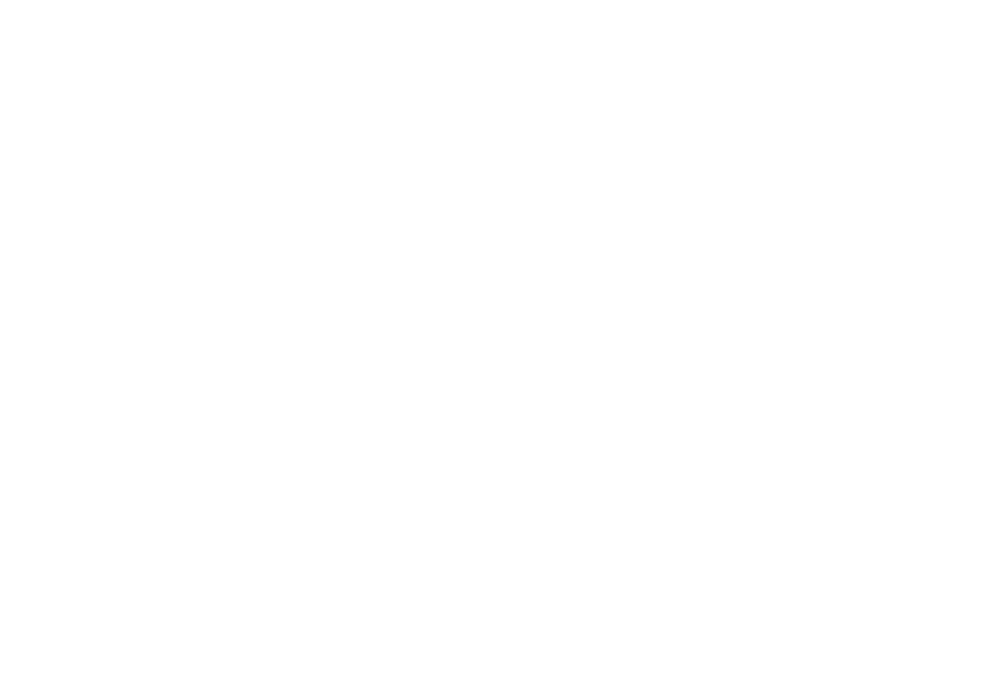

 91%|████████████████████████████████████▍   | 182/200 [01:08<00:06,  2.67it/s]

1207.321608040201


<IPython.core.display.Javascript object>


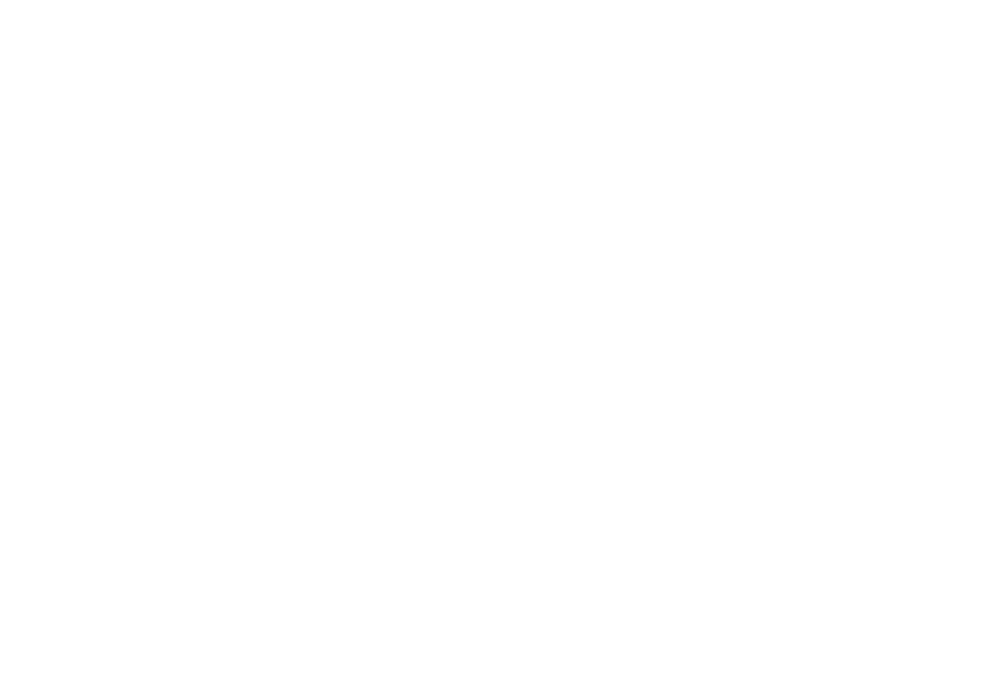

 92%|████████████████████████████████████▌   | 183/200 [01:08<00:06,  2.67it/s]

1213.9497487437186


<IPython.core.display.Javascript object>


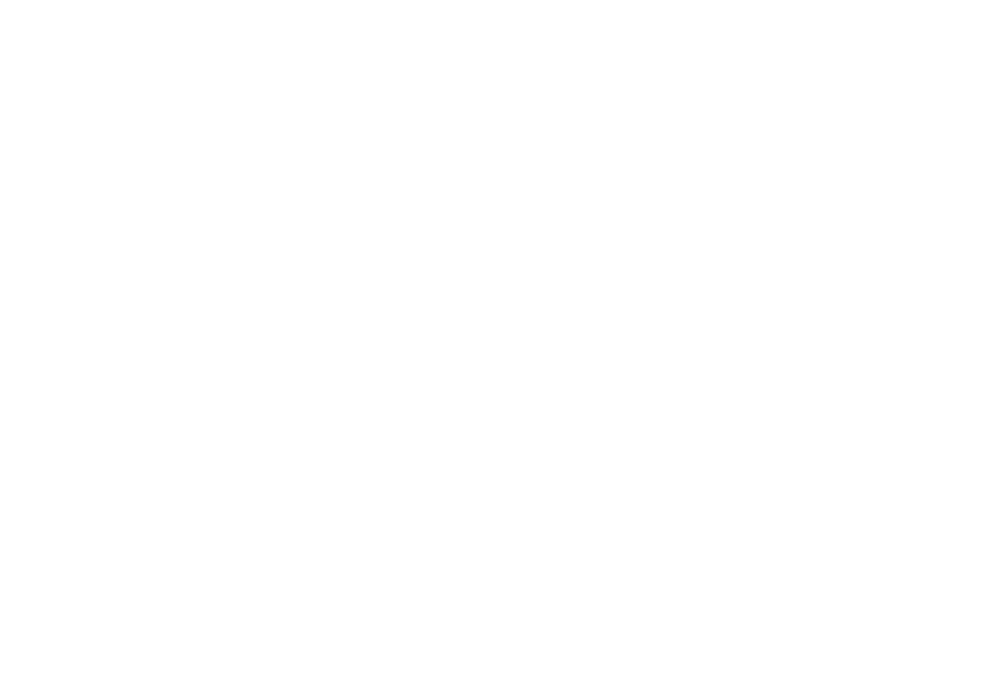

 92%|████████████████████████████████████▊   | 184/200 [01:08<00:05,  2.68it/s]

1220.5778894472362


<IPython.core.display.Javascript object>


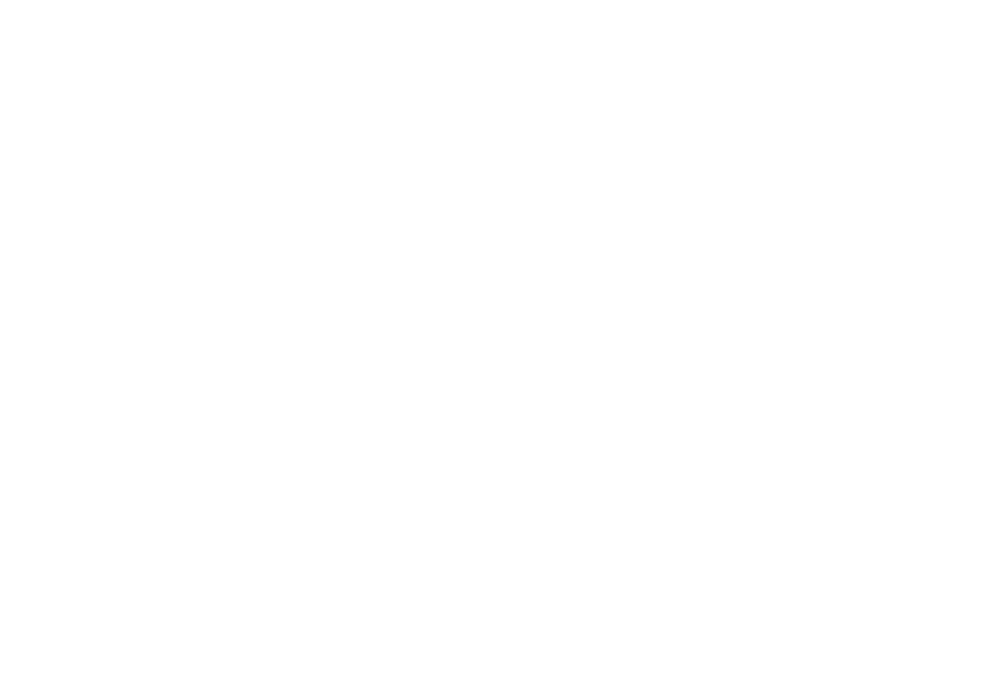

 92%|█████████████████████████████████████   | 185/200 [01:09<00:05,  2.68it/s]

1227.2060301507538


<IPython.core.display.Javascript object>


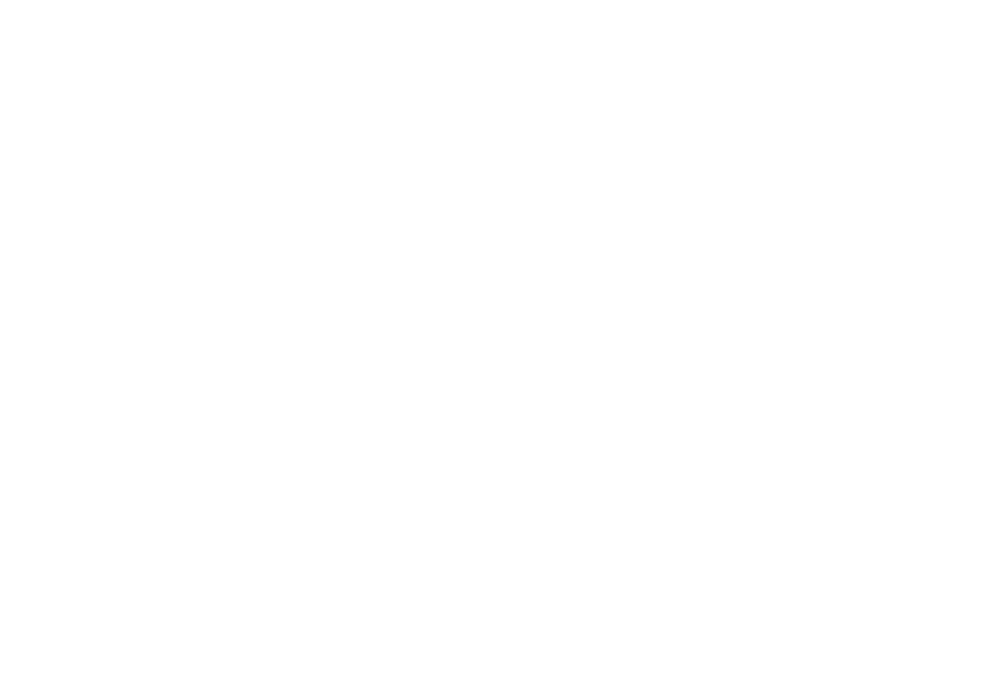

 93%|█████████████████████████████████████▏  | 186/200 [01:09<00:05,  2.68it/s]

1233.8341708542714


<IPython.core.display.Javascript object>


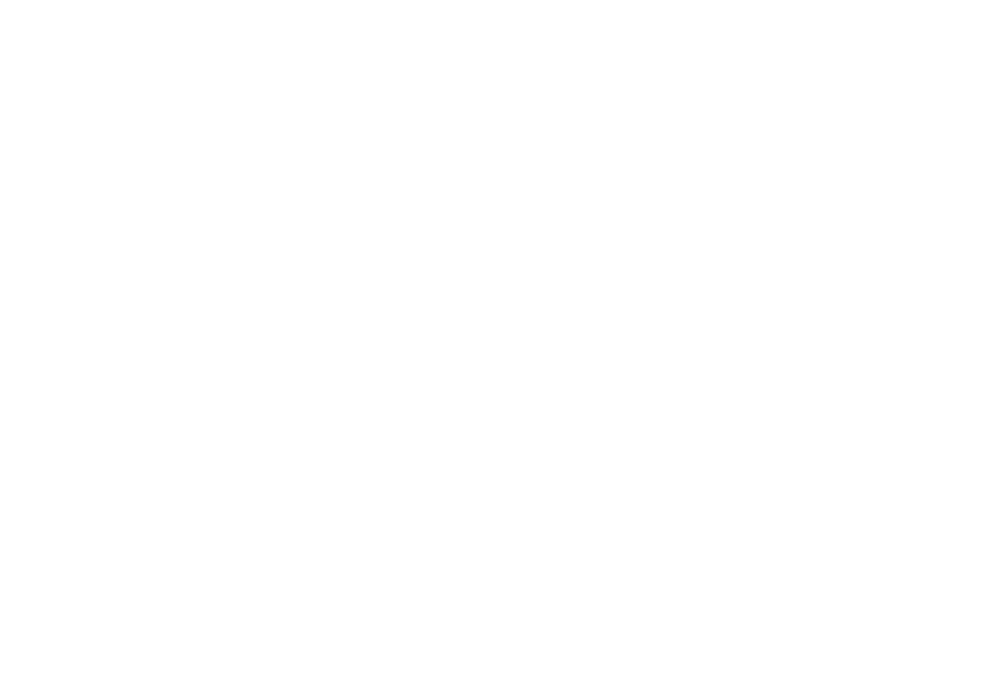

 94%|█████████████████████████████████████▍  | 187/200 [01:09<00:04,  2.68it/s]

1240.462311557789


<IPython.core.display.Javascript object>


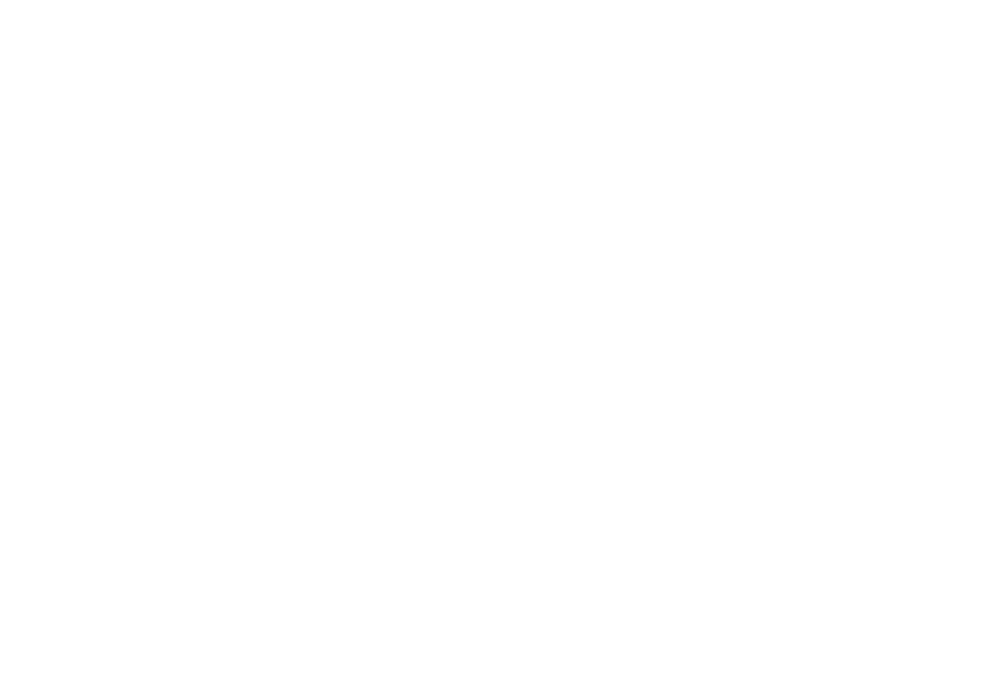

 94%|█████████████████████████████████████▌  | 188/200 [01:10<00:04,  2.68it/s]

1247.0904522613066


<IPython.core.display.Javascript object>


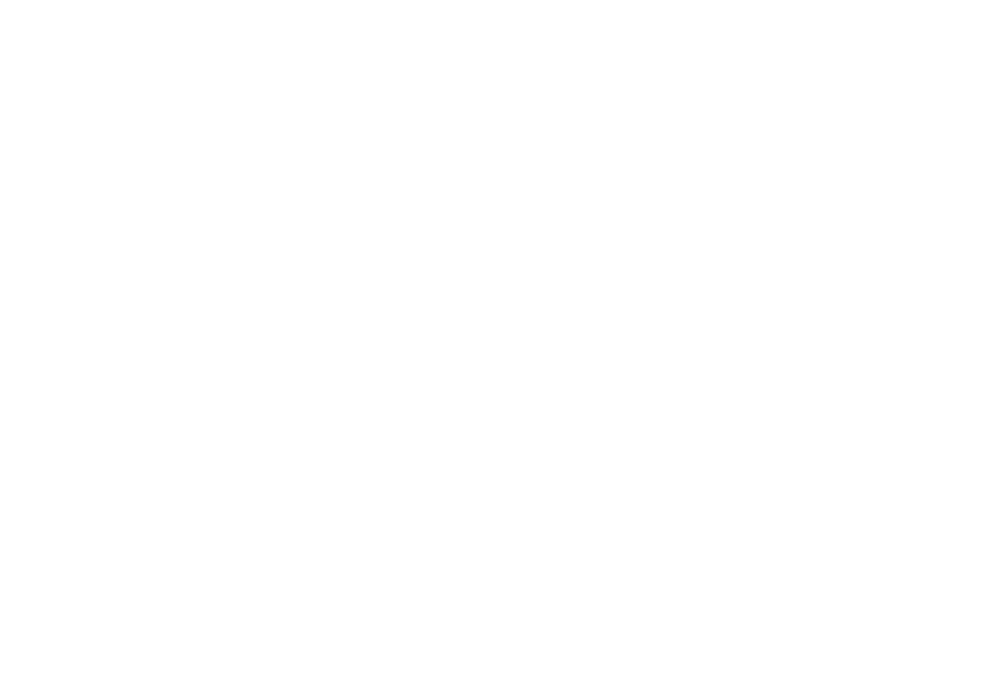

 94%|█████████████████████████████████████▊  | 189/200 [01:10<00:04,  2.68it/s]

1253.7185929648242


<IPython.core.display.Javascript object>


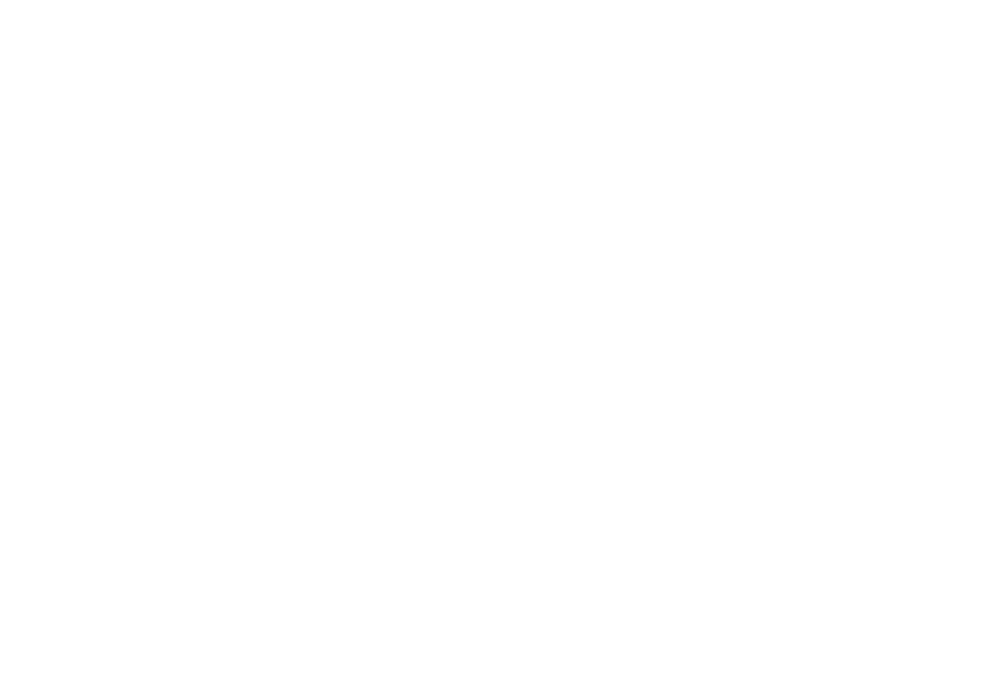

 95%|██████████████████████████████████████  | 190/200 [01:11<00:03,  2.67it/s]

1260.3467336683418


<IPython.core.display.Javascript object>


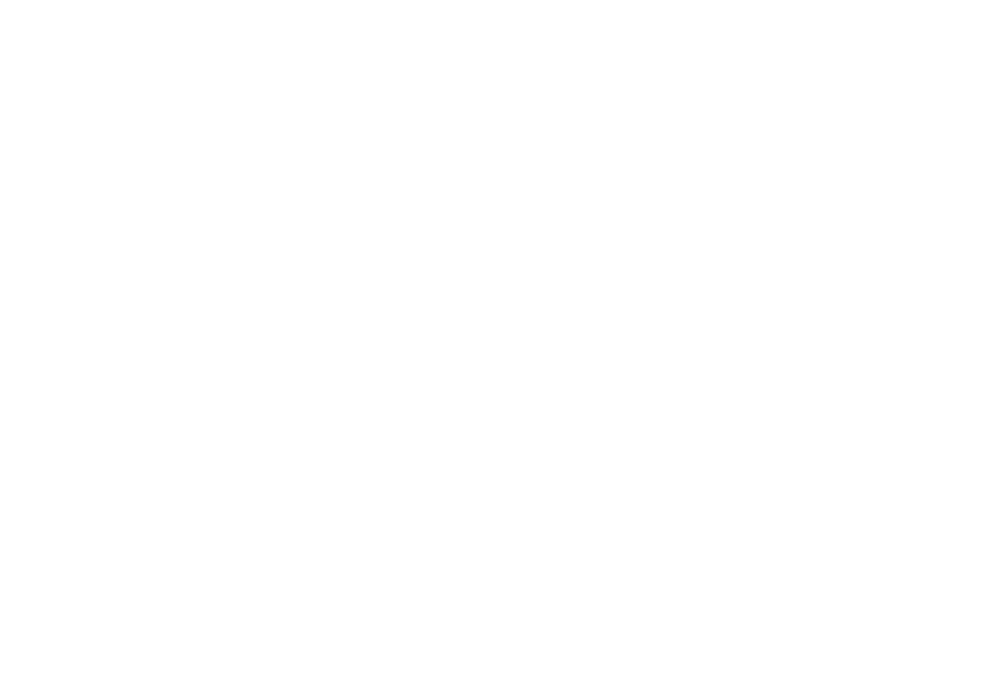

 96%|██████████████████████████████████████▏ | 191/200 [01:11<00:03,  2.67it/s]

1266.9748743718594


<IPython.core.display.Javascript object>


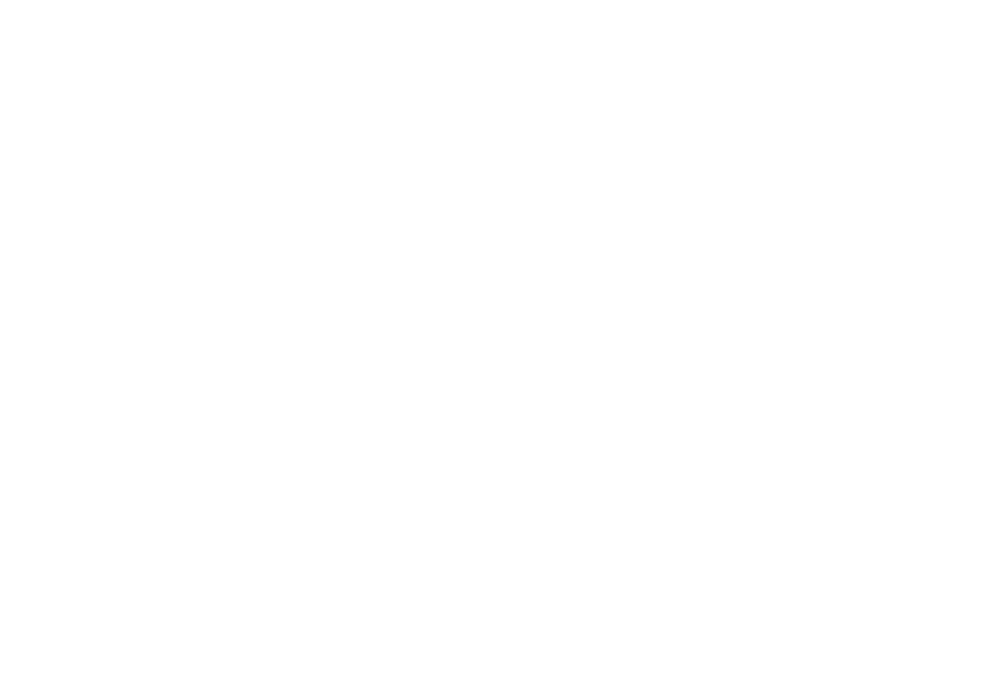

 96%|██████████████████████████████████████▍ | 192/200 [01:11<00:02,  2.67it/s]

1273.603015075377


<IPython.core.display.Javascript object>


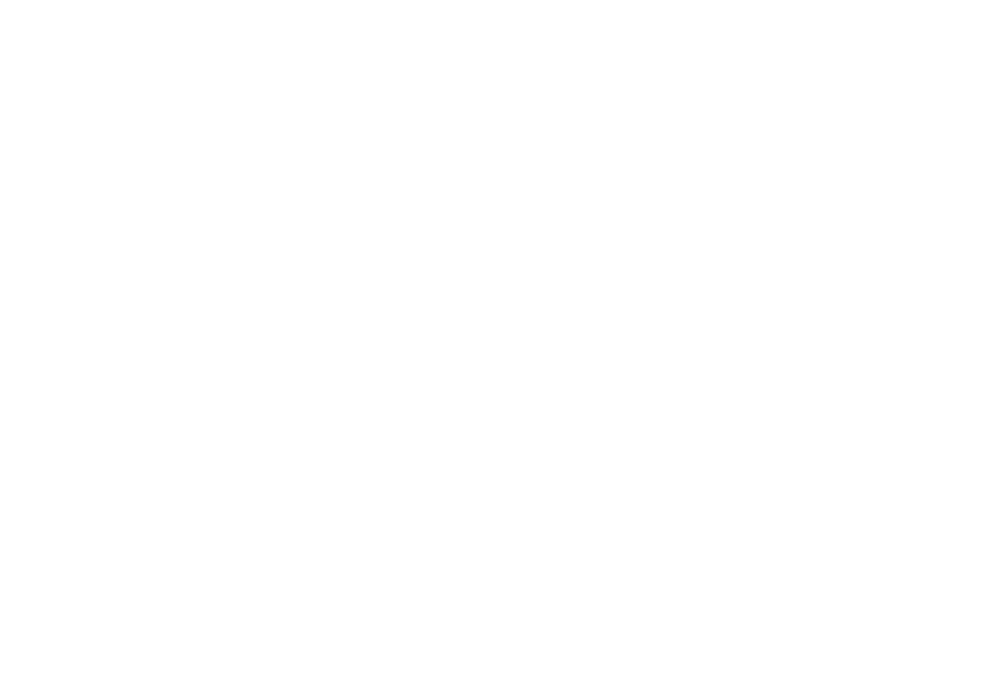

 96%|██████████████████████████████████████▌ | 193/200 [01:12<00:02,  2.66it/s]

1280.2311557788946


<IPython.core.display.Javascript object>


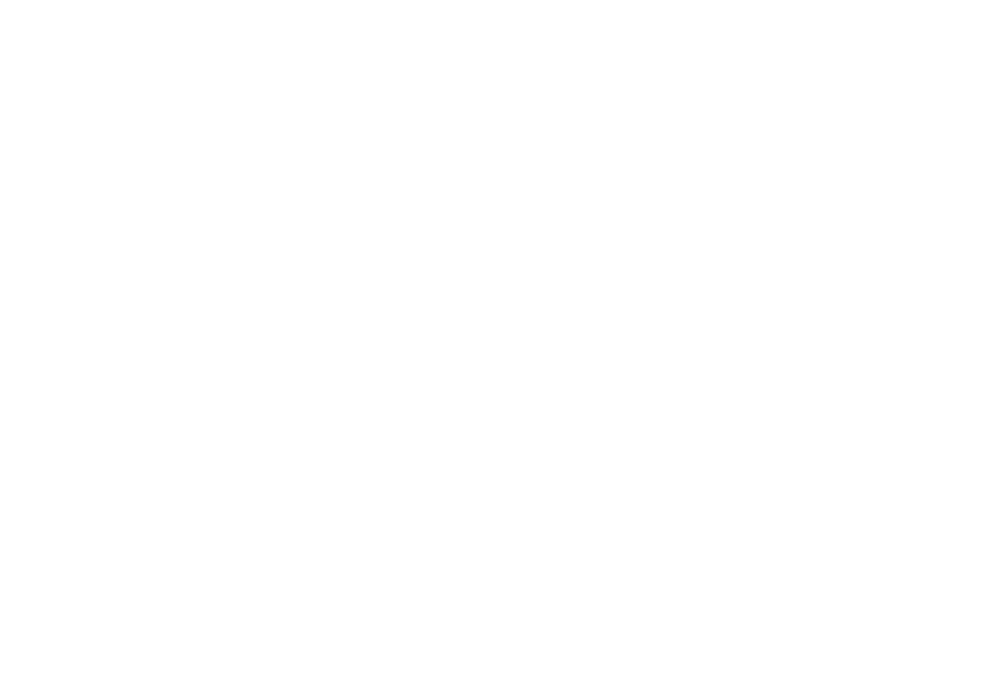

 97%|██████████████████████████████████████▊ | 194/200 [01:12<00:02,  2.67it/s]

1286.8592964824122


<IPython.core.display.Javascript object>


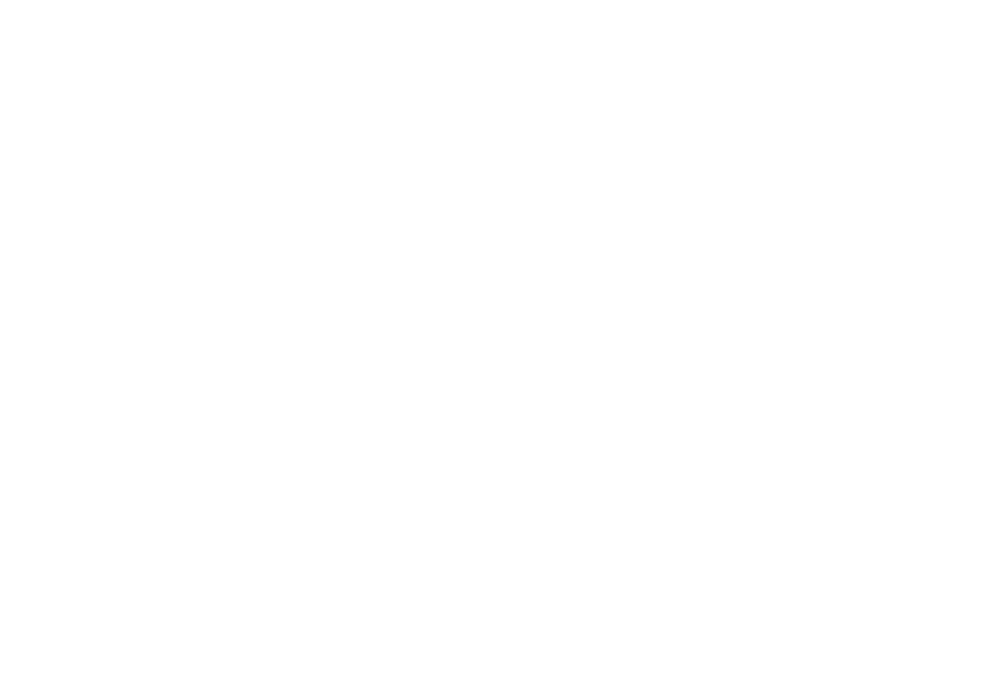

 98%|███████████████████████████████████████ | 195/200 [01:13<00:01,  2.67it/s]

1293.4874371859298


<IPython.core.display.Javascript object>


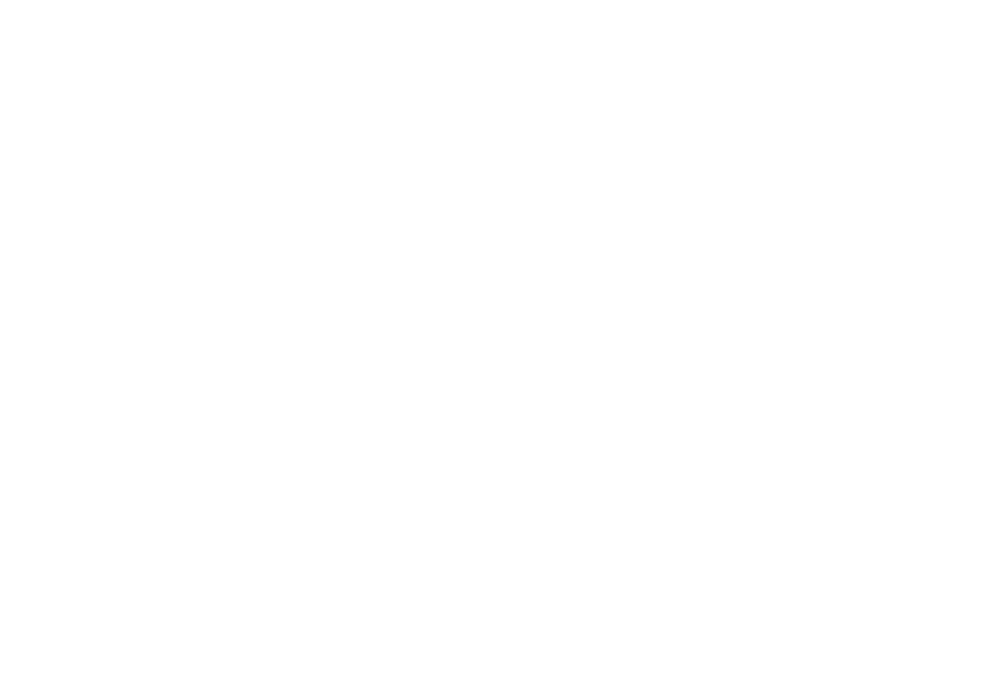

 98%|███████████████████████████████████████▏| 196/200 [01:13<00:01,  2.66it/s]

1300.1155778894474


<IPython.core.display.Javascript object>


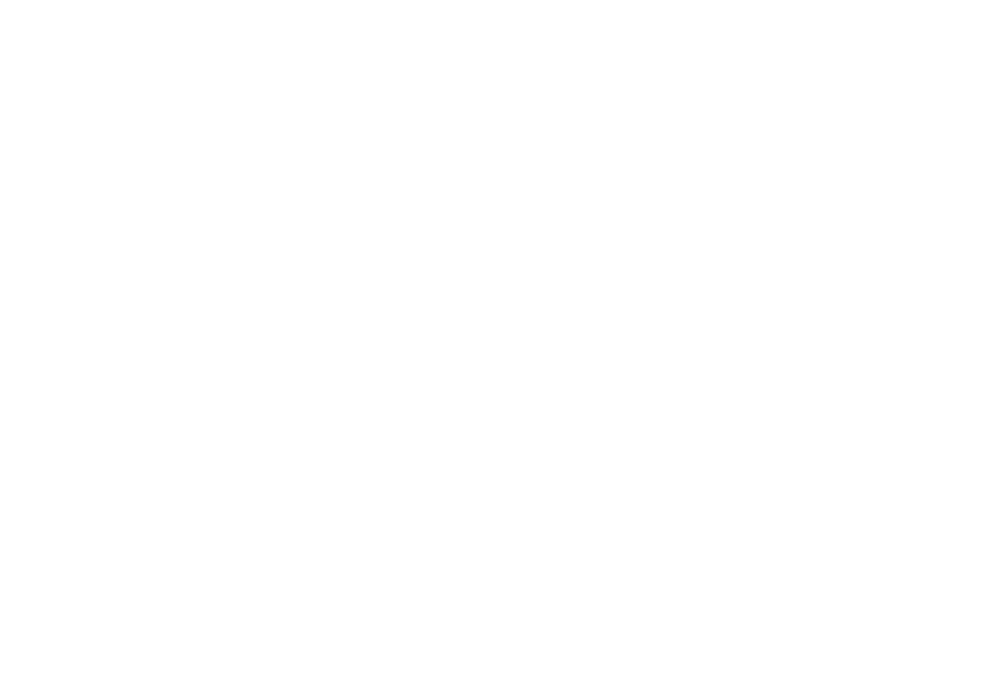

 98%|███████████████████████████████████████▍| 197/200 [01:14<00:01,  2.66it/s]

1306.7437185929648


<IPython.core.display.Javascript object>


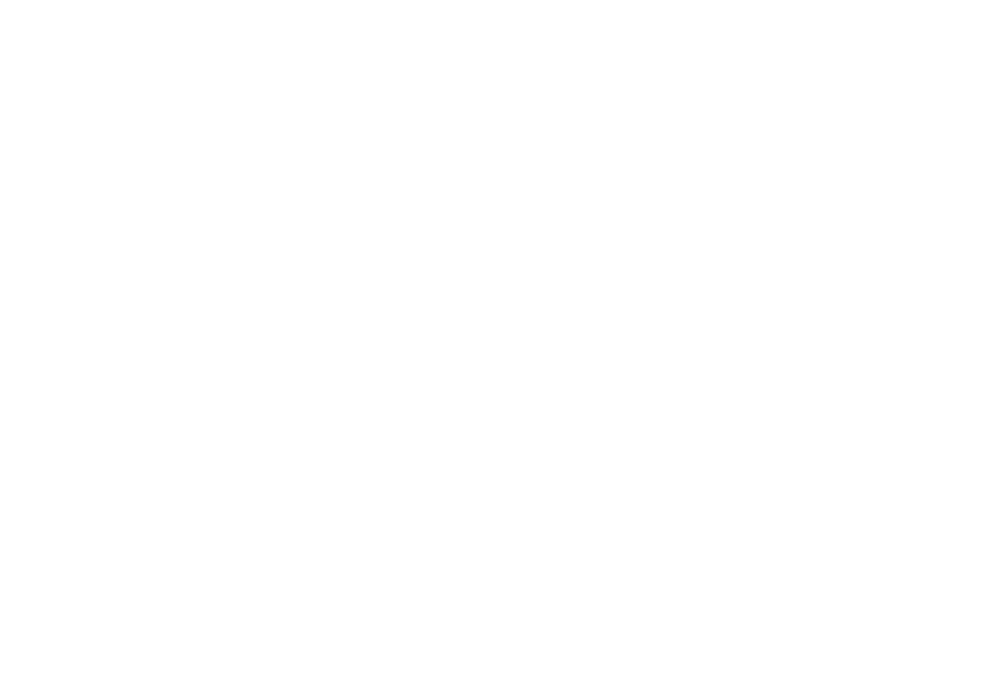

 99%|███████████████████████████████████████▌| 198/200 [01:14<00:00,  2.66it/s]

1313.3718592964824


<IPython.core.display.Javascript object>


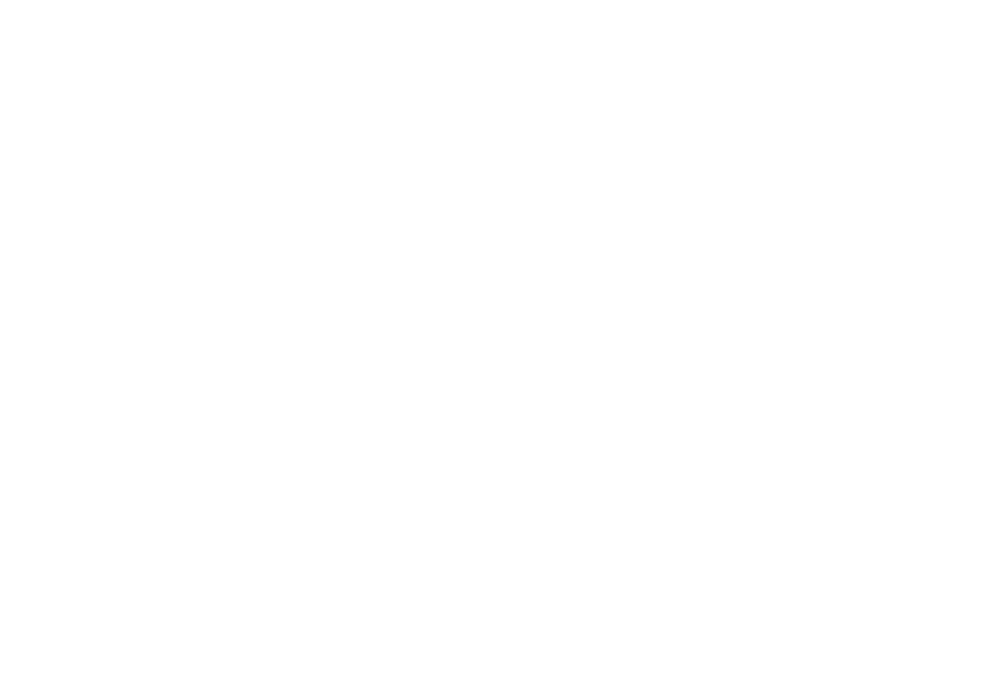

100%|███████████████████████████████████████▊| 199/200 [01:14<00:00,  2.66it/s]

1320.0


<IPython.core.display.Javascript object>


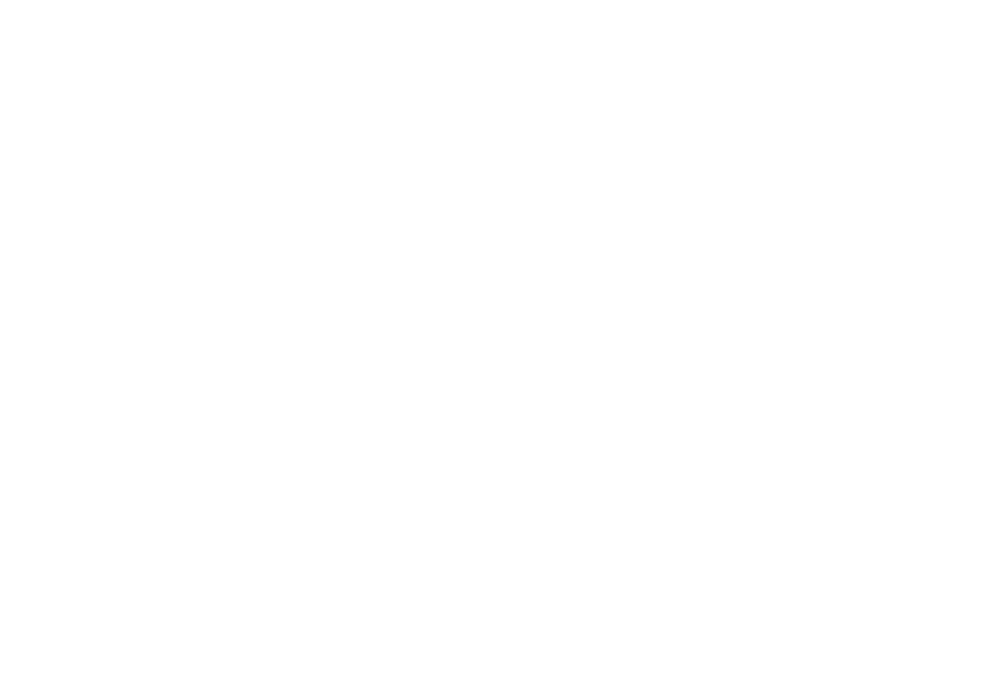

100%|████████████████████████████████████████| 200/200 [01:15<00:00,  2.66it/s]


In [42]:
animate_trajectory()

In [43]:
playVideo("voyager1trajectory.mp4")